# ML - modelling

* The following notebook is a walk-through finding the most optimal ML-model to respond the research task in estimating GHG emissions of government purchases
* Findings, documentation and practices as listed in the MT literature review and sources were used and integrated in this notebook


In [2]:
import pandas as pd
import numpy as np
import textwrap
import matplotlib.pyplot as plt
import seaborn as sns
from numpy import percentile
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error, mean_absolute_percentage_error
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import cross_val_score



In [3]:
# read the data
df = pd.read_csv('/Users/gresasmolica/Desktop/Gresa Smolica/Hertie - MDS/Master_thesis/data_combined_final.csv')

## Data preparation for modelling

In [4]:
# dropping columns with all zeros
df = df.loc[:, (df != 0).any(axis=0)]
df

,region,sector,Emissions nec - waste - undef,Forest area - Forestry,Other land Use: Total,Permanent pastures - Grazing-Cattle,Permanent pastures - Grazing-Meat animals nec,Permanent pastures - Grazing-Raw milk,Energy Inputs from Nature: Total,Emission Relevant Energy Carrier: Total,...,gov_Unused_domestic_extraction,gov_Ni_non_combustion_total,gov_PAH_non_combustion_total,gov_PCB_non_combustion_total,gov_PCDD_F_non_combustion_total,gov_Pb_non_combustion_total,gov_SOx_non_combustion_total,gov_Se_non_combustion_total,gov_Zn_non_combustion_total,gov_Cropland_total
0,AT,Products of meat cattle,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,1301.511591,625.790670,...,0.000000,0.001294,0.019686,0.000024,1.744811e-09,0.017448,4.564188e+02,0.000196,0.009685,0.000000
1,AT,Products of meat pigs,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,583.506961,712.836065,...,0.000000,0.001115,0.017132,0.000021,1.518530e-09,0.015145,1.707502e+03,0.000153,0.008418,0.000000
2,AT,Products of meat poultry,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,1911.527778,400.565617,...,0.000000,0.004060,0.013869,0.000005,3.821251e-10,0.018620,7.248042e+02,0.001009,0.002581,0.000000
3,AT,products of Vegetable oils and fats,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,1611.435384,683.459988,...,0.000000,0.005416,0.043136,0.000043,3.135299e-09,0.043416,5.477374e+02,0.001164,0.017713,0.000000
4,AT,Dairy products,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,1406.077143,2579.791920,...,0.000000,0.003736,0.057611,0.000069,5.098134e-09,0.050831,2.925512e+03,0.000448,0.028221,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22738,DE,Inert/metal/hazardous waste for treatment: lan...,5.736823e+05,33.552011,5.426560,15.683034,1.456417,5.747904,3963.370852,8898.428569,...,2282.839073,190.771604,2694.811591,3.195751,2.992294e-04,2988.208705,1.527602e+05,4.098169,1858.539081,21.098424
22739,DE,Textiles waste for treatment: landfill,1.934712e+05,0.492591,0.076109,0.550473,0.023662,0.277438,66.103425,259.190659,...,41.372228,2.039523,28.253793,0.035320,2.945433e-06,32.842058,2.265262e+03,0.040647,22.240172,0.439445
22740,DE,Wood waste for treatment: landfill,6.227750e+05,2.022605,0.315500,1.142901,0.090175,0.480138,313.535640,909.880707,...,204.840393,14.609339,207.535367,0.249528,2.375937e-05,232.584255,1.103093e+04,0.329367,143.544989,1.311875
22741,DE,Membership organisation services n.e.c. (91),1.209906e+06,1021.090304,200.864546,473.822345,40.340072,244.762342,56586.045070,98644.280024,...,22774.918284,2406.897334,34874.990805,38.019778,3.612032e-03,34142.616543,2.289570e+06,44.906626,22062.213382,929.329357


In [5]:
# dropping region and sector columns as they are not needed for the analysis
df = df.drop(columns=['region', 'sector'])

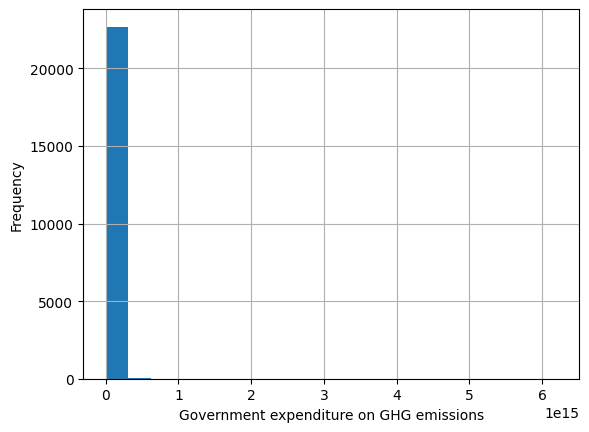

In [6]:
# plot histogram of the data gov_exp_ghg to see the distribution of the target variable

plt.hist(df['gov_exp_ghg'], bins=20)
plt.xlabel('Government expenditure on GHG emissions')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

# the figure shows the data is highly skewed to the right, so we will apply a log transformation to the target variable

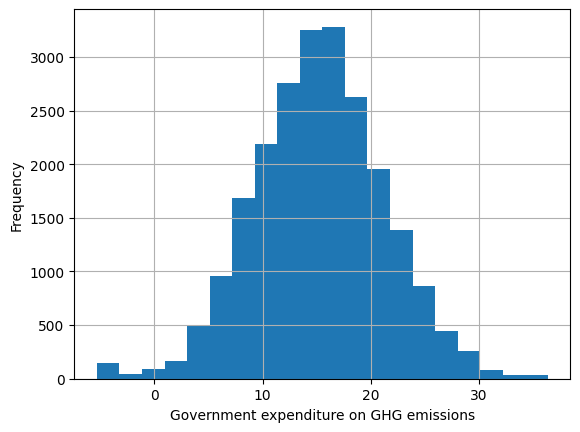

In [7]:
# the next step is to perform a log transformation on the target variable to ensure a more normal distribution of the data. A small positive constant is added to the data to avoid taking the log of zero.

constant = 0.005
df['gov_exp_ghg_log'] = np.log(df['gov_exp_ghg'] + constant)

# plot histogram of the transformed data
plt.hist(df['gov_exp_ghg_log'], bins=20)
plt.xlabel('Government expenditure on GHG emissions')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

In [8]:
# considering the nature of the data, the next step is to check and remove outliers from the data. We will use the interquartile range (IQR) method to identify and remove outliers from the data.

## first we define the IQR; the IQR is the difference between the 75th percentile (Q3) and the 25th percentile (Q1) of the data.
q25, q75 = percentile(df['gov_exp_ghg_log'], 25), percentile(df['gov_exp_ghg_log'], 75)
iqr = q75 - q25

## next we define the cut-off value for the data. The cut-off value is calculated as 1.5 times the IQR.
cut_off = iqr * 1.5
lower, upper = q25 - cut_off, q75 + cut_off

# identify outliers
outliers = [x for x in df['gov_exp_ghg_log'] if x < lower or x > upper]
len(outliers)

# remove outliers
df = df[(df['gov_exp_ghg_log'] > lower) & (df['gov_exp_ghg_log'] < upper)]
df

,Emissions nec - waste - undef,Forest area - Forestry,Other land Use: Total,Permanent pastures - Grazing-Cattle,Permanent pastures - Grazing-Meat animals nec,Permanent pastures - Grazing-Raw milk,Energy Inputs from Nature: Total,Emission Relevant Energy Carrier: Total,Energy Carrier Supply: Total,Energy Carrier Use: Total,...,gov_Ni_non_combustion_total,gov_PAH_non_combustion_total,gov_PCB_non_combustion_total,gov_PCDD_F_non_combustion_total,gov_Pb_non_combustion_total,gov_SOx_non_combustion_total,gov_Se_non_combustion_total,gov_Zn_non_combustion_total,gov_Cropland_total,gov_exp_ghg_log
0,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,1301.511591,625.790670,1301.531829,1326.627329,...,0.001294,0.019686,0.000024,1.744811e-09,0.017448,4.564188e+02,0.000196,0.009685,0.000000,15.483077
1,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,583.506961,712.836065,583.535629,844.615724,...,0.001115,0.017132,0.000021,1.518530e-09,0.015145,1.707502e+03,0.000153,0.008418,0.000000,14.918357
2,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,1911.527778,400.565617,1912.961049,472.491746,...,0.004060,0.013869,0.000005,3.821251e-10,0.018620,7.248042e+02,0.001009,0.002581,0.000000,14.986569
3,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,1611.435384,683.459988,1961.516224,763.560388,...,0.005416,0.043136,0.000043,3.135299e-09,0.043416,5.477374e+02,0.001164,0.017713,0.000000,7.689022
4,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,1406.077143,2579.791920,1406.651464,3794.736506,...,0.003736,0.057611,0.000069,5.098134e-09,0.050831,2.925512e+03,0.000448,0.028221,0.000000,19.024783
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22737,4.134480e+05,2.606238,0.436084,2.105120,0.147353,0.933481,378.515770,746.450131,857.959310,1108.628082,...,15.785640,221.537956,0.267030,2.420988e-05,247.889567,1.379359e+04,0.331411,160.524538,2.268312,21.878518
22738,5.736823e+05,33.552011,5.426560,15.683034,1.456417,5.747904,3963.370852,8898.428569,9690.974914,13002.353020,...,190.771604,2694.811591,3.195751,2.992294e-04,2988.208705,1.527602e+05,4.098169,1858.539081,21.098424,23.222235
22739,1.934712e+05,0.492591,0.076109,0.550473,0.023662,0.277438,66.103425,259.190659,236.606938,322.007252,...,2.039523,28.253793,0.035320,2.945433e-06,32.842058,2.265262e+03,0.040647,22.240172,0.439445,16.060102
22740,6.227750e+05,2.022605,0.315500,1.142901,0.090175,0.480138,313.535640,909.880707,888.232326,1233.488289,...,14.609339,207.535367,0.249528,2.375937e-05,232.584255,1.103093e+04,0.329367,143.544989,1.311875,21.114105


## Train and test split

In [9]:
# split the data into train and test

from sklearn.model_selection import train_test_split

X = df.drop(columns=['gov_exp_ghg', 'gov_exp_ghg_log'])
y = df['gov_exp_ghg_log']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

## Running models with scaled and unscaled X to check for consistencies 

In [10]:
# standardize the data using the StandardScaler
scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [11]:
# fit a linear regression model to the standardized data. Starting with the baseline model - Linear Regression
from sklearn.linear_model import LinearRegression

model = LinearRegression()
model.fit(X_train_scaled, y_train)

# make predictions
y_train_pred = model.predict(X_train_scaled)
y_test_pred = model.predict(X_test_scaled)

# evaluate the model
train_mse = mean_squared_error(y_train, y_train_pred)
test_mse = mean_squared_error(y_test, y_test_pred)

print('Train MSE:', train_mse)
print('Test MSE:', test_mse)

Train MSE: 23.35487067540884
Test MSE: 24.97932640223253


In [12]:
# run a Gradient Boosting Regressor
model = GradientBoostingRegressor()
model.fit(X_train_scaled, y_train)

# make predictions
y_train_pred = model.predict(X_train_scaled)
y_test_pred = model.predict(X_test_scaled)

# evaluate the model
train_mse = mean_squared_error(y_train, y_train_pred)

# print evaluation metrics for the model
mse_gbr = mean_squared_error(y_test, y_test_pred)
mae_gbr = mean_absolute_error(y_test, y_test_pred)
rmse_gbr = np.sqrt(mean_squared_error(y_test, y_test_pred))

print('MSE:', mse_gbr)
print('MAE:', mae_gbr)
print('RMSE:', rmse_gbr)

MSE: 1.4634393079942478
MAE: 0.8548880259650914
RMSE: 1.2097269559674397


In [13]:
# run a Random Forest Regressor
model = RandomForestRegressor()
model.fit(X_train_scaled, y_train)

# make predictions
y_train_pred = model.predict(X_train_scaled)
y_test_pred = model.predict(X_test_scaled)

# evaluate the model
mse_rf = mean_squared_error(y_train, y_train_pred)
mae_rf = mean_absolute_error(y_train, y_train_pred)
rmse_rf = np.sqrt(mean_squared_error(y_train, y_train_pred))

print('MSE:', mse_rf)
print('MAE:', mae_rf)
print('RMSE:', rmse_rf)

MSE: 0.061520164873895014
MAE: 0.14191444413973528
RMSE: 0.24803258833043496


## Continuing modelling with un-scaled data

In [14]:
# starting with the baseline model - Linear Regression
model = LinearRegression()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

In [15]:
# print evaluation metrics
r2_baseline = model.score(X_test, y_test) 
mae_baseline = np.mean(np.abs(y_test - y_pred))
mse_baseline = mean_squared_error(y_test, y_pred)
rmse_baseline = np.sqrt(mse_baseline)
mape_baseline = np.mean(np.abs((y_test - y_pred) / y_test)) * 100

print('R2:', r2_baseline)
print('MAE:', mae_baseline)
print('MSE:', mse_baseline)
print('RMSE:', rmse_baseline)
print('MAPE:', mape_baseline)

R2: 0.24387679740852608
MAE: 3.9858941368003853
MSE: 24.770261725697267
RMSE: 4.9769731489829505
MAPE: 56.99962804235089


In [16]:
# Random Forest Regressor
model_rf = RandomForestRegressor()
model_rf.fit(X_train, y_train)

y_pred_rf = model_rf.predict(X_test)

In [17]:
# print evaluation metrics
mae_rf_default = mean_absolute_error(y_test, y_pred_rf)
mse_rf_default = mean_squared_error(y_test, y_pred_rf)
rmse_rf_default = np.sqrt(mse_rf_default)
r2_rf_default = r2_score(y_test, y_pred_rf)
mape_rf_default = np.mean(np.abs((y_test - y_pred_rf) / y_test)) * 100

print('MAE:', mae_rf_default)
print('MSE:', mse_rf_default)
print('RMSE:', rmse_rf_default)
print('R2:', r2_rf_default)
print('MAPE:', mape_rf_default)

MAE: 0.33962856955707194
MSE: 0.2890379856743282
RMSE: 0.5376225308469951
R2: 0.99117698755795
MAPE: 4.765402468616439


In [239]:
# perform hyperparameter tuning using random grid search. RandomizedSearchCV implements a randomized search over parameters, where each setting is sampled from a distribution over possible parameter values.

## create a parameter grid to sample from during fitting
param_grid = {
    'n_estimators': [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)],
    'criterion': ['squared_error','absolute_error','friedman_mse','poisson'],
    'max_depth': [int(x) for x in np.linspace(10, 110, num = 11)] + [None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'min_weight_fraction_leaf': [0.0, 0.1, 0.2],
    'max_features': ['sqrt', 'log2'],
    'max_leaf_nodes': [None, 10, 20, 30],
    'min_impurity_decrease': [0.0, 0.1, 0.2],
    'bootstrap': [True, False],
    'oob_score': [True, False],
    'n_jobs': [int(x) for x in np.linspace(start = 1, stop = 10, num = 10)],
    'random_state': [42],
    'verbose': [0, 1, 2, 3, 4, 5],
    'warm_start': [True, False],
    'ccp_alpha': [0.0, 0.1, 0.2],
    'max_samples': [None, 10, 20, 30]}

model_rf = RandomForestRegressor()

rf_random = RandomizedSearchCV(estimator = model_rf, param_distributions = param_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)
rf_random.fit(X_train, y_train)

rf_random.best_params_

Fitting 3 folds for each of 100 candidates, totalling 300 fits
[CV] END bootstrap=False, ccp_alpha=0.1, criterion=absolute_error, max_depth=10, max_features=log2, max_leaf_nodes=10, max_samples=30, min_impurity_decrease=0.1, min_samples_leaf=4, min_samples_split=10, min_weight_fraction_leaf=0.2, n_estimators=800, n_jobs=5, oob_score=True, random_state=42, verbose=1, warm_start=False; total time=   0.0s
[CV] END bootstrap=False, ccp_alpha=0.2, criterion=absolute_error, max_depth=70, max_features=log2, max_leaf_nodes=None, max_samples=20, min_impurity_decrease=0.2, min_samples_leaf=2, min_samples_split=10, min_weight_fraction_leaf=0.2, n_estimators=1400, n_jobs=5, oob_score=True, random_state=42, verbose=3, warm_start=True; total time=   0.0s
[CV] END bootstrap=False, ccp_alpha=0.1, criterion=absolute_error, max_depth=10, max_features=log2, max_leaf_nodes=10, max_samples=30, min_impurity_decrease=0.1, min_samples_leaf=4, min_samples_split=10, min_weight_fraction_leaf=0.2, n_estimators=80

[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.1s


building tree 21 of 800
building tree 22 of 800
building tree 14 of 800
building tree 23 of 800
building tree 15 of 800
building tree 16 of 800
building tree 17 of 800
building tree 24 of 800
building tree 18 of 800
building tree 25 of 800
building tree 26 of 800
building tree 19 of 800
building tree 27 of 800
building tree 28 of 800
building tree 20 of 800
building tree 21 of 800
building tree 22 of 800
building tree 29 of 800
building tree 23 of 800
building tree 24 of 800
building tree 30 of 800
building tree 31 of 800building tree 25 of 800

building tree 26 of 800
building tree 27 of 800
building tree 32 of 800
building tree 28 of 800
building tree 29 of 800
building tree 33 of 800
building tree 30 of 800
building tree 34 of 800
building tree 31 of 800
building tree 32 of 800
building tree 35 of 800
building tree 36 of 800
building tree 34 of 800
building tree 33 of 800building tree 35 of 800

building tree 37 of 800
building tree 38 of 800
building tree 36 of 800
building tree 37

[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done  17 tasks      | elapsed:    0.0s


building tree 45 of 800
building tree 42 of 800
building tree 17 of 800
building tree 18 of 800
building tree 46 of 800
building tree 19 of 800
building tree 20 of 800
building tree 47 of 800
building tree 21 of 800
building tree 48 of 800
building tree 43 of 800
building tree 44 of 800building tree 49 of 800
building tree 45 of 800
building tree 22 of 800
building tree 50 of 800
building tree 51 of 800
building tree 46 of 800
building tree 23 of 800
building tree 24 of 800
building tree 47 of 800
building tree 25 of 800
building tree 48 of 800
building tree 26 of 800
building tree 1 of 600
building tree 2 of 600
building tree 3 of 600
building tree 4 of 600
building tree 49 of 800
building tree 5 of 600
building tree 6 of 600
building tree 7 of 600
building tree 8 of 600
building tree 9 of 600
building tree 27 of 800
building tree 28 of 800
building tree 10 of 600
building tree 11 of 600
building tree 1 of 600
building tree 12 of 600building tree 13 of 600
building tree 2 of 600

buil

[Parallel(n_jobs=4)]: Done  17 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  90 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  90 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done  90 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done 213 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done 213 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done  64 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 213 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done  64 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 384 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 384 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 384 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 600 out of 600 | elapsed:    0.7s finished
[Parallel(n_jobs=4)]: Done 600 out of 600 | elapsed:    0.6s finished
[Parallel(n_jobs=4)]: Done  64 tasks      | elapsed:    0.8s
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurr

building tree 26 of 600
building tree 17 of 600
building tree 52 of 800
building tree 18 of 600
building tree 27 of 600
building tree 19 of 600
building tree 28 of 600
building tree 20 of 600
building tree 53 of 800
building tree 29 of 600
building tree 21 of 600
building tree 30 of 600
building tree 22 of 600
building tree 31 of 600
building tree 30 of 800
building tree 31 of 800
building tree 23 of 600
building tree 24 of 600
building tree 32 of 600
building tree 33 of 600
building tree 25 of 600
building tree 35 of 600
building tree 26 of 600
building tree 34 of 600
building tree 27 of 600
building tree 36 of 600
building tree 37 of 600
building tree 28 of 600
building tree 29 of 600
building tree 30 of 600
building tree 38 of 600
building tree 39 of 600
building tree 54 of 800
building tree 31 of 600
building tree 55 of 800
building tree 32 of 600
building tree 40 of 600
building tree 33 of 600
building tree 41 of 600
building tree 32 of 800
building tree 42 of 600
building tree 43

[Parallel(n_jobs=3)]: Done  12 tasks      | elapsed:    0.2s
[Parallel(n_jobs=3)]: Done 444 tasks      | elapsed:    0.5s
[Parallel(n_jobs=3)]: Done  66 tasks      | elapsed:    0.3s
[Parallel(n_jobs=3)]: Done  66 tasks      | elapsed:    0.3s
[Parallel(n_jobs=3)]: Done 156 tasks      | elapsed:    0.4s
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done  56 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 146 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 200 out of 200 | elapsed:    0.0s finished


ee 142 of 600
building tree 151 of 600
building tree 143 of 600
building tree 97 of 600
building tree 144 of 600
building tree 152 of 600
building tree 153 of 600
building tree 98 of 600
building tree 99 of 600
building tree 145 of 600
building tree 154 of 600
building tree 100 of 600
building tree 146 of 600
building tree 155 of 600
building tree 147 of 600
building tree 101 of 600
building tree 156 of 600
building tree 148 of 600
building tree 102 of 600
building tree 149 of 600
building tree 103 of 600
building tree 150 of 600
building tree 157 of 600
building tree 58 of 800
building tree 104 of 600
building tree 158 of 600
building tree 59 of 800
building tree 105 of 600
building tree 159 of 600
building tree 60 of 800
building tree 106 of 600
building tree 151 of 600
building tree 38 of 800
building tree 160 of 600
building tree 152 of 600
building tree 161 of 600
building tree 107 of 600
building tree 153 of 600
building tree 108 of 600
building tree 162 of 600
building tree 154 

[Parallel(n_jobs=8)]: Done   2 tasks      | elapsed:    0.8s
[Parallel(n_jobs=3)]: Done 156 tasks      | elapsed:    1.3s
[Parallel(n_jobs=8)]: Done  56 tasks      | elapsed:    0.9s
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.


ree 249 of 600
building tree 245 of 600
building tree 246 of 600
building tree 250 of 600
building tree 251 of 600
building tree 196 of 600
building tree 197 of 600
building tree 247 of 600
building tree 252 of 600
building tree 198 of 600
building tree 199 of 600
building tree 253 of 600
building tree 200 of 600
building tree 248 of 600
building tree 201 of 600
building tree 249 of 600
building tree 254 of 600
building tree 250 of 600
building tree 202 of 600
building tree 251 of 600
building tree 255 of 600
building tree 252 of 600
building tree 256 of 600
building tree 203 of 600
building tree 253 of 600
building tree 204 of 600
building tree 257 of 600
building tree 254 of 600
building tree 255 of 600
building tree 258 of 600
building tree 205 of 600
building tree 70 of 800
building tree 259 of 600
building tree 206 of 600
building tree 43 of 800
building tree 260 of 600
building tree 256 of 600
building tree 261 of 600
building tree 207 of 600
building tree 257 of 600
building tre

[Parallel(n_jobs=8)]: Done   2 tasks      | elapsed:    0.7s
[Parallel(n_jobs=8)]: Done  56 tasks      | elapsed:    0.8s
[Parallel(n_jobs=8)]: Done 146 tasks      | elapsed:    1.8s


lding tree 350 of 600
building tree 301 of 600
building tree 302 of 600
building tree 342 of 600
building tree 75 of 800
building tree 351 of 600
building tree 303 of 600
building tree 352 of 600
building tree 72 of 800
building tree 343 of 600
building tree 304 of 600
building tree 344 of 600
building tree 353 of 600
building tree 345 of 600
building tree 354 of 600
building tree 305 of 600
building tree 346 of 600
building tree 306 of 600
building tree 347 of 600
building tree 355 of 600
building tree 356 of 600
building tree 307 of 600
building tree 357 of 600
building tree 308 of 600
building tree 309 of 600
building tree 348 of 600
building tree 358 of 600
building tree 310 of 600
building tree 349 of 600building tree 359 of 600

building tree 350 of 600
building tree 311 of 600
building tree 360 of 600
building tree 351 of 600
building tree 312 of 600
building tree 352 of 600
building tree 313 of 600
building tree 314 of 600
building tree 361 of 600
building tree 315 of 600
build

[Parallel(n_jobs=3)]: Done 282 tasks      | elapsed:    3.0s
[Parallel(n_jobs=3)]: Done 600 out of 600 | elapsed:    3.2s finished
[Parallel(n_jobs=3)]: Using backend ThreadingBackend with 3 concurrent workers.
[Parallel(n_jobs=8)]: Done 200 out of 200 | elapsed:    2.5s finished
[Parallel(n_jobs=3)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=3)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 146 tasks      | elapsed:    1.6s
[Parallel(n_jobs=3)]: Done 282 tasks      | elapsed:    2.9s
[Parallel(n_jobs=3)]: Done 156 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 154 tasks      | elapsed:    4.3s
[Parallel(n_jobs=4)]: Done 154 tasks      | elapsed:    4.3s
[Parallel(n_jobs=3)]: Done 282 tasks      | elapsed:    0.1s
[Parallel(n_jobs=3)]: Done 444 tasks      | elapsed:    0.1s
[Parallel(n_jobs=3)]: Done 600 out of 600 | elapsed:    0.1s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]

uilding tree 446 of 600
building tree 445 of 600
building tree 400 of 600
building tree 447 of 600
building tree 401 of 600
building tree 446 of 600
building tree 58 of 800
building tree 447 of 600
building tree 402 of 600
building tree 448 of 600
building tree 448 of 600
building tree 449 of 600
building tree 403 of 600
building tree 449 of 600
building tree 450 of 600
building tree 404 of 600
building tree 450 of 600
building tree 451 of 600
building tree 452 of 600
building tree 405 of 600
building tree 453 of 600
building tree 451 of 600
building tree 454 of 600
building tree 83 of 800
building tree 406 of 600
building tree 455 of 600
building tree 452 of 600
building tree 456 of 600
building tree 80 of 800
building tree 453 of 600
building tree 407 of 600
building tree 454 of 600
building tree 408 of 600
building tree 455 of 600
building tree 457 of 600
building tree 456 of 600
building tree 458 of 600
building tree 457 of 600
building tree 409 of 600
building tree 410 of 600
buil

[Parallel(n_jobs=8)]: Done 200 out of 200 | elapsed:    2.4s finished
[Parallel(n_jobs=3)]: Done 444 tasks      | elapsed:    3.9s
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=4)]: Done 154 tasks      | elapsed:    5.0s
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done  56 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 146 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 200 out of 200 | elapsed:    0.0s finished


ples=30, min_impurity_decrease=0.2, min_samples_leaf=1, min_samples_split=10, min_weight_fraction_leaf=0.1, n_estimators=400, n_jobs=2, oob_score=False, random_state=42, verbose=0, warm_start=True; total time=   0.8s
building tree 495 of 600
building tree 543 of 600
building tree 539 of 600
building tree 544 of 600
building tree 496 of 600
building tree 540 of 600
building tree 545 of 600
building tree 497 of 600
building tree 546 of 600
building tree 498 of 600
building tree 547 of 600
building tree 499 of 600
building tree 548 of 600
building tree 541 of 600building tree 500 of 600
building tree 542 of 600

building tree 549 of 600
building tree 501 of 600
building tree 550 of 600
building tree 543 of 600
building tree 502 of 600
building tree 551 of 600
building tree 503 of 600
building tree 544 of 600
building tree 552 of 600
building tree 504 of 600
building tree 545 of 600
building tree 553 of 600
building tree 505 of 600
building tree 546 of 600
building tree 554 of 600
building

[Parallel(n_jobs=3)]: Done 444 tasks      | elapsed:    4.7s
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.


ng tree 58 of 600
building tree 59 of 600
building tree 96 of 800
building tree 60 of 600
building tree 61 of 600
building tree 62 of 600
building tree 63 of 600
building tree 64 of 600
building tree 65 of 600
building tree 66 of 600
building tree 97 of 800
building tree 67 of 600
building tree 68 of 600
building tree 69 of 600
building tree 70 of 600
building tree 98 of 800
building tree 71 of 600
building tree 72 of 600
building tree 73 of 600
building tree 74 of 600
building tree 75 of 600
building tree 76 of 600
building tree 77 of 600
building tree 78 of 600
building tree 76 of 800
building tree 79 of 600
building tree 80 of 600
building tree 81 of 600
building tree 82 of 600
building tree 83 of 600
building tree 84 of 600
building tree 85 of 600
building tree 86 of 600
building tree 87 of 600
building tree 77 of 800
building tree 88 of 600
building tree 89 of 600
building tree 90 of 600
building tree 91 of 600
building tree 92 of 600
building tree 93 of 600
building tree 94 of 60

[Parallel(n_jobs=3)]: Done 600 out of 600 | elapsed:    7.9s finished
[Parallel(n_jobs=3)]: Done 600 out of 600 | elapsed:    7.9s finished
[Parallel(n_jobs=3)]: Using backend ThreadingBackend with 3 concurrent workers.
[Parallel(n_jobs=3)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=3)]: Using backend ThreadingBackend with 3 concurrent workers.
[Parallel(n_jobs=3)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=3)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=3)]: Done  66 tasks      | elapsed:    0.0s
[Parallel(n_jobs=3)]: Done 156 tasks      | elapsed:    0.0s
[Parallel(n_jobs=3)]: Done 156 tasks      | elapsed:    0.0s
[Parallel(n_jobs=3)]: Done 282 tasks      | elapsed:    0.0s
[Parallel(n_jobs=3)]: Done 282 tasks      | elapsed:    0.0s
[Parallel(n_jobs=3)]: Done 444 tasks      | elapsed:    0.1s
[Parallel(n_jobs=3)]: Done 444 tasks      | elapsed:    0.1s
[Parallel(n_jobs=3)]: Done 600 out of 600 | elapsed:    0.1s finished
[Parallel(n_jobs=3)]

ing tree 286 of 600
building tree 287 of 600
building tree 45 of 200
building tree 288 of 600
building tree 46 of 200
building tree 47 of 200
building tree 289 of 600building tree 48 of 200

building tree 49 of 200
building tree 50 of 200
building tree 51 of 200
building tree 290 of 600
building tree 291 of 600
building tree 292 of 600
building tree 293 of 600
building tree 294 of 600
building tree 52 of 200
building tree 53 of 200
building tree 295 of 600
building tree 54 of 200
building tree 55 of 200
building tree 296 of 600
building tree 297 of 600
building tree 56 of 200
building tree 298 of 600
building tree 57 of 200
building tree 58 of 200
building tree 59 of 200
building tree 299 of 600
building tree 60 of 200
building tree 300 of 600
building tree 61 of 200
building tree 301 of 600
building tree 62 of 200
building tree 63 of 200
building tree 302 of 600
building tree 303 of 600
building tree 64 of 200
building tree 304 of 600
building tree 65 of 200
building tree 305 of 600
b

[Parallel(n_jobs=7)]: Using backend ThreadingBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done  36 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 186 tasks      | elapsed:    0.2s
[Parallel(n_jobs=7)]: Done 436 tasks      | elapsed:    0.3s
[Parallel(n_jobs=7)]: Done 786 tasks      | elapsed:    0.6s
[Parallel(n_jobs=7)]: Done 800 out of 800 | elapsed:    0.7s finished
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:   14.3s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:   14.4s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:   14.5s
[Parallel(n_jobs=7)]: Using backend ThreadingBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done  36 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 186 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 436 tasks      | elapsed:    0.1s
[Parallel(n_jobs=7)]: Done 786 tasks      | elapsed:    0.1s
[Parallel(n_jobs=7)]: Done 800 out of 800 | elapsed:    0.1s finished
[Parallel(n_jobs=7)]: Using b

0
building tree 29 of 600
building tree 30 of 600
building tree 424 of 600
building tree 425 of 600
building tree 31 of 600
building tree 32 of 600
building tree 426 of 600
building tree 33 of 600
building tree 100 of 800
building tree 427 of 600
building tree 34 of 600
building tree 35 of 600
building tree 428 of 600
building tree 36 of 600
building tree 429 of 600
building tree 430 of 600
building tree 37 of 600
building tree 431 of 600
building tree 38 of 600
building tree 432 of 600
building tree 39 of 600
building tree 434 of 600building tree 435 of 600building tree 41 of 600

building tree 78 of 800
building tree 79 of 800building tree 104 of 800building tree 105 of 800
building tree 80 of 800building tree 102 of 800building tree 103 of 800
building tree 104 of 800building tree 81 of 800building tree 106 of 800building tree 107 of 800building tree 1 of 600
building tree 2 of 600building tree 3 of 600
[CV] END bootstrap=True, ccp_alpha=0.1, criterion=absolute_error, max_depth=70, 

[Parallel(n_jobs=3)]: Using backend ThreadingBackend with 3 concurrent workers.
[Parallel(n_jobs=7)]: Using backend ThreadingBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done  36 tasks      | elapsed:    0.1s
[Parallel(n_jobs=7)]: Done 186 tasks      | elapsed:    0.2s
[Parallel(n_jobs=7)]: Done 436 tasks      | elapsed:    0.5s
[Parallel(n_jobs=3)]: Done  26 tasks      | elapsed:    0.7s
[Parallel(n_jobs=7)]: Done 786 tasks      | elapsed:    0.7s
[Parallel(n_jobs=7)]: Done 800 out of 800 | elapsed:    0.8s finished



building tree 471 of 600building tree 154 of 600

building tree 102 of 600
building tree 103 of 600
building tree 472 of 600
building tree 155 of 600
building tree 104 of 600
building tree 156 of 600
building tree 157 of 600
building tree 473 of 600
building tree 105 of 600
building tree 158 of 600
building tree 474 of 600
building tree 106 of 600
building tree 475 of 600
building tree 159 of 600
building tree 107 of 600
building tree 108 of 600
building tree 160 of 600
building tree 476 of 600
building tree 161 of 600
building tree 109 of 600
building tree 162 of 600
building tree 110 of 600
building tree 111 of 600
building tree 163 of 600
building tree 164 of 600
building tree 112 of 600
building tree 92 of 800
building tree 165 of 600
building tree 166 of 600
building tree 93 of 800
building tree 167 of 600
building tree 113 of 600
building tree 477 of 600
building tree 478 of 600
building tree 114 of 800
building tree 479 of 600
building tree 168 of 600
building tree 114 of 600
b

[Parallel(n_jobs=7)]: Using backend ThreadingBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done  36 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 186 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 436 tasks      | elapsed:    0.1s
[Parallel(n_jobs=7)]: Done 786 tasks      | elapsed:    0.1s
[Parallel(n_jobs=7)]: Done 800 out of 800 | elapsed:    0.1s finished
[Parallel(n_jobs=4)]: Done 442 tasks      | elapsed:   26.1s
[Parallel(n_jobs=4)]: Done 442 tasks      | elapsed:   26.2s
[Parallel(n_jobs=3)]: Using backend ThreadingBackend with 3 concurrent workers.


lding tree 226 of 600
building tree 54 of 200
building tree 227 of 600
building tree 171 of 600
building tree 55 of 200
building tree 228 of 600
building tree 536 of 600
building tree 172 of 600
building tree 56 of 200
building tree 537 of 600
building tree 229 of 600
building tree 538 of 600
building tree 230 of 600
building tree 173 of 600
building tree 539 of 600
building tree 231 of 600
building tree 174 of 600
building tree 540 of 600
building tree 541 of 600
building tree 57 of 200
building tree 232 of 600
building tree 58 of 200
building tree 59 of 200
building tree 542 of 600
building tree 60 of 200
building tree 233 of 600
building tree 175 of 600
building tree 543 of 600
building tree 544 of 600
building tree 176 of 600
building tree 61 of 200
building tree 234 of 600
building tree 235 of 600
building tree 177 of 600
building tree 236 of 600building tree 62 of 200

building tree 545 of 600
building tree 237 of 600
building tree 546 of 600
building tree 178 of 600
building tre

[Parallel(n_jobs=4)]: Done 442 tasks      | elapsed:   30.4s
[Parallel(n_jobs=3)]: Done 122 tasks      | elapsed:   11.5s
[Parallel(n_jobs=3)]: Done  26 tasks      | elapsed:    4.6s


uilding tree 129 of 800
building tree 69 of 200
building tree 266 of 600
building tree 70 of 200
building tree 71 of 200
building tree 209 of 600
building tree 72 of 200
building tree 267 of 600
building tree 73 of 200
building tree 210 of 600
building tree 134 of 200
building tree 74 of 200
building tree 75 of 200
building tree 268 of 600
building tree 76 of 200
building tree 77 of 200
building tree 135 of 200
building tree 269 of 600
building tree 136 of 200
building tree 270 of 600
building tree 137 of 200
building tree 138 of 200
building tree 580 of 600
building tree 147 of 800
building tree 211 of 600
building tree 271 of 600
building tree 78 of 200
building tree 581 of 600
building tree 139 of 200
building tree 212 of 600
building tree 582 of 600
building tree 79 of 200
building tree 272 of 600
building tree 130 of 800
building tree 140 of 200
building tree 583 of 600
building tree 213 of 600
building tree 273 of 600
building tree 584 of 600
building tree 141 of 200
building tre

[Parallel(n_jobs=3)]: Done 122 tasks      | elapsed:   17.3s
[Parallel(n_jobs=3)]: Done 282 tasks      | elapsed:   25.9s
[Parallel(n_jobs=9)]: Done  54 tasks      | elapsed:   44.9s
[Parallel(n_jobs=9)]: Done  54 tasks      | elapsed:   45.0s


0
building tree 360 of 600building tree 361 of 600
building tree 439 of 600
building tree 174 of 800

building tree 440 of 600
building tree 171 of 800
building tree 441 of 600
building tree 362 of 600
building tree 153 of 800
building tree 442 of 600
building tree 363 of 600
building tree 364 of 600
building tree 443 of 600
building tree 444 of 600
building tree 445 of 600
building tree 365 of 600
building tree 366 of 600
building tree 446 of 600
building tree 367 of 600
building tree 447 of 600
building tree 448 of 600
building tree 449 of 600
building tree 154 of 800
building tree 368 of 600
building tree 369 of 600
building tree 370 of 600
building tree 450 of 600
building tree 451 of 600
building tree 371 of 600
building tree 452 of 600
building tree 453 of 600
building tree 372 of 600
building tree 373 of 600
building tree 454 of 600
building tree 374 of 600
building tree 172 of 800
building tree 175 of 800
building tree 455 of 600building tree 375 of 600

building tree 376 of 60

[Parallel(n_jobs=4)]: Done 640 tasks      | elapsed:   50.5s
[Parallel(n_jobs=4)]: Done 640 tasks      | elapsed:   50.7s
[Parallel(n_jobs=4)]: Done 640 tasks      | elapsed:   50.7s
[Parallel(n_jobs=9)]: Done  54 tasks      | elapsed:   50.2s


of 600
building tree 557 of 600
building tree 558 of 600
building tree 484 of 600
building tree 559 of 600
building tree 485 of 600
building tree 486 of 600
building tree 560 of 600
building tree 487 of 600
building tree 488 of 600
building tree 168 of 800
building tree 187 of 800
building tree 188 of 800
building tree 169 of 800
building tree 191 of 800
building tree 170 of 800
building tree 489 of 600
building tree 490 of 600
building tree 491 of 600
building tree 492 of 600
building tree 493 of 600
building tree 494 of 600
building tree 495 of 600
building tree 496 of 600
building tree 497 of 600
building tree 498 of 600
building tree 499 of 600
building tree 500 of 600
building tree 501 of 600
building tree 502 of 600
building tree 503 of 600
building tree 504 of 600
building tree 505 of 600
building tree 506 of 600
building tree 507 of 600
building tree 508 of 600
building tree 509 of 600
building tree 510 of 600
building tree 511 of 600
building tree 512 of 600
building tree 513 

[Parallel(n_jobs=3)]: Done 282 tasks      | elapsed:   32.5s
[Parallel(n_jobs=3)]: Done 400 out of 400 | elapsed:   40.0s finished
[Parallel(n_jobs=3)]: Using backend ThreadingBackend with 3 concurrent workers.
[Parallel(n_jobs=3)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=3)]: Done 122 tasks      | elapsed:    0.0s
[Parallel(n_jobs=3)]: Done 282 tasks      | elapsed:    0.0s
[Parallel(n_jobs=3)]: Done 400 out of 400 | elapsed:    0.1s finished


n_estimators=1800, n_jobs=3, oob_score=True, random_state=42, verbose=2, warm_start=True; total time=   0.0s
building tree 205 of 800
building tree 185 of 800
building tree 202 of 800
building tree 186 of 800
building tree 206 of 800
[CV] END bootstrap=False, ccp_alpha=0.2, criterion=absolute_error, max_depth=10, max_features=log2, max_leaf_nodes=20, max_samples=20, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, min_weight_fraction_leaf=0.1, n_estimators=1600, n_jobs=5, oob_score=True, random_state=42, verbose=3, warm_start=False; total time=   0.0s
building tree 207 of 800building tree 187 of 800

building tree 203 of 800
building tree 204 of 800
building tree 188 of 800
[CV] END bootstrap=False, ccp_alpha=0.1, criterion=poisson, max_depth=30, max_features=sqrt, max_leaf_nodes=30, max_samples=None, min_impurity_decrease=0.2, min_samples_leaf=1, min_samples_split=10, min_weight_fraction_leaf=0.2, n_estimators=1800, n_jobs=3, oob_score=True, random_state=42, verbos

[Parallel(n_jobs=3)]: Using backend ThreadingBackend with 3 concurrent workers.
[Parallel(n_jobs=3)]: Done  26 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 800 out of 800 | elapsed:  1.1min finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done  64 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 154 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 442 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 640 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 800 out of 800 | elapsed:    0.1s finished
[Parallel(n_jobs=4)]: Done 800 out of 800 | elapsed:  1.1min finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done  64 tasks      | elapsed:    0.0s
[

0 of 800
building tree 292 of 800
building tree 286 of 800
building tree 293 of 800
building tree 287 of 800
building tree 288 of 800
building tree 270 of 800
building tree 294 of 800
building tree 271 of 800
building tree 295 of 800
building tree 272 of 800building tree 289 of 800
building tree 290 of 800

building tree 291 of 800building tree 273 of 800
building tree 296 of 800
building tree 292 of 800
building tree 274 of 800
building tree 297 of 800
building tree 293 of 800

building tree 275 of 800
building tree 276 of 800
building tree 277 of 800
building tree 298 of 800
building tree 278 of 800
building tree 279 of 800
building tree 294 of 800
building tree 299 of 800
building tree 280 of 800
building tree 295 of 800
building tree 296 of 800
building tree 300 of 800
building tree 301 of 800
building tree 297 of 800
building tree 281 of 800
building tree 282 of 800
building tree 283 of 800
building tree 298 of 800
building tree 302 of 800
building tree 303 of 800building tree 304

[Parallel(n_jobs=4)]: Done 800 out of 800 | elapsed:  1.2min finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done  64 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 154 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 442 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 640 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 800 out of 800 | elapsed:    0.1s finished
[Parallel(n_jobs=3)]: Done 400 out of 400 | elapsed:   46.5s finished
[Parallel(n_jobs=5)]: Using backend ThreadingBackend with 5 concurrent workers.
[Parallel(n_jobs=5)]: Using backend ThreadingBackend with 5 concurrent workers.
[Parallel(n_jobs=5)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=5)]: Using backend ThreadingBackend with 5 concurrent workers.
[Parallel(n_jobs=5)]: Done  40 tasks      |

00

building tree 369 of 800

building tree 367 of 800
building tree 30 of 400
building tree 368 of 800building tree 370 of 800
building tree 371 of 800
building tree 351 of 800

building tree 352 of 800
building tree 372 of 800
building tree 373 of 800
building tree 353 of 800
building tree 369 of 800
building tree 354 of 800building tree 31 of 400
building tree 370 of 800
building tree 374 of 800
building tree 32 of 400

building tree 355 of 800
building tree 371 of 800
building tree 375 of 800
building tree 372 of 800building tree 33 of 400

building tree 376 of 800
building tree 356 of 800
building tree 34 of 400
building tree 377 of 800
building tree 357 of 800
building tree 35 of 400
building tree 378 of 800
building tree 36 of 400
building tree 37 of 400
building tree 379 of 800
building tree 38 of 400
building tree 374 of 800
building tree 380 of 800
building tree 373 of 800
building tree 358 of 800
building tree 375 of 800
building tree 39 of 400
building tree 359 of 800
build

[Parallel(n_jobs=3)]: Done 282 tasks      | elapsed:   17.4s
[Parallel(n_jobs=5)]: Using backend ThreadingBackend with 5 concurrent workers.
[Parallel(n_jobs=5)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=5)]: Done 190 tasks      | elapsed:    0.1s
[Parallel(n_jobs=5)]: Done 440 tasks      | elapsed:    0.1s
[Parallel(n_jobs=5)]: Done 790 tasks      | elapsed:    0.2s
[Parallel(n_jobs=5)]: Done 1000 out of 1000 | elapsed:    0.2s finished
[Parallel(n_jobs=5)]: Using backend ThreadingBackend with 5 concurrent workers.
[Parallel(n_jobs=5)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=5)]: Done 190 tasks      | elapsed:    0.0s
[Parallel(n_jobs=5)]: Done 440 tasks      | elapsed:    0.0s
[Parallel(n_jobs=5)]: Done 790 tasks      | elapsed:    0.0s
[Parallel(n_jobs=5)]: Done 1000 out of 1000 | elapsed:    0.1s finished
[Parallel(n_jobs=5)]: Using backend ThreadingBackend with 5 concurrent workers.
[Parallel(n_jobs=5)]: Done  40 tasks      | elapsed:    0.0s
[Paral

ding tree 429 of 800
building tree 107 of 400
[CV] END bootstrap=True, ccp_alpha=0.1, criterion=absolute_error, max_depth=100, max_features=log2, max_leaf_nodes=20, max_samples=10, min_impurity_decrease=0.2, min_samples_leaf=4, min_samples_split=10, min_weight_fraction_leaf=0.1, n_estimators=800, n_jobs=7, oob_score=True, random_state=42, verbose=1, warm_start=False; total time=   7.6s
building tree 448 of 800
building tree 442 of 800
building tree 443 of 800
building tree 449 of 800
building tree 444 of 800
building tree 108 of 400
building tree 26 of 200
building tree 445 of 800
building tree 430 of 800
building tree 450 of 800
building tree 109 of 400
building tree 32 of 200
building tree 110 of 400building tree 446 of 800
building tree 451 of 800
building tree 431 of 800
building tree 447 of 800
building tree 448 of 800

building tree 111 of 400
building tree 432 of 800
building tree 452 of 800
building tree 453 of 800
building tree 433 of 800
building tree 454 of 800
building tree

[Parallel(n_jobs=8)]: Done 434 tasks      | elapsed:    9.3s
[Parallel(n_jobs=3)]: Done 400 out of 400 | elapsed:   29.0s finished
[Parallel(n_jobs=8)]: Done 434 tasks      | elapsed:    9.3s
[Parallel(n_jobs=8)]: Done 434 tasks      | elapsed:    9.4s
[Parallel(n_jobs=6)]: Using backend ThreadingBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done  86 tasks      | elapsed:    0.1s
[Parallel(n_jobs=3)]: Using backend ThreadingBackend with 3 concurrent workers.
[Parallel(n_jobs=3)]: Done  26 tasks      | elapsed:    0.0s
[Parallel(n_jobs=3)]: Done 122 tasks      | elapsed:    0.0s
[Parallel(n_jobs=3)]: Done 282 tasks      | elapsed:    0.1s
[Parallel(n_jobs=3)]: Done 400 out of 400 | elapsed:    0.1s finished
[Parallel(n_jobs=8)]: Done 600 out of 600 | elapsed:   13.5s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[

0
building tree 488 of 800
building tree 48 of 400
building tree 507 of 800
building tree 508 of 800
building tree 500 of 800
building tree 49 of 400
building tree 501 of 800
building tree 50 of 400
building tree 163 of 400
building tree 164 of 400
building tree 165 of 400
building tree 502 of 800
building tree 51 of 400
building tree 52 of 400
building tree 509 of 800
building tree 510 of 800
building tree 511 of 800building tree 512 of 800
building tree 166 of 400
building tree 489 of 800
building tree 503 of 800

building tree 53 of 400
building tree 490 of 800
building tree 491 of 800
building tree 167 of 400
building tree 504 of 800
building tree 505 of 800
building tree 492 of 800
building tree 168 of 400
building tree 493 of 800
building tree 54 of 400building tree 55 of 400building tree 169 of 400
building tree 494 of 800
building tree 170 of 400
building tree 171 of 400


building tree 495 of 800
building tree 56 of 400
building tree 172 of 400
building tree 506 of 800
buildin

[Parallel(n_jobs=6)]: Done 209 tasks      | elapsed:    6.5s
[Parallel(n_jobs=6)]: Done 380 tasks      | elapsed:    6.7s
[Parallel(n_jobs=6)]: Using backend ThreadingBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Using backend ThreadingBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Using backend ThreadingBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Using backend ThreadingBackend with 6 concurrent workers.


ilding tree 550 of 800
building tree 558 of 800
building tree 559 of 800
building tree 106 of 400
building tree 565 of 800
building tree 107 of 400
building tree 223 of 400
building tree 224 of 400
building tree 108 of 400
building tree 566 of 800
building tree 109 of 400
building tree 225 of 400
building tree 551 of 800
building tree 560 of 800
building tree 561 of 800
building tree 226 of 400building tree 110 of 400

building tree 562 of 800
building tree 563 of 800
building tree 567 of 800
building tree 552 of 800
building tree 111 of 400
building tree 227 of 400
building tree 568 of 800
building tree 228 of 400
building tree 564 of 800
building tree 553 of 800
building tree 112 of 400
building tree 229 of 400
building tree 565 of 800
building tree 113 of 400building tree 554 of 800
building tree 569 of 800
building tree 230 of 400
building tree 570 of 800
building tree 566 of 800building tree 571 of 800building tree 231 of 400

building tree 555 of 800
building tree 567 of 800
buil

[Parallel(n_jobs=6)]: Done  13 tasks      | elapsed:    5.7s
[Parallel(n_jobs=6)]: Done  13 tasks      | elapsed:    5.6s
[Parallel(n_jobs=6)]: Done  20 tasks      | elapsed:    5.9s
[Parallel(n_jobs=6)]: Done  20 tasks      | elapsed:    5.9s


ding tree 606 of 800
building tree 618 of 800
building tree 167 of 400building tree 607 of 800
building tree 623 of 800
building tree 608 of 800
building tree 624 of 800
building tree 619 of 800

building tree 168 of 400
building tree 282 of 400
building tree 283 of 400
building tree 169 of 400
building tree 609 of 800
building tree 284 of 400
building tree 625 of 800
building tree 170 of 400
building tree 285 of 400
building tree 286 of 400
building tree 620 of 800
building tree 621 of 800
building tree 287 of 400
building tree 622 of 800
building tree 623 of 800
building tree 171 of 400
building tree 624 of 800
building tree 627 of 800
building tree 610 of 800
building tree 611 of 800
building tree 626 of 800
building tree 628 of 800
building tree 172 of 400
building tree 612 of 800
building tree 625 of 800
building tree 173 of 400
building tree 629 of 800
building tree 613 of 800
building tree 288 of 400
building tree 174 of 400
building tree 614 of 800
building tree 289 of 400
buil

[Parallel(n_jobs=6)]: Done  86 tasks      | elapsed:   11.8s
[Parallel(n_jobs=6)]: Done  86 tasks      | elapsed:   11.9s
[Parallel(n_jobs=6)]: Done 116 tasks      | elapsed:   12.1s
[Parallel(n_jobs=6)]: Done 116 tasks      | elapsed:   12.1s


ng tree 225 of 400
building tree 340 of 400building tree 664 of 800
building tree 341 of 400
building tree 665 of 800
building tree 666 of 800
building tree 678 of 800
building tree 679 of 800

building tree 680 of 800
building tree 681 of 800
building tree 342 of 400
building tree 226 of 400
building tree 682 of 800
building tree 343 of 400
building tree 344 of 400building tree 667 of 800
building tree 683 of 800building tree 684 of 800


building tree 227 of 400building tree 228 of 400

building tree 685 of 800
building tree 683 of 800
building tree 686 of 800
building tree 229 of 400
building tree 345 of 400
building tree 684 of 800
building tree 230 of 400
building tree 668 of 800building tree 687 of 800

building tree 685 of 800
building tree 688 of 800
building tree 669 of 800
building tree 346 of 400
building tree 689 of 800
building tree 670 of 800
building tree 231 of 400
building tree 686 of 800
building tree 687 of 800
building tree 232 of 400
building tree 347 of 400
buildi

[Parallel(n_jobs=6)]: Done 601 tasks      | elapsed:   25.7s
[Parallel(n_jobs=9)]: Done 144 tasks      | elapsed:  2.0min
[Parallel(n_jobs=9)]: Done 144 tasks      | elapsed:  2.0min


ding tree 740 of 800
building tree 726 of 800
building tree 286 of 400
building tree 727 of 800
building tree 741 of 800building tree 735 of 800

building tree 728 of 800
building tree 287 of 400
building tree 736 of 800building tree 742 of 800

building tree 737 of 800
building tree 78 of 200
building tree 743 of 800building tree 288 of 400
building tree 738 of 800
building tree 289 of 400
building tree 290 of 400building tree 729 of 800
building tree 730 of 800
building tree 744 of 800
building tree 731 of 800


building tree 739 of 800building tree 740 of 800

building tree 732 of 800
building tree 291 of 400
building tree 745 of 800
building tree 741 of 800
building tree 733 of 800
building tree 746 of 800
building tree 742 of 800
building tree 292 of 400building tree 743 of 800
building tree 293 of 400
building tree 747 of 800

building tree 748 of 800
building tree 749 of 800
building tree 734 of 800
building tree 294 of 400building tree 295 of 400

building tree 750 of 800
build

[Parallel(n_jobs=6)]: Done 209 tasks      | elapsed:   24.3s
[Parallel(n_jobs=6)]: Done 209 tasks      | elapsed:   24.2s
[Parallel(n_jobs=9)]: Done 144 tasks      | elapsed:  2.1min


g tree 796 of 800
building tree 350 of 400

building tree 797 of 800
building tree 798 of 800
building tree 351 of 400
building tree 788 of 800
building tree 33 of 400building tree 799 of 800
building tree 789 of 800building tree 790 of 800

building tree 791 of 800
building tree 800 of 800
building tree 34 of 400building tree 352 of 400
building tree 353 of 400


building tree 35 of 400
building tree 354 of 400
building tree 792 of 800
building tree 793 of 800
building tree 794 of 800
building tree 355 of 400
building tree 36 of 400
building tree 356 of 400
[CV] END bootstrap=True, ccp_alpha=0.2, criterion=friedman_mse, max_depth=70, max_features=log2, max_leaf_nodes=10, max_samples=None, min_impurity_decrease=0.2, min_samples_leaf=1, min_samples_split=5, min_weight_fraction_leaf=0.0, n_estimators=800, n_jobs=4, oob_score=False, random_state=42, verbose=5, warm_start=True; total time= 1.1min
building tree 37 of 400
building tree 357 of 400
building tree 358 of 400
building tree 38 of 

[Parallel(n_jobs=6)]: Done 276 tasks      | elapsed:   30.0s
[Parallel(n_jobs=6)]: Done 276 tasks      | elapsed:   30.0s


g2, max_leaf_nodes=10, max_samples=None, min_impurity_decrease=0.1, min_samples_leaf=1, min_samples_split=10, min_weight_fraction_leaf=0.1, n_estimators=400, n_jobs=3, oob_score=True, random_state=42, verbose=3, warm_start=False; total time=  49.6s
building tree 176 of 400
building tree 177 of 400
building tree 178 of 400
building tree 179 of 400
building tree 180 of 400
building tree 181 of 400
building tree 182 of 400
building tree 183 of 400
building tree 184 of 400
building tree 186 of 400
building tree 187 of 400
building tree 185 of 400
building tree 188 of 400
building tree 189 of 400
building tree 190 of 400
building tree 191 of 400
building tree 192 of 400
building tree 193 of 400
building tree 194 of 400
building tree 195 of 400
building tree 196 of 400
building tree 197 of 400
building tree 198 of 400
building tree 199 of 400
building tree 200 of 400
building tree 201 of 400
building tree 202 of 400
building tree 203 of 400
building tree 204 of 400
building tree 205 of 400
b

[Parallel(n_jobs=6)]: Done 380 tasks      | elapsed:   41.6s


 1400
building tree 147 of 1400
building tree 148 of 1400
building tree 149 of 1400
building tree 150 of 1400
building tree 151 of 1400
building tree 152 of 1400
building tree 153 of 1400
building tree 154 of 1400
building tree 155 of 1400
building tree 156 of 1400
building tree 157 of 1400
building tree 158 of 1400
building tree 159 of 1400
building tree 160 of 1400
building tree 161 of 1400
building tree 162 of 1400
building tree 163 of 1400
building tree 164 of 1400
building tree 165 of 1400
building tree 166 of 1400
building tree 167 of 1400
building tree 168 of 1400
building tree 169 of 1400
building tree 170 of 1400
building tree 171 of 1400
building tree 172 of 1400building tree 173 of 1400

building tree 174 of 1400
building tree 175 of 1400
building tree 176 of 1400
building tree 177 of 1400
building tree 178 of 1400
building tree 179 of 1400
building tree 180 of 1400
building tree 181 of 1400
building tree 182 of 1400
building tree 183 of 1400
building tree 184 of 1400
buildi

[Parallel(n_jobs=6)]: Done 870 tasks      | elapsed:   55.3s
[Parallel(n_jobs=6)]: Done 380 tasks      | elapsed:   47.7s


 375 of 1400
building tree 376 of 1400
building tree 377 of 1400
building tree 378 of 1400
building tree 379 of 1400
building tree 380 of 1400
building tree 381 of 1400
building tree 382 of 1400
building tree 383 of 1400
building tree 384 of 1400
building tree 385 of 1400
building tree 386 of 1400
building tree 387 of 1400building tree 388 of 1400

building tree 389 of 1400
building tree 390 of 1400
building tree 391 of 1400
building tree 392 of 1400
building tree 393 of 1400
building tree 394 of 1400
building tree 395 of 1400
building tree 396 of 1400
building tree 397 of 1400
building tree 398 of 1400
building tree 399 of 1400
building tree 400 of 1400
building tree 401 of 1400
building tree 402 of 1400
building tree 403 of 1400
building tree 404 of 1400
building tree 405 of 1400
building tree 406 of 1400
building tree 407 of 1400
building tree 408 of 1400
building tree 409 of 1400
building tree 410 of 1400
building tree 411 of 1400
building tree 412 of 1400
building tree 413 of 1400

[Parallel(n_jobs=9)]: Done 200 out of 200 | elapsed:  2.6min finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  54 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 144 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done 500 tasks      | elapsed:  1.0min
[Parallel(n_jobs=9)]: Done 200 out of 200 | elapsed:    0.1s finished
[Parallel(n_jobs=6)]: Done 500 tasks      | elapsed:  1.0min


1400
building tree 47 of 1400
building tree 479 of 1400
building tree 43 of 1400
building tree 48 of 1400
building tree 51 of 1000
building tree 480 of 1400
building tree 44 of 1400
building tree 52 of 1000
building tree 50 of 1000
building tree 49 of 1400
building tree 53 of 1000
building tree 51 of 1000
building tree 481 of 1400
building tree 52 of 1000
building tree 45 of 1400
building tree 53 of 1000
building tree 50 of 1400
building tree 482 of 1400building tree 54 of 1000
building tree 55 of 1000
building tree 54 of 1000

building tree 483 of 1400building tree 56 of 1000

building tree 51 of 1400
building tree 46 of 1400
building tree 484 of 1400
building tree 55 of 1000
building tree 485 of 1400
building tree 52 of 1400
building tree 48 of 1400
building tree 47 of 1400building tree 49 of 1400
building tree 53 of 1400
building tree 57 of 1000
building tree 56 of 1000
building tree 50 of 1400
building tree 58 of 1000
building tree 59 of 1000
building tree 54 of 1400
building tree 

[Parallel(n_jobs=6)]: Using backend ThreadingBackend with 6 concurrent workers.


ree 104 of 1000
building tree 543 of 1400
building tree 105 of 1000
building tree 106 of 1000
building tree 107 of 1000
building tree 108 of 1000
building tree 113 of 1000
building tree 109 of 1000
building tree 114 of 1000
building tree 115 of 1000
building tree 116 of 1000
building tree 105 of 1400
building tree 95 of 1400
building tree 117 of 1000
building tree 96 of 1400
building tree 97 of 1400
building tree 98 of 1400
building tree 99 of 1400
building tree 100 of 1400
building tree 101 of 1400
building tree 102 of 1400
building tree 103 of 1400
building tree 118 of 1000
building tree 106 of 1400
building tree 119 of 1000
building tree 544 of 1400
building tree 107 of 1400
building tree 120 of 1000
building tree 545 of 1400
building tree 108 of 1400
building tree 546 of 1400
building tree 109 of 1400
building tree 547 of 1400
building tree 110 of 1400
building tree 548 of 1400
building tree 549 of 1400
building tree 110 of 1000
building tree 104 of 1400
building tree 550 of 1400



[Parallel(n_jobs=6)]: Done 601 tasks      | elapsed:  1.1min
[Parallel(n_jobs=6)]: Done  20 tasks      | elapsed:    2.4s
[Parallel(n_jobs=9)]: Done 200 out of 200 | elapsed:  2.7min finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  54 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 144 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 200 out of 200 | elapsed:    0.0s finished


ng tree 154 of 1400
building tree 169 of 1000
building tree 158 of 1000
building tree 155 of 1400
building tree 170 of 1000
building tree 156 of 1400
building tree 157 of 1400
building tree 605 of 1400
building tree 171 of 1000
building tree 159 of 1000
building tree 606 of 1400
building tree 172 of 1000
building tree 158 of 1400
building tree 160 of 1000
building tree 159 of 1400
building tree 173 of 1000
building tree 157 of 1400
building tree 160 of 1400
building tree 158 of 1400
building tree 607 of 1400
building tree 174 of 1000
building tree 161 of 1400
building tree 608 of 1400
building tree 609 of 1400
building tree 162 of 1400
building tree 159 of 1400
building tree 161 of 1000
building tree 162 of 1000
building tree 175 of 1000
building tree 610 of 1400
building tree 163 of 1000
building tree 611 of 1400
building tree 176 of 1000
building tree 164 of 1000building tree 160 of 1400

building tree 177 of 1000
building tree 612 of 1400
building tree 163 of 1400
building tree 161 

[Parallel(n_jobs=6)]: Done 601 tasks      | elapsed:  1.1min
[Parallel(n_jobs=9)]: Done 200 out of 200 | elapsed:  2.7min finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  54 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 144 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 200 out of 200 | elapsed:    0.1s finished


ilding tree 222 of 1000
building tree 214 of 1000building tree 207 of 1400

building tree 208 of 1400
building tree 215 of 1400building tree 216 of 1400
building tree 209 of 1400
building tree 670 of 1400
building tree 223 of 1000
building tree 215 of 1000
building tree 210 of 1400
building tree 671 of 1400
building tree 211 of 1400
building tree 212 of 1400
building tree 672 of 1400
building tree 213 of 1400

building tree 673 of 1400
building tree 216 of 1000
building tree 224 of 1000
building tree 674 of 1400
building tree 675 of 1400
building tree 217 of 1400
building tree 676 of 1400
building tree 218 of 1400
building tree 677 of 1400
building tree 217 of 1000
building tree 214 of 1400
building tree 678 of 1400
building tree 679 of 1400
building tree 219 of 1400
building tree 225 of 1000
building tree 215 of 1400
building tree 220 of 1400
building tree 218 of 1000
building tree 221 of 1400
building tree 680 of 1400
building tree 222 of 1400
building tree 226 of 1000
building tree 

[Parallel(n_jobs=6)]: Done 1189 tasks      | elapsed:  1.2min


272 of 1400
building tree 275 of 1000
building tree 273 of 1400
building tree 280 of 1000
building tree 276 of 1000
building tree 274 of 1400
building tree 730 of 1400
building tree 731 of 1400
building tree 277 of 1000
building tree 732 of 1400
building tree 281 of 1000
building tree 278 of 1000
building tree 733 of 1400
building tree 734 of 1400
building tree 279 of 1000
building tree 735 of 1400
building tree 280 of 1000
building tree 736 of 1400
building tree 281 of 1000
building tree 282 of 1000
building tree 256 of 1400
building tree 283 of 1000
building tree 282 of 1000
building tree 737 of 1400
building tree 275 of 1400
building tree 257 of 1400building tree 284 of 1000

building tree 258 of 1400
building tree 738 of 1400
building tree 739 of 1400
building tree 740 of 1400
building tree 276 of 1400
building tree 283 of 1000
building tree 741 of 1400
building tree 259 of 1400
building tree 742 of 1400
building tree 743 of 1400
building tree 744 of 1400
building tree 277 of 1400


[Parallel(n_jobs=6)]: Done 116 tasks      | elapsed:    8.7s
[Parallel(n_jobs=5)]: Using backend ThreadingBackend with 5 concurrent workers.
[Parallel(n_jobs=5)]: Using backend ThreadingBackend with 5 concurrent workers.


ng tree 796 of 1400
building tree 797 of 1400
building tree 311 of 1400
building tree 332 of 1000
building tree 326 of 1400
building tree 327 of 1400
building tree 312 of 1400

building tree 798 of 1400building tree 333 of 1000

building tree 334 of 1000
building tree 313 of 1400
building tree 799 of 1400
building tree 335 of 1000
building tree 336 of 1000
building tree 314 of 1400
building tree 315 of 1400
building tree 316 of 1400
building tree 800 of 1400
building tree 330 of 1000
building tree 801 of 1400
building tree 328 of 1400
building tree 802 of 1400
building tree 317 of 1400
building tree 331 of 1000building tree 329 of 1400

building tree 330 of 1400
building tree 337 of 1000
building tree 331 of 1400
building tree 803 of 1400
building tree 332 of 1000
building tree 332 of 1400
building tree 338 of 1000
building tree 333 of 1400
building tree 333 of 1000
building tree 334 of 1400
building tree 804 of 1400
building tree 335 of 1400
building tree 336 of 1400
building tree 339

[Parallel(n_jobs=6)]: Done 788 tasks      | elapsed:  1.2min
[Parallel(n_jobs=5)]: Done  31 tasks      | elapsed:    0.6s
[Parallel(n_jobs=5)]: Done  31 tasks      | elapsed:    0.6s



building tree 390 of 1000
building tree 391 of 1000
building tree 392 of 1000
building tree 363 of 1400building tree 389 of 1000

building tree 393 of 1000
building tree 377 of 1400
building tree 364 of 1400
building tree 858 of 1400
building tree 378 of 1400
building tree 859 of 1400
building tree 390 of 1000
building tree 860 of 1400
building tree 379 of 1400
building tree 365 of 1400building tree 366 of 1400
building tree 367 of 1400
building tree 391 of 1000
building tree 380 of 1400
building tree 394 of 1000
building tree 381 of 1400
building tree 382 of 1400
building tree 368 of 1400
building tree 392 of 1000
building tree 383 of 1400
building tree 395 of 1000
building tree 861 of 1400
building tree 369 of 1400
building tree 393 of 1000
building tree 394 of 1000
building tree 396 of 1000
building tree 862 of 1400

building tree 395 of 1000
building tree 396 of 1000
building tree 863 of 1400
building tree 384 of 1400
building tree 864 of 1400
building tree 397 of 1000
building tr

[Parallel(n_jobs=6)]: Done 788 tasks      | elapsed:  1.2min


f 1400
building tree 439 of 1000
building tree 428 of 1400

building tree 917 of 1400
building tree 441 of 1000
building tree 429 of 1400
building tree 440 of 1000
building tree 430 of 1400
building tree 437 of 1400
building tree 431 of 1400
building tree 918 of 1400
building tree 442 of 1000
building tree 432 of 1400
building tree 433 of 1400
building tree 438 of 1400
building tree 919 of 1400
building tree 434 of 1400
building tree 443 of 1000
building tree 920 of 1400
building tree 439 of 1400
building tree 444 of 1000
building tree 435 of 1400
building tree 440 of 1400
building tree 921 of 1400
building tree 445 of 1000
building tree 436 of 1400
building tree 441 of 1400
building tree 446 of 1000
building tree 437 of 1400
building tree 447 of 1000
building tree 438 of 1400
building tree 439 of 1400
building tree 448 of 1000
building tree 440 of 1400
building tree 441 of 1400
building tree 441 of 1000
building tree 442 of 1000
building tree 442 of 1400
building tree 449 of 1000
buil

[Parallel(n_jobs=6)]: Done 870 tasks      | elapsed:  1.2min
[Parallel(n_jobs=6)]: Done 870 tasks      | elapsed:  1.2min


ding tree 488 of 1000
building tree 487 of 1000
building tree 974 of 1400
building tree 489 of 1000
building tree 975 of 1400
building tree 497 of 1400
building tree 499 of 1400
building tree 498 of 1400
building tree 976 of 1400
building tree 977 of 1400
building tree 499 of 1400
building tree 490 of 1000
building tree 491 of 1000
building tree 500 of 1400
building tree 492 of 1000
building tree 488 of 1000
building tree 501 of 1400
building tree 502 of 1400
building tree 503 of 1400
building tree 489 of 1000
building tree 504 of 1400
building tree 493 of 1000
building tree 490 of 1000
building tree 494 of 1000
building tree 500 of 1400
building tree 495 of 1000
building tree 491 of 1000
building tree 501 of 1400
building tree 492 of 1000building tree 502 of 1400

building tree 503 of 1400
building tree 978 of 1400
building tree 493 of 1000
building tree 504 of 1400
building tree 505 of 1400
building tree 496 of 1000
building tree 979 of 1400
building tree 506 of 1400
building tree 50

[Parallel(n_jobs=6)]: Done 1400 out of 1400 | elapsed:  1.3min finished
[Parallel(n_jobs=6)]: Done 276 tasks      | elapsed:   12.5s
[Parallel(n_jobs=5)]: Done 152 tasks      | elapsed:    3.7s


 1000
building tree 1030 of 1400
building tree 1031 of 1400
building tree 547 of 1400
building tree 565 of 1400
building tree 538 of 1000
building tree 549 of 1000
building tree 566 of 1400
building tree 1032 of 1400
building tree 539 of 1000
building tree 1033 of 1400
building tree 550 of 1000
building tree 540 of 1000
building tree 541 of 1000
building tree 551 of 1000
building tree 567 of 1400
building tree 548 of 1400
building tree 542 of 1000
building tree 1034 of 1400
building tree 568 of 1400
building tree 1035 of 1400
building tree 569 of 1400
building tree 552 of 1000
building tree 543 of 1000
building tree 553 of 1000
building tree 1036 of 1400
building tree 554 of 1000
building tree 549 of 1400
building tree 550 of 1400
building tree 551 of 1400
building tree 1037 of 1400
building tree 555 of 1000
building tree 1038 of 1400
building tree 1039 of 1400
building tree 552 of 1400
building tree 1040 of 1400
building tree 544 of 1000
building tree 556 of 1000
building tree 557 of 

[Parallel(n_jobs=5)]: Done 152 tasks      | elapsed:    4.4s


602 of 1000
building tree 1090 of 1400
building tree 606 of 1000
building tree 603 of 1000
building tree 592 of 1400
building tree 607 of 1000
building tree 604 of 1000
building tree 608 of 1000
building tree 609 of 1000
building tree 605 of 1000
building tree 610 of 1000
building tree 593 of 1400
building tree 611 of 1000
building tree 618 of 1400
building tree 606 of 1000
building tree 594 of 1400
building tree 595 of 1400
building tree 1091 of 1400
building tree 27 of 1000
building tree 1092 of 1400
building tree 607 of 1000
building tree 608 of 1000
building tree 1093 of 1400
building tree 609 of 1000
building tree 28 of 1000
building tree 619 of 1400
building tree 596 of 1400
building tree 29 of 1000
building tree 612 of 1000
building tree 610 of 1000
building tree 30 of 1000
building tree 611 of 1000
building tree 1094 of 1400
building tree 620 of 1400
building tree 597 of 1400
building tree 1095 of 1400
building tree 621 of 1400
building tree 1096 of 1400
building tree 613 of 10

[Parallel(n_jobs=6)]: Done 1000 out of 1000 | elapsed:  1.3min finished
[Parallel(n_jobs=6)]: Using backend ThreadingBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done  86 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done 209 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done 380 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done 601 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done 870 tasks      | elapsed:    0.1s
[Parallel(n_jobs=6)]: Done 1189 tasks      | elapsed:    0.1s
[Parallel(n_jobs=6)]: Done 1400 out of 1400 | elapsed:    0.1s finished
[Parallel(n_jobs=6)]: Done 1000 out of 1000 | elapsed:  1.3min finished


 1000
building tree 1153 of 1400
building tree 655 of 1000
building tree 656 of 1000
building tree 643 of 1000
building tree 1154 of 1400
building tree 60 of 1000building tree 644 of 1000

building tree 1155 of 1400
building tree 645 of 1000
building tree 646 of 1000
building tree 657 of 1000
building tree 1156 of 1400
building tree 1157 of 1400
building tree 647 of 1000
building tree 652 of 1400
building tree 1158 of 1400
building tree 666 of 1400
building tree 1159 of 1400
building tree 667 of 1400
building tree 1160 of 1400
building tree 653 of 1400
building tree 61 of 1000
building tree 654 of 1400
building tree 668 of 1400
building tree 1161 of 1400
building tree 62 of 1000
building tree 1162 of 1400
building tree 655 of 1400
building tree 669 of 1400
building tree 648 of 1000
building tree 656 of 1400
building tree 63 of 1000
building tree 64 of 1000
building tree 670 of 1400
building tree 657 of 1400
building tree 671 of 1400
building tree 65 of 1000
building tree 1163 of 1400
b

[Parallel(n_jobs=5)]: Using backend ThreadingBackend with 5 concurrent workers.


88 of 1000
building tree 696 of 1400
building tree 1207 of 1400
building tree 715 of 1400
building tree 689 of 1000
building tree 698 of 1000
building tree 1208 of 1400
building tree 716 of 1400
building tree 690 of 1000
building tree 1209 of 1400
building tree 697 of 1400
building tree 691 of 1000
building tree 717 of 1400
building tree 692 of 1000
building tree 699 of 1000building tree 1210 of 1400

building tree 718 of 1400
building tree 698 of 1400
building tree 693 of 1000
building tree 719 of 1400
building tree 1211 of 1400
building tree 720 of 1400
building tree 1212 of 1400
building tree 1213 of 1400

building tree 105 of 1000
building tree 1214 of 1400building tree 721 of 1400

building tree 106 of 1000
building tree 700 of 1000
building tree 694 of 1000
building tree 699 of 1400
building tree 722 of 1400
building tree 700 of 1400
building tree 107 of 1000
building tree 723 of 1400
building tree 695 of 1000
building tree 701 of 1400
building tree 108 of 1000
building tree 724 

[Parallel(n_jobs=5)]: Done  31 tasks      | elapsed:    0.6s
[Parallel(n_jobs=6)]: Done 500 tasks      | elapsed:   15.4s
[Parallel(n_jobs=6)]: Using backend ThreadingBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done  20 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done 116 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done 276 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done 500 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done 788 tasks      | elapsed:    0.1s
[Parallel(n_jobs=6)]: Done 1000 out of 1000 | elapsed:    0.1s finished


0
building tree 743 of 1400
building tree 748 of 1000
building tree 768 of 1400
building tree 749 of 1000
building tree 1260 of 1400
building tree 145 of 1000
building tree 744 of 1400
building tree 750 of 1000
building tree 725 of 1000
building tree 751 of 1000
building tree 745 of 1400
building tree 746 of 1400
building tree 146 of 1000
building tree 769 of 1400
building tree 752 of 1000
building tree 726 of 1000
building tree 147 of 1000
building tree 770 of 1400
building tree 148 of 1000
building tree 149 of 1000
building tree 727 of 1000
building tree 747 of 1400
building tree 150 of 1000
building tree 728 of 1000
building tree 771 of 1400
building tree 729 of 1000
building tree 1261 of 1400
building tree 748 of 1400
building tree 749 of 1400
building tree 730 of 1000
building tree 750 of 1400
building tree 772 of 1400
building tree 731 of 1000
building tree 151 of 1000
building tree 751 of 1400
building tree 732 of 1000
building tree 752 of 1400
building tree 733 of 1000
building

[Parallel(n_jobs=5)]: Done 355 tasks      | elapsed:    7.3s
[Parallel(n_jobs=6)]: Done 1189 tasks      | elapsed:  1.3min
[Parallel(n_jobs=5)]: Done 355 tasks      | elapsed:    7.3s
[Parallel(n_jobs=6)]: Done 1189 tasks      | elapsed:  1.3min
[Parallel(n_jobs=6)]: Using backend ThreadingBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done  20 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done 116 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done 276 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done 500 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done 788 tasks      | elapsed:    0.1s
[Parallel(n_jobs=6)]: Done 1000 out of 1000 | elapsed:    0.1s finished


ing tree 36 of 800
building tree 1301 of 1400
building tree 784 of 1400
building tree 183 of 1000
building tree 766 of 1000
building tree 785 of 1400
building tree 796 of 1000
building tree 184 of 1000
building tree 767 of 1000
building tree 797 of 1000
building tree 786 of 1400
building tree 1302 of 1400
building tree 185 of 1000
building tree 798 of 1000
building tree 1303 of 1400
building tree 787 of 1400
building tree 24 of 800
building tree 799 of 1000
building tree 186 of 1000
building tree 800 of 1000
building tree 25 of 800
building tree 187 of 1000
building tree 812 of 1400
building tree 26 of 800
building tree 768 of 1000
building tree 188 of 1000
building tree 27 of 800
building tree 769 of 1000
building tree 37 of 800
building tree 788 of 1400
building tree 28 of 800
building tree 813 of 1400
building tree 1304 of 1400
building tree 770 of 1000
building tree 801 of 1000
building tree 29 of 800
building tree 1305 of 1400
building tree 189 of 1000
building tree 38 of 800
buil

[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.


uilding tree 841 of 1000
building tree 58 of 800
building tree 821 of 1400
building tree 1349 of 1400
building tree 67 of 800
building tree 850 of 1400
building tree 1350 of 1400
building tree 842 of 1000
building tree 59 of 800
building tree 1351 of 1400
building tree 68 of 800
building tree 822 of 1400
building tree 843 of 1000
building tree 823 of 1400
building tree 221 of 1000
building tree 60 of 800
building tree 824 of 1400building tree 844 of 1000
building tree 851 of 1400

building tree 845 of 1000
building tree 852 of 1400
building tree 61 of 800
building tree 825 of 1400
building tree 846 of 1000
building tree 62 of 800
building tree 826 of 1400
building tree 847 of 1000
building tree 806 of 1000
building tree 222 of 1000
building tree 848 of 1000
building tree 223 of 1000
building tree 69 of 800
building tree 849 of 1000
building tree 853 of 1400
building tree 1352 of 1400
building tree 63 of 800
building tree 807 of 1000
building tree 850 of 1000
building tree 808 of 1000
b

[Parallel(n_jobs=5)]: Done 152 tasks      | elapsed:    2.6s


building tree 863 of 1400
building tree 105 of 800
building tree 257 of 1000
building tree 1389 of 1400
building tree 864 of 1400
building tree 881 of 1400
building tree 258 of 1000
building tree 865 of 1400
building tree 844 of 1000
building tree 259 of 1000
building tree 866 of 1400
building tree 106 of 800
building tree 888 of 1000
building tree 260 of 1000
building tree 867 of 1400
building tree 882 of 1400
building tree 261 of 1000
building tree 868 of 1400
building tree 262 of 1000
building tree 869 of 1400
building tree 98 of 800
building tree 107 of 800
building tree 263 of 1000
building tree 99 of 800
building tree 889 of 1000
building tree 100 of 800
building tree 883 of 1400
building tree 890 of 1000
building tree 108 of 800
building tree 101 of 800
building tree 884 of 1400
building tree 891 of 1000
building tree 885 of 1400
building tree 102 of 800
building tree 892 of 1000
building tree 109 of 800
building tree 886 of 1400
building tree 103 of 800
building tree 887 of 140

[Parallel(n_jobs=2)]: Done  37 tasks      | elapsed:    1.2s
[Parallel(n_jobs=2)]: Done  37 tasks      | elapsed:    1.2s


tree 944 of 1400
building tree 868 of 1000
building tree 143 of 800
building tree 869 of 1000
building tree 922 of 1000
building tree 144 of 800
building tree 923 of 1000
building tree 924 of 1000
building tree 145 of 800
building tree 870 of 1000
building tree 925 of 1000
building tree 146 of 800
building tree 290 of 1000
building tree 926 of 1000
building tree 147 of 800
building tree 927 of 1000
building tree 148 of 800
building tree 928 of 1000
building tree 871 of 1000
building tree 149 of 800
building tree 929 of 1000
building tree 291 of 1000
building tree 945 of 1400
building tree 150 of 800
building tree 930 of 1000
building tree 931 of 1000
building tree 151 of 800
building tree 872 of 1000
building tree 932 of 1000
building tree 152 of 800
building tree 946 of 1400
building tree 292 of 1000
building tree 933 of 1000
building tree 139 of 800
building tree 947 of 1400
building tree 293 of 1000
building tree 140 of 800
building tree 873 of 1000
building tree 948 of 1400
buildin

[Parallel(n_jobs=6)]: Done 1400 out of 1400 | elapsed:  1.3min finished


g tree 922 of 1000
building tree 923 of 1000
building tree 180 of 800
building tree 924 of 1000
building tree 925 of 1000
building tree 964 of 1400
building tree 965 of 1400
building tree 999 of 1400
building tree 181 of 800
building tree 966 of 1400
building tree 182 of 800
building tree 967 of 1400
building tree 1000 of 1400
building tree 968 of 1400
building tree 183 of 800
building tree 1001 of 1400
building tree 1002 of 1400
building tree 964 of 1000
building tree 330 of 1000
building tree 969 of 1400
building tree 1003 of 1400
building tree 965 of 1000
building tree 966 of 1000
building tree 1004 of 1400
building tree 967 of 1000
building tree 331 of 1000
building tree 968 of 1000
building tree 970 of 1400
building tree 969 of 1000
building tree 1005 of 1400
building tree 970 of 1000
building tree 332 of 1000
building tree 971 of 1400
building tree 971 of 1000
building tree 1006 of 1400
building tree 184 of 800
building tree 972 of 1400
building tree 333 of 1000
building tree 185

[Parallel(n_jobs=6)]: Done 1400 out of 1400 | elapsed:  1.3min finished
[Parallel(n_jobs=6)]: Done 788 tasks      | elapsed:   19.5s


020 of 1400
building tree 969 of 1000
building tree 970 of 1000
building tree 1039 of 1400
building tree 971 of 1000
building tree 1021 of 1400
building tree 972 of 1000
building tree 215 of 800
building tree 227 of 800
building tree 1022 of 1400building tree 1040 of 1400

building tree 973 of 1000
building tree 228 of 800
building tree 229 of 800
building tree 216 of 800
building tree 1023 of 1400
building tree 1041 of 1400
building tree 230 of 800
building tree 974 of 1000
building tree 1042 of 1400
building tree 231 of 800
building tree 217 of 800
building tree 218 of 800
building tree 1024 of 1400
building tree 1025 of 1400
building tree 1026 of 1400
building tree 382 of 1000
building tree 232 of 800
building tree 1043 of 1400
building tree 383 of 1000
building tree 233 of 800
building tree 975 of 1000
building tree 1027 of 1400
building tree 384 of 1000
building tree 1028 of 1400
building tree 1029 of 1400
building tree 234 of 800building tree 976 of 1000

building tree 1030 of 14

[Parallel(n_jobs=5)]: Done 638 tasks      | elapsed:   11.4s
[Parallel(n_jobs=2)]: Done 158 tasks      | elapsed:    3.4s
[Parallel(n_jobs=2)]: Done 158 tasks      | elapsed:    3.4s
[Parallel(n_jobs=6)]: Using backend ThreadingBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done  86 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done 209 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done 380 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done 601 tasks      | elapsed:    0.1s
[Parallel(n_jobs=6)]: Done 870 tasks      | elapsed:    0.1s
[Parallel(n_jobs=5)]: Done 638 tasks      | elapsed:   12.3s
[Parallel(n_jobs=5)]: Done 355 tasks      | elapsed:    6.3s
[Parallel(n_jobs=6)]: Done 1189 tasks      | elapsed:    0.2s
[Parallel(n_jobs=6)]: Done 1400 out of 1400 | elapsed:    0.2s finished


e 436 of 1000
building tree 437 of 1000
building tree 263 of 800
building tree 264 of 800
building tree 438 of 1000
building tree 1081 of 1400
building tree 265 of 800
building tree 439 of 1000
building tree 266 of 800
building tree 440 of 1000
building tree 276 of 800building tree 1082 of 1400
building tree 267 of 800
building tree 441 of 1000
building tree 268 of 800
building tree 277 of 800
building tree 269 of 800
building tree 442 of 1000
building tree 1083 of 1400
building tree 270 of 800
building tree 278 of 800

building tree 271 of 800
building tree 1084 of 1400
building tree 443 of 1000
building tree 272 of 800
building tree 279 of 800
building tree 273 of 800
building tree 1085 of 1400
building tree 444 of 1000
building tree 274 of 800
building tree 280 of 800
building tree 275 of 800
building tree 1086 of 1400
building tree 445 of 1000
building tree 276 of 800
building tree 281 of 800
building tree 1087 of 1400
building tree 446 of 1000
building tree 1089 of 1400
building t

[Parallel(n_jobs=6)]: Using backend ThreadingBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done  13 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done  86 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done 209 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done 380 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done 601 tasks      | elapsed:    0.1s
[Parallel(n_jobs=6)]: Done 870 tasks      | elapsed:    0.1s
[Parallel(n_jobs=6)]: Done 1189 tasks      | elapsed:    0.1s
[Parallel(n_jobs=6)]: Done 1400 out of 1400 | elapsed:    0.1s finished


3 of 800building tree 29 of 800

building tree 494 of 1000
building tree 495 of 1000
building tree 496 of 1000
building tree 334 of 800
building tree 30 of 800
building tree 1146 of 1400
building tree 497 of 1000
building tree 1147 of 1400
building tree 335 of 800
building tree 1148 of 1400

building tree 1149 of 1400
building tree 1150 of 1400
building tree 1151 of 1400
building tree 1137 of 1400
building tree 1152 of 1400
building tree 336 of 800
building tree 31 of 800
building tree 317 of 800
building tree 1153 of 1400building tree 32 of 800
building tree 318 of 800
building tree 498 of 1000
building tree 33 of 800
building tree 1138 of 1400
building tree 499 of 1000
building tree 319 of 800
building tree 337 of 800
building tree 1139 of 1400
building tree 500 of 1000
building tree 501 of 1000
building tree 34 of 800
building tree 1154 of 1400
building tree 502 of 1000
building tree 1140 of 1400
building tree 338 of 800
building tree 503 of 1000
building tree 1155 of 1400
building 

[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=7)]: Using backend ThreadingBackend with 7 concurrent workers.


00
building tree 1186 of 1400
building tree 359 of 800
building tree 1205 of 1400
building tree 1187 of 1400
building tree 360 of 800
building tree 77 of 800
building tree 1206 of 1400
building tree 78 of 800
building tree 1207 of 1400
building tree 361 of 800
building tree 1208 of 1400
building tree 79 of 800
building tree 362 of 800
building tree 1209 of 1400
building tree 363 of 800
building tree 1210 of 1400
building tree 364 of 800
building tree 375 of 800
building tree 1211 of 1400
building tree 365 of 800
building tree 552 of 1000
building tree 376 of 800
building tree 1188 of 1400
building tree 1189 of 1400
building tree 80 of 800
building tree 1190 of 1400
building tree 377 of 800
building tree 1191 of 1400
building tree 378 of 800
building tree 553 of 1000
building tree 554 of 1000
building tree 1212 of 1400
building tree 1192 of 1400
building tree 1213 of 1400
building tree 366 of 800
building tree 379 of 800
building tree 555 of 1000
building tree 380 of 800
building tree 8

[Parallel(n_jobs=7)]: Done  11 tasks      | elapsed:    0.6s
[Parallel(n_jobs=5)]: Done 800 out of 800 | elapsed:   13.9s finished
[Parallel(n_jobs=2)]: Done  37 tasks      | elapsed:    0.6s
[Parallel(n_jobs=6)]: Done 1000 out of 1000 | elapsed:   22.7s finished
[Parallel(n_jobs=5)]: Using backend ThreadingBackend with 5 concurrent workers.
[Parallel(n_jobs=5)]: Done  31 tasks      | elapsed:    0.0s
[Parallel(n_jobs=5)]: Done 152 tasks      | elapsed:    0.0s
[Parallel(n_jobs=5)]: Done 355 tasks      | elapsed:    0.0s
[Parallel(n_jobs=5)]: Done 638 tasks      | elapsed:    0.1s
[Parallel(n_jobs=5)]: Done 800 out of 800 | elapsed:    0.1s finished


ng tree 1251 of 1400
building tree 117 of 800
building tree 596 of 1000
building tree 1252 of 1400
building tree 416 of 800
building tree 398 of 800
building tree 1253 of 1400
building tree 597 of 1000
building tree 417 of 800
building tree 399 of 800
building tree 118 of 800
building tree 598 of 1000
building tree 1254 of 1400
building tree 1255 of 1400building tree 119 of 800
building tree 1232 of 1400
building tree 400 of 800

building tree 599 of 1000
building tree 418 of 800
building tree 419 of 800
building tree 1256 of 1400
building tree 600 of 1000
building tree 1257 of 1400
building tree 601 of 1000
building tree 401 of 800
building tree 1258 of 1400
building tree 602 of 1000
building tree 1233 of 1400
building tree 603 of 1000
building tree 402 of 800
building tree 420 of 800
building tree 1234 of 1400
building tree 120 of 800
building tree 403 of 800
building tree 421 of 800
building tree 121 of 800
building tree 404 of 800
building tree 422 of 800
building tree 405 of 800
b

[Parallel(n_jobs=5)]: Done 800 out of 800 | elapsed:   14.8s finished
[Parallel(n_jobs=7)]: Done  84 tasks      | elapsed:    1.5s
[Parallel(n_jobs=5)]: Using backend ThreadingBackend with 5 concurrent workers.
[Parallel(n_jobs=5)]: Done  31 tasks      | elapsed:    0.0s
[Parallel(n_jobs=5)]: Done 152 tasks      | elapsed:    0.0s
[Parallel(n_jobs=5)]: Done 355 tasks      | elapsed:    0.0s
[Parallel(n_jobs=5)]: Done 638 tasks      | elapsed:    0.1s
[Parallel(n_jobs=5)]: Done 800 out of 800 | elapsed:    0.1s finished
[Parallel(n_jobs=7)]: Using backend ThreadingBackend with 7 concurrent workers.
[Parallel(n_jobs=6)]: Using backend ThreadingBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done  20 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done 116 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done 276 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done 500 tasks      | elapsed:    0.1s
[Parallel(n_jobs=6)]: Done 788 tasks      | elapsed:    0.1s
[Parallel(

f 400
building tree 640 of 1000
building tree 1285 of 1400
building tree 465 of 800
building tree 24 of 400
building tree 434 of 800
building tree 641 of 1000
building tree 1286 of 1400
building tree 466 of 800
building tree 642 of 1000
building tree 1287 of 1400
building tree 1301 of 1400
building tree 467 of 800
building tree 1288 of 1400
building tree 643 of 1000
building tree 23 of 400
building tree 1302 of 1400
building tree 644 of 1000
building tree 153 of 800
building tree 1303 of 1400
building tree 435 of 800
building tree 154 of 800
building tree 25 of 400
building tree 1304 of 1400
building tree 1289 of 1400
building tree 155 of 800
building tree 24 of 400
building tree 436 of 800
building tree 1305 of 1400
building tree 156 of 800
building tree 1306 of 1400
building tree 437 of 800
building tree 157 of 800
building tree 1307 of 1400
building tree 438 of 800
building tree 26 of 400
building tree 158 of 800
building tree 1308 of 1400
building tree 25 of 400
building tree 439 o

[Parallel(n_jobs=7)]: Using backend ThreadingBackend with 7 concurrent workers.
[Parallel(n_jobs=6)]: Using backend ThreadingBackend with 6 concurrent workers.


 tree 50 of 400
building tree 53 of 400
building tree 1348 of 1400
building tree 1336 of 1400
building tree 51 of 400
building tree 1337 of 1400
building tree 189 of 800
building tree 473 of 800
building tree 1349 of 1400
building tree 52 of 400
building tree 1350 of 1400
building tree 686 of 1000
building tree 1351 of 1400
building tree 687 of 1000
building tree 1338 of 1400
building tree 1352 of 1400
building tree 190 of 800
building tree 688 of 1000
building tree 1353 of 1400
building tree 502 of 800
building tree 1339 of 1400
building tree 503 of 800
building tree 1354 of 1400
building tree 474 of 800
building tree 54 of 400
building tree 1340 of 1400
building tree 53 of 400
building tree 475 of 800
building tree 1341 of 1400
building tree 55 of 400
building tree 504 of 800
building tree 54 of 400
building tree 56 of 400
building tree 55 of 400
building tree 505 of 800
building tree 191 of 800
building tree 57 of 400
building tree 56 of 400
building tree 1342 of 1400
building tree 

[Parallel(n_jobs=5)]: Done 638 tasks      | elapsed:   11.1s
[Parallel(n_jobs=2)]: Done 400 out of 400 | elapsed:    9.1s finished
[Parallel(n_jobs=2)]: Done 400 out of 400 | elapsed:    9.1s finished
[Parallel(n_jobs=7)]: Done  84 tasks      | elapsed:    2.0s
[Parallel(n_jobs=2)]: Done 158 tasks      | elapsed:    3.9s
[Parallel(n_jobs=7)]: Done 207 tasks      | elapsed:    3.8s
[Parallel(n_jobs=7)]: Done  11 tasks      | elapsed:    0.8s
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  37 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done  37 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done 158 tasks      | elapsed:    0.1s
[Parallel(n_jobs=2)]: Done 158 tasks      | elapsed:    0.1s
[Parallel(n_jobs=2)]: Done 361 tasks      | elapsed:    0.1s
[Parallel(n_jobs=2)]: Done 361 tasks      | elapsed:    0.1s
[Parallel(n_jobs=2)]: Done 40

000
building tree 507 of 800
building tree 722 of 1000
building tree 218 of 800
building tree 723 of 1000
building tree 508 of 800
building tree 83 of 400
building tree 87 of 400
building tree 540 of 800
building tree 219 of 800
building tree 84 of 400
building tree 88 of 400
building tree 85 of 400
building tree 220 of 800
building tree 724 of 1000
building tree 1392 of 1400
building tree 725 of 1000
building tree 89 of 400
building tree 221 of 800
building tree 222 of 800
building tree 541 of 800
building tree 86 of 400
building tree 223 of 800
building tree 542 of 800
building tree 1393 of 1400
building tree 726 of 1000
building tree 87 of 400
building tree 509 of 800
building tree 224 of 800
building tree 90 of 400
building tree 543 of 800
building tree 88 of 400
building tree 225 of 800
building tree 544 of 800
building tree 1394 of 1400
building tree 89 of 400
building tree 226 of 800
building tree 545 of 800
building tree 227 of 800
building tree 91 of 400
building tree 510 of 8

[Parallel(n_jobs=7)]: Done  84 tasks      | elapsed:    2.2s
[Parallel(n_jobs=6)]: Using backend ThreadingBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Using backend ThreadingBackend with 6 concurrent workers.


uilding tree 597 of 800
building tree 265 of 800
building tree 598 of 800
building tree 599 of 800
building tree 568 of 800
building tree 600 of 800
building tree 779 of 1000
building tree 266 of 800
building tree 132 of 400
building tree 267 of 800
building tree 133 of 400
building tree 569 of 800
building tree 125 of 400
building tree 780 of 1000
building tree 134 of 400
building tree 781 of 1000
building tree 268 of 800
building tree 570 of 800
building tree 601 of 800
building tree 126 of 400
building tree 782 of 1000
building tree 269 of 800
building tree 783 of 1000
building tree 135 of 400
building tree 127 of 400
building tree 784 of 1000
building tree 602 of 800
building tree 571 of 800
building tree 785 of 1000
building tree 270 of 800
building tree 786 of 1000
building tree 136 of 400
building tree 787 of 1000
building tree 128 of 400
building tree 788 of 1000
building tree 271 of 800
building tree 789 of 1000
building tree 603 of 800
building tree 137 of 400
building tree 7

[Parallel(n_jobs=7)]: Done 207 tasks      | elapsed:    5.1s
[Parallel(n_jobs=7)]: Done 378 tasks      | elapsed:    7.0s


 660 of 800
building tree 166 of 400
building tree 626 of 800
building tree 661 of 800
building tree 627 of 800
building tree 842 of 1000
building tree 329 of 800
building tree 160 of 400
building tree 628 of 800
building tree 662 of 800
building tree 629 of 800
building tree 843 of 1000
building tree 167 of 400
building tree 330 of 800
building tree 168 of 400
building tree 663 of 800
building tree 161 of 400
building tree 169 of 400
building tree 630 of 800
building tree 844 of 1000
building tree 331 of 800
building tree 664 of 800
building tree 162 of 400
building tree 332 of 800
building tree 631 of 800
building tree 333 of 800
building tree 845 of 1000
building tree 334 of 800
building tree 665 of 800
building tree 163 of 400
building tree 335 of 800
building tree 336 of 800
building tree 846 of 1000
building tree 337 of 800
building tree 666 of 800
building tree 338 of 800
building tree 847 of 1000
building tree 632 of 800
building tree 339 of 800
building tree 667 of 800
buildin

[Parallel(n_jobs=5)]: Done 800 out of 800 | elapsed:   15.5s finished
[Parallel(n_jobs=6)]: Done  29 tasks      | elapsed:    5.1s
[Parallel(n_jobs=5)]: Using backend ThreadingBackend with 5 concurrent workers.
[Parallel(n_jobs=5)]: Done  31 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 207 tasks      | elapsed:    5.3s
[Parallel(n_jobs=5)]: Done 152 tasks      | elapsed:    0.1s
[Parallel(n_jobs=5)]: Done 355 tasks      | elapsed:    0.1s
[Parallel(n_jobs=5)]: Done 638 tasks      | elapsed:    0.2s
[Parallel(n_jobs=5)]: Done 800 out of 800 | elapsed:    0.2s finished


ng tree 683 of 800
building tree 387 of 800
building tree 718 of 800
building tree 899 of 1000
building tree 684 of 800
building tree 388 of 800
building tree 205 of 400
building tree 209 of 400
building tree 389 of 800
building tree 900 of 1000
building tree 390 of 800
building tree 901 of 1000
building tree 902 of 1000
building tree 210 of 400
building tree 206 of 400
building tree 391 of 800
building tree 719 of 800
building tree 211 of 400
building tree 903 of 1000
building tree 685 of 800
building tree 207 of 400
building tree 392 of 800
building tree 720 of 800
building tree 212 of 400
building tree 686 of 800
building tree 904 of 1000
building tree 687 of 800
building tree 393 of 800
building tree 688 of 800
building tree 208 of 400
building tree 905 of 1000
building tree 689 of 800
building tree 213 of 400
building tree 721 of 800
building tree 209 of 400
building tree 722 of 800
building tree 906 of 1000
building tree 210 of 400
building tree 394 of 800
building tree 690 of 80

[Parallel(n_jobs=6)]: Done  29 tasks      | elapsed:    4.1s
[Parallel(n_jobs=6)]: Done  29 tasks      | elapsed:    4.2s
[Parallel(n_jobs=7)]: Done 378 tasks      | elapsed:    7.9s
[Parallel(n_jobs=3)]: Using backend ThreadingBackend with 3 concurrent workers.


tree 958 of 1000
building tree 246 of 400
building tree 247 of 400
building tree 959 of 1000
building tree 960 of 1000
building tree 235 of 400
building tree 778 of 800
building tree 248 of 400
building tree 727 of 800
building tree 779 of 800
building tree 780 of 800
building tree 961 of 1000
building tree 781 of 800building tree 447 of 800

building tree 728 of 800
building tree 249 of 400
building tree 448 of 800
building tree 449 of 800
building tree 962 of 1000
building tree 450 of 800
building tree 729 of 800
building tree 250 of 400
building tree 451 of 800
building tree 452 of 800
building tree 963 of 1000
building tree 730 of 800
building tree 251 of 400
building tree 453 of 800
building tree 454 of 800
building tree 964 of 1000
building tree 455 of 800
building tree 731 of 800
building tree 732 of 800
building tree 733 of 800
building tree 965 of 1000
building tree 782 of 800
building tree 734 of 800
building tree 735 of 800
building tree 736 of 800
building tree 966 of 1000


[Parallel(n_jobs=3)]: Done  19 tasks      | elapsed:    0.9s
[Parallel(n_jobs=7)]: Done 599 tasks      | elapsed:   11.1s
[Parallel(n_jobs=2)]: Done 361 tasks      | elapsed:   11.2s
[Parallel(n_jobs=7)]: Done 378 tasks      | elapsed:    8.1s


 tree 769 of 800
building tree 283 of 400
building tree 56 of 800
building tree 770 of 800
building tree 996 of 1000
building tree 40 of 400
building tree 284 of 400
building tree 771 of 800
building tree 997 of 1000
building tree 998 of 1000
building tree 502 of 800
building tree 772 of 800
building tree 999 of 1000
building tree 41 of 400
building tree 773 of 800
building tree 1000 of 1000
building tree 42 of 400
building tree 57 of 800
building tree 269 of 400
building tree 503 of 800
building tree 58 of 800
building tree 270 of 400
building tree 504 of 800
building tree 43 of 400
building tree 285 of 400
building tree 271 of 400
building tree 59 of 800
building tree 505 of 800
building tree 272 of 400
building tree 60 of 800
building tree 506 of 800
building tree 507 of 800
building tree 774 of 800
building tree 61 of 800
building tree 286 of 400
building tree 775 of 800building tree 44 of 400
building tree 273 of 400

building tree 287 of 400
building tree 62 of 800
building tree 

[Parallel(n_jobs=3)]: Done  92 tasks      | elapsed:    2.8s
[Parallel(n_jobs=2)]: Done 400 out of 400 | elapsed:   12.9s finished
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  37 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done 158 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done 361 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done 400 out of 400 | elapsed:    0.1s finished


uilding tree 325 of 400
building tree 335 of 400
building tree 86 of 400
building tree 562 of 800
building tree 87 of 400
building tree 563 of 800
building tree 326 of 400
building tree 88 of 400
building tree 336 of 400
building tree 564 of 800
building tree 115 of 800
building tree 89 of 400
building tree 565 of 800
building tree 116 of 800
building tree 90 of 400
building tree 337 of 400
building tree 327 of 400
building tree 117 of 800
building tree 91 of 400
building tree 118 of 800
building tree 566 of 800
building tree 328 of 400
building tree 119 of 800
building tree 92 of 400
building tree 120 of 800
building tree 567 of 800
building tree 121 of 800
building tree 122 of 800
building tree 568 of 800
building tree 93 of 400
building tree 123 of 800
building tree 569 of 800
building tree 94 of 400
building tree 124 of 800
building tree 125 of 800
building tree 570 of 800
building tree 338 of 400building tree 329 of 400
building tree 95 of 400
building tree 126 of 800
building tre

[Parallel(n_jobs=3)]: Using backend ThreadingBackend with 3 concurrent workers.


g tree 375 of 400
building tree 369 of 400
building tree 376 of 400
building tree 169 of 800
building tree 370 of 400
building tree 170 of 800
building tree 44 of 800
building tree 171 of 800
building tree 45 of 800
building tree 377 of 400
building tree 46 of 800
building tree 172 of 800
building tree 371 of 400
building tree 378 of 400
building tree 47 of 800
building tree 173 of 800
building tree 372 of 400
building tree 379 of 400
building tree 373 of 400
building tree 48 of 800building tree 49 of 800
building tree 174 of 800

building tree 50 of 800
building tree 175 of 800
building tree 374 of 400
building tree 51 of 800
building tree 380 of 400
building tree 176 of 800
building tree 52 of 800
building tree 375 of 400
building tree 133 of 400
building tree 629 of 800
building tree 376 of 400
building tree 381 of 400
building tree 134 of 400
building tree 377 of 400
building tree 135 of 400
building tree 53 of 800
building tree 378 of 400
building tree 177 of 800
building tree 630

[Parallel(n_jobs=7)]: Done 800 out of 800 | elapsed:   15.2s finished
[Parallel(n_jobs=7)]: Done 599 tasks      | elapsed:   13.4s
[Parallel(n_jobs=3)]: Done  19 tasks      | elapsed:    0.7s
[Parallel(n_jobs=7)]: Using backend ThreadingBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done  84 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 599 tasks      | elapsed:   12.3s
[Parallel(n_jobs=7)]: Done 207 tasks      | elapsed:    0.1s
[Parallel(n_jobs=7)]: Done 378 tasks      | elapsed:    0.1s
[Parallel(n_jobs=7)]: Done 599 tasks      | elapsed:    0.2s
[Parallel(n_jobs=7)]: Done 800 out of 800 | elapsed:    0.2s finished


uilding tree 230 of 800
building tree 120 of 800
building tree 24 of 800
building tree 121 of 800
building tree 122 of 800
building tree 25 of 800
building tree 685 of 800
building tree 231 of 800
building tree 686 of 800
building tree 26 of 800
building tree 123 of 800
building tree 177 of 400
building tree 232 of 800
building tree 233 of 800
building tree 234 of 800
building tree 27 of 800
building tree 235 of 800
building tree 28 of 800
building tree 29 of 800
building tree 30 of 800
building tree 31 of 800
building tree 32 of 800
building tree 687 of 800
building tree 688 of 800
building tree 33 of 800
building tree 689 of 800
building tree 690 of 800
building tree 691 of 800
building tree 34 of 800
building tree 236 of 800
building tree 692 of 800
building tree 35 of 800
building tree 237 of 800
building tree 693 of 800
building tree 36 of 800
building tree 694 of 800
building tree 695 of 800
building tree 124 of 800
building tree 125 of 800
building tree 238 of 800
building tree 

[Parallel(n_jobs=3)]: Done 215 tasks      | elapsed:    6.4s
[Parallel(n_jobs=3)]: Done  92 tasks      | elapsed:    2.0s
[Parallel(n_jobs=3)]: Using backend ThreadingBackend with 3 concurrent workers.


ee 90 of 800
building tree 209 of 400
building tree 190 of 800
building tree 91 of 800
building tree 731 of 800building tree 732 of 800
building tree 301 of 800

building tree 92 of 800
building tree 93 of 800
building tree 191 of 800
building tree 302 of 800
building tree 94 of 800
building tree 95 of 800
building tree 96 of 800
building tree 97 of 800
building tree 192 of 800
building tree 193 of 800
building tree 733 of 800
building tree 194 of 800
building tree 734 of 800
building tree 303 of 800
building tree 304 of 800
building tree 735 of 800
building tree 736 of 800building tree 210 of 400
building tree 305 of 800

building tree 98 of 800
building tree 195 of 800
building tree 737 of 800building tree 306 of 800building tree 211 of 400
building tree 99 of 800

building tree 738 of 800
building tree 196 of 800

building tree 739 of 800
building tree 740 of 800
building tree 307 of 800
building tree 197 of 800
building tree 100 of 800
building tree 741 of 800
building tree 198 of 

[Parallel(n_jobs=3)]: Done  19 tasks      | elapsed:    0.8s
[Parallel(n_jobs=7)]: Done 800 out of 800 | elapsed:   16.0s finished
[Parallel(n_jobs=7)]: Using backend ThreadingBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done  84 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 207 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 378 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 599 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 800 out of 800 | elapsed:    0.0s finished


247 of 800
building tree 373 of 800
building tree 374 of 800
building tree 248 of 800
building tree 249 of 800
building tree 375 of 800
building tree 147 of 800
building tree 376 of 800
building tree 148 of 800
building tree 377 of 800
building tree 149 of 800
building tree 378 of 800
building tree 379 of 800building tree 150 of 800
building tree 242 of 400
building tree 251 of 800
building tree 380 of 800
building tree 151 of 800
building tree 252 of 800
building tree 381 of 800
building tree 152 of 800
building tree 153 of 800
building tree 382 of 800
building tree 253 of 800

building tree 254 of 800
building tree 383 of 800
building tree 154 of 800
building tree 255 of 800
building tree 256 of 800
building tree 384 of 800
building tree 155 of 800
building tree 257 of 800
building tree 156 of 800
building tree 258 of 800
building tree 157 of 800
building tree 259 of 800
building tree 385 of 800
building tree 158 of 800
building tree 260 of 800
building tree 386 of 800
building tree 

[Parallel(n_jobs=3)]: Done 215 tasks      | elapsed:    4.5s
[Parallel(n_jobs=3)]: Done  92 tasks      | elapsed:    2.0s


217 of 800
building tree 218 of 800
building tree 322 of 800
building tree 22 of 1400
building tree 323 of 800
building tree 324 of 800
building tree 325 of 800
building tree 326 of 800
building tree 327 of 800
building tree 37 of 1400
building tree 38 of 1400
building tree 219 of 800
building tree 26 of 1400
building tree 474 of 800
building tree 220 of 800
building tree 475 of 800
building tree 328 of 800
building tree 221 of 800
building tree 329 of 800
building tree 330 of 800
building tree 222 of 800
building tree 223 of 800
building tree 282 of 400
building tree 331 of 800
building tree 332 of 800
building tree 224 of 800
building tree 225 of 800
building tree 226 of 800
building tree 333 of 800
building tree 476 of 800
building tree 334 of 800
building tree 227 of 800
building tree 283 of 400
building tree 335 of 800
building tree 27 of 1400
building tree 228 of 800
building tree 229 of 800
building tree 336 of 800
building tree 230 of 800
building tree 337 of 800
building tree 

[Parallel(n_jobs=3)]: Done 386 tasks      | elapsed:   10.0s
[Parallel(n_jobs=7)]: Done 800 out of 800 | elapsed:   17.1s finished
[Parallel(n_jobs=7)]: Using backend ThreadingBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=3)]: Done 215 tasks      | elapsed:    3.3s
[Parallel(n_jobs=7)]: Done  84 tasks      | elapsed:    0.1s
[Parallel(n_jobs=7)]: Done 207 tasks      | elapsed:    0.1s
[Parallel(n_jobs=7)]: Done 378 tasks      | elapsed:    0.2s
[Parallel(n_jobs=7)]: Done 599 tasks      | elapsed:    0.2s
[Parallel(n_jobs=7)]: Done 800 out of 800 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.


00
building tree 403 of 800
building tree 296 of 800
building tree 313 of 400
building tree 297 of 800
building tree 404 of 800
building tree 314 of 400
building tree 405 of 800
building tree 298 of 800
building tree 299 of 800
building tree 300 of 800
building tree 301 of 800
building tree 315 of 400
building tree 406 of 800
building tree 407 of 800
building tree 408 of 800
building tree 316 of 400
building tree 409 of 800
building tree 410 of 800
building tree 302 of 800
building tree 543 of 800
building tree 411 of 800
building tree 544 of 800
building tree 317 of 400
building tree 545 of 800
building tree 303 of 800
building tree 412 of 800
building tree 318 of 400
building tree 304 of 800
building tree 413 of 800
building tree 319 of 400
building tree 546 of 800
building tree 320 of 400
building tree 414 of 800
building tree 547 of 800
building tree 321 of 400
building tree 415 of 800
building tree 305 of 800
building tree 322 of 400
building tree 548 of 800
building tree 549 of 8

[Parallel(n_jobs=9)]: Done  54 tasks      | elapsed:    0.8s
[Parallel(n_jobs=3)]: Done 386 tasks      | elapsed:    7.0s
[Parallel(n_jobs=6)]: Done 150 tasks      | elapsed:   16.1s
[Parallel(n_jobs=6)]: Done 150 tasks      | elapsed:   18.4s
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.


g tree 620 of 800
building tree 59 of 1800
building tree 60 of 1800
building tree 361 of 800
building tree 621 of 800
building tree 443 of 800
building tree 362 of 800
building tree 622 of 800
building tree 444 of 800
building tree 363 of 800
building tree 623 of 800
building tree 364 of 800
building tree 624 of 800
building tree 625 of 800
building tree 365 of 800
building tree 366 of 800
building tree 626 of 800
building tree 367 of 800
building tree 368 of 800
building tree 445 of 800
building tree 446 of 800
building tree 45 of 1400
building tree 60 of 1400
building tree 369 of 800
building tree 54 of 1400
building tree 447 of 800
building tree 370 of 800
building tree 448 of 800
building tree 627 of 800
building tree 628 of 800
building tree 629 of 800
building tree 371 of 800
building tree 372 of 800
building tree 630 of 800
building tree 631 of 800
building tree 364 of 400
building tree 373 of 800

building tree 449 of 800
building tree 374 of 800
building tree 375 of 800
buildi

[Parallel(n_jobs=9)]: Done  54 tasks      | elapsed:    2.1s
[Parallel(n_jobs=9)]: Done 144 tasks      | elapsed:    3.4s
[Parallel(n_jobs=6)]: Done 150 tasks      | elapsed:   18.6s


ding tree 769 of 800
building tree 509 of 800
building tree 582 of 800
building tree 510 of 800
building tree 583 of 800
building tree 770 of 800
building tree 584 of 800
building tree 511 of 800
building tree 771 of 800
building tree 585 of 800
building tree 512 of 800
building tree 135 of 1800
building tree 136 of 1800
building tree 513 of 800
building tree 514 of 800
building tree 772 of 800
building tree 516 of 800
building tree 515 of 800building tree 773 of 800
building tree 774 of 800
building tree 775 of 800
building tree 517 of 800
building tree 776 of 800
building tree 518 of 800
building tree 137 of 1800
building tree 586 of 800
building tree 777 of 800
building tree 519 of 800
building tree 778 of 800
building tree 520 of 800
building tree 521 of 800
building tree 138 of 1800
building tree 779 of 800
building tree 139 of 1800
building tree 780 of 800
building tree 587 of 800
building tree 781 of 800
building tree 588 of 800
building tree 782 of 800
building tree 783 of 800


[Parallel(n_jobs=3)]: Done 607 tasks      | elapsed:   15.8s
[Parallel(n_jobs=3)]: Done 386 tasks      | elapsed:    8.9s
[Parallel(n_jobs=9)]: Done 144 tasks      | elapsed:    3.9s
[Parallel(n_jobs=9)]: Done 270 tasks      | elapsed:    5.2s


ing tree 588 of 800
building tree 653 of 800
building tree 586 of 800
building tree 654 of 800
building tree 193 of 1800
building tree 49 of 1800
building tree 589 of 800
building tree 590 of 800
building tree 194 of 1800
building tree 655 of 800
building tree 50 of 1800
building tree 195 of 1800
building tree 51 of 1800
building tree 196 of 1800
building tree 52 of 1800
building tree 591 of 800
building tree 197 of 1800
building tree 592 of 800
building tree 656 of 800
building tree 198 of 1800
building tree 593 of 800
building tree 53 of 1800
building tree 657 of 800
building tree 658 of 800
building tree 594 of 800building tree 199 of 1800

building tree 54 of 1800
building tree 200 of 1800building tree 595 of 800

building tree 659 of 800
building tree 660 of 800
building tree 596 of 800
building tree 597 of 800
building tree 661 of 800
building tree 55 of 1800
building tree 662 of 800
building tree 663 of 800
building tree 201 of 1800
building tree 598 of 800
building tree 599 of 

[Parallel(n_jobs=3)]: Done 607 tasks      | elapsed:   14.2s
[Parallel(n_jobs=9)]: Done 270 tasks      | elapsed:    6.7s


ilding tree 711 of 800
building tree 175 of 1800
building tree 50 of 1800
building tree 51 of 1800
building tree 313 of 1800
building tree 176 of 1800
building tree 712 of 800
building tree 177 of 1800
building tree 178 of 1800
building tree 52 of 1800
building tree 314 of 1800
building tree 315 of 1800
building tree 53 of 1800
building tree 713 of 800building tree 110 of 1400building tree 714 of 800

building tree 316 of 1800
building tree 54 of 1800

building tree 317 of 1800
building tree 55 of 1800
building tree 179 of 1800
building tree 715 of 800
building tree 56 of 1800
building tree 180 of 1800
building tree 57 of 1800
building tree 318 of 1800
building tree 181 of 1800
building tree 716 of 800
building tree 319 of 1800
building tree 58 of 1800
building tree 59 of 1800
building tree 717 of 800
building tree 320 of 1800
building tree 182 of 1800
building tree 60 of 1800
building tree 718 of 800
building tree 111 of 1400
building tree 719 of 800
building tree 61 of 1800
building 

[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    9.4s


lding tree 245 of 1800
building tree 364 of 1800
building tree 246 of 1800
building tree 365 of 1800
building tree 114 of 1800
building tree 247 of 1800
building tree 115 of 1800
building tree 776 of 800
building tree 116 of 1800
building tree 777 of 800
building tree 366 of 1800
building tree 367 of 1800
building tree 130 of 1400
building tree 248 of 1800
building tree 368 of 1800
building tree 117 of 1800
building tree 118 of 1800
building tree 369 of 1800
building tree 249 of 1800
building tree 119 of 1800
building tree 370 of 1800
building tree 778 of 800
building tree 250 of 1800
building tree 120 of 1800
building tree 371 of 1800
building tree 372 of 1800
building tree 251 of 1800
building tree 252 of 1800
building tree 779 of 800
building tree 373 of 1800
building tree 374 of 1800
building tree 780 of 800
building tree 121 of 1800
building tree 122 of 1800
building tree 375 of 1800
building tree 781 of 800
building tree 123 of 1800
building tree 253 of 1800
building tree 782 of 

[Parallel(n_jobs=3)]: Done 607 tasks      | elapsed:   14.3s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    9.3s



building tree 426 of 1800
building tree 427 of 1800
building tree 312 of 1800
building tree 139 of 1400
building tree 195 of 1800
building tree 196 of 1800
building tree 197 of 1800
building tree 198 of 1800
building tree 199 of 1800
building tree 313 of 1800
building tree 314 of 1800
building tree 141 of 1400
building tree 315 of 1800
building tree 200 of 1800
building tree 316 of 1800
building tree 317 of 1800
building tree 201 of 1800
building tree 202 of 1800
building tree 318 of 1800
building tree 203 of 1800
building tree 204 of 1800
building tree 319 of 1800
building tree 205 of 1800
building tree 320 of 1800
building tree 321 of 1800building tree 206 of 1800

building tree 428 of 1800
building tree 207 of 1800
building tree 208 of 1800
building tree 322 of 1800
building tree 209 of 1800
building tree 323 of 1800
building tree 429 of 1800
building tree 210 of 1800
building tree 430 of 1800
building tree 211 of 1800
building tree 324 of 1800
building tree 431 of 1800
building tr

[Parallel(n_jobs=3)]: Done 876 tasks      | elapsed:   22.2s


ing tree 381 of 1800
building tree 483 of 1800
building tree 484 of 1800
building tree 485 of 1800
building tree 486 of 1800
building tree 487 of 1800
building tree 262 of 1800
building tree 263 of 1800
building tree 155 of 1400
building tree 64 of 2000
building tree 488 of 1800
building tree 65 of 2000
building tree 66 of 2000
building tree 67 of 2000
building tree 489 of 1800
building tree 68 of 2000
building tree 382 of 1800
building tree 69 of 2000
building tree 490 of 1800
building tree 70 of 2000
building tree 383 of 1800
building tree 384 of 1800
building tree 491 of 1800
building tree 492 of 1800building tree 385 of 1800

building tree 71 of 2000
building tree 493 of 1800building tree 72 of 2000

building tree 73 of 2000
building tree 386 of 1800
building tree 136 of 1400
building tree 387 of 1800
building tree 494 of 1800
building tree 388 of 1800
building tree 74 of 2000
building tree 495 of 1800
building tree 75 of 2000
building tree 76 of 2000
building tree 389 of 1800
buil

[Parallel(n_jobs=9)]: Done 630 tasks      | elapsed:   12.6s


uilding tree 308 of 1800
building tree 443 of 1800
building tree 544 of 1800
building tree 129 of 2000
building tree 444 of 1800
building tree 130 of 2000
building tree 445 of 1800
building tree 37 of 2000
building tree 131 of 2000
building tree 38 of 2000
building tree 132 of 2000
building tree 309 of 1800
building tree 39 of 2000
building tree 446 of 1800
building tree 310 of 1800
building tree 133 of 2000
building tree 447 of 1800

building tree 545 of 1800
building tree 311 of 1800
building tree 448 of 1800
building tree 134 of 2000
building tree 312 of 1800
building tree 449 of 1800
building tree 546 of 1800
building tree 450 of 1800
building tree 313 of 1800
building tree 40 of 2000
building tree 547 of 1800
building tree 451 of 1800
building tree 41 of 2000
building tree 135 of 2000
building tree 548 of 1800
building tree 148 of 1400
building tree 136 of 2000
building tree 549 of 1800
building tree 42 of 2000
building tree 170 of 1400
building tree 452 of 1800
building tree 550 

[Parallel(n_jobs=9)]: Done 630 tasks      | elapsed:   12.6s


lding tree 595 of 1800
building tree 100 of 2000
building tree 355 of 1800
building tree 203 of 2000
building tree 491 of 1800
building tree 101 of 2000
building tree 158 of 1400
building tree 596 of 1800
building tree 492 of 1800
building tree 102 of 2000
building tree 597 of 1800
building tree 204 of 2000
building tree 493 of 1800
building tree 205 of 2000
building tree 356 of 1800
building tree 598 of 1800
building tree 599 of 1800
building tree 357 of 1800
building tree 103 of 2000
building tree 358 of 1800
building tree 104 of 2000
building tree 105 of 2000
building tree 359 of 1800
building tree 600 of 1800
building tree 206 of 2000
building tree 207 of 2000
building tree 360 of 1800
building tree 106 of 2000
building tree 361 of 1800
building tree 362 of 1800
building tree 107 of 2000
building tree 208 of 2000
building tree 363 of 1800
building tree 494 of 1800
building tree 108 of 2000
building tree 364 of 1800
building tree 209 of 2000
building tree 495 of 1800
building tree 2

[Parallel(n_jobs=3)]: Done 876 tasks      | elapsed:   21.2s


00
building tree 541 of 1800
building tree 409 of 1800

building tree 542 of 1800
building tree 265 of 2000
building tree 410 of 1800
building tree 266 of 2000
building tree 639 of 1800building tree 640 of 1800

building tree 543 of 1800
building tree 267 of 2000
building tree 170 of 2000
building tree 641 of 1800
building tree 544 of 1800
building tree 642 of 1800
building tree 268 of 2000
building tree 643 of 1800
building tree 545 of 1800
building tree 411 of 1800
building tree 171 of 2000
building tree 644 of 1800
building tree 269 of 2000

building tree 412 of 1800
building tree 546 of 1800
building tree 413 of 1800
building tree 547 of 1800
building tree 414 of 1800
building tree 548 of 1800
building tree 415 of 1800
building tree 416 of 1800
building tree 645 of 1800
building tree 172 of 2000
building tree 549 of 1800
building tree 550 of 1800
building tree 646 of 1800
building tree 551 of 1800
building tree 417 of 1800
building tree 647 of 1800building tree 270 of 2000
building

[Parallel(n_jobs=9)]: Done 864 tasks      | elapsed:   15.9s


226 of 2000
building tree 341 of 2000
building tree 227 of 2000
building tree 578 of 1800
building tree 228 of 2000
building tree 342 of 2000
building tree 579 of 1800
building tree 343 of 2000
building tree 229 of 2000
building tree 580 of 1800
building tree 344 of 2000
building tree 345 of 2000
building tree 346 of 2000
building tree 230 of 2000
building tree 231 of 2000
building tree 232 of 2000
building tree 233 of 2000
building tree 699 of 1800
building tree 234 of 2000
building tree 347 of 2000
building tree 463 of 1800
building tree 348 of 2000
building tree 235 of 2000
building tree 349 of 2000
building tree 700 of 1800
building tree 701 of 1800
building tree 350 of 2000
building tree 351 of 2000
building tree 236 of 2000
building tree 352 of 2000
building tree 237 of 2000
building tree 702 of 1800
building tree 703 of 1800
building tree 238 of 2000
building tree 239 of 2000
building tree 704 of 1800
building tree 240 of 2000
building tree 705 of 1800
building tree 706 of 1800


[Parallel(n_jobs=3)]: Done 876 tasks      | elapsed:   20.6s


ng tree 406 of 2000

building tree 628 of 1800
building tree 291 of 2000
building tree 629 of 1800
building tree 292 of 2000
building tree 512 of 1800
building tree 630 of 1800
building tree 757 of 1800
building tree 407 of 2000
building tree 513 of 1800
building tree 631 of 1800
building tree 758 of 1800
building tree 514 of 1800
building tree 759 of 1800
building tree 293 of 2000
building tree 408 of 2000
building tree 515 of 1800
building tree 409 of 2000
building tree 632 of 1800
building tree 760 of 1800
building tree 410 of 2000
building tree 761 of 1800
building tree 762 of 1800
building tree 763 of 1800
building tree 294 of 2000
building tree 201 of 1400
building tree 411 of 2000
building tree 516 of 1800
building tree 201 of 1400
building tree 764 of 1800
building tree 633 of 1800
building tree 634 of 1800
building tree 517 of 1800
building tree 295 of 2000
building tree 412 of 2000
building tree 635 of 1800
building tree 636 of 1800
building tree 765 of 1800
building tree 637

[Parallel(n_jobs=3)]: Done 1195 tasks      | elapsed:   28.3s
[Parallel(n_jobs=9)]: Done 864 tasks      | elapsed:   16.3s


00
building tree 806 of 1800
building tree 807 of 1800
building tree 353 of 2000
building tree 808 of 1800
building tree 482 of 2000
building tree 354 of 2000
building tree 663 of 1800
building tree 809 of 1800
building tree 355 of 2000
building tree 483 of 2000
building tree 356 of 2000
building tree 664 of 1800
building tree 810 of 1800
building tree 665 of 1800
building tree 484 of 2000
building tree 811 of 1800
building tree 357 of 2000building tree 666 of 1800

building tree 812 of 1800
building tree 485 of 2000
building tree 813 of 1800
building tree 667 of 1800
building tree 486 of 2000
building tree 561 of 1800
building tree 358 of 2000
building tree 814 of 1800
building tree 668 of 1800
building tree 669 of 1800
building tree 359 of 2000
building tree 360 of 2000
building tree 815 of 1800
building tree 670 of 1800
building tree 487 of 2000
building tree 816 of 1800
building tree 817 of 1800
building tree 361 of 2000building tree 818 of 1800
building tree 488 of 2000building tr

[Parallel(n_jobs=9)]: Done 1134 tasks      | elapsed:   19.8s


building tree 685 of 2000

building tree 686 of 2000
building tree 791 of 1800
building tree 561 of 2000
building tree 687 of 2000
building tree 961 of 1800
building tree 688 of 2000
building tree 240 of 1400
building tree 689 of 2000
building tree 562 of 2000
building tree 962 of 1800
building tree 690 of 2000
building tree 691 of 2000
building tree 963 of 1800
building tree 563 of 2000
building tree 564 of 2000
building tree 565 of 2000
building tree 792 of 1800
building tree 793 of 1800
building tree 566 of 2000
building tree 567 of 2000
building tree 568 of 2000
building tree 964 of 1800
building tree 704 of 1800
building tree 965 of 1800
building tree 966 of 1800
building tree 569 of 2000
building tree 705 of 1800
building tree 967 of 1800
building tree 706 of 1800
building tree 968 of 1800
building tree 692 of 2000
building tree 707 of 1800
building tree 794 of 1800
building tree 708 of 1800
building tree 693 of 2000
building tree 795 of 1800
building tree 694 of 2000
building tr

[Parallel(n_jobs=6)]: Done 353 tasks      | elapsed:   38.2s
[Parallel(n_jobs=3)]: Done 1195 tasks      | elapsed:   26.8s
[Parallel(n_jobs=6)]: Done 353 tasks      | elapsed:   35.8s


 of 1800
building tree 635 of 2000
building tree 636 of 2000
building tree 763 of 2000
building tree 998 of 1800
building tree 637 of 2000
building tree 999 of 1800building tree 638 of 2000

building tree 764 of 2000
building tree 639 of 2000
building tree 1000 of 1800
building tree 640 of 2000
building tree 823 of 1800
building tree 824 of 1800
building tree 737 of 1800
building tree 641 of 2000
building tree 642 of 2000
building tree 738 of 1800
building tree 825 of 1800
building tree 739 of 1800
building tree 740 of 1800
building tree 826 of 1800
building tree 741 of 1800
building tree 742 of 1800
building tree 643 of 2000building tree 644 of 2000
building tree 827 of 1800
building tree 260 of 1400
building tree 828 of 1800
building tree 645 of 2000
building tree 1001 of 1800
building tree 829 of 1800
building tree 646 of 2000
building tree 830 of 1800
building tree 1002 of 1800

building tree 647 of 2000
building tree 831 of 1800
building tree 648 of 2000
building tree 765 of 2000


[Parallel(n_jobs=9)]: Done 1134 tasks      | elapsed:   20.0s


 tree 878 of 1800
building tree 693 of 2000
building tree 784 of 1800
building tree 694 of 2000
building tree 1053 of 1800
building tree 879 of 1800
building tree 880 of 1800
building tree 785 of 1800
building tree 1054 of 1800
building tree 786 of 1800
building tree 1055 of 1800
building tree 827 of 2000
building tree 828 of 2000
building tree 787 of 1800
building tree 788 of 1800
building tree 881 of 1800
building tree 1056 of 1800
building tree 1057 of 1800
building tree 789 of 1800building tree 882 of 1800

building tree 829 of 2000
building tree 883 of 1800
building tree 790 of 1800
building tree 830 of 2000
building tree 1058 of 1800
building tree 884 of 1800
building tree 695 of 2000
building tree 696 of 2000
building tree 831 of 2000
building tree 885 of 1800
building tree 1059 of 1800
building tree 886 of 1800
building tree 791 of 1800
building tree 1060 of 1800
building tree 697 of 2000building tree 792 of 1800
building tree 1061 of 1800
building tree 887 of 1800
building tre

[Parallel(n_jobs=3)]: Done 1195 tasks      | elapsed:   25.8s
[Parallel(n_jobs=6)]: Done 353 tasks      | elapsed:   37.2s


ee 877 of 2000
building tree 918 of 1800
building tree 755 of 2000
building tree 878 of 2000
building tree 756 of 2000
building tree 831 of 1800
building tree 879 of 2000
building tree 757 of 2000
building tree 281 of 1400
building tree 832 of 1800
building tree 833 of 1800
building tree 880 of 2000
building tree 758 of 2000
building tree 264 of 1400
building tree 834 of 1800
building tree 881 of 2000
building tree 759 of 2000
building tree 835 of 1800
building tree 760 of 2000
building tree 836 of 1800
building tree 1120 of 1800
building tree 919 of 1800
building tree 837 of 1800
building tree 1121 of 1800
building tree 920 of 1800
building tree 921 of 1800
building tree 838 of 1800
building tree 761 of 2000
building tree 1122 of 1800
building tree 762 of 2000
building tree 839 of 1800
building tree 763 of 2000
building tree 764 of 2000
building tree 882 of 2000
building tree 1123 of 1800
building tree 765 of 2000
building tree 1124 of 1800
building tree 766 of 2000
building tree 883 

[Parallel(n_jobs=9)]: Done 1440 tasks      | elapsed:   22.9s


of 1800
building tree 828 of 2000
building tree 958 of 1800
building tree 867 of 1800

building tree 1159 of 1800
building tree 959 of 1800
building tree 868 of 1800
building tree 829 of 2000

building tree 830 of 2000
building tree 831 of 2000
building tree 869 of 1800
building tree 960 of 1800
building tree 1160 of 1800
building tree 961 of 1800
building tree 1161 of 1800
building tree 870 of 1800
building tree 1162 of 1800
building tree 832 of 2000
building tree 962 of 1800
building tree 1163 of 1800
building tree 871 of 1800building tree 872 of 1800
building tree 1164 of 1800

building tree 833 of 2000building tree 949 of 2000

building tree 873 of 1800
building tree 1165 of 1800
building tree 950 of 2000
building tree 948 of 2000building tree 834 of 2000
building tree 1166 of 1800
building tree 1167 of 1800
building tree 951 of 2000building tree 835 of 2000
building tree 874 of 1800
building tree 952 of 2000
building tree 1168 of 1800

building tree 963 of 1800
building tree 875 o

[Parallel(n_jobs=3)]: Done 1562 tasks      | elapsed:   34.7s


 1214 of 1800
building tree 922 of 1800
building tree 881 of 2000

building tree 309 of 1400
building tree 923 of 1800building tree 1015 of 1800

building tree 1215 of 1800
building tree 882 of 2000
building tree 924 of 1800
building tree 1016 of 1800
building tree 925 of 1800
building tree 1216 of 1800
building tree 926 of 1800
building tree 1017 of 1800
building tree 927 of 1800
building tree 1018 of 1800
building tree 883 of 2000
building tree 928 of 1800
building tree 1217 of 1800
building tree 1004 of 2000
building tree 1019 of 1800
building tree 1218 of 1800
building tree 1020 of 1800
building tree 884 of 2000
building tree 304 of 1400
building tree 1219 of 1800
building tree 1021 of 1800
building tree 885 of 2000
building tree 929 of 1800
building tree 1022 of 1800
building tree 1023 of 1800
building tree 1220 of 1800
building tree 1005 of 2000
building tree 930 of 1800
building tree 1024 of 1800
building tree 1221 of 1800building tree 931 of 1800
building tree 886 of 2000
build

[Parallel(n_jobs=9)]: Done 1440 tasks      | elapsed:   24.8s


f 2000
building tree 1314 of 1800
building tree 1016 of 1800
building tree 1006 of 2000
building tree 329 of 1400
building tree 1125 of 2000
building tree 1315 of 1800
building tree 1017 of 1800
building tree 1316 of 1800
building tree 1126 of 2000
building tree 1317 of 1800
building tree 1018 of 1800building tree 1019 of 1800
building tree 1127 of 2000
building tree 1318 of 1800
building tree 1020 of 1800
building tree 1128 of 2000
building tree 1021 of 1800
building tree 1319 of 1800

building tree 1007 of 2000
building tree 1320 of 1800
building tree 1113 of 1800
building tree 1008 of 2000
building tree 1022 of 1800
building tree 1129 of 2000
building tree 1321 of 1800
building tree 1114 of 1800
building tree 312 of 1400
building tree 1130 of 2000
building tree 1115 of 1800
building tree 313 of 1400
building tree 1322 of 1800
building tree 1116 of 1800
building tree 1023 of 1800
building tree 1323 of 1800
building tree 1131 of 2000
building tree 1024 of 1800
building tree 1132 of 20

[Parallel(n_jobs=3)]: Done 1562 tasks      | elapsed:   33.3s


59 of 1800
building tree 1364 of 1800
building tree 1156 of 1800
building tree 1194 of 2000
building tree 1365 of 1800
building tree 1060 of 1800
building tree 1157 of 1800
building tree 1366 of 1800
building tree 1061 of 1800
building tree 1195 of 2000
building tree 1367 of 1800
building tree 1158 of 1800
building tree 1056 of 2000
building tree 1196 of 2000building tree 1062 of 1800
building tree 1063 of 1800
building tree 1197 of 2000
building tree 1057 of 2000
building tree 1159 of 1800
building tree 1064 of 1800
building tree 1058 of 2000
building tree 1065 of 1800
building tree 1198 of 2000
building tree 1368 of 1800
building tree 1369 of 1800
building tree 1066 of 1800
building tree 1160 of 1800
building tree 1059 of 2000

building tree 1060 of 2000
building tree 1370 of 1800
building tree 1061 of 2000
building tree 1371 of 1800
building tree 1067 of 1800
building tree 1161 of 1800
building tree 1068 of 1800
building tree 1199 of 2000
building tree 1162 of 1800
building tree 106

[Parallel(n_jobs=3)]: Done 1800 out of 1800 | elapsed:   39.8s finished
[Parallel(n_jobs=9)]: Done 1782 tasks      | elapsed:   29.2s
[Parallel(n_jobs=3)]: Done 1562 tasks      | elapsed:   33.1s


ding tree 1441 of 1800
building tree 1234 of 1800
building tree 1166 of 2000
building tree 1156 of 1800
building tree 1442 of 1800
building tree 1167 of 2000
building tree 1235 of 1800
building tree 1157 of 1800
building tree 1236 of 1800
building tree 1168 of 2000
building tree 1237 of 1800
building tree 1158 of 1800
building tree 1348 of 2000
building tree 1238 of 1800
building tree 1443 of 1800
building tree 373 of 1400
building tree 1159 of 1800
building tree 1444 of 1800
building tree 1169 of 2000
building tree 1239 of 1800
building tree 1349 of 2000
building tree 1160 of 1800
building tree 1170 of 2000
building tree 1445 of 1800
building tree 1350 of 2000
building tree 1171 of 2000
building tree 1446 of 1800
building tree 1351 of 2000
building tree 1172 of 2000
building tree 1161 of 1800
building tree 1352 of 2000
building tree 1162 of 1800
building tree 1173 of 2000
building tree 1353 of 2000building tree 1163 of 1800

building tree 1174 of 2000
building tree 1240 of 1800
buildi

[Parallel(n_jobs=9)]: Done 2000 out of 2000 | elapsed:   31.9s finished
[Parallel(n_jobs=3)]: Done 1800 out of 1800 | elapsed:   38.1s finished
[Parallel(n_jobs=9)]: Done 1782 tasks      | elapsed:   30.6s


ing tree 1357 of 1800
building tree 1452 of 2000
building tree 1275 of 2000
building tree 1453 of 2000
building tree 1266 of 1800
building tree 397 of 1400
building tree 1454 of 2000
building tree 1455 of 2000
building tree 1525 of 1800
building tree 1276 of 2000
building tree 1267 of 1800
building tree 1456 of 2000
building tree 1457 of 2000
building tree 1526 of 1800
building tree 1268 of 1800
building tree 1458 of 2000
building tree 1277 of 2000

building tree 1358 of 1800
building tree 1269 of 1800
building tree 1359 of 1800
building tree 1527 of 1800
building tree 1459 of 2000
building tree 1278 of 2000building tree 1270 of 1800

building tree 1528 of 1800
building tree 1279 of 2000
building tree 1360 of 1800
building tree 1280 of 2000
building tree 1529 of 1800
building tree 1271 of 1800
building tree 1361 of 1800
building tree 1460 of 2000
building tree 1272 of 1800
building tree 1362 of 1800
building tree 1461 of 2000
building tree 1273 of 1800
building tree 1274 of 1800
buildi

[Parallel(n_jobs=3)]: Using backend ThreadingBackend with 3 concurrent workers.
[Parallel(n_jobs=3)]: Done  19 tasks      | elapsed:    0.0s
[Parallel(n_jobs=3)]: Done  92 tasks      | elapsed:    0.0s
[Parallel(n_jobs=3)]: Done 215 tasks      | elapsed:    0.1s
[Parallel(n_jobs=3)]: Done 386 tasks      | elapsed:    0.1s
[Parallel(n_jobs=3)]: Done 607 tasks      | elapsed:    0.1s
[Parallel(n_jobs=3)]: Done 876 tasks      | elapsed:    0.2s
[Parallel(n_jobs=3)]: Done 1195 tasks      | elapsed:    0.5s
[Parallel(n_jobs=3)]: Done 1562 tasks      | elapsed:    0.5s
[Parallel(n_jobs=3)]: Done 1800 out of 1800 | elapsed:    0.6s finished


f 1800
building tree 1346 of 2000
building tree 1313 of 1800
building tree 1347 of 2000
building tree 1511 of 2000
building tree 1314 of 1800
building tree 1348 of 2000
building tree 1315 of 1800
building tree 1316 of 1800
building tree 1571 of 1800
building tree 1512 of 2000
building tree 1397 of 1800
building tree 1317 of 1800
building tree 1572 of 1800
building tree 1349 of 2000
building tree 1573 of 1800
building tree 1318 of 1800
building tree 1574 of 1800
building tree 1398 of 1800
building tree 1513 of 2000
building tree 1575 of 1800
building tree 1399 of 1800
building tree 1319 of 1800
building tree 1514 of 2000
building tree 1320 of 1800
building tree 1400 of 1800
building tree 1576 of 1800
building tree 1515 of 2000
building tree 1321 of 1800
building tree 1577 of 1800
building tree 1401 of 1800
building tree 1516 of 2000
building tree 1322 of 1800
building tree 1402 of 1800
building tree 1578 of 1800
building tree 1579 of 1800
building tree 1403 of 1800
building tree 1517 of

[Parallel(n_jobs=3)]: Done 1800 out of 1800 | elapsed:   39.3s finished
[Parallel(n_jobs=9)]: Done 2000 out of 2000 | elapsed:   34.4s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=3)]: Using backend ThreadingBackend with 3 concurrent workers.
[Parallel(n_jobs=3)]: Done  19 tasks      | elapsed:    0.0s
[Parallel(n_jobs=3)]: Done  92 tasks      | elapsed:    0.0s
[Parallel(n_jobs=3)]: Done 215 tasks      | elapsed:    0.0s
[Parallel(n_jobs=3)]: Done 386 tasks      | elapsed:    0.1s
[Parallel(n_jobs=3)]: Done 607 tasks      | elapsed:    0.1s
[Parallel(n_jobs=3)]: Done 876 tasks      | elapsed:    0.2s


tree 1446 of 1800
building tree 1372 of 1800
building tree 1612 of 1800
building tree 1589 of 2000
building tree 1381 of 2000
building tree 1373 of 1800
building tree 1382 of 2000
building tree 1447 of 1800
building tree 1613 of 1800
building tree 1448 of 1800
building tree 1374 of 1800
building tree 1449 of 1800
building tree 1450 of 1800
building tree 1590 of 2000
building tree 1451 of 1800
building tree 1614 of 1800
building tree 1375 of 1800
building tree 1452 of 1800
building tree 1615 of 1800
building tree 1591 of 2000
building tree 1383 of 2000building tree 1616 of 1800
building tree 1384 of 2000
building tree 1592 of 2000
building tree 1376 of 1800
building tree 1453 of 1800
building tree 1377 of 1800
building tree 1378 of 1800
building tree 1379 of 1800
building tree 1380 of 1800
building tree 1454 of 1800
building tree 1617 of 1800
building tree 1593 of 2000
building tree 1594 of 2000building tree 1618 of 1800
building tree 1455 of 1800
building tree 1385 of 2000


building t

[Parallel(n_jobs=9)]: Done  54 tasks      | elapsed:    1.0s
[Parallel(n_jobs=3)]: Done 1195 tasks      | elapsed:    0.3s
[Parallel(n_jobs=9)]: Done 144 tasks      | elapsed:    1.1s
[Parallel(n_jobs=3)]: Done 1562 tasks      | elapsed:    0.4s
[Parallel(n_jobs=3)]: Done 1800 out of 1800 | elapsed:    0.5s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  54 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 144 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 270 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 630 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 864 tasks      | elapsed:    0.2s
[Parallel(n_jobs=9)]: Done 1134 tasks      | elapsed:    0.2s
[Parallel(n_jobs=9)]: Done 1440 tasks      | elapsed:    0.3s
[Parallel(n_jobs=9)]: Done 1782 tasks      | elapsed:    0.3s
[Parallel(n_jobs=9)]: Done 2000 out of 2000 | elap

1505 of 1800
building tree 1646 of 2000
building tree 1439 of 2000
building tree 1506 of 1800
building tree 1507 of 1800
building tree 1416 of 1800
building tree 1417 of 1800
building tree 1418 of 1800
building tree 1647 of 2000
building tree 1508 of 1800
building tree 1509 of 1800
building tree 1440 of 2000
building tree 1667 of 1800
building tree 1419 of 1800
building tree 1648 of 2000
building tree 1668 of 1800
building tree 1420 of 1800
building tree 1669 of 1800
building tree 1649 of 2000
building tree 1670 of 1800
building tree 1441 of 2000
building tree 1442 of 2000
building tree 1510 of 1800
building tree 1650 of 2000
building tree 1671 of 1800
building tree 1443 of 2000
building tree 1511 of 1800
building tree 1512 of 1800
building tree 1672 of 1800
building tree 1651 of 2000
building tree 1421 of 1800
building tree 1513 of 1800
building tree 1422 of 1800
building tree 1423 of 1800
building tree 1444 of 2000
building tree 1514 of 1800
building tree 1652 of 2000
building tree 1

[Parallel(n_jobs=9)]: Done 270 tasks      | elapsed:    2.4s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    2.6s
[Parallel(n_jobs=6)]: Using backend ThreadingBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Using backend ThreadingBackend with 6 concurrent workers.
[Parallel(n_jobs=3)]: Using backend ThreadingBackend with 3 concurrent workers.
[Parallel(n_jobs=3)]: Done  19 tasks      | elapsed:    0.0s
[Parallel(n_jobs=3)]: Done  92 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done  20 tasks      | elapsed:    1.5s
[Parallel(n_jobs=6)]: Done  20 tasks      | elapsed:    1.5s
[Parallel(n_jobs=3)]: Done 215 tasks      | elapsed:    0.2s


6 of 1800
building tree 1695 of 2000
building tree 1567 of 1800
building tree 1696 of 2000
building tree 1568 of 1800
building tree 1462 of 1800
building tree 409 of 1400
building tree 1569 of 1800
building tree 1697 of 2000
building tree 1463 of 1800
building tree 1570 of 1800
building tree 1698 of 2000
building tree 1464 of 1800
building tree 1721 of 1800
building tree 1465 of 1800
building tree 1699 of 2000
building tree 1722 of 1800
building tree 1504 of 2000
building tree 1466 of 1800
building tree 1723 of 1800
building tree 1571 of 1800
building tree 1467 of 1800
building tree 1505 of 2000
building tree 1572 of 1800
building tree 1700 of 2000
building tree 1724 of 1800
building tree 1701 of 2000
building tree 1573 of 1800
building tree 1506 of 2000
building tree 1468 of 1800
building tree 1725 of 1800
building tree 1507 of 2000
building tree 1508 of 2000
building tree 1726 of 1800
building tree 1469 of 1800
building tree 1574 of 1800
building tree 1509 of 2000
building tree 1702 

[Parallel(n_jobs=3)]: Done 386 tasks      | elapsed:    0.2s
[Parallel(n_jobs=3)]: Done 607 tasks      | elapsed:    0.3s
[Parallel(n_jobs=3)]: Done 876 tasks      | elapsed:    0.3s
[Parallel(n_jobs=3)]: Done 1195 tasks      | elapsed:    0.3s
[Parallel(n_jobs=3)]: Done 1562 tasks      | elapsed:    0.3s
[Parallel(n_jobs=3)]: Done 1800 out of 1800 | elapsed:    0.5s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  54 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 144 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 270 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 630 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 864 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 1134 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 1440 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 1782 tasks      | elapse

 1800
building tree 1755 of 2000
building tree 1563 of 2000
building tree 1777 of 1800
building tree 1756 of 2000
building tree 1564 of 2000
building tree 1778 of 1800
building tree 1757 of 2000
building tree 1565 of 2000
building tree 1779 of 1800
building tree 1758 of 2000
building tree 1566 of 2000
building tree 1780 of 1800
building tree 1781 of 1800building tree 1615 of 1800

building tree 1616 of 1800
building tree 1759 of 2000building tree 1782 of 1800
building tree 1617 of 1800
building tree 1567 of 2000
building tree 1513 of 1800
building tree 1783 of 1800
building tree 1618 of 1800
building tree 1784 of 1800
building tree 1619 of 1800
building tree 1760 of 2000
building tree 1514 of 1800building tree 1620 of 1800
building tree 1568 of 2000
building tree 1569 of 2000
building tree 1785 of 1800
building tree 1761 of 2000
building tree 1621 of 1800
building tree 1786 of 1800
building tree 1762 of 2000
building tree 1622 of 1800
building tree 1787 of 1800
building tree 1570 of 20

[Parallel(n_jobs=6)]: Done 116 tasks      | elapsed:    2.9s
[Parallel(n_jobs=6)]: Done 116 tasks      | elapsed:    2.9s
[Parallel(n_jobs=9)]: Done 630 tasks      | elapsed:    5.7s
[Parallel(n_jobs=6)]: Done 636 tasks      | elapsed:  1.0min
[Parallel(n_jobs=6)]: Using backend ThreadingBackend with 6 concurrent workers.


ree 1632 of 2000
building tree 1667 of 1800
building tree 1633 of 2000
building tree 1668 of 1800
building tree 1634 of 2000
building tree 1669 of 1800
building tree 1670 of 1800
building tree 1552 of 1800
building tree 1833 of 2000
building tree 1671 of 1800
building tree 1672 of 1800
building tree 1553 of 1800
building tree 1834 of 2000
building tree 1673 of 1800
building tree 1674 of 1800
building tree 1835 of 2000
building tree 1675 of 1800
building tree 1554 of 1800
building tree 1836 of 2000
building tree 1555 of 1800
building tree 1676 of 1800
building tree 1837 of 2000
building tree 1635 of 2000
building tree 1556 of 1800
building tree 453 of 1400
building tree 1557 of 1800
building tree 1636 of 2000
building tree 1838 of 2000
building tree 1637 of 2000
building tree 1558 of 1800
building tree 1839 of 2000
building tree 1638 of 2000
building tree 1677 of 1800
building tree 1639 of 2000
building tree 1840 of 2000
building tree 1640 of 2000
building tree 1641 of 2000
building tre

[Parallel(n_jobs=6)]: Done  20 tasks      | elapsed:    0.9s


1735 of 1800
building tree 1614 of 1800
building tree 1736 of 1800
building tree 1615 of 1800
building tree 1737 of 1800
building tree 1700 of 2000
building tree 1701 of 2000
building tree 1909 of 2000
building tree 1702 of 2000
building tree 1616 of 1800
building tree 1738 of 1800
building tree 1617 of 1800building tree 1910 of 2000

building tree 1703 of 2000
building tree 1911 of 2000building tree 1739 of 1800
building tree 1618 of 1800
building tree 1912 of 2000
building tree 1740 of 1800
building tree 1704 of 2000

building tree 1619 of 1800
building tree 1913 of 2000
building tree 1741 of 1800
building tree 1620 of 1800
building tree 1621 of 1800
building tree 1742 of 1800
building tree 1914 of 2000
building tree 1743 of 1800
building tree 1915 of 2000
building tree 1705 of 2000
building tree 1706 of 2000
building tree 1744 of 1800building tree 1622 of 1800

building tree 1745 of 1800
building tree 1707 of 2000
building tree 1746 of 1800
building tree 1623 of 1800
building tree 1

[Parallel(n_jobs=6)]: Done 276 tasks      | elapsed:    5.4s
[Parallel(n_jobs=6)]: Done 276 tasks      | elapsed:    5.4s
[Parallel(n_jobs=6)]: Done 116 tasks      | elapsed:    2.3s
[Parallel(n_jobs=6)]: Done 636 tasks      | elapsed:  1.0min


 of 2000
building tree 1770 of 2000
building tree 1771 of 2000
building tree 1795 of 1800
building tree 1667 of 1800
building tree 1772 of 2000
building tree 1668 of 1800
building tree 1773 of 2000
building tree 1774 of 2000
building tree 1796 of 1800
building tree 1669 of 1800
building tree 1797 of 1800
building tree 1775 of 2000
building tree 1776 of 2000
building tree 1670 of 1800
building tree 1798 of 1800
building tree 1777 of 2000
building tree 1671 of 1800building tree 1799 of 1800

building tree 1778 of 2000
building tree 1800 of 1800
building tree 1779 of 2000
building tree 1672 of 1800
building tree 1780 of 2000
building tree 1781 of 2000
building tree 1782 of 2000
building tree 1673 of 1800
building tree 1783 of 2000
building tree 1674 of 1800
building tree 1784 of 2000
building tree 1785 of 2000
building tree 1675 of 1800
building tree 1786 of 2000
building tree 1676 of 1800
building tree 1787 of 2000
building tree 1677 of 1800
building tree 1678 of 1800
building tree 1788 

[Parallel(n_jobs=9)]: Done 864 tasks      | elapsed:   10.7s


1 of 1400
building tree 533 of 1400
building tree 542 of 1400
building tree 543 of 1400
building tree 516 of 1400
building tree 534 of 1400
building tree 517 of 1400
building tree 518 of 1400
building tree 535 of 1400
building tree 544 of 1400
building tree 519 of 1400
building tree 545 of 1400
building tree 546 of 1400
building tree 547 of 1400
building tree 536 of 1400
building tree 537 of 1400
building tree 548 of 1400
building tree 549 of 1400
building tree 538 of 1400
building tree 550 of 1400building tree 520 of 1400

building tree 521 of 1400
building tree 539 of 1400
building tree 522 of 1400
building tree 523 of 1400
building tree 524 of 1400building tree 525 of 1400
building tree 540 of 1400
building tree 551 of 1400
building tree 541 of 1400

building tree 552 of 1400
building tree 542 of 1400
building tree 553 of 1400
building tree 543 of 1400
building tree 544 of 1400
building tree 554 of 1400
building tree 526 of 1400building tree 527 of 1400

building tree 545 of 1400
bu

[Parallel(n_jobs=6)]: Done 276 tasks      | elapsed:    5.8s
[Parallel(n_jobs=6)]: Done 636 tasks      | elapsed:  1.1min
[Parallel(n_jobs=6)]: Done 500 tasks      | elapsed:    9.0s
[Parallel(n_jobs=6)]: Done 500 tasks      | elapsed:    9.1s


 201 of 2000
building tree 202 of 2000
building tree 203 of 2000
building tree 204 of 2000
building tree 205 of 2000
building tree 206 of 2000
building tree 551 of 1400

building tree 207 of 2000
building tree 208 of 2000
building tree 209 of 2000
building tree 210 of 2000
building tree 211 of 2000
building tree 212 of 2000
building tree 213 of 2000building tree 214 of 2000

building tree 215 of 2000
building tree 216 of 2000
building tree 217 of 2000
building tree 218 of 2000
building tree 219 of 2000
building tree 220 of 2000
building tree 221 of 2000building tree 222 of 2000
building tree 223 of 2000
building tree 224 of 2000

building tree 225 of 2000
building tree 226 of 2000
building tree 227 of 2000
building tree 228 of 2000
building tree 552 of 1400building tree 229 of 2000building tree 230 of 2000
building tree 231 of 2000
building tree 232 of 2000

building tree 233 of 2000building tree 234 of 2000
building tree 235 of 2000

building tree 236 of 2000
building tree 237 of 2000

[Parallel(n_jobs=6)]: Done 500 tasks      | elapsed:    9.4s


ding tree 615 of 2000
building tree 164 of 1200
building tree 147 of 1200
building tree 616 of 2000
building tree 148 of 1200
building tree 617 of 2000
building tree 165 of 1200
building tree 618 of 2000
building tree 166 of 1200
building tree 149 of 1200
building tree 619 of 2000
building tree 150 of 1200
building tree 167 of 1200
building tree 620 of 2000
building tree 151 of 1200
building tree 152 of 1200
building tree 621 of 2000
building tree 168 of 1200
building tree 153 of 1200
building tree 622 of 2000
building tree 623 of 2000
building tree 154 of 1200
building tree 155 of 1200
building tree 169 of 1200
building tree 624 of 2000
building tree 156 of 1200
building tree 625 of 2000
building tree 170 of 1200
building tree 157 of 1200
building tree 158 of 1200
building tree 159 of 1200
building tree 171 of 1200
building tree 172 of 1200
building tree 173 of 1200
building tree 626 of 2000
building tree 160 of 1200
building tree 161 of 1200
building tree 627 of 2000
building tree 62

[Parallel(n_jobs=9)]: Done 1134 tasks      | elapsed:   16.2s
[Parallel(n_jobs=6)]: Done 788 tasks      | elapsed:   13.5s
[Parallel(n_jobs=6)]: Done 788 tasks      | elapsed:   13.5s


es_leaf=4, min_samples_split=10, min_weight_fraction_leaf=0.1, n_estimators=200, n_jobs=10, oob_score=True, random_state=42, verbose=3, warm_start=True; total time=   0.0s
building tree 57 of 1200
building tree 221 of 1200
building tree 671 of 2000
building tree 225 of 1200

building tree 222 of 1200building tree 58 of 1200

building tree 672 of 2000
building tree 59 of 1200
building tree 60 of 1200
building tree 673 of 2000
building tree 61 of 1200
building tree 226 of 1200
building tree 674 of 2000
building tree 62 of 1200
building tree 227 of 1200
building tree 63 of 1200
building tree 228 of 1200
building tree 675 of 2000
building tree 223 of 1200
building tree 676 of 2000
building tree 64 of 1200
building tree 229 of 1200
building tree 65 of 1200
building tree 230 of 1200building tree 231 of 1200
building tree 66 of 1200
building tree 232 of 1200
building tree 224 of 1200
building tree 677 of 2000
building tree 225 of 1200
building tree 226 of 1200
building tree 233 of 1200
buildi

[Parallel(n_jobs=6)]: Done 788 tasks      | elapsed:   13.7s


lding tree 436 of 1200building tree 468 of 1200

building tree 258 of 1200
building tree 259 of 1200
building tree 437 of 1200
building tree 469 of 1200
building tree 438 of 1200
building tree 260 of 1200
building tree 261 of 1200

building tree 439 of 1200
building tree 470 of 1200
building tree 262 of 1200
building tree 440 of 1200
building tree 471 of 1200
building tree 441 of 1200
building tree 472 of 1200
building tree 442 of 1200
building tree 263 of 1200
building tree 443 of 1200
building tree 473 of 1200
building tree 264 of 1200
building tree 862 of 2000
building tree 265 of 1200
building tree 863 of 2000
building tree 266 of 1200
building tree 444 of 1200
building tree 267 of 1200
building tree 474 of 1200
building tree 864 of 2000
building tree 445 of 1200
building tree 268 of 1200
building tree 475 of 1200
building tree 446 of 1200
building tree 269 of 1200
building tree 476 of 1200
building tree 447 of 1200
building tree 270 of 1200
building tree 865 of 2000
building tree 

[Parallel(n_jobs=9)]: Done 1440 tasks      | elapsed:   20.4s


6 of 1200
building tree 917 of 2000
building tree 537 of 1200
building tree 918 of 2000
building tree 335 of 1200
building tree 336 of 1200
building tree 493 of 1200
building tree 337 of 1200
building tree 338 of 1200
building tree 494 of 1200
building tree 339 of 1200
building tree 340 of 1200
building tree 495 of 1200
building tree 538 of 1200
building tree 919 of 2000
building tree 341 of 1200
building tree 539 of 1200
building tree 496 of 1200
building tree 342 of 1200
building tree 540 of 1200
building tree 920 of 2000
building tree 343 of 1200
building tree 541 of 1200
building tree 344 of 1200
building tree 497 of 1200
building tree 921 of 2000
building tree 498 of 1200
building tree 922 of 2000
building tree 499 of 1200
building tree 923 of 2000
building tree 500 of 1200
building tree 501 of 1200
building tree 542 of 1200
building tree 502 of 1200
building tree 345 of 1200
building tree 543 of 1200
building tree 346 of 1200
building tree 924 of 2000
building tree 544 of 1200
bu

[Parallel(n_jobs=6)]: Done 1140 tasks      | elapsed:   19.2s
[Parallel(n_jobs=6)]: Done 1140 tasks      | elapsed:   19.3s
[Parallel(n_jobs=6)]: Done 1200 out of 1200 | elapsed:   19.3s finished
[Parallel(n_jobs=6)]: Using backend ThreadingBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done  20 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done 116 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done 276 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done 500 tasks      | elapsed:    0.1s
[Parallel(n_jobs=6)]: Done 788 tasks      | elapsed:    0.1s
[Parallel(n_jobs=7)]: Using backend ThreadingBackend with 7 concurrent workers.
[Parallel(n_jobs=6)]: Done 1140 tasks      | elapsed:    0.2s
[Parallel(n_jobs=6)]: Done 1200 out of 1200 | elapsed:    0.2s finished
[Parallel(n_jobs=7)]: Done  36 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 186 tasks      | elapsed:    0.1s
[Parallel(n_jobs=7)]: Done 436 tasks      | elapsed:    0.2s
[Parallel(n_jobs=7)]: 

e 674 of 1200
building tree 470 of 1200building tree 1040 of 2000
building tree 483 of 1200
building tree 640 of 1200
building tree 675 of 1200
building tree 641 of 1200
building tree 484 of 1200
building tree 676 of 1200
building tree 642 of 1200
building tree 485 of 1200
building tree 486 of 1200
building tree 643 of 1200
building tree 1041 of 2000
building tree 644 of 1200
building tree 677 of 1200
building tree 1042 of 2000
building tree 487 of 1200
building tree 678 of 1200
building tree 645 of 1200
building tree 646 of 1200
building tree 1043 of 2000
building tree 488 of 1200
building tree 1044 of 2000
building tree 679 of 1200
building tree 1045 of 2000building tree 680 of 1200
building tree 489 of 1200
building tree 681 of 1200
building tree 1046 of 2000
building tree 490 of 1200
building tree 682 of 1200
building tree 491 of 1200
building tree 1047 of 2000building tree 683 of 1200

building tree 647 of 1200
building tree 492 of 1200
building tree 648 of 1200
building tree 684 

[Parallel(n_jobs=6)]: Done 1200 out of 1200 | elapsed:   20.1s finished
[Parallel(n_jobs=6)]: Using backend ThreadingBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done  20 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done 116 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done 1140 tasks      | elapsed:   17.1s
[Parallel(n_jobs=6)]: Done 276 tasks      | elapsed:    0.1s
[Parallel(n_jobs=6)]: Done 500 tasks      | elapsed:    0.1s
[Parallel(n_jobs=6)]: Done 788 tasks      | elapsed:    0.2s
[Parallel(n_jobs=7)]: Using backend ThreadingBackend with 7 concurrent workers.
[Parallel(n_jobs=6)]: Done 1140 tasks      | elapsed:    0.2s
[Parallel(n_jobs=7)]: Using backend ThreadingBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done  36 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done 1200 out of 1200 | elapsed:    0.2s finished
[Parallel(n_jobs=7)]: Done  36 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 186 tasks      | elapsed:    0.1s
[Par

 tree 541 of 1200
building tree 702 of 1400
building tree 542 of 1200
building tree 1114 of 2000
building tree 543 of 1200
building tree 735 of 1200
building tree 544 of 1200
building tree 736 of 1200
building tree 1115 of 2000
building tree 1116 of 2000
building tree 710 of 1200
building tree 1117 of 2000
building tree 545 of 1200
building tree 711 of 1200
building tree 712 of 1200
building tree 713 of 1200
building tree 1118 of 2000
building tree 546 of 1200
building tree 714 of 1200
building tree 715 of 1200
building tree 1119 of 2000
building tree 1120 of 2000
building tree 547 of 1200
building tree 716 of 1200
building tree 1121 of 2000
building tree 548 of 1200
building tree 737 of 1200
building tree 549 of 1200
building tree 738 of 1200
building tree 717 of 1200
building tree 1122 of 2000
building tree 718 of 1200
building tree 739 of 1200
building tree 550 of 1200
building tree 551 of 1200
building tree 719 of 1200
building tree 740 of 1200
building tree 741 of 1200
building tr

[Parallel(n_jobs=6)]: Done 1200 out of 1200 | elapsed:   18.1s finished
[Parallel(n_jobs=6)]: Using backend ThreadingBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done  20 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 1782 tasks      | elapsed:   24.0s
[Parallel(n_jobs=6)]: Done 116 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done 276 tasks      | elapsed:    0.1s
[Parallel(n_jobs=6)]: Done 500 tasks      | elapsed:    0.1s
[Parallel(n_jobs=6)]: Done 788 tasks      | elapsed:    0.1s
[Parallel(n_jobs=6)]: Done 1140 tasks      | elapsed:    0.1s
[Parallel(n_jobs=6)]: Done 1200 out of 1200 | elapsed:    0.1s finished


lding tree 1189 of 2000
building tree 797 of 1200
building tree 781 of 1200
building tree 612 of 1200
building tree 798 of 1200
building tree 799 of 1200
building tree 782 of 1200
building tree 800 of 1200
building tree 613 of 1200
building tree 801 of 1200
building tree 1190 of 2000
building tree 783 of 1200
building tree 802 of 1200
building tree 614 of 1200
building tree 615 of 1200
building tree 616 of 1200
building tree 1191 of 2000
building tree 617 of 1200
building tree 803 of 1200
building tree 1192 of 2000
building tree 804 of 1200building tree 784 of 1200
building tree 805 of 1200building tree 1193 of 2000

building tree 785 of 1200
building tree 786 of 1200
building tree 618 of 1200
building tree 711 of 1400
building tree 806 of 1200
building tree 787 of 1200
building tree 807 of 1200
building tree 619 of 1200
building tree 788 of 1200
building tree 789 of 1200
building tree 620 of 1200
building tree 808 of 1200
building tree 790 of 1200
building tree 791 of 1200
building tr

[Parallel(n_jobs=6)]: Using backend ThreadingBackend with 6 concurrent workers.
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.


ee 860 of 1200
building tree 861 of 1200
building tree 848 of 1200
building tree 684 of 1200
building tree 1247 of 2000
building tree 849 of 1200
building tree 685 of 1200building tree 850 of 1200
building tree 1248 of 2000
building tree 686 of 1200
building tree 1249 of 2000
building tree 687 of 1200
building tree 851 of 1200
building tree 1250 of 2000
building tree 1251 of 2000
building tree 852 of 1200
building tree 688 of 1200
building tree 1252 of 2000
building tree 862 of 1200
building tree 853 of 1200building tree 854 of 1200
building tree 689 of 1200
building tree 1253 of 2000
building tree 855 of 1200
building tree 863 of 1200

building tree 856 of 1200
building tree 690 of 1200
building tree 864 of 1200building tree 865 of 1200

building tree 866 of 1200
building tree 867 of 1200
building tree 691 of 1200
building tree 1254 of 2000
building tree 692 of 1200
building tree 693 of 1200
building tree 868 of 1200
building tree 1255 of 2000
building tree 857 of 1200
building tree 8

[Parallel(n_jobs=9)]: Done 2000 out of 2000 | elapsed:   25.7s finished
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.6s
[Parallel(n_jobs=6)]: Done   6 tasks      | elapsed:    0.8s


ree 1319 of 2000
building tree 930 of 1200
building tree 931 of 1200
building tree 1320 of 2000
building tree 909 of 1200

building tree 932 of 1200
building tree 1321 of 2000
building tree 759 of 1200
building tree 760 of 1200
building tree 761 of 1200
building tree 933 of 1200
building tree 1322 of 2000
building tree 762 of 1200
building tree 934 of 1200
building tree 935 of 1200
building tree 732 of 1400
building tree 1323 of 2000
building tree 910 of 1200
building tree 936 of 1200
building tree 1324 of 2000
building tree 911 of 1200
building tree 763 of 1200
building tree 912 of 1200
building tree 913 of 1200
building tree 914 of 1200
building tree 937 of 1200
building tree 764 of 1200
building tree 915 of 1200
building tree 916 of 1200
building tree 938 of 1200building tree 765 of 1200

building tree 1325 of 2000
building tree 1326 of 2000
building tree 766 of 1200
building tree 939 of 1200building tree 1327 of 2000
building tree 1328 of 2000
building tree 1329 of 2000
building tr

[Parallel(n_jobs=4)]: Done 154 tasks      | elapsed:    1.6s
[Parallel(n_jobs=4)]: Done 154 tasks      | elapsed:    1.7s
[Parallel(n_jobs=4)]: Done 154 tasks      | elapsed:    1.7s


ing tree 743 of 1400
building tree 992 of 1200building tree 1394 of 2000

building tree 828 of 1200
building tree 1395 of 2000
building tree 993 of 1200
building tree 976 of 1200
building tree 829 of 1200
building tree 994 of 1200
building tree 977 of 1200
building tree 1396 of 2000
building tree 1397 of 2000
building tree 995 of 1200
building tree 978 of 1200
building tree 996 of 1200
building tree 830 of 1200
building tree 979 of 1200
building tree 997 of 1200
building tree 831 of 1200
building tree 980 of 1200
building tree 981 of 1200
building tree 998 of 1200
building tree 832 of 1200
building tree 999 of 1200
building tree 833 of 1200
building tree 982 of 1200
building tree 1000 of 1200
building tree 834 of 1200
building tree 1398 of 2000
building tree 983 of 1200
building tree 1399 of 2000
building tree 1400 of 2000
building tree 984 of 1200
building tree 749 of 1400
building tree 835 of 1200
building tree 836 of 1200
building tree 1401 of 2000
building tree 719 of 1400
building

[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  54 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 357 tasks      | elapsed:    4.2s
[Parallel(n_jobs=6)]: Done  60 tasks      | elapsed:    4.3s
[Parallel(n_jobs=4)]: Done 357 tasks      | elapsed:    4.3s
[Parallel(n_jobs=4)]: Done 357 tasks      | elapsed:    4.3s
[Parallel(n_jobs=9)]: Done 144 tasks      | elapsed:    0.2s


 1200
building tree 1115 of 1200
building tree 1116 of 1200
building tree 956 of 1200
building tree 1105 of 1200
building tree 1117 of 1200
building tree 1118 of 1200
building tree 957 of 1200
building tree 958 of 1200building tree 1532 of 2000
building tree 1106 of 1200
building tree 959 of 1200
building tree 1107 of 1200
building tree 1533 of 2000
building tree 960 of 1200
building tree 961 of 1200
building tree 1108 of 1200
building tree 1534 of 2000
building tree 1109 of 1200building tree 1119 of 1200
building tree 1535 of 2000

building tree 1536 of 2000
building tree 1110 of 1200

building tree 1111 of 1200
building tree 1120 of 1200
building tree 1112 of 1200
building tree 1121 of 1200
building tree 1537 of 2000
building tree 962 of 1200
building tree 1113 of 1200
building tree 1122 of 1200
building tree 1114 of 1200
building tree 1123 of 1200
building tree 1124 of 1200
building tree 963 of 1200
building tree 1538 of 2000
building tree 1115 of 1200
building tree 964 of 1200
buil

[Parallel(n_jobs=9)]: Done 270 tasks      | elapsed:    0.2s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.2s
[Parallel(n_jobs=9)]: Done 630 tasks      | elapsed:    0.3s
[Parallel(n_jobs=9)]: Done 864 tasks      | elapsed:    0.3s
[Parallel(n_jobs=9)]: Done 1134 tasks      | elapsed:    0.3s
[Parallel(n_jobs=9)]: Done 1440 tasks      | elapsed:    0.3s
[Parallel(n_jobs=9)]: Done 1782 tasks      | elapsed:    0.4s
[Parallel(n_jobs=9)]: Done 2000 out of 2000 | elapsed:    0.4s finished


00
building tree 1015 of 1200
building tree 1189 of 1200
building tree 1180 of 1200
building tree 1016 of 1200
building tree 1587 of 2000
building tree 1181 of 1200
building tree 1190 of 1200
building tree 1191 of 1200
building tree 1588 of 2000
building tree 1182 of 1200
building tree 1183 of 1200
building tree 1184 of 1200
building tree 1185 of 1200
building tree 1017 of 1200
building tree 1186 of 1200
building tree 1018 of 1200
building tree 1019 of 1200building tree 1589 of 2000
building tree 1192 of 1200
building tree 1590 of 2000
building tree 1591 of 2000
building tree 1193 of 1200
building tree 1592 of 2000
building tree 1020 of 1200
building tree 1194 of 1200
building tree 1187 of 1200
building tree 1593 of 2000

building tree 1188 of 1200
building tree 1189 of 1200
building tree 1190 of 1200
building tree 1021 of 1200
building tree 1191 of 1200
building tree 1594 of 2000
building tree 1192 of 1200
building tree 1195 of 1200
building tree 1193 of 1200
building tree 1196 of 120

[Parallel(n_jobs=6)]: Using backend ThreadingBackend with 6 concurrent workers.


tree 1120 of 1200
building tree 1683 of 2000
building tree 1121 of 1200
building tree 1684 of 2000
building tree 1122 of 1200
building tree 1123 of 1200
building tree 1685 of 2000
building tree 1124 of 1200
building tree 1686 of 2000
building tree 1125 of 1200
building tree 1687 of 2000
building tree 1688 of 2000
building tree 1126 of 1200
building tree 1127 of 1200
building tree 1128 of 1200building tree 1129 of 1200
building tree 1689 of 2000

building tree 1690 of 2000
building tree 1691 of 2000
building tree 1692 of 2000
building tree 1130 of 1200
building tree 1131 of 1200
building tree 1693 of 2000
building tree 1132 of 1200
building tree 1133 of 1200
building tree 1134 of 1200
building tree 1694 of 2000
building tree 1695 of 2000building tree 1135 of 1200
building tree 1136 of 1200
building tree 1137 of 1200building tree 1696 of 2000


building tree 1138 of 1200
building tree 1697 of 2000building tree 1139 of 1200

building tree 1140 of 1200
building tree 1698 of 2000
building t

[Parallel(n_jobs=6)]: Done   6 tasks      | elapsed:    0.7s


_features=log2, max_leaf_nodes=10, max_samples=20, min_impurity_decrease=0.1, min_samples_leaf=2, min_samples_split=5, min_weight_fraction_leaf=0.0, n_estimators=600, n_jobs=2, oob_score=True, random_state=42, verbose=1, warm_start=False; total time=   0.0s
building tree 1792 of 2000
building tree 1793 of 2000
building tree 1794 of 2000
building tree 1795 of 2000
building tree 1796 of 2000
building tree 1797 of 2000
building tree 1798 of 2000
building tree 1799 of 2000
building tree 1800 of 2000
building tree 1801 of 2000
building tree 1802 of 2000
building tree 1803 of 2000
building tree 1804 of 2000
[CV] END bootstrap=False, ccp_alpha=0.2, criterion=absolute_error, max_depth=10, max_features=log2, max_leaf_nodes=30, max_samples=20, min_impurity_decrease=0.0, min_samples_leaf=2, min_samples_split=10, min_weight_fraction_leaf=0.1, n_estimators=200, n_jobs=6, oob_score=False, random_state=42, verbose=5, warm_start=False; total time=   0.0s
building tree 1805 of 2000
building tree 1806 o

[Parallel(n_jobs=4)]: Done 640 tasks      | elapsed:    6.8s
[Parallel(n_jobs=4)]: Done 640 tasks      | elapsed:    6.8s
[Parallel(n_jobs=4)]: Done 640 tasks      | elapsed:    6.8s


00
building tree 1931 of 2000
building tree 1932 of 2000
building tree 800 of 1400
building tree 1933 of 2000
building tree 1934 of 2000
building tree 1935 of 2000
building tree 821 of 1400
building tree 1936 of 2000
building tree 1937 of 2000
building tree 1938 of 2000
building tree 838 of 1400
building tree 1939 of 2000
building tree 801 of 1400
building tree 1940 of 2000
building tree 1941 of 2000
building tree 1942 of 2000
building tree 1943 of 2000
building tree 1944 of 2000
building tree 839 of 1400
building tree 1945 of 2000
building tree 1946 of 2000building tree 1947 of 2000
building tree 1948 of 2000
building tree 1949 of 2000
building tree 1950 of 2000
building tree 822 of 1400
building tree 1951 of 2000building tree 1952 of 2000

building tree 1953 of 2000

building tree 823 of 1400
building tree 1954 of 2000
building tree 1955 of 2000
building tree 802 of 1400building tree 1956 of 2000
building tree 1957 of 2000
building tree 824 of 1400
building tree 1958 of 2000
building

[Parallel(n_jobs=4)]: Done 1005 tasks      | elapsed:   10.4s
[Parallel(n_jobs=6)]: Done  60 tasks      | elapsed:    5.2s
[Parallel(n_jobs=6)]: Done 150 tasks      | elapsed:   10.6s


0
building tree 321 of 1200
building tree 322 of 1200
building tree 306 of 1200
building tree 317 of 1200
building tree 875 of 1400
building tree 323 of 1200
building tree 901 of 1400
building tree 307 of 1200
building tree 318 of 1200
building tree 324 of 1200
building tree 319 of 1200
building tree 876 of 1400
building tree 320 of 1200
building tree 308 of 1200
building tree 309 of 1200
building tree 325 of 1200
building tree 310 of 1200
building tree 311 of 1200
building tree 326 of 1200
building tree 327 of 1200
building tree 321 of 1200
building tree 322 of 1200
building tree 328 of 1200
building tree 323 of 1200
building tree 329 of 1200building tree 324 of 1200
building tree 312 of 1200

building tree 313 of 1200
building tree 330 of 1200
building tree 331 of 1200building tree 314 of 1200
building tree 332 of 1200
building tree 315 of 1200

building tree 316 of 1200
building tree 333 of 1200
building tree 325 of 1200
building tree 902 of 1400
building tree 317 of 1200
building t

[Parallel(n_jobs=4)]: Done 1005 tasks      | elapsed:   12.7s
[Parallel(n_jobs=4)]: Done 1005 tasks      | elapsed:   12.6s
[Parallel(n_jobs=6)]: Done 1001 tasks      | elapsed:  1.5min


1200
building tree 392 of 1200
building tree 406 of 1200
building tree 385 of 1200
building tree 393 of 1200
building tree 407 of 1200
building tree 394 of 1200
building tree 395 of 1200
building tree 896 of 1400
building tree 408 of 1200
building tree 919 of 1400

building tree 386 of 1200building tree 387 of 1200
building tree 388 of 1200

building tree 389 of 1200
building tree 409 of 1200
building tree 396 of 1200
building tree 397 of 1200
building tree 398 of 1200
building tree 390 of 1200
building tree 410 of 1200
building tree 411 of 1200
building tree 391 of 1200
building tree 412 of 1200
building tree 399 of 1200
building tree 413 of 1200
building tree 392 of 1200
building tree 400 of 1200
building tree 393 of 1200
building tree 401 of 1200
building tree 394 of 1200
building tree 414 of 1200
building tree 402 of 1200
building tree 403 of 1200
building tree 415 of 1200
building tree 416 of 1200
building tree 879 of 1400
building tree 395 of 1200
building tree 417 of 1200
buildi

[Parallel(n_jobs=6)]: Done 1001 tasks      | elapsed:  1.6min
[Parallel(n_jobs=4)]: Done 1200 out of 1200 | elapsed:   15.6s finished
[Parallel(n_jobs=4)]: Done 1200 out of 1200 | elapsed:   15.6s finished
[Parallel(n_jobs=4)]: Done 1200 out of 1200 | elapsed:   15.6s finished
[Parallel(n_jobs=6)]: Done 1001 tasks      | elapsed:  1.6min


 of 1200
building tree 546 of 1200
building tree 547 of 1200
building tree 580 of 1200
building tree 548 of 1200
building tree 549 of 1200
building tree 550 of 1200
building tree 906 of 1400
building tree 551 of 1200
building tree 552 of 1200
building tree 581 of 1200
building tree 582 of 1200
building tree 583 of 1200
building tree 557 of 1200
building tree 553 of 1200
building tree 9 of 600
building tree 584 of 1200
building tree 554 of 1200
building tree 558 of 1200
building tree 559 of 1200
building tree 555 of 1200building tree 907 of 1400
building tree 560 of 1200

building tree 585 of 1200
building tree 586 of 1200building tree 556 of 1200

building tree 561 of 1200
building tree 562 of 1200
building tree 587 of 1200
building tree 557 of 1200
building tree 563 of 1200
building tree 588 of 1200
building tree 558 of 1200building tree 564 of 1200

building tree 589 of 1200
building tree 908 of 1400
building tree 559 of 1200
building tree 565 of 1200
building tree 560 of 1200
buildi

[Parallel(n_jobs=6)]: Done 150 tasks      | elapsed:   12.7s


ng tree 628 of 1200
building tree 106 of 600
building tree 659 of 1200
building tree 636 of 1200
building tree 637 of 1200
building tree 629 of 1200
building tree 638 of 1200
building tree 660 of 1200
building tree 661 of 1200
building tree 662 of 1200
building tree 954 of 1400
building tree 630 of 1200
building tree 639 of 1200
building tree 955 of 1400
building tree 631 of 1200
building tree 640 of 1200
building tree 641 of 1200
building tree 663 of 1200
building tree 632 of 1200building tree 664 of 1200

building tree 633 of 1200
building tree 634 of 1200
building tree 665 of 1200
building tree 642 of 1200
building tree 666 of 1200
building tree 643 of 1200
building tree 667 of 1200
building tree 635 of 1200
building tree 644 of 1200
building tree 636 of 1200
building tree 668 of 1200
building tree 956 of 1400
building tree 645 of 1200
building tree 637 of 1200
building tree 23 of 600
building tree 646 of 1200
building tree 638 of 1200
building tree 669 of 1200
building tree 670 of 

[Parallel(n_jobs=6)]: Done 276 tasks      | elapsed:   19.9s
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 154 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 357 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 154 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 640 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 357 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 154 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 1005 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done 357 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 

ding tree 714 of 1200

building tree 715 of 1200
building tree 716 of 1200
building tree 747 of 1200
building tree 748 of 1200
building tree 716 of 1200
building tree 749 of 1200
building tree 717 of 1200
building tree 717 of 1200
building tree 718 of 1200
building tree 718 of 1200
building tree 750 of 1200
building tree 751 of 1200
building tree 719 of 1200
building tree 752 of 1200
building tree 753 of 1200
building tree 720 of 1200
building tree 754 of 1200building tree 756 of 1200
building tree 755 of 1200building tree 719 of 1200
building tree 720 of 1200
building tree 721 of 1200
building tree 722 of 1200
building tree 757 of 1200

building tree 117 of 600
building tree 723 of 1200

building tree 721 of 1200
building tree 722 of 1200
building tree 723 of 1200
building tree 724 of 1200
building tree 724 of 1200
building tree 758 of 1200
building tree 725 of 1200
building tree 759 of 1200
building tree 760 of 1200
building tree 726 of 1200
building tree 725 of 1200
building tree 72

[Parallel(n_jobs=6)]: Using backend ThreadingBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   6 tasks      | elapsed:    0.1s
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done 196 tasks      | elapsed:    0.1s
[Parallel(n_jobs=2)]: Done 446 tasks      | elapsed:    0.2s
[Parallel(n_jobs=2)]: Done 796 tasks      | elapsed:    0.3s
[Parallel(n_jobs=2)]: Done 1200 out of 1200 | elapsed:    0.4s finished
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done 196 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done 446 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done 796 tasks      | elapsed:    0.1s
[Parallel(n_jobs=2)]: Done 1200 out of 1200 | elapsed:    0.1s finished


of 1200
building tree 831 of 1200
building tree 802 of 1200
building tree 943 of 1400
building tree 832 of 1200
building tree 803 of 1200
building tree 803 of 1200
building tree 956 of 1400
building tree 804 of 1200
building tree 804 of 1200
building tree 833 of 1200
building tree 834 of 1200
building tree 805 of 1200
building tree 805 of 1200
building tree 806 of 1200
building tree 835 of 1200
building tree 807 of 1200
building tree 806 of 1200
building tree 808 of 1200
building tree 836 of 1200
building tree 837 of 1200
building tree 809 of 1200
building tree 807 of 1200
building tree 838 of 1200
building tree 810 of 1200
building tree 39 of 600
building tree 808 of 1200
building tree 811 of 1200
building tree 839 of 1200
building tree 944 of 1400
building tree 809 of 1200
building tree 810 of 1200
building tree 811 of 1200
building tree 840 of 1200
building tree 812 of 1200
building tree 813 of 1200
building tree 841 of 1200
building tree 842 of 1200
building tree 40 of 600
building

[Parallel(n_jobs=6)]: Done 276 tasks      | elapsed:   19.5s
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    0.1s
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done 196 tasks      | elapsed:    0.3s
[Parallel(n_jobs=2)]: Done 196 tasks      | elapsed:    0.1s
[Parallel(n_jobs=2)]: Done 446 tasks      | elapsed:    0.4s
[Parallel(n_jobs=2)]: Done 446 tasks      | elapsed:    0.2s
[Parallel(n_jobs=2)]: Done 796 tasks      | elapsed:    0.5s
[Parallel(n_jobs=2)]: Done 796 tasks      | elapsed:    0.4s
[Parallel(n_jobs=2)]: Done 1200 out of 1200 | elapsed:    0.7s finished
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done 1200 out of 1200 | elapsed:    0.5s finished
[Paral

00
building tree 889 of 1200
building tree 917 of 1200building tree 918 of 1200
building tree 886 of 1200
building tree 890 of 1200

building tree 887 of 1200
building tree 919 of 1200
building tree 920 of 1200
building tree 891 of 1200
building tree 892 of 1200
building tree 888 of 1200
building tree 889 of 1200
building tree 53 of 600
building tree 921 of 1200
building tree 893 of 1200
building tree 890 of 1200
building tree 894 of 1200
building tree 922 of 1200
building tree 891 of 1200building tree 923 of 1200

building tree 895 of 1200
building tree 54 of 600
building tree 896 of 1200
building tree 897 of 1200
building tree 964 of 1400
building tree 924 of 1200
building tree 925 of 1200
building tree 898 of 1200
building tree 892 of 1200

building tree 899 of 1200
building tree 893 of 1200
building tree 894 of 1200
building tree 926 of 1200
building tree 895 of 1200
building tree 900 of 1200
building tree 901 of 1200
building tree 927 of 1200
building tree 928 of 1200
building tre

[Parallel(n_jobs=6)]: Done  60 tasks      | elapsed:    3.4s
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  14 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.


f 1200
building tree 967 of 1200
building tree 972 of 1200
building tree 1002 of 1200
building tree 968 of 1200
building tree 973 of 1200
building tree 1003 of 1200
building tree 974 of 1200
building tree 969 of 1200
building tree 1004 of 1200
building tree 970 of 1200
building tree 975 of 1200
building tree 976 of 1200
building tree 971 of 1200
building tree 1005 of 1200
building tree 977 of 1200
building tree 1006 of 1200
building tree 978 of 1200
building tree 1007 of 1200
building tree 972 of 1200
building tree 979 of 1200
building tree 1008 of 1200
building tree 973 of 1200
building tree 980 of 1200
building tree 1009 of 1200
building tree 150 of 600building tree 981 of 1200

building tree 974 of 1200
building tree 1010 of 1200
building tree 975 of 1200
building tree 976 of 1200
building tree 982 of 1200
building tree 977 of 1200
building tree 983 of 1200
building tree 978 of 1200
building tree 1011 of 1200
building tree 984 of 1200
building tree 1012 of 1200
building tree 985 of 

[Parallel(n_jobs=2)]: Done  68 tasks      | elapsed:    1.1s
[Parallel(n_jobs=2)]: Done  14 tasks      | elapsed:    1.0s
[Parallel(n_jobs=2)]: Done  68 tasks      | elapsed:    1.1s
[Parallel(n_jobs=2)]: Done 158 tasks      | elapsed:    1.3s
[Parallel(n_jobs=6)]: Done 438 tasks      | elapsed:   28.6s


54 of 1200
building tree 1054 of 1200
building tree 1055 of 1200building tree 978 of 1400
building tree 1074 of 1200
building tree 1056 of 1200
building tree 1075 of 1200building tree 1076 of 1200
building tree 1055 of 1200
building tree 1056 of 1200


building tree 1057 of 1200
building tree 1077 of 1200
building tree 1058 of 1200
building tree 1057 of 1200
building tree 1078 of 1200
building tree 1059 of 1200
building tree 1058 of 1200
building tree 1079 of 1200
building tree 1060 of 1200
building tree 1080 of 1200
building tree 1059 of 1200
building tree 1081 of 1200
building tree 1061 of 1200
building tree 1060 of 1200
building tree 1061 of 1200
building tree 1082 of 1200
building tree 1062 of 1200
building tree 1083 of 1200
building tree 1010 of 1400
building tree 1062 of 1200
building tree 1063 of 1200
building tree 1064 of 1200
building tree 1063 of 1200
building tree 979 of 1400
building tree 1065 of 1200
building tree 1084 of 1200
building tree 1064 of 1200
building tree 1085 

[Parallel(n_jobs=2)]: Done 158 tasks      | elapsed:    2.5s
[Parallel(n_jobs=2)]: Done 284 tasks      | elapsed:    2.8s


ding tree 1136 of 1200
building tree 1164 of 1200
building tree 1137 of 1200
building tree 1137 of 1200
building tree 1138 of 1200
building tree 1138 of 1200
building tree 1165 of 1200
building tree 1139 of 1200
building tree 1166 of 1200
building tree 1139 of 1200
building tree 1140 of 1200
building tree 1141 of 1200
building tree 1167 of 1200
building tree 1140 of 1200
building tree 1141 of 1200
building tree 1142 of 1200
building tree 1142 of 1200
building tree 1143 of 1200
building tree 1144 of 1200
building tree 1143 of 1200
building tree 1144 of 1200
building tree 1168 of 1200
building tree 1145 of 1200
building tree 1145 of 1200
building tree 1169 of 1200
building tree 1146 of 1200
building tree 1146 of 1200
building tree 1147 of 1200
building tree 1148 of 1200
building tree 1147 of 1200
building tree 1170 of 1200
building tree 1149 of 1200
building tree 1148 of 1200
building tree 1171 of 1200
building tree 1150 of 1200
building tree 1149 of 1200
building tree 1172 of 1200
build

[Parallel(n_jobs=2)]: Done 284 tasks      | elapsed:    3.8s


building tree 109 of 600building tree 1017 of 1400
building tree 1030 of 1400

building tree 194 of 600
building tree 1046 of 1400

building tree 1018 of 1400
building tree 1031 of 1400
building tree 195 of 600
building tree 110 of 600
building tree 1048 of 1400
building tree 196 of 600
building tree 1019 of 1400
building tree 1047 of 1400building tree 1032 of 1400
building tree 1033 of 1400
building tree 197 of 600
building tree 1020 of 1400
building tree 1021 of 1400
building tree 1022 of 1400
building tree 198 of 600
building tree 1023 of 1400
building tree 199 of 600
building tree 1034 of 1400
building tree 1024 of 1400
building tree 112 of 600
building tree 113 of 600
building tree 111 of 600

building tree 1049 of 1400
building tree 1050 of 1400
building tree 1051 of 1400
building tree 114 of 600
building tree 1035 of 1400
building tree 1052 of 1400
building tree 1036 of 1400
building tree 1037 of 1400
building tree 1038 of 1400
building tree 1053 of 1400
building tree 200 of 600

[Parallel(n_jobs=2)]: Done 446 tasks      | elapsed:    5.1s


 tree 160 of 600

building tree 251 of 600
building tree 252 of 600
building tree 1092 of 1400
building tree 1084 of 1400
building tree 161 of 600
building tree 1085 of 1400
building tree 1086 of 1400
building tree 1113 of 1400building tree 1093 of 1400

building tree 1087 of 1400
building tree 162 of 600
building tree 1114 of 1400
building tree 1115 of 1400
building tree 1094 of 1400
building tree 1116 of 1400
building tree 1088 of 1400
building tree 253 of 600
building tree 1117 of 1400
building tree 254 of 600
building tree 163 of 600
building tree 1089 of 1400
building tree 1095 of 1400
building tree 164 of 600
building tree 255 of 600building tree 256 of 600
building tree 257 of 600
building tree 1096 of 1400building tree 1097 of 1400

building tree 1098 of 1400

building tree 258 of 600
building tree 165 of 600
building tree 1099 of 1400
building tree 166 of 600building tree 1090 of 1400

building tree 167 of 600
building tree 1091 of 1400
building tree 1092 of 1400
building tree

[Parallel(n_jobs=2)]: Done 446 tasks      | elapsed:    6.1s
[Parallel(n_jobs=2)]: Done 644 tasks      | elapsed:    6.6s
[Parallel(n_jobs=6)]: Done 150 tasks      | elapsed:   10.7s


1400

building tree 1158 of 1400
building tree 1146 of 1400
building tree 1147 of 1400
building tree 1159 of 1400
building tree 1179 of 1400
building tree 307 of 600
building tree 1160 of 1400
building tree 308 of 600
building tree 215 of 600
building tree 1161 of 1400
building tree 1148 of 1400
building tree 216 of 600building tree 1180 of 1400

building tree 1162 of 1400
building tree 1181 of 1400
building tree 217 of 600building tree 1149 of 1400building tree 1163 of 1400building tree 1150 of 1400
building tree 1164 of 1400



building tree 218 of 600
building tree 1182 of 1400building tree 1183 of 1400
building tree 1151 of 1400

building tree 309 of 600
building tree 1152 of 1400
building tree 1153 of 1400
building tree 1184 of 1400
building tree 1165 of 1400
building tree 1166 of 1400building tree 310 of 600

building tree 1185 of 1400
building tree 311 of 600building tree 1154 of 1400
building tree 1186 of 1400

building tree 1187 of 1400
building tree 1188 of 1400
building tree

[Parallel(n_jobs=2)]: Done 644 tasks      | elapsed:    7.6s


mators=400, n_jobs=6, oob_score=True, random_state=42, verbose=5, warm_start=True; total time=   0.0s
building tree 1218 of 1400
[CV] END bootstrap=False, ccp_alpha=0.2, criterion=friedman_mse, max_depth=10, max_features=sqrt, max_leaf_nodes=None, max_samples=10, min_impurity_decrease=0.2, min_samples_leaf=4, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=800, n_jobs=10, oob_score=True, random_state=42, verbose=1, warm_start=False; total time=   0.0s
building tree 1219 of 1400
building tree 251 of 600
[CV] END bootstrap=False, ccp_alpha=0.2, criterion=friedman_mse, max_depth=10, max_features=sqrt, max_leaf_nodes=None, max_samples=10, min_impurity_decrease=0.2, min_samples_leaf=4, min_samples_split=2, min_weight_fraction_leaf=0.1, n_estimators=800, n_jobs=10, oob_score=True, random_state=42, verbose=1, warm_start=False; total time=   0.0s
building tree 252 of 600
[CV] END bootstrap=False, ccp_alpha=0.2, criterion=friedman_mse, max_depth=10, max_features=sqrt, max_leaf_n

[Parallel(n_jobs=2)]: Done 800 out of 800 | elapsed:    9.4s finished
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  14 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done  68 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done 158 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done 800 out of 800 | elapsed:    9.3s finished
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  14 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done  68 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done 284 tasks      | elapsed:    0.1s
[Parallel(n_jobs=2)]: Done 158 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done 284 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done 446 tasks      | elapsed:    0.1s
[Parallel(n_jobs=2)]: Done 446 tasks      | elapsed:    0.1s
[Parallel(n_jobs=2)]: Done 644 tasks      | elapsed:    0.2s
[Parallel(n_jobs=2)]: Done 64

building tree 43 of 600
building tree 44 of 600
building tree 45 of 600
building tree 1231 of 1400
building tree 1232 of 1400
building tree 1233 of 1400building tree 285 of 600
building tree 379 of 600
building tree 1248 of 1400
building tree 380 of 600
building tree 286 of 600
building tree 46 of 600

building tree 287 of 600
building tree 1264 of 1400
building tree 1265 of 1400building tree 381 of 600building tree 1249 of 1400
building tree 288 of 600


building tree 382 of 600
building tree 1250 of 1400
building tree 1234 of 1400
building tree 1235 of 1400
building tree 383 of 600
building tree 1266 of 1400
building tree 1251 of 1400
building tree 47 of 600building tree 289 of 600
building tree 1252 of 1400
building tree 384 of 600

building tree 1253 of 1400
building tree 1254 of 1400
building tree 290 of 600
building tree 291 of 600
building tree 1236 of 1400
building tree 1267 of 1400
building tree 385 of 600
building tree 1255 of 1400building tree 1237 of 1400
building tree 1268

[Parallel(n_jobs=2)]: Done  14 tasks      | elapsed:    1.5s
[Parallel(n_jobs=2)]: Done  68 tasks      | elapsed:    1.6s
[Parallel(n_jobs=2)]: Done 158 tasks      | elapsed:    1.7s
[Parallel(n_jobs=6)]: Using backend ThreadingBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Using backend ThreadingBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Using backend ThreadingBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done 150 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done 150 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done  29 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done 150 tasks      | elapsed:    0.1s
[Parallel(n_jobs=6)]: Done 353 tasks      | elapsed:    0.1s
[Parallel(n_jobs=6)]: Done 353 tasks      | elapsed:    0.1s
[Parallel(n_jobs=5)]: Using backend ThreadingBackend with 5 concurrent workers.
[Parallel

lding tree 9 of 800
building tree 10 of 800
building tree 11 of 800
building tree 12 of 800
building tree 13 of 800
building tree 1310 of 1400
building tree 14 of 800
building tree 15 of 800
building tree 16 of 800
building tree 17 of 800
building tree 420 of 600
building tree 18 of 800
building tree 19 of 800
building tree 20 of 800
building tree 21 of 800
building tree 22 of 800
building tree 23 of 800
building tree 24 of 800
building tree 25 of 800
building tree 26 of 800
building tree 27 of 800
building tree 28 of 800
building tree 29 of 800
building tree 30 of 800
building tree 31 of 800
building tree 32 of 800
building tree 33 of 800
building tree 34 of 800
building tree 35 of 800
building tree 36 of 800
building tree 37 of 800
building tree 38 of 800
building tree 39 of 800
building tree 40 of 800
building tree 41 of 800
building tree 421 of 600
building tree 42 of 800building tree 43 of 800

building tree 44 of 800
building tree 45 of 800
building tree 46 of 800building tree 47

[Parallel(n_jobs=2)]: Done 284 tasks      | elapsed:    3.2s
[Parallel(n_jobs=5)]: Using backend ThreadingBackend with 5 concurrent workers.
[Parallel(n_jobs=5)]: Using backend ThreadingBackend with 5 concurrent workers.
[Parallel(n_jobs=5)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=5)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=5)]: Done 190 tasks      | elapsed:    0.1s
[Parallel(n_jobs=5)]: Done 190 tasks      | elapsed:    0.1s
[Parallel(n_jobs=5)]: Done 440 tasks      | elapsed:    0.2s
[Parallel(n_jobs=5)]: Done 440 tasks      | elapsed:    0.2s
[Parallel(n_jobs=5)]: Done 600 out of 600 | elapsed:    0.2s finished
[Parallel(n_jobs=5)]: Done 600 out of 600 | elapsed:    0.2s finished


8 of 600
building tree 156 of 800
building tree 80 of 800
building tree 157 of 800
building tree 81 of 800
building tree 158 of 800
building tree 82 of 800
building tree 159 of 800
building tree 160 of 800
building tree 83 of 800
building tree 161 of 800
building tree 84 of 800
building tree 85 of 800
building tree 1297 of 1400
building tree 86 of 800
building tree 87 of 800
building tree 88 of 800
building tree 89 of 800
building tree 99 of 600
building tree 90 of 800
building tree 91 of 800
building tree 1318 of 1400
building tree 92 of 800
building tree 93 of 800
building tree 94 of 800
building tree 95 of 800
building tree 96 of 800
building tree 439 of 600
building tree 97 of 800
building tree 162 of 800
building tree 98 of 800
building tree 163 of 800
building tree 99 of 800
building tree 164 of 800
building tree 100 of 800
building tree 165 of 800
building tree 101 of 800
building tree 102 of 800
building tree 166 of 800
building tree 103 of 800
building tree 100 of 600
building

[Parallel(n_jobs=2)]: Done 446 tasks      | elapsed:    4.3s
[Parallel(n_jobs=2)]: Done 644 tasks      | elapsed:    4.6s
[Parallel(n_jobs=5)]: Using backend ThreadingBackend with 5 concurrent workers.
[Parallel(n_jobs=5)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=5)]: Using backend ThreadingBackend with 5 concurrent workers.
[Parallel(n_jobs=5)]: Done  40 tasks      | elapsed:    0.0s
[Parallel(n_jobs=5)]: Done 190 tasks      | elapsed:    0.0s
[Parallel(n_jobs=5)]: Done 190 tasks      | elapsed:    0.0s
[Parallel(n_jobs=5)]: Done 440 tasks      | elapsed:    0.1s
[Parallel(n_jobs=5)]: Done 440 tasks      | elapsed:    0.1s
[Parallel(n_jobs=5)]: Done 600 out of 600 | elapsed:    0.1s finished
[Parallel(n_jobs=5)]: Done 600 out of 600 | elapsed:    0.1s finished


f 800
building tree 219 of 800
building tree 264 of 800
building tree 220 of 800
building tree 221 of 800
building tree 265 of 800
building tree 222 of 800
building tree 266 of 800
building tree 223 of 800
building tree 224 of 800
building tree 225 of 800
building tree 267 of 800
building tree 226 of 800
building tree 268 of 800
building tree 269 of 800
building tree 1308 of 1400
building tree 227 of 800
building tree 228 of 800
building tree 270 of 800
building tree 1330 of 1400
building tree 229 of 800
building tree 271 of 800
building tree 230 of 800
building tree 1340 of 1400
building tree 354 of 600
building tree 112 of 600
building tree 450 of 600building tree 1341 of 1400
building tree 1342 of 1400

building tree 1309 of 1400
building tree 231 of 800
building tree 232 of 800
building tree 233 of 800
building tree 234 of 800
building tree 355 of 600
building tree 235 of 800
building tree 272 of 800
building tree 273 of 800
building tree 451 of 600
building tree 274 of 800
buildin

[Parallel(n_jobs=6)]: Done 600 out of 600 | elapsed:   44.2s finished
[Parallel(n_jobs=6)]: Using backend ThreadingBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done  60 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done 150 tasks      | elapsed:    0.1s
[Parallel(n_jobs=6)]: Done 276 tasks      | elapsed:    0.1s
[Parallel(n_jobs=6)]: Done 438 tasks      | elapsed:    0.2s
[Parallel(n_jobs=6)]: Done 276 tasks      | elapsed:   21.4s
[Parallel(n_jobs=6)]: Done 600 out of 600 | elapsed:    0.3s finished
[Parallel(n_jobs=2)]: Done 800 out of 800 | elapsed:    6.6s finished
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  14 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done  68 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done 158 tasks      | elapsed:    0.1s
[Parallel(n_jobs=2)]: Done 284 tasks      | elapsed:    0.1s
[Parallel(n_jobs=2)]

0

building tree 384 of 800
building tree 385 of 800
building tree 386 of 800
building tree 387 of 800
building tree 388 of 800
building tree 389 of 800
building tree 390 of 800
building tree 391 of 800
building tree 392 of 800
building tree 393 of 800
building tree 394 of 800
building tree 395 of 800
building tree 1326 of 1400
building tree 396 of 800
building tree 315 of 800
building tree 397 of 800
building tree 316 of 800
building tree 398 of 800
building tree 317 of 800
building tree 399 of 800
building tree 318 of 800
building tree 400 of 800
building tree 319 of 800
building tree 401 of 800
building tree 320 of 800
building tree 402 of 800
building tree 321 of 800
building tree 403 of 800
building tree 322 of 800
building tree 404 of 800
building tree 405 of 800
building tree 323 of 800
building tree 406 of 800
building tree 324 of 800
building tree 407 of 800
building tree 325 of 800
building tree 408 of 800
building tree 326 of 800
building tree 409 of 800
building tree 327 of

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.5s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.6s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.6s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.7s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.6s


400
building tree 474 of 600
building tree 508 of 800
building tree 443 of 800
building tree 509 of 800
building tree 510 of 800
building tree 511 of 800
building tree 444 of 800
building tree 445 of 800
building tree 512 of 800

building tree 513 of 800
building tree 514 of 800
building tree 515 of 800
building tree 516 of 800
building tree 517 of 800
building tree 518 of 800
building tree 519 of 800
building tree 520 of 800
building tree 521 of 800
building tree 522 of 800
building tree 139 of 600building tree 523 of 800
building tree 524 of 800
building tree 525 of 800
building tree 475 of 600building tree 526 of 800
building tree 527 of 800
building tree 528 of 800
building tree 529 of 800
building tree 530 of 800
building tree 1354 of 1400
building tree 531 of 800
building tree 532 of 800
building tree 533 of 800
building tree 534 of 800
building tree 535 of 800
building tree 536 of 800
building tree 537 of 800
building tree 538 of 800
building tree 539 of 800
building tree 381 of

[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    1.9s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    2.0s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    2.1s


ree 1350 of 1400
building tree 586 of 800
building tree 621 of 800
building tree 622 of 800
building tree 1380 of 1400
building tree 587 of 800
building tree 623 of 800
building tree 588 of 800
building tree 624 of 800
building tree 589 of 800
building tree 625 of 800
building tree 590 of 800
building tree 591 of 800
building tree 626 of 800
building tree 1381 of 1400building tree 627 of 800
building tree 592 of 800
building tree 628 of 800
building tree 593 of 800
building tree 594 of 800
building tree 629 of 800
building tree 595 of 800
building tree 630 of 800
building tree 1382 of 1400
building tree 631 of 800
building tree 596 of 800
building tree 632 of 800
building tree 597 of 800
building tree 633 of 800
building tree 598 of 800
building tree 634 of 800
building tree 599 of 800
building tree 600 of 800
building tree 635 of 800
building tree 601 of 800
building tree 602 of 800
building tree 636 of 800
building tree 603 of 800
building tree 637 of 800
building tree 604 of 800
bui

[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    3.4s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    3.5s


building tree 753 of 800
building tree 1360 of 1400
building tree 712 of 800
building tree 754 of 800
building tree 713 of 800
building tree 714 of 800
building tree 755 of 800
building tree 756 of 800
building tree 715 of 800
building tree 757 of 800
building tree 758 of 800building tree 716 of 800

building tree 717 of 800
building tree 759 of 800
building tree 718 of 800
building tree 760 of 800
building tree 719 of 800
building tree 398 of 600
building tree 761 of 800
building tree 720 of 800
building tree 721 of 800
building tree 762 of 800
building tree 722 of 800
building tree 763 of 800
building tree 764 of 800
building tree 723 of 800
building tree 765 of 800
building tree 724 of 800
building tree 766 of 800
building tree 725 of 800
building tree 1389 of 1400
building tree 767 of 800
building tree 726 of 800
building tree 1361 of 1400
building tree 768 of 800
building tree 727 of 800
building tree 728 of 800
building tree 769 of 800
building tree 1362 of 1400building tree 770 

[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    4.2s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    4.3s
[Parallel(n_jobs=6)]: Done 600 out of 600 | elapsed:   44.4s finished
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    4.3s
[Parallel(n_jobs=6)]: Using backend ThreadingBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done  60 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done 150 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done 276 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done 438 tasks      | elapsed:    0.1s
[Parallel(n_jobs=6)]: Done 600 out of 600 | elapsed:    0.1s finished


1400
building tree 425 of 600
building tree 426 of 600
building tree 520 of 600
building tree 188 of 600building tree 521 of 600

building tree 427 of 600
building tree 522 of 600
building tree 189 of 600
building tree 428 of 600
building tree 1395 of 1400
building tree 190 of 600
building tree 191 of 600
building tree 1396 of 1400
building tree 192 of 600
building tree 1397 of 1400
building tree 523 of 600
building tree 524 of 600
building tree 429 of 600
building tree 525 of 600
building tree 193 of 600
building tree 1398 of 1400
building tree 1399 of 1400
building tree 526 of 600
building tree 527 of 600
building tree 194 of 600
building tree 1400 of 1400
building tree 195 of 600
building tree 430 of 600
building tree 431 of 600
building tree 196 of 600
building tree 432 of 600
building tree 433 of 600
building tree 434 of 600
building tree 528 of 600
building tree 435 of 600
building tree 197 of 600
building tree 529 of 600
building tree 436 of 600
building tree 198 of 600
building

[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    5.4s


0 of 800
building tree 201 of 800
building tree 561 of 600
building tree 202 of 800
building tree 203 of 800
building tree 204 of 800
building tree 205 of 800
building tree 206 of 800
building tree 207 of 800building tree 208 of 800
building tree 228 of 600

building tree 209 of 800
building tree 210 of 800
building tree 211 of 800
building tree 212 of 800
building tree 213 of 800
building tree 214 of 800
building tree 215 of 800
building tree 216 of 800
building tree 463 of 600building tree 229 of 600
building tree 464 of 600
building tree 562 of 600
building tree 465 of 600building tree 227 of 600
building tree 217 of 800
building tree 218 of 800
building tree 219 of 800


building tree 220 of 800
building tree 221 of 800
building tree 222 of 800
building tree 563 of 600
building tree 223 of 800
building tree 224 of 800
building tree 225 of 800
building tree 226 of 800
building tree 227 of 800
building tree 228 of 800
building tree 229 of 800
building tree 230 of 800
building tree 23

[Parallel(n_jobs=1)]: Done  24 tasks      | elapsed:    0.7s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    6.4s


 372 of 800
building tree 480 of 600
building tree 579 of 600
building tree 373 of 800

building tree 374 of 800
building tree 375 of 800
building tree 376 of 800
building tree 377 of 800
building tree 378 of 800
building tree 379 of 800
building tree 380 of 800
building tree 381 of 800
building tree 382 of 800
building tree 383 of 800
building tree 384 of 800
building tree 1 of 200
building tree 385 of 800
building tree 580 of 600
building tree 386 of 800
building tree 387 of 800
building tree 388 of 800
building tree 389 of 800
building tree 390 of 800
building tree 391 of 800
building tree 244 of 600
building tree 392 of 800
building tree 393 of 800
building tree 394 of 800
building tree 245 of 600
building tree 395 of 800
building tree 396 of 800
building tree 397 of 800
building tree 398 of 800
building tree 399 of 800
building tree 400 of 800
building tree 401 of 800
building tree 402 of 800
building tree 403 of 800
building tree 246 of 600
building tree 404 of 800
building tree 

[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    7.4s
[Parallel(n_jobs=1)]: Done  97 tasks      | elapsed:    1.7s



building tree 629 of 800
building tree 630 of 800
building tree 499 of 600
building tree 631 of 800
building tree 264 of 600
building tree 632 of 800
building tree 598 of 600
building tree 633 of 800
building tree 634 of 800
building tree 635 of 800
building tree 636 of 800
building tree 637 of 800
building tree 638 of 800
building tree 639 of 800
building tree 640 of 800
building tree 641 of 800
building tree 642 of 800
building tree 643 of 800
building tree 644 of 800
building tree 645 of 800
building tree 646 of 800
building tree 647 of 800
building tree 648 of 800
building tree 649 of 800
building tree 650 of 800
building tree 651 of 800
building tree 652 of 800
building tree 653 of 800
building tree 654 of 800
building tree 655 of 800
building tree 500 of 600
building tree 656 of 800
building tree 657 of 800
building tree 658 of 800
building tree 659 of 800
building tree 660 of 800
building tree 661 of 800
building tree 265 of 600
building tree 662 of 800
building tree 663 of 800

[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    8.3s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    8.2s


ree 304 of 600
building tree 536 of 600
building tree 537 of 600
building tree 538 of 600
building tree 539 of 600
building tree 9 of 200
building tree 10 of 200
building tree 540 of 600
building tree 305 of 600building tree 4 of 200
building tree 541 of 600
building tree 306 of 600
building tree 307 of 600

building tree 542 of 600
building tree 308 of 600
building tree 309 of 600
building tree 310 of 600
building tree 543 of 600
building tree 544 of 600
building tree 311 of 600
building tree 312 of 600
building tree 545 of 600building tree 546 of 600
building tree 5 of 200
building tree 11 of 200
building tree 313 of 600
building tree 314 of 600

building tree 10 of 200
building tree 547 of 600
building tree 315 of 600building tree 548 of 600

building tree 316 of 600
building tree 549 of 600
building tree 550 of 600
building tree 551 of 600
building tree 11 of 200
building tree 552 of 600
building tree 6 of 200
building tree 12 of 200
building tree 553 of 600
building tree 317 of 60

[Parallel(n_jobs=1)]: Done 220 tasks      | elapsed:    3.1s


of 2000
building tree 166 of 2000
building tree 36 of 2000
building tree 167 of 2000
building tree 37 of 2000
building tree 168 of 2000
building tree 38 of 2000
building tree 169 of 2000
building tree 39 of 2000
building tree 170 of 2000
building tree 40 of 2000
building tree 171 of 2000
building tree 41 of 2000
building tree 172 of 2000
building tree 42 of 2000
building tree 173 of 2000
building tree 43 of 2000
building tree 174 of 2000
building tree 44 of 2000
building tree 175 of 2000
building tree 45 of 2000
building tree 176 of 2000
building tree 46 of 2000
building tree 177 of 2000
building tree 47 of 2000
building tree 178 of 2000
building tree 48 of 2000
building tree 179 of 2000
building tree 49 of 2000
building tree 180 of 2000
building tree 50 of 2000
building tree 181 of 2000
building tree 51 of 2000
building tree 182 of 2000
building tree 52 of 2000
building tree 183 of 2000
building tree 53 of 2000
building tree 184 of 2000
building tree 54 of 2000
building tree 185 of 20

[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    9.6s


ng tree 276 of 2000
building tree 277 of 2000
building tree 15 of 200
building tree 278 of 2000
building tree 132 of 2000
building tree 279 of 2000
building tree 280 of 2000
building tree 133 of 2000
building tree 134 of 2000
building tree 135 of 2000
building tree 136 of 2000
building tree 137 of 2000
building tree 138 of 2000
building tree 139 of 2000
building tree 140 of 2000
building tree 141 of 2000
building tree 10 of 200
building tree 347 of 600
building tree 348 of 600
building tree 578 of 600
building tree 579 of 600
building tree 580 of 600
building tree 124 of 2000
building tree 125 of 2000
building tree 126 of 2000
building tree 127 of 2000
building tree 128 of 2000
building tree 129 of 2000
building tree 349 of 600
building tree 130 of 2000
building tree 281 of 2000
building tree 581 of 600
building tree 350 of 600building tree 142 of 2000
building tree 282 of 2000
building tree 582 of 600building tree 143 of 2000

building tree 283 of 2000
building tree 284 of 2000
buildi

[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:   10.2s


0 of 2000
building tree 346 of 2000
building tree 241 of 2000
building tree 242 of 2000
building tree 347 of 2000
building tree 243 of 2000
building tree 244 of 2000
building tree 348 of 2000
building tree 245 of 2000
building tree 246 of 2000
building tree 247 of 2000
building tree 349 of 2000
building tree 362 of 600building tree 248 of 2000

building tree 350 of 2000
building tree 249 of 2000
building tree 351 of 2000
building tree 250 of 2000
building tree 251 of 2000
building tree 352 of 2000
building tree 252 of 2000
building tree 353 of 2000
building tree 363 of 600
building tree 253 of 2000
building tree 354 of 2000
building tree 254 of 2000
building tree 355 of 2000
building tree 17 of 200
building tree 255 of 2000
building tree 594 of 600
building tree 356 of 2000
building tree 256 of 2000
building tree 361 of 600
building tree 357 of 2000
building tree 257 of 2000
building tree 358 of 2000
building tree 258 of 2000
building tree 359 of 2000
building tree 259 of 2000
building

[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:   11.0s
[Parallel(n_jobs=1)]: Done 391 tasks      | elapsed:    5.2s
[Parallel(n_jobs=6)]: Done 438 tasks      | elapsed:   33.4s
[Parallel(n_jobs=1)]: Done  31 tasks      | elapsed:   15.2s


421 of 2000
building tree 333 of 2000
building tree 422 of 2000
building tree 334 of 2000
building tree 334 of 2000
building tree 423 of 2000
building tree 335 of 2000
building tree 424 of 2000
building tree 336 of 2000
building tree 425 of 2000
building tree 335 of 2000
building tree 337 of 2000building tree 426 of 2000

building tree 427 of 2000
building tree 338 of 2000
building tree 336 of 2000
building tree 428 of 2000
building tree 339 of 2000
building tree 429 of 2000
building tree 340 of 2000
building tree 430 of 2000
building tree 337 of 2000
building tree 431 of 2000
building tree 432 of 2000
building tree 338 of 2000
building tree 433 of 2000
building tree 434 of 2000
building tree 435 of 2000
building tree 436 of 2000
building tree 437 of 2000
building tree 438 of 2000
building tree 439 of 2000
building tree 372 of 600
building tree 440 of 2000
building tree 441 of 2000
building tree 442 of 2000
building tree 443 of 2000
building tree 373 of 600
building tree 444 of 2000
bu

[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:   11.7s
[Parallel(n_jobs=1)]: Done  31 tasks      | elapsed:   15.7s


2000
building tree 509 of 2000
building tree 510 of 2000
building tree 511 of 2000
building tree 512 of 2000
building tree 401 of 2000
building tree 513 of 2000
building tree 514 of 2000
building tree 515 of 2000
building tree 516 of 2000
building tree 517 of 2000
building tree 22 of 200
building tree 518 of 2000
building tree 519 of 2000
building tree 520 of 2000
building tree 521 of 2000
building tree 522 of 2000
building tree 402 of 2000
building tree 403 of 2000
building tree 404 of 2000
building tree 405 of 2000
building tree 406 of 2000
building tree 523 of 2000
building tree 524 of 2000
building tree 525 of 2000
building tree 526 of 2000
building tree 407 of 2000
building tree 527 of 2000
building tree 408 of 2000
building tree 409 of 2000
building tree 528 of 2000
building tree 410 of 2000
building tree 411 of 2000
building tree 412 of 2000
building tree 413 of 2000
building tree 414 of 2000
building tree 415 of 2000
building tree 416 of 2000
building tree 458 of 2000
building 

[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:   12.3s


463 of 2000
building tree 24 of 200
building tree 464 of 2000
building tree 465 of 2000
building tree 530 of 2000
building tree 466 of 2000
building tree 46 of 1800
building tree 467 of 2000
building tree 531 of 2000
building tree 468 of 2000
building tree 469 of 2000
building tree 47 of 1800
building tree 470 of 2000
building tree 532 of 2000
building tree 471 of 2000
building tree 472 of 2000
building tree 48 of 1800
building tree 533 of 2000
building tree 473 of 2000
building tree 474 of 2000
building tree 475 of 2000
building tree 534 of 2000
building tree 49 of 1800
building tree 476 of 2000
building tree 477 of 2000
building tree 478 of 2000
building tree 535 of 2000
building tree 479 of 2000
building tree 50 of 1800
building tree 480 of 2000
building tree 536 of 2000
building tree 481 of 2000
building tree 482 of 2000
building tree 51 of 1800
building tree 483 of 2000
building tree 537 of 2000
building tree 484 of 2000
building tree 485 of 2000
building tree 538 of 2000
building

[Parallel(n_jobs=1)]: Done 612 tasks      | elapsed:    7.3s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:   13.1s


00
building tree 555 of 2000
building tree 556 of 2000
building tree 557 of 2000
building tree 130 of 1800
building tree 558 of 2000
building tree 131 of 1800
building tree 559 of 2000
building tree 560 of 2000
building tree 561 of 2000
building tree 562 of 2000
building tree 132 of 1800
building tree 563 of 2000
building tree 133 of 1800
building tree 134 of 1800
building tree 564 of 2000
building tree 135 of 1800
building tree 565 of 2000
building tree 136 of 1800
building tree 566 of 2000
building tree 137 of 1800
building tree 138 of 1800
building tree 139 of 1800
building tree 140 of 1800
building tree 141 of 1800
building tree 567 of 2000
building tree 142 of 1800
building tree 568 of 2000
building tree 569 of 2000
building tree 143 of 1800
building tree 570 of 2000
building tree 144 of 1800
building tree 571 of 2000
building tree 145 of 1800
building tree 572 of 2000
building tree 146 of 1800
building tree 573 of 2000
building tree 147 of 1800
building tree 574 of 2000
building 

[Parallel(n_jobs=1)]: Done  31 tasks      | elapsed:   14.8s


uilding tree 764 of 2000
building tree 646 of 2000
building tree 765 of 2000
building tree 647 of 2000
building tree 766 of 2000
building tree 648 of 2000
building tree 767 of 2000
building tree 649 of 2000
building tree 768 of 2000
building tree 650 of 2000
building tree 769 of 2000
building tree 651 of 2000
building tree 770 of 2000
building tree 652 of 2000
building tree 771 of 2000
building tree 653 of 2000
building tree 772 of 2000
building tree 654 of 2000
building tree 773 of 2000
building tree 655 of 2000
building tree 774 of 2000
building tree 656 of 2000
building tree 775 of 2000
building tree 657 of 2000
building tree 776 of 2000
building tree 658 of 2000
building tree 659 of 2000
building tree 660 of 2000
building tree 661 of 2000
building tree 662 of 2000
building tree 27 of 200
building tree 663 of 2000
building tree 664 of 2000
building tree 665 of 2000
building tree 199 of 1800
building tree 666 of 2000
building tree 667 of 2000
building tree 668 of 2000
building tree 6

[Parallel(n_jobs=1)]: Done 1457 tasks      | elapsed:   14.5s


tree 845 of 2000
building tree 761 of 2000
building tree 254 of 1800
building tree 846 of 2000
building tree 762 of 2000
building tree 255 of 1800
building tree 847 of 2000
building tree 763 of 2000
building tree 848 of 2000
building tree 764 of 2000
building tree 256 of 1800
building tree 849 of 2000
building tree 765 of 2000
building tree 257 of 1800
building tree 850 of 2000
building tree 766 of 2000
building tree 258 of 1800
building tree 851 of 2000
building tree 767 of 2000
building tree 694 of 2000
building tree 259 of 1800
building tree 852 of 2000
building tree 768 of 2000
building tree 695 of 2000
building tree 853 of 2000
building tree 260 of 1800
building tree 769 of 2000
building tree 854 of 2000
building tree 696 of 2000
building tree 770 of 2000
building tree 261 of 1800
building tree 855 of 2000
building tree 771 of 2000
building tree 697 of 2000
building tree 262 of 1800
building tree 856 of 2000
building tree 772 of 2000
building tree 698 of 2000
building tree 263 of 

[Parallel(n_jobs=1)]: Done 1457 tasks      | elapsed:   15.1s


943 of 2000
building tree 824 of 2000
building tree 825 of 2000
building tree 944 of 2000
building tree 826 of 2000
building tree 827 of 2000
building tree 776 of 2000
building tree 828 of 2000
building tree 777 of 2000
building tree 829 of 2000
building tree 778 of 2000
building tree 830 of 2000
building tree 779 of 2000
building tree 831 of 2000
building tree 780 of 2000
building tree 832 of 2000
building tree 781 of 2000
building tree 833 of 2000
building tree 782 of 2000
building tree 834 of 2000
building tree 783 of 2000
building tree 835 of 2000
building tree 784 of 2000
building tree 785 of 2000
building tree 836 of 2000
building tree 426 of 600
building tree 786 of 2000
building tree 837 of 2000
building tree 787 of 2000
building tree 838 of 2000
building tree 788 of 2000
building tree 839 of 2000
building tree 309 of 1800
building tree 789 of 2000
building tree 840 of 2000
building tree 790 of 2000
building tree 841 of 2000
building tree 791 of 2000
building tree 842 of 2000
b

[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:   10.1s


f 2000
building tree 1006 of 2000
building tree 911 of 2000
building tree 1007 of 2000
building tree 1008 of 2000
building tree 912 of 2000
building tree 1009 of 2000
building tree 1010 of 2000
building tree 1011 of 2000
building tree 913 of 2000
building tree 1012 of 2000
building tree 1013 of 2000
building tree 1014 of 2000
building tree 914 of 2000
building tree 1015 of 2000
building tree 1016 of 2000
building tree 1017 of 2000
building tree 915 of 2000
building tree 1018 of 2000
building tree 1019 of 2000
building tree 1020 of 2000
building tree 916 of 2000
building tree 1021 of 2000
building tree 1022 of 2000
building tree 1023 of 2000
building tree 23 of 200
building tree 917 of 2000
building tree 1024 of 2000
building tree 1025 of 2000
building tree 862 of 2000
building tree 1026 of 2000
building tree 918 of 2000
building tree 863 of 2000
building tree 1027 of 2000
building tree 864 of 2000
building tree 919 of 2000
building tree 865 of 2000
building tree 367 of 1800
building tr

[Parallel(n_jobs=1)]: Done 1457 tasks      | elapsed:   16.7s


 2000
building tree 984 of 2000
building tree 943 of 2000
building tree 944 of 2000
building tree 444 of 600
building tree 945 of 2000
building tree 946 of 2000
building tree 947 of 2000
building tree 948 of 2000
building tree 949 of 2000
building tree 25 of 200
building tree 985 of 2000
building tree 950 of 2000
building tree 445 of 600
building tree 951 of 2000
building tree 952 of 2000
building tree 1064 of 2000
building tree 953 of 2000
building tree 954 of 2000
building tree 1065 of 2000
building tree 955 of 2000
building tree 450 of 1800
building tree 1066 of 2000
building tree 451 of 1800
building tree 986 of 2000
building tree 446 of 600
building tree 1067 of 2000
building tree 987 of 2000
building tree 452 of 1800
building tree 988 of 2000
building tree 1068 of 2000
building tree 989 of 2000
building tree 990 of 2000
building tree 453 of 1800
building tree 991 of 2000
building tree 1069 of 2000
building tree 992 of 2000
building tree 993 of 2000
building tree 454 of 1800
build

[Parallel(n_jobs=1)]: Done 1799 tasks      | elapsed:   17.3s


uilding tree 1062 of 2000
building tree 994 of 2000
building tree 1163 of 2000
building tree 1164 of 2000
building tree 1063 of 2000
building tree 995 of 2000
building tree 27 of 200
building tree 1165 of 2000
building tree 1166 of 2000
building tree 1064 of 2000
building tree 1167 of 2000
building tree 996 of 2000
building tree 1168 of 2000
building tree 1169 of 2000
building tree 997 of 2000
building tree 1170 of 2000
building tree 1171 of 2000
building tree 998 of 2000
building tree 1172 of 2000
building tree 1173 of 2000
building tree 999 of 2000
building tree 1174 of 2000
building tree 1065 of 2000
building tree 1000 of 2000
building tree 1066 of 2000
building tree 1067 of 2000
building tree 1001 of 2000
building tree 1068 of 2000
building tree 1069 of 2000
building tree 1002 of 2000
building tree 1070 of 2000
building tree 1071 of 2000
building tree 1072 of 2000
building tree 1003 of 2000
building tree 1073 of 2000
building tree 1074 of 2000
building tree 1075 of 2000
building tr

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 1799 tasks      | elapsed:   18.7s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 1457 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 1799 tasks      | elapsed:    0.2s


lding tree 1275 of 2000
building tree 1232 of 2000
building tree 1276 of 2000
building tree 1233 of 2000
building tree 1277 of 2000
building tree 1234 of 2000
building tree 646 of 1800
building tree 1150 of 2000
building tree 1278 of 2000
building tree 1235 of 2000
building tree 1279 of 2000
building tree 1236 of 2000
building tree 647 of 1800
building tree 1280 of 2000
building tree 1237 of 2000
building tree 1151 of 2000
building tree 1281 of 2000
building tree 1238 of 2000
building tree 1152 of 2000
building tree 1282 of 2000
building tree 1239 of 2000
building tree 648 of 1800
building tree 1153 of 2000
building tree 1283 of 2000
building tree 1154 of 2000
building tree 1284 of 2000
building tree 1240 of 2000
building tree 1155 of 2000
building tree 649 of 1800
building tree 1285 of 2000
building tree 1156 of 2000
building tree 1286 of 2000
building tree 1241 of 2000
building tree 1157 of 2000
building tree 1287 of 2000
building tree 650 of 1800
building tree 1158 of 2000
building 

[Parallel(n_jobs=1)]: Done 1799 tasks      | elapsed:   19.4s


 of 2000
building tree 1227 of 2000
building tree 1228 of 2000
building tree 1229 of 2000
building tree 1318 of 2000
building tree 477 of 600
building tree 1341 of 2000
building tree 1230 of 2000
building tree 1319 of 2000
building tree 1342 of 2000
building tree 1343 of 2000
building tree 1320 of 2000
building tree 1344 of 2000
building tree 1231 of 2000
building tree 1345 of 2000
building tree 1321 of 2000
building tree 1346 of 2000
building tree 38 of 200
building tree 478 of 600
building tree 1232 of 2000
building tree 1347 of 2000
building tree 1322 of 2000building tree 1348 of 2000

building tree 479 of 600
building tree 1233 of 2000
building tree 1349 of 2000
building tree 1350 of 2000
building tree 1323 of 2000
building tree 1234 of 2000
building tree 1351 of 2000
building tree 1352 of 2000
building tree 1324 of 2000
building tree 1235 of 2000
building tree 1353 of 2000
building tree 1354 of 2000
building tree 1325 of 2000
building tree 1236 of 2000
building tree 1355 of 2000
b

[Parallel(n_jobs=1)]: Done 1200 tasks      | elapsed:   14.2s
[Parallel(n_jobs=1)]: Done  24 tasks      | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 1457 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 1799 tasks      | elapsed:    0.2s


of 2000
building tree 1287 of 2000
building tree 1434 of 2000
building tree 1288 of 2000
building tree 1289 of 2000
building tree 1290 of 2000
building tree 1435 of 2000
building tree 1291 of 2000
building tree 1292 of 2000
building tree 487 of 600building tree 1436 of 2000
building tree 1293 of 2000
building tree 1294 of 2000
building tree 1295 of 2000
building tree 1437 of 2000
building tree 1296 of 2000
building tree 1297 of 2000
building tree 1438 of 2000
building tree 1298 of 2000
building tree 1299 of 2000
building tree 1439 of 2000
building tree 1300 of 2000
building tree 1301 of 2000
building tree 1440 of 2000
building tree 1302 of 2000
building tree 1303 of 2000
building tree 1441 of 2000
building tree 1304 of 2000
building tree 1305 of 2000
building tree 1442 of 2000
building tree 1306 of 2000
building tree 1307 of 2000
building tree 1443 of 2000
building tree 1308 of 2000
building tree 1309 of 2000
building tree 1444 of 2000building tree 1310 of 2000

building tree 1445 of 2

[Parallel(n_jobs=1)]: Done  97 tasks      | elapsed:    1.1s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 1457 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 1799 tasks      | elapsed:    0.2s


ng tree 848 of 1800
building tree 40 of 200
building tree 1334 of 2000
building tree 849 of 1800
building tree 1335 of 2000
building tree 850 of 1800
building tree 1537 of 2000
building tree 1336 of 2000
building tree 1538 of 2000
building tree 851 of 1800
building tree 1337 of 2000
building tree 1539 of 2000
building tree 852 of 1800
building tree 1338 of 2000
building tree 853 of 1800
building tree 1339 of 2000
building tree 854 of 1800
building tree 1441 of 2000
building tree 855 of 1800
building tree 1442 of 2000
building tree 856 of 1800
building tree 857 of 1800
building tree 858 of 1800
building tree 1443 of 2000
building tree 1444 of 2000
building tree 1540 of 2000
building tree 1445 of 2000
building tree 1446 of 2000
building tree 1541 of 2000
building tree 35 of 200building tree 1447 of 2000

building tree 1542 of 2000
building tree 1448 of 2000
building tree 1543 of 2000
building tree 1449 of 2000
building tree 1544 of 2000
building tree 1450 of 2000
building tree 1545 of 20

[Parallel(n_jobs=1)]: Done  24 tasks      | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done 220 tasks      | elapsed:    1.9s
[Parallel(n_jobs=1)]: Done  97 tasks      | elapsed:    0.5s


ree 891 of 1800
building tree 1659 of 2000
building tree 1393 of 2000
building tree 1660 of 2000
building tree 1394 of 2000
building tree 1661 of 2000
building tree 1395 of 2000
building tree 1662 of 2000
building tree 1396 of 2000
building tree 1663 of 2000
building tree 892 of 1800
building tree 1397 of 2000
building tree 1664 of 2000
building tree 1398 of 2000
building tree 1665 of 2000
building tree 1399 of 2000
building tree 1666 of 2000
building tree 893 of 1800
building tree 1400 of 2000
building tree 1667 of 2000
building tree 1401 of 2000
building tree 1668 of 2000
building tree 1402 of 2000
building tree 894 of 1800
building tree 1403 of 2000
building tree 1404 of 2000
building tree 1405 of 2000
building tree 1406 of 2000
building tree 1407 of 2000
building tree 1408 of 2000
building tree 1409 of 2000
building tree 506 of 600
building tree 1669 of 2000
building tree 1670 of 2000
building tree 1671 of 2000
building tree 1672 of 2000
building tree 1673 of 2000
building tree 167

[Parallel(n_jobs=1)]: Done 220 tasks      | elapsed:    2.4s
[Parallel(n_jobs=1)]: Done 1567 tasks      | elapsed:   17.6s
[Parallel(n_jobs=6)]: Done 600 out of 600 | elapsed:   45.8s finished
[Parallel(n_jobs=6)]: Using backend ThreadingBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done  60 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done 150 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done 276 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done 438 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done 600 out of 600 | elapsed:    0.1s finished


1869 of 2000
building tree 998 of 1800
building tree 999 of 1800
building tree 1870 of 2000
building tree 1000 of 1800
building tree 1616 of 2000
building tree 1001 of 1800
building tree 1871 of 2000
building tree 1617 of 2000
building tree 1002 of 1800
building tree 1618 of 2000
building tree 1872 of 2000
building tree 1003 of 1800
building tree 1619 of 2000
building tree 1620 of 2000
building tree 1004 of 1800
building tree 1873 of 2000
building tree 1621 of 2000
building tree 1005 of 1800
building tree 1622 of 2000
building tree 1006 of 1800
building tree 1623 of 2000
building tree 1007 of 1800
building tree 1624 of 2000
building tree 1008 of 1800
building tree 1625 of 2000
building tree 1626 of 2000
building tree 1627 of 2000
building tree 1628 of 2000
building tree 1629 of 2000
building tree 1630 of 2000
building tree 1631 of 2000
building tree 1632 of 2000
building tree 1633 of 2000
building tree 1634 of 2000
building tree 1635 of 2000
building tree 1009 of 1800
building tree 163

[Parallel(n_jobs=1)]: Done 391 tasks      | elapsed:    4.7s
[Parallel(n_jobs=1)]: Done 391 tasks      | elapsed:    3.4s
[Parallel(n_jobs=7)]: Using backend ThreadingBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Using backend ThreadingBackend with 7 concurrent workers.


 of 2000
building tree 1950 of 2000
building tree 1621 of 2000
building tree 1951 of 2000
building tree 1622 of 2000
building tree 1952 of 2000
building tree 1623 of 2000
building tree 1953 of 2000
building tree 1954 of 2000
building tree 1624 of 2000
building tree 532 of 600
building tree 1955 of 2000
building tree 1625 of 2000
building tree 1695 of 2000
building tree 1956 of 2000
building tree 1626 of 2000
building tree 1957 of 2000
building tree 1627 of 2000
building tree 1958 of 2000
building tree 1696 of 2000
building tree 1959 of 2000
building tree 1960 of 2000
building tree 1697 of 2000
building tree 1961 of 2000
building tree 1698 of 2000
building tree 1699 of 2000
building tree 1628 of 2000
building tree 1962 of 2000
building tree 1629 of 2000
building tree 1700 of 2000
building tree 1037 of 1800
building tree 1963 of 2000
building tree 1630 of 2000
building tree 1701 of 2000
building tree 1038 of 1800
building tree 1039 of 1800
building tree 1964 of 2000
building tree 1631 of

[Parallel(n_jobs=7)]: Done  27 tasks      | elapsed:    0.7s
[Parallel(n_jobs=7)]: Done  27 tasks      | elapsed:    0.6s


tree 1717 of 2000
building tree 1799 of 2000
building tree 1718 of 2000
building tree 1800 of 2000
building tree 1719 of 2000
building tree 1801 of 2000
building tree 1720 of 2000
building tree 1802 of 2000
building tree 1067 of 1800
building tree 1721 of 2000
building tree 1722 of 2000
building tree 1068 of 1800
building tree 1723 of 2000
building tree 1069 of 1800
building tree 1724 of 2000
building tree 1725 of 2000
building tree 1070 of 1800
building tree 1726 of 2000
building tree 1071 of 1800
building tree 1727 of 2000
building tree 1072 of 1800
building tree 1728 of 2000
building tree 1073 of 1800
building tree 1729 of 2000
building tree 1074 of 1800
building tree 1730 of 2000
building tree 1075 of 1800
building tree 1731 of 2000
building tree 1732 of 2000
building tree 1076 of 1800
building tree 1733 of 2000
building tree 1077 of 1800
building tree 1734 of 2000
building tree 1078 of 1800
building tree 1735 of 2000
building tree 1079 of 1800
building tree 1736 of 2000
building t

[Parallel(n_jobs=1)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  97 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 220 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 391 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 612 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 1200 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 1567 tasks      | elapsed:    0.3s


ilding tree 50 of 200
building tree 1142 of 1800
building tree 1900 of 2000
building tree 1143 of 1800
building tree 1901 of 2000
building tree 1902 of 2000
building tree 1144 of 1800
building tree 1903 of 2000
building tree 1145 of 1800
building tree 1904 of 2000
building tree 1146 of 1800
building tree 1905 of 2000
building tree 1147 of 1800
building tree 1906 of 2000
building tree 1907 of 2000
building tree 1908 of 2000
building tree 1909 of 2000
building tree 1910 of 2000
building tree 1911 of 2000
building tree 1912 of 2000
building tree 1913 of 2000
building tree 1914 of 2000
building tree 1915 of 2000
building tree 1814 of 2000
building tree 1916 of 2000
building tree 50 of 200
building tree 1917 of 2000
building tree 1815 of 2000
building tree 1918 of 2000
building tree 1816 of 2000
building tree 1148 of 1800
building tree 1817 of 2000
building tree 1818 of 2000
building tree 1149 of 1800
building tree 1819 of 2000
building tree 1150 of 1800
building tree 1820 of 2000
building 

[Parallel(n_jobs=7)]: Done 148 tasks      | elapsed:    2.9s
[Parallel(n_jobs=7)]: Done 148 tasks      | elapsed:    2.9s
[Parallel(n_jobs=1)]: Done 612 tasks      | elapsed:    7.9s
[Parallel(n_jobs=1)]: Done 612 tasks      | elapsed:    6.5s
[Parallel(n_jobs=7)]: Using backend ThreadingBackend with 7 concurrent workers.


2000
building tree 1978 of 2000
building tree 1979 of 2000
building tree 1894 of 2000
building tree 1980 of 2000
building tree 1981 of 2000
building tree 1895 of 2000
building tree 1982 of 2000
building tree 1983 of 2000
building tree 1896 of 2000
building tree 1984 of 2000
building tree 1897 of 2000
building tree 1985 of 2000
building tree 1898 of 2000
building tree 1986 of 2000
building tree 1899 of 2000
building tree 1987 of 2000
building tree 1900 of 2000
building tree 1988 of 2000
building tree 1901 of 2000
building tree 1989 of 2000
building tree 1902 of 2000
building tree 560 of 600
building tree 1990 of 2000
building tree 46 of 200
building tree 1903 of 2000
building tree 52 of 1800
building tree 1991 of 2000
building tree 1904 of 2000
building tree 1992 of 2000
building tree 1905 of 2000
building tree 1993 of 2000
building tree 1906 of 2000
building tree 53 of 1800
building tree 1994 of 2000
building tree 1907 of 2000
building tree 1995 of 2000
building tree 1908 of 2000
build

[Parallel(n_jobs=7)]: Done  27 tasks      | elapsed:    0.9s


1313 of 1800
building tree 569 of 600
building tree 101 of 1800
building tree 102 of 1800
building tree 103 of 1800
building tree 104 of 1800
building tree 1314 of 1800
building tree 105 of 1800
building tree 1315 of 1800
building tree 106 of 1800
building tree 107 of 1800
building tree 108 of 1800
building tree 109 of 1800
building tree 54 of 200
building tree 570 of 600
building tree 110 of 1800
building tree 111 of 1800
building tree 572 of 600
building tree 112 of 1800
building tree 113 of 1800
building tree 114 of 1800
building tree 115 of 1800
building tree 116 of 1800
building tree 117 of 1800
building tree 118 of 1800
building tree 49 of 200
building tree 119 of 1800
building tree 120 of 1800
building tree 121 of 1800
building tree 122 of 1800
building tree 123 of 1800
building tree 124 of 1800
building tree 125 of 1800
building tree 1316 of 1800
building tree 126 of 1800
building tree 1317 of 1800
building tree 1318 of 1800
building tree 1319 of 1800
building tree 1320 of 1800

[Parallel(n_jobs=7)]: Done 148 tasks      | elapsed:    3.0s
[Parallel(n_jobs=7)]: Done 351 tasks      | elapsed:    6.1s
[Parallel(n_jobs=7)]: Done 351 tasks      | elapsed:    6.1s


1505 of 1800
building tree 1506 of 1800
building tree 178 of 1800
building tree 1507 of 1800
building tree 1508 of 1800
building tree 179 of 1800
building tree 1509 of 1800
building tree 286 of 1800
building tree 287 of 1800
building tree 1510 of 1800
building tree 288 of 1800
building tree 57 of 200
building tree 1511 of 1800
building tree 289 of 1800
building tree 180 of 1800
building tree 1512 of 1800
building tree 53 of 200
building tree 181 of 1800
building tree 290 of 1800
building tree 182 of 1800
building tree 1513 of 1800
building tree 183 of 1800
building tree 291 of 1800
building tree 184 of 1800
building tree 1514 of 1800
building tree 185 of 1800
building tree 186 of 1800
building tree 1515 of 1800
building tree 187 of 1800
building tree 292 of 1800
building tree 188 of 1800
building tree 189 of 1800
building tree 1516 of 1800
building tree 190 of 1800
building tree 293 of 1800
building tree 191 of 1800
building tree 1517 of 1800
building tree 192 of 1800
building tree 193

[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:   11.8s


1800
building tree 286 of 1800
building tree 1597 of 1800
building tree 287 of 1800
building tree 1598 of 1800
building tree 288 of 1800
building tree 362 of 1800
building tree 1599 of 1800
building tree 363 of 1800
building tree 1600 of 1800
building tree 289 of 1800
building tree 1601 of 1800
building tree 364 of 1800
building tree 290 of 1800
building tree 365 of 1800
building tree 1602 of 1800
building tree 291 of 1800
building tree 366 of 1800
building tree 1603 of 1800
building tree 292 of 1800
building tree 367 of 1800
building tree 1604 of 1800
building tree 293 of 1800
building tree 368 of 1800
building tree 1605 of 1800
building tree 294 of 1800
building tree 369 of 1800
building tree 1606 of 1800
building tree 295 of 1800
building tree 370 of 1800
building tree 1607 of 1800
building tree 296 of 1800
building tree 371 of 1800
building tree 1608 of 1800
building tree 297 of 1800
building tree 372 of 1800
building tree 1609 of 1800
building tree 298 of 1800
building tree 373 of

[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:   11.6s


ding tree 381 of 1800
building tree 442 of 1800
building tree 1694 of 1800
building tree 382 of 1800
building tree 443 of 1800
building tree 383 of 1800
building tree 444 of 1800
building tree 384 of 1800
building tree 1695 of 1800
building tree 445 of 1800
building tree 385 of 1800
building tree 446 of 1800
building tree 386 of 1800
building tree 1696 of 1800
building tree 447 of 1800
building tree 387 of 1800
building tree 448 of 1800
building tree 388 of 1800
building tree 449 of 1800
building tree 389 of 1800
building tree 450 of 1800
building tree 390 of 1800
building tree 391 of 1800
building tree 1697 of 1800
building tree 392 of 1800
building tree 393 of 1800
building tree 1698 of 1800
building tree 451 of 1800
building tree 394 of 1800
building tree 1699 of 1800
building tree 395 of 1800
building tree 452 of 1800
building tree 396 of 1800
building tree 1700 of 1800
building tree 453 of 1800
building tree 1701 of 1800
building tree 397 of 1800
building tree 1702 of 1800
buildin

[Parallel(n_jobs=7)]: Done 351 tasks      | elapsed:    5.8s


800
building tree 46 of 1200
building tree 460 of 1800
building tree 1755 of 1800
building tree 520 of 1800
building tree 461 of 1800
building tree 1756 of 1800
building tree 521 of 1800
building tree 47 of 1200
building tree 462 of 1800
building tree 1757 of 1800
building tree 522 of 1800
building tree 45 of 1200
building tree 463 of 1800
building tree 523 of 1800
building tree 1758 of 1800
building tree 48 of 1200
building tree 464 of 1800
building tree 524 of 1800
building tree 1759 of 1800
building tree 46 of 1200
building tree 465 of 1800
building tree 525 of 1800
building tree 1760 of 1800
building tree 466 of 1800
building tree 526 of 1800
building tree 49 of 1200
building tree 1761 of 1800
building tree 47 of 1200
building tree 467 of 1800
building tree 527 of 1800
building tree 50 of 1200
building tree 1762 of 1800
building tree 51 of 1200
building tree 468 of 1800
building tree 528 of 1800
building tree 1763 of 1800
building tree 48 of 1200
building tree 52 of 1200
building t

[Parallel(n_jobs=7)]: Done 634 tasks      | elapsed:   10.5s


ee 620 of 1800
building tree 180 of 1200

building tree 621 of 1800
building tree 622 of 1800
building tree 181 of 1200building tree 179 of 1200
building tree 182 of 1200
building tree 180 of 1200
building tree 639 of 1800

building tree 181 of 1200
building tree 640 of 1800
building tree 641 of 1800
building tree 182 of 1200
building tree 642 of 1800
building tree 643 of 1800
building tree 644 of 1800
building tree 183 of 1200
building tree 645 of 1800
building tree 646 of 1800
building tree 183 of 1200
building tree 647 of 1800
building tree 648 of 1800
building tree 184 of 1200
building tree 649 of 1800
building tree 184 of 1200
building tree 650 of 1800
building tree 185 of 1200
building tree 651 of 1800
building tree 185 of 1200
building tree 186 of 1200
building tree 652 of 1800
building tree 653 of 1800
building tree 186 of 1200
building tree 187 of 1200
building tree 654 of 1800
building tree 655 of 1800
building tree 187 of 1200
building tree 188 of 1200
building tree 656 of 1

[Parallel(n_jobs=7)]: Done 634 tasks      | elapsed:   11.1s
[Parallel(n_jobs=1)]: Done 1200 tasks      | elapsed:   14.7s
[Parallel(n_jobs=1)]: Done 1200 tasks      | elapsed:   16.0s


200

building tree 55 of 1200
building tree 56 of 1200
building tree 260 of 1200
building tree 261 of 1200
building tree 57 of 1200
building tree 263 of 1200
building tree 58 of 1200
building tree 264 of 1200
building tree 262 of 1200
building tree 59 of 1200
building tree 265 of 1200
building tree 266 of 1200
building tree 267 of 1200
building tree 263 of 1200
building tree 264 of 1200
building tree 60 of 1200
building tree 265 of 1200building tree 61 of 1200
building tree 268 of 1200

building tree 62 of 1200building tree 63 of 1200
building tree 266 of 1200
building tree 269 of 1200building tree 267 of 1200

building tree 268 of 1200
building tree 270 of 1200

building tree 271 of 1200
building tree 64 of 1200
building tree 272 of 1200
building tree 65 of 1200
building tree 269 of 1200
building tree 273 of 1200
building tree 66 of 1200
building tree 270 of 1200building tree 67 of 1200
building tree 271 of 1200

building tree 272 of 1200
building tree 68 of 1200building tree 69 of 12

[Parallel(n_jobs=7)]: Done 634 tasks      | elapsed:   10.7s
[Parallel(n_jobs=1)]: Done 1567 tasks      | elapsed:   17.4s
[Parallel(n_jobs=1)]: Done 1567 tasks      | elapsed:   18.7s


800
building tree 962 of 1800
building tree 450 of 1200
building tree 967 of 1800
building tree 451 of 1200
building tree 963 of 1800
building tree 280 of 1200
building tree 452 of 1200
building tree 968 of 1800
building tree 964 of 1800
building tree 281 of 1200
building tree 965 of 1800
building tree 481 of 1200
building tree 969 of 1800
building tree 282 of 1200
building tree 966 of 1800
building tree 970 of 1800
building tree 453 of 1200
building tree 967 of 1800
building tree 283 of 1200
building tree 971 of 1800
building tree 454 of 1200
building tree 968 of 1800
building tree 482 of 1200
building tree 455 of 1200
building tree 284 of 1200
building tree 456 of 1200
building tree 969 of 1800
building tree 457 of 1200
building tree 285 of 1200building tree 286 of 1200
building tree 972 of 1800
building tree 483 of 1200
building tree 970 of 1800
building tree 287 of 1200
building tree 973 of 1800
building tree 484 of 1200
building tree 485 of 1200
building tree 288 of 1200
building 

[Parallel(n_jobs=7)]: Done 999 tasks      | elapsed:   16.3s
[Parallel(n_jobs=7)]: Done 999 tasks      | elapsed:   16.4s
[Parallel(n_jobs=1)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  97 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 220 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 391 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 612 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 1200 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 1567 tasks      | elapsed:    0.2s


0
building tree 1170 of 1800
building tree 439 of 1200
building tree 624 of 1200
building tree 634 of 1200
building tree 440 of 1200
building tree 625 of 1200
building tree 635 of 1200
building tree 1170 of 1800
building tree 626 of 1200
building tree 636 of 1200
building tree 627 of 1200
building tree 1171 of 1800
building tree 637 of 1200
building tree 1171 of 1800
building tree 441 of 1200
building tree 628 of 1200
building tree 638 of 1200
building tree 1172 of 1800
building tree 629 of 1200
building tree 639 of 1200
building tree 1173 of 1800
building tree 640 of 1200
building tree 442 of 1200
building tree 1172 of 1800
building tree 641 of 1200
building tree 1174 of 1800
building tree 642 of 1200
building tree 443 of 1200
building tree 1175 of 1800
building tree 80 of 200
building tree 1173 of 1800
building tree 1176 of 1800
building tree 444 of 1200
building tree 1177 of 1800
building tree 1174 of 1800
building tree 1178 of 1800
building tree 445 of 1200
building tree 1175 of 18

[Parallel(n_jobs=1)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  97 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 220 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 391 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 612 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 1200 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 1567 tasks      | elapsed:    0.2s


28 of 1800
building tree 486 of 1200
building tree 1256 of 1800
building tree 487 of 1200
building tree 1229 of 1800
building tree 488 of 1200
building tree 676 of 1200
building tree 1230 of 1800
building tree 1257 of 1800
building tree 1231 of 1800
building tree 677 of 1200
building tree 1258 of 1800
building tree 686 of 1200
building tree 678 of 1200
building tree 1232 of 1800
building tree 1259 of 1800
building tree 1233 of 1800
building tree 1260 of 1800
building tree 1234 of 1800
building tree 1261 of 1800
building tree 1235 of 1800
building tree 1262 of 1800
building tree 1236 of 1800
building tree 1263 of 1800
building tree 1237 of 1800
building tree 1264 of 1800
building tree 1238 of 1800
building tree 1265 of 1800
building tree 1239 of 1800
building tree 687 of 1200
building tree 1240 of 1800
building tree 688 of 1200
building tree 1266 of 1800
building tree 1241 of 1800
building tree 689 of 1200
building tree 1242 of 1800
building tree 690 of 1200
building tree 691 of 1200
bu

[Parallel(n_jobs=7)]: Done 999 tasks      | elapsed:   14.8s


 523 of 1200
building tree 1329 of 1800
building tree 1340 of 1800
building tree 719 of 1200
building tree 1330 of 1800
building tree 1341 of 1800
building tree 719 of 1200
building tree 1331 of 1800
building tree 1342 of 1800
building tree 81 of 200
building tree 720 of 1200
building tree 1332 of 1800
building tree 1343 of 1800
building tree 720 of 1200
building tree 1333 of 1800
building tree 1344 of 1800
building tree 721 of 1200
building tree 1334 of 1800
building tree 1345 of 1800
building tree 721 of 1200
building tree 1335 of 1800
building tree 1346 of 1800
building tree 722 of 1200
building tree 1336 of 1800
building tree 1347 of 1800
building tree 722 of 1200
building tree 1337 of 1800
building tree 524 of 1200
building tree 1348 of 1800
building tree 1338 of 1800
building tree 1349 of 1800


building tree 723 of 1200
building tree 1339 of 1800
building tree 1350 of 1800
building tree 1340 of 1800
building tree 1351 of 1800
building tree 723 of 1200building tree 525 of 1200

b

[Parallel(n_jobs=7)]: Done 1200 out of 1200 | elapsed:   18.5s finished
[Parallel(n_jobs=7)]: Done 1200 out of 1200 | elapsed:   18.5s finished
[Parallel(n_jobs=7)]: Using backend ThreadingBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Using backend ThreadingBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done  27 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done  27 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 148 tasks      | elapsed:    0.1s
[Parallel(n_jobs=7)]: Done 148 tasks      | elapsed:    0.1s
[Parallel(n_jobs=7)]: Done 351 tasks      | elapsed:    0.1s
[Parallel(n_jobs=7)]: Done 351 tasks      | elapsed:    0.1s
[Parallel(n_jobs=7)]: Done 634 tasks      | elapsed:    0.1s
[Parallel(n_jobs=7)]: Done 634 tasks      | elapsed:    0.2s
[Parallel(n_jobs=7)]: Done 999 tasks      | elapsed:    0.2s
[Parallel(n_jobs=7)]: Done 999 tasks      | elapsed:    0.2s
[Parallel(n_jobs=7)]: Done 1200 out of 1200 | elapsed:    0.3s finished
[Parallel(n_jo

e 771 of 1200
building tree 1404 of 1800
building tree 565 of 1200
building tree 1405 of 1800
building tree 1424 of 1800
building tree 772 of 1200
building tree 566 of 1200
building tree 1406 of 1800
building tree 773 of 1200
building tree 1407 of 1800
building tree 1425 of 1800
building tree 567 of 1200
building tree 1408 of 1800
building tree 774 of 1200
building tree 83 of 200
building tree 1409 of 1800
building tree 568 of 1200
building tree 1426 of 1800
building tree 1410 of 1800
building tree 775 of 1200
building tree 569 of 1200
building tree 1411 of 1800
building tree 1427 of 1800
building tree 776 of 1200
building tree 1412 of 1800
building tree 570 of 1200
building tree 762 of 1200
building tree 1413 of 1800
building tree 777 of 1200
building tree 1428 of 1800
building tree 1414 of 1800
building tree 763 of 1200
building tree 1415 of 1800
building tree 1416 of 1800
building tree 1429 of 1800
building tree 764 of 1200
building tree 86 of 200
building tree 1417 of 1800
building

[Parallel(n_jobs=7)]: Done 1200 out of 1200 | elapsed:   16.5s finished
[Parallel(n_jobs=7)]: Using backend ThreadingBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done  27 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Using backend ThreadingBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done 148 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done  27 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 351 tasks      | elapsed:    0.1s
[Parallel(n_jobs=7)]: Done 634 tasks      | elapsed:    0.1s
[Parallel(n_jobs=7)]: Done 148 tasks      | elapsed:    0.1s
[Parallel(n_jobs=7)]: Done 999 tasks      | elapsed:    0.2s
[Parallel(n_jobs=7)]: Done 200 out of 200 | elapsed:    0.2s finished
[Parallel(n_jobs=7)]: Done 1200 out of 1200 | elapsed:    0.2s finished
[Parallel(n_jobs=7)]: Using backend ThreadingBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Using backend ThreadingBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done  27 tasks   

 88 of 200
building tree 614 of 1200
building tree 807 of 1200
building tree 1489 of 1800
building tree 1490 of 1800
building tree 1502 of 1800
building tree 615 of 1200
building tree 808 of 1200
building tree 1491 of 1800
building tree 1503 of 1800
building tree 1492 of 1800
building tree 1504 of 1800
building tree 616 of 1200
building tree 809 of 1200
building tree 1493 of 1800
building tree 1505 of 1800
building tree 1494 of 1800
building tree 617 of 1200
building tree 1506 of 1800
building tree 810 of 1200
building tree 1495 of 1800
building tree 1507 of 1800
building tree 618 of 1200
building tree 1496 of 1800
building tree 1508 of 1800
building tree 811 of 1200
building tree 1497 of 1800
building tree 1509 of 1800
building tree 619 of 1200
building tree 812 of 1200
building tree 1498 of 1800
building tree 1510 of 1800
building tree 620 of 1200
building tree 1499 of 1800
building tree 1511 of 1800
building tree 813 of 1200
building tree 1500 of 1800
building tree 1512 of 1800
buil

[Parallel(n_jobs=7)]: Done  27 tasks      | elapsed:    1.7s
[Parallel(n_jobs=7)]: Using backend ThreadingBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done 148 tasks      | elapsed:    1.8s
[Parallel(n_jobs=7)]: Done  27 tasks      | elapsed:    0.1s
[Parallel(n_jobs=7)]: Done 200 out of 200 | elapsed:    1.9s finished
[Parallel(n_jobs=7)]: Using backend ThreadingBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done  27 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 148 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 200 out of 200 | elapsed:    0.0s finished


g tree 667 of 1200
building tree 1575 of 1800
building tree 1558 of 1800
building tree 1576 of 1800
building tree 1559 of 1800
building tree 668 of 1200
building tree 1577 of 1800
building tree 868 of 1200
building tree 1560 of 1800
building tree 1578 of 1800
building tree 1561 of 1800
building tree 669 of 1200
building tree 869 of 1200
building tree 1579 of 1800
building tree 1562 of 1800
building tree 1580 of 1800
building tree 870 of 1200
building tree 670 of 1200
building tree 1563 of 1800
building tree 1581 of 1800
building tree 1564 of 1800
building tree 1582 of 1800
building tree 871 of 1200
building tree 671 of 1200
building tree 1565 of 1800
building tree 1583 of 1800
building tree 872 of 1200
building tree 1566 of 1800
building tree 1584 of 1800building tree 672 of 1200

building tree 848 of 1200
building tree 1567 of 1800
building tree 1585 of 1800
building tree 873 of 1200
building tree 673 of 1200
building tree 849 of 1200
building tree 1586 of 1800
building tree 1568 of 1

[Parallel(n_jobs=7)]: Done 148 tasks      | elapsed:    2.5s
[Parallel(n_jobs=7)]: Done 200 out of 200 | elapsed:    2.5s finished
[Parallel(n_jobs=5)]: Using backend ThreadingBackend with 5 concurrent workers.
[Parallel(n_jobs=5)]: Done  22 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Using backend ThreadingBackend with 7 concurrent workers.
[Parallel(n_jobs=5)]: Done 118 tasks      | elapsed:    0.1s
[Parallel(n_jobs=7)]: Done  27 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 127 tasks      | elapsed:   53.4s
[Parallel(n_jobs=7)]: Done 148 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 200 out of 200 | elapsed:    0.0s finished


tree 892 of 1200
building tree 1651 of 1800
building tree 1636 of 1800
building tree 893 of 1200
building tree 1637 of 1800
building tree 1652 of 1800
building tree 894 of 1200
building tree 723 of 1200
building tree 1638 of 1800building tree 912 of 1200

building tree 1653 of 1800
building tree 913 of 1200
building tree 1639 of 1800
building tree 1654 of 1800
building tree 914 of 1200
building tree 1655 of 1800
building tree 1640 of 1800
building tree 1656 of 1800
building tree 1641 of 1800
building tree 895 of 1200
building tree 1657 of 1800
building tree 1658 of 1800
building tree 915 of 1200
building tree 896 of 1200
building tree 1659 of 1800
building tree 1642 of 1800
building tree 916 of 1200
building tree 1660 of 1800
building tree 724 of 1200
building tree 1661 of 1800
building tree 917 of 1200
building tree 1643 of 1800
building tree 1662 of 1800
building tree 725 of 1200
building tree 897 of 1200
building tree 1663 of 1800
building tree 918 of 1200
building tree 726 of 1200


[Parallel(n_jobs=5)]: Done 278 tasks      | elapsed:    2.1s
[Parallel(n_jobs=1)]: Done 127 tasks      | elapsed:   52.2s
[Parallel(n_jobs=1)]: Done 127 tasks      | elapsed:   55.5s
[Parallel(n_jobs=5)]: Using backend ThreadingBackend with 5 concurrent workers.


800
building tree 1715 of 1800
building tree 769 of 1200
building tree 947 of 1200
building tree 1717 of 1800
building tree 1718 of 1800
building tree 770 of 1200
building tree 948 of 1200
building tree 1716 of 1800
building tree 1719 of 1800
building tree 90 of 200
building tree 771 of 1200
building tree 1720 of 1800
building tree 949 of 1200
building tree 91 of 200
building tree 1721 of 1800
building tree 1717 of 1800
building tree 1722 of 1800
building tree 964 of 1200
building tree 950 of 1200
building tree 1723 of 1800
building tree 1718 of 1800
building tree 772 of 1200
building tree 1724 of 1800
building tree 951 of 1200
building tree 965 of 1200
building tree 1719 of 1800
building tree 1725 of 1800
building tree 1726 of 1800
building tree 1720 of 1800
building tree 966 of 1200
building tree 1727 of 1800
building tree 1721 of 1800
building tree 1728 of 1800
building tree 1722 of 1800
building tree 1729 of 1800
building tree 1723 of 1800
building tree 967 of 1200
building tree 17

[Parallel(n_jobs=5)]: Done  22 tasks      | elapsed:    1.8s
[Parallel(n_jobs=5)]: Done 502 tasks      | elapsed:    4.5s
[Parallel(n_jobs=5)]: Done 118 tasks      | elapsed:    1.8s


ding tree 818 of 1200
building tree 1007 of 1200
building tree 1008 of 1200
building tree 1009 of 1200
building tree 819 of 1200
building tree 1766 of 1800
building tree 1010 of 1200
building tree 820 of 1200
building tree 821 of 1200
building tree 822 of 1200
building tree 1011 of 1200
building tree 1012 of 1200
building tree 1014 of 1200
building tree 1767 of 1800
building tree 1013 of 1200
building tree 1015 of 1200
building tree 1768 of 1800
building tree 1016 of 1200
building tree 1769 of 1800
building tree 1017 of 1200
building tree 1018 of 1200
building tree 1019 of 1200
building tree 1020 of 1200
building tree 1014 of 1200
building tree 1021 of 1200
building tree 1015 of 1200
building tree 1016 of 1200
building tree 1022 of 1200
building tree 1017 of 1200
building tree 1018 of 1200
building tree 1019 of 1200
building tree 1023 of 1200
building tree 1020 of 1200
building tree 1021 of 1200
building tree 1024 of 1200
building tree 1022 of 1200
building tree 1023 of 1200
building t

[Parallel(n_jobs=5)]: Done 278 tasks      | elapsed:    4.5s


200
building tree 1083 of 1200
building tree 1072 of 1200
building tree 1073 of 1200
building tree 1084 of 1200
building tree 906 of 1200
building tree 1085 of 1200
building tree 1086 of 1200
building tree 907 of 1200
building tree 908 of 1200
building tree 909 of 1200
building tree 1074 of 1200
building tree 1087 of 1200
building tree 1075 of 1200
building tree 910 of 1200
building tree 1076 of 1200
building tree 911 of 1200
building tree 1088 of 1200
building tree 1089 of 1200
building tree 1090 of 1200
building tree 1091 of 1200
building tree 1092 of 1200
building tree 1077 of 1200
building tree 1093 of 1200
building tree 912 of 1200
building tree 913 of 1200
building tree 914 of 1200
building tree 915 of 1200
building tree 1078 of 1200
building tree 916 of 1200
building tree 1079 of 1200
building tree 1080 of 1200
building tree 1081 of 1200
building tree 1082 of 1200
building tree 1083 of 1200
building tree 1084 of 1200
building tree 1085 of 1200
building tree 917 of 1200
building 

[Parallel(n_jobs=5)]: Done 790 tasks      | elapsed:    9.6s


max_depth=90, max_features=log2, max_leaf_nodes=30, max_samples=10, min_impurity_decrease=0.1, min_samples_leaf=4, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=1200, n_jobs=6, oob_score=True, random_state=42, verbose=4, warm_start=False; total time=   0.0s
building tree 1149 of 1200
building tree 1160 of 1200
building tree 1150 of 1200
building tree 1151 of 1200
building tree 1152 of 1200
building tree 1161 of 1200
building tree 1153 of 1200
building tree 993 of 1200
building tree 1154 of 1200
building tree 994 of 1200
building tree 1155 of 1200
building tree 995 of 1200
building tree 1156 of 1200
building tree 996 of 1200
building tree 1157 of 1200
building tree 1162 of 1200
building tree 1163 of 1200building tree 997 of 1200
building tree 1158 of 1200
building tree 1164 of 1200
building tree 998 of 1200
[CV] END bootstrap=False, ccp_alpha=0.2, criterion=friedman_mse, max_depth=30, max_features=sqrt, max_leaf_nodes=None, max_samples=30, min_impurity_decrease=0.0, mi

[Parallel(n_jobs=5)]: Done 502 tasks      | elapsed:    9.4s


200
building tree 1102 of 1200
building tree 1103 of 1200
building tree 1104 of 1200
building tree 1105 of 1200
building tree 1106 of 1200
building tree 1107 of 1200
building tree 1108 of 1200
building tree 1109 of 1200
building tree 1110 of 1200
building tree 1111 of 1200
building tree 1112 of 1200
building tree 104 of 200
building tree 1113 of 1200
building tree 101 of 200
building tree 1114 of 1200
building tree 1115 of 1200
building tree 1116 of 1200
building tree 1117 of 1200
building tree 1118 of 1200
building tree 100 of 200
building tree 1119 of 1200
building tree 1120 of 1200
building tree 1121 of 1200
building tree 1122 of 1200
building tree 1123 of 1200
building tree 1124 of 1200
building tree 1125 of 1200
building tree 1126 of 1200
building tree 1127 of 1200
building tree 1128 of 1200
building tree 1129 of 1200
building tree 1130 of 1200
building tree 1131 of 1200
building tree 1132 of 1200
building tree 1133 of 1200
building tree 1134 of 1200
building tree 1135 of 1200
bui

[Parallel(n_jobs=5)]: Done 1142 tasks      | elapsed:   14.7s


 200
building tree 168 of 200
building tree 169 of 200
building tree 170 of 200
building tree 171 of 200
building tree 172 of 200building tree 173 of 200
building tree 174 of 200
building tree 175 of 200

building tree 176 of 200building tree 177 of 200

building tree 178 of 200
building tree 179 of 200
building tree 180 of 200
building tree 181 of 200
building tree 182 of 200
building tree 183 of 200
building tree 184 of 200
building tree 185 of 200
building tree 186 of 200
building tree 187 of 200
building tree 188 of 200
building tree 189 of 200
building tree 190 of 200
building tree 191 of 200
building tree 192 of 200
building tree 193 of 200
building tree 194 of 200
building tree 195 of 200
building tree 196 of 200
building tree 197 of 200
building tree 198 of 200
building tree 199 of 200
building tree 200 of 200
building tree 108 of 200
[CV] END bootstrap=True, ccp_alpha=0.0, criterion=squared_error, max_depth=100, max_features=sqrt, max_leaf_nodes=10, max_samples=10, min_impurit

[Parallel(n_jobs=5)]: Done 790 tasks      | elapsed:   14.8s


ree 57 of 200
building tree 58 of 200
building tree 59 of 200
building tree 60 of 200
building tree 61 of 200
building tree 62 of 200
building tree 63 of 200
building tree 64 of 200
building tree 65 of 200
building tree 66 of 200
building tree 67 of 200
building tree 68 of 200
building tree 69 of 200
building tree 70 of 200
building tree 71 of 200
building tree 72 of 200
building tree 73 of 200building tree 74 of 200
building tree 75 of 200
building tree 76 of 200
building tree 77 of 200
building tree 78 of 200
building tree 79 of 200
building tree 80 of 200
building tree 81 of 200
building tree 82 of 200
building tree 83 of 200
building tree 84 of 200
building tree 85 of 200

building tree 86 of 200
building tree 87 of 200
building tree 88 of 200
building tree 89 of 200
building tree 90 of 200
building tree 91 of 200
building tree 92 of 200
building tree 93 of 200
building tree 94 of 200
building tree 95 of 200
building tree 96 of 200
building tree 97 of 200
building tree 98 of 200
bu

[Parallel(n_jobs=5)]: Done 1558 tasks      | elapsed:   20.9s
[Parallel(n_jobs=5)]: Using backend ThreadingBackend with 5 concurrent workers.


ing tree 370 of 1800
building tree 371 of 1800
building tree 372 of 1800
building tree 373 of 1800
building tree 374 of 1800
building tree 375 of 1800
building tree 376 of 1800
building tree 377 of 1800
building tree 378 of 1800
building tree 379 of 1800
building tree 380 of 1800
building tree 381 of 1800
building tree 382 of 1800
building tree 383 of 1800
building tree 384 of 1800building tree 385 of 1800

building tree 386 of 1800building tree 387 of 1800

building tree 388 of 1800
building tree 389 of 1800
building tree 390 of 1800
building tree 391 of 1800
building tree 392 of 1800
building tree 393 of 1800
building tree 394 of 1800
building tree 395 of 1800
building tree 396 of 1800
building tree 397 of 1800
building tree 398 of 1800
building tree 127 of 200
building tree 399 of 1800
building tree 400 of 1800
building tree 401 of 1800
building tree 402 of 1800
building tree 403 of 1800
building tree 404 of 1800
building tree 405 of 1800
building tree 406 of 1800
building tree 407 

[Parallel(n_jobs=5)]: Done 1142 tasks      | elapsed:   19.5s
[Parallel(n_jobs=5)]: Done  22 tasks      | elapsed:    0.8s
[Parallel(n_jobs=6)]: Using backend ThreadingBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Using backend ThreadingBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done  38 tasks      | elapsed:    0.1s
[Parallel(n_jobs=6)]: Done  38 tasks      | elapsed:    0.1s
[Parallel(n_jobs=6)]: Done 188 tasks      | elapsed:    0.4s
[Parallel(n_jobs=6)]: Done 188 tasks      | elapsed:    0.5s
[Parallel(n_jobs=6)]: Done 438 tasks      | elapsed:    1.1s
[Parallel(n_jobs=6)]: Done 438 tasks      | elapsed:    1.1s


ree 549 of 1800
building tree 125 of 1800
building tree 126 of 1800
building tree 550 of 1800
building tree 127 of 1800building tree 551 of 1800

building tree 552 of 1800
building tree 553 of 1800
building tree 128 of 1800
building tree 129 of 1800
building tree 130 of 1800
building tree 554 of 1800
building tree 555 of 1800
building tree 556 of 1800
building tree 131 of 1800
building tree 132 of 1800
building tree 557 of 1800
building tree 558 of 1800
building tree 133 of 1800
building tree 134 of 1800
building tree 135 of 1800
building tree 136 of 1800building tree 559 of 1800

building tree 137 of 1800
building tree 560 of 1800
building tree 561 of 1800
building tree 138 of 1800
building tree 562 of 1800
building tree 563 of 1800
building tree 139 of 1800
building tree 564 of 1800
building tree 565 of 1800
building tree 566 of 1800building tree 140 of 1800
building tree 141 of 1800
building tree 142 of 1800
building tree 143 of 1800
building tree 567 of 1800
building tree 568 of 18

[Parallel(n_jobs=5)]: Done 118 tasks      | elapsed:    2.5s
[Parallel(n_jobs=6)]: Done 788 tasks      | elapsed:    2.3s
[Parallel(n_jobs=6)]: Done 788 tasks      | elapsed:    2.3s


1 of 1800
building tree 697 of 1800
building tree 272 of 1800
building tree 273 of 1800
building tree 698 of 1800
building tree 699 of 1800
building tree 700 of 1800
building tree 274 of 1800
building tree 701 of 1800
building tree 702 of 1800
building tree 275 of 1800
building tree 276 of 1800
building tree 277 of 1800
building tree 278 of 1800
building tree 703 of 1800
building tree 704 of 1800
building tree 705 of 1800
building tree 279 of 1800
building tree 706 of 1800
building tree 280 of 1800
building tree 281 of 1800
building tree 282 of 1800
building tree 707 of 1800
building tree 708 of 1800
building tree 709 of 1800
building tree 283 of 1800
building tree 710 of 1800
building tree 711 of 1800
building tree 284 of 1800
building tree 285 of 1800
building tree 712 of 1800
building tree 286 of 1800
building tree 287 of 1800
building tree 713 of 1800
building tree 288 of 1800
building tree 714 of 1800
building tree 289 of 1800
building tree 715 of 1800
building tree 716 of 1800
bu

[Parallel(n_jobs=5)]: Done 1800 out of 1800 | elapsed:   26.1s finished
[Parallel(n_jobs=5)]: Using backend ThreadingBackend with 5 concurrent workers.
[Parallel(n_jobs=5)]: Done  22 tasks      | elapsed:    0.0s
[Parallel(n_jobs=5)]: Done 118 tasks      | elapsed:    0.1s
[Parallel(n_jobs=5)]: Done 278 tasks      | elapsed:    0.1s
[Parallel(n_jobs=5)]: Done 278 tasks      | elapsed:    5.0s
[Parallel(n_jobs=5)]: Done 502 tasks      | elapsed:    0.2s
[Parallel(n_jobs=6)]: Done 1238 tasks      | elapsed:    3.8s
[Parallel(n_jobs=6)]: Done 1238 tasks      | elapsed:    3.8s
[Parallel(n_jobs=5)]: Done 790 tasks      | elapsed:    0.3s
[Parallel(n_jobs=5)]: Done 1142 tasks      | elapsed:    0.4s
[Parallel(n_jobs=5)]: Done 1558 tasks      | elapsed:    0.5s
[Parallel(n_jobs=5)]: Done 1800 out of 1800 | elapsed:    0.6s finished
[Parallel(n_jobs=6)]: Done 1788 tasks      | elapsed:    5.5s
[Parallel(n_jobs=6)]: Done 1788 tasks      | elapsed:    5.5s
[Parallel(n_jobs=6)]: Done 1800 out of

 1800
building tree 848 of 1800
building tree 849 of 1800
building tree 417 of 1800
building tree 418 of 1800
building tree 850 of 1800
building tree 851 of 1800
building tree 419 of 1800
building tree 852 of 1800
building tree 853 of 1800
building tree 420 of 1800
building tree 140 of 200
building tree 854 of 1800
building tree 421 of 1800
building tree 422 of 1800
building tree 423 of 1800
building tree 855 of 1800
building tree 140 of 200
building tree 424 of 1800
building tree 856 of 1800
building tree 857 of 1800
building tree 425 of 1800
building tree 858 of 1800
building tree 426 of 1800
building tree 859 of 1800
building tree 427 of 1800
building tree 428 of 1800
building tree 429 of 1800
building tree 860 of 1800
building tree 861 of 1800
building tree 430 of 1800
building tree 431 of 1800
building tree 862 of 1800
building tree 863 of 1800
building tree 432 of 1800
building tree 433 of 1800
building tree 864 of 1800
building tree 865 of 1800
building tree 434 of 1800
building

[Parallel(n_jobs=5)]: Done 1558 tasks      | elapsed:   25.8s
[Parallel(n_jobs=6)]: Using backend ThreadingBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done  38 tasks      | elapsed:    0.1s
[Parallel(n_jobs=6)]: Done 188 tasks      | elapsed:    0.5s
[Parallel(n_jobs=6)]: Done 438 tasks      | elapsed:    1.2s


building tree 995 of 1800
building tree 996 of 1800

building tree 997 of 1800
building tree 565 of 1800
building tree 998 of 1800
building tree 147 of 200
building tree 566 of 1800
building tree 567 of 1800
building tree 999 of 1800
building tree 568 of 1800building tree 1000 of 1800

building tree 569 of 1800building tree 1001 of 1800
building tree 570 of 1800

building tree 1002 of 1800
building tree 571 of 1800
building tree 572 of 1800
building tree 1003 of 1800
building tree 1004 of 1800
building tree 573 of 1800
building tree 1005 of 1800
building tree 574 of 1800
building tree 1006 of 1800
building tree 575 of 1800
building tree 1007 of 1800
building tree 576 of 1800
building tree 1008 of 1800
building tree 1009 of 1800
building tree 577 of 1800building tree 578 of 1800
building tree 1010 of 1800

building tree 579 of 1800
building tree 1011 of 1800
building tree 580 of 1800
building tree 581 of 1800
building tree 1012 of 1800
building tree 1013 of 1800
building tree 582 of 180

[Parallel(n_jobs=5)]: Done 502 tasks      | elapsed:    9.0s
[Parallel(n_jobs=6)]: Done 788 tasks      | elapsed:    2.0s
[Parallel(n_jobs=6)]: Using backend ThreadingBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done  38 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Using backend ThreadingBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done 188 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done  38 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done 188 tasks      | elapsed:    0.1s
[Parallel(n_jobs=6)]: Done 438 tasks      | elapsed:    0.1s
[Parallel(n_jobs=6)]: Done 438 tasks      | elapsed:    0.1s
[Parallel(n_jobs=6)]: Done 788 tasks      | elapsed:    0.2s
[Parallel(n_jobs=6)]: Done 788 tasks      | elapsed:    0.2s
[Parallel(n_jobs=6)]: Done 1238 tasks      | elapsed:    0.2s
[Parallel(n_jobs=6)]: Done 1238 tasks      | elapsed:    0.3s
[Parallel(n_jobs=6)]: Done 1788 tasks      | elapsed:    0.4s
[Parallel(n_jobs=6)]: Done 1800 out of 1800 

800
building tree 697 of 1800
building tree 1158 of 1800
building tree 1159 of 1800
building tree 698 of 1800
building tree 1160 of 1800
building tree 699 of 1800
building tree 700 of 1800
building tree 701 of 1800
building tree 1161 of 1800building tree 1162 of 1800
building tree 1163 of 1800

building tree 1164 of 1800
building tree 702 of 1800
building tree 1165 of 1800
building tree 703 of 1800
building tree 704 of 1800
building tree 705 of 1800
building tree 1166 of 1800
building tree 706 of 1800
building tree 1167 of 1800
building tree 1168 of 1800
building tree 707 of 1800
building tree 1169 of 1800
building tree 1170 of 1800
building tree 708 of 1800
building tree 1171 of 1800
building tree 709 of 1800
building tree 710 of 1800
building tree 1172 of 1800
building tree 711 of 1800
building tree 1173 of 1800
building tree 712 of 1800
building tree 713 of 1800
building tree 1174 of 1800
building tree 714 of 1800
building tree 1175 of 1800
building tree 715 of 1800
building tree 11

[Parallel(n_jobs=5)]: Done 1800 out of 1800 | elapsed:   29.4s finished
[Parallel(n_jobs=5)]: Using backend ThreadingBackend with 5 concurrent workers.
[Parallel(n_jobs=5)]: Done  22 tasks      | elapsed:    0.0s
[Parallel(n_jobs=5)]: Done 118 tasks      | elapsed:    0.0s
[Parallel(n_jobs=5)]: Done 278 tasks      | elapsed:    0.1s
[Parallel(n_jobs=5)]: Done 502 tasks      | elapsed:    0.1s
[Parallel(n_jobs=5)]: Done 790 tasks      | elapsed:    0.2s
[Parallel(n_jobs=5)]: Done 1142 tasks      | elapsed:    0.2s
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=5)]: Done 1558 tasks      | elapsed:    0.4s
[Parallel(n_jobs=5)]: Done 1800 out of 1800 | elapsed:    0.5s finished
[Parallel(n_jobs=6)]: Done 1788 tasks      | elapsed:    4.4s
[Parallel(n_jobs=6)]: Done 1800 out of 1800 | elapsed:    4.5s finished


tree 840 of 1800
building tree 1305 of 1800
building tree 1306 of 1800
building tree 841 of 1800building tree 150 of 200

building tree 1307 of 1800
building tree 842 of 1800
building tree 1308 of 1800
building tree 843 of 1800
building tree 1309 of 1800
building tree 844 of 1800
building tree 845 of 1800
building tree 1310 of 1800
building tree 846 of 1800
building tree 1311 of 1800
building tree 1312 of 1800
building tree 1313 of 1800
building tree 847 of 1800
building tree 848 of 1800
building tree 849 of 1800
building tree 850 of 1800
building tree 1314 of 1800
building tree 1315 of 1800
building tree 851 of 1800
building tree 852 of 1800
building tree 1316 of 1800building tree 1317 of 1800
building tree 1318 of 1800
building tree 1319 of 1800

building tree 853 of 1800
building tree 854 of 1800
building tree 1320 of 1800
building tree 855 of 1800
building tree 856 of 1800
building tree 1321 of 1800
building tree 1322 of 1800
building tree 857 of 1800
building tree 1323 of 1800
bui

[Parallel(n_jobs=5)]: Done 790 tasks      | elapsed:   12.2s
[Parallel(n_jobs=9)]: Done  54 tasks      | elapsed:    1.2s
[Parallel(n_jobs=9)]: Done  54 tasks      | elapsed:    1.2s
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.


lding tree 1445 of 1800building tree 991 of 1800

building tree 1446 of 1800
building tree 1447 of 1800
building tree 1448 of 1800
building tree 992 of 1800
building tree 993 of 1800
building tree 1449 of 1800
building tree 1450 of 1800
building tree 1451 of 1800
building tree 1452 of 1800
building tree 994 of 1800
building tree 995 of 1800
building tree 1453 of 1800
building tree 996 of 1800
building tree 1454 of 1800building tree 1455 of 1800
building tree 997 of 1800
building tree 1456 of 1800
building tree 1457 of 1800
building tree 998 of 1800
building tree 1458 of 1800
building tree 999 of 1800
building tree 1459 of 1800
building tree 1460 of 1800
building tree 1461 of 1800
building tree 1000 of 1800

building tree 1001 of 1800
building tree 1002 of 1800
building tree 1003 of 1800
building tree 1462 of 1800
building tree 1463 of 1800
building tree 1004 of 1800
building tree 1464 of 1800
building tree 1465 of 1800
building tree 1466 of 1800
building tree 1005 of 1800
building tree

[Parallel(n_jobs=9)]: Done 144 tasks      | elapsed:    2.4s
[Parallel(n_jobs=9)]: Done  54 tasks      | elapsed:    1.1s
[Parallel(n_jobs=6)]: Using backend ThreadingBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done  38 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 144 tasks      | elapsed:    2.5s
[Parallel(n_jobs=6)]: Done 188 tasks      | elapsed:    0.1s
[Parallel(n_jobs=6)]: Done 438 tasks      | elapsed:    0.1s
[Parallel(n_jobs=6)]: Done 788 tasks      | elapsed:    0.2s
[Parallel(n_jobs=6)]: Done 1238 tasks      | elapsed:    0.2s
[Parallel(n_jobs=6)]: Done 1788 tasks      | elapsed:    0.3s
[Parallel(n_jobs=6)]: Done 1800 out of 1800 | elapsed:    0.3s finished


579 of 1800
building tree 1120 of 1800
building tree 1580 of 1800
building tree 1581 of 1800
building tree 1582 of 1800
building tree 1583 of 1800
building tree 1121 of 1800
building tree 1584 of 1800
building tree 1585 of 1800
building tree 1586 of 1800
building tree 1122 of 1800
building tree 1123 of 1800
building tree 1124 of 1800
[CV] END bootstrap=False, ccp_alpha=0.0, criterion=absolute_error, max_depth=110, max_features=sqrt, max_leaf_nodes=30, max_samples=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, min_weight_fraction_leaf=0.0, n_estimators=1800, n_jobs=8, oob_score=False, random_state=42, verbose=3, warm_start=False; total time=   0.0s
building tree 1587 of 1800
building tree 1125 of 1800
building tree 1588 of 1800
building tree 1126 of 1800
building tree 1127 of 1800
building tree 1589 of 1800
building tree 1128 of 1800
building tree 1129 of 1800
building tree 1590 of 1800
building tree 1591 of 1800
building tree 1130 of 1800
building tree 1131 of

[Parallel(n_jobs=9)]: Done 144 tasks      | elapsed:    2.2s


=sqrt, max_leaf_nodes=30, max_samples=10, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, min_weight_fraction_leaf=0.0, n_estimators=1800, n_jobs=8, oob_score=False, random_state=42, verbose=3, warm_start=False; total time=   0.0s
building tree 1681 of 1800
building tree 1213 of 1800
building tree 1682 of 1800
building tree 1214 of 1800
building tree 1683 of 1800
building tree 1684 of 1800
building tree 1685 of 1800
building tree 1215 of 1800
building tree 62 of 1800
building tree 63 of 1800
building tree 1216 of 1800
building tree 1686 of 1800
building tree 1217 of 1800building tree 64 of 1800
building tree 65 of 1800
building tree 1218 of 1800
building tree 1687 of 1800
building tree 1219 of 1800
building tree 1220 of 1800
building tree 1221 of 1800
building tree 1222 of 1800
building tree 1223 of 1800
building tree 1688 of 1800
building tree 66 of 1800
building tree 1689 of 1800
building tree 1690 of 1800
building tree 1691 of 1800
building tree 67 of 1800
build

[Parallel(n_jobs=9)]: Done 270 tasks      | elapsed:    4.6s
[Parallel(n_jobs=9)]: Done 270 tasks      | elapsed:    4.7s
[Parallel(n_jobs=6)]: Using backend ThreadingBackend with 6 concurrent workers.


 1778 of 1800
building tree 1779 of 1800
building tree 151 of 1800
building tree 152 of 1800
building tree 153 of 1800
building tree 1308 of 1800
building tree 1309 of 1800
building tree 1780 of 1800
building tree 1310 of 1800
building tree 154 of 1800
building tree 1311 of 1800
building tree 1312 of 1800
building tree 155 of 1800
building tree 1781 of 1800
building tree 1782 of 1800
building tree 1783 of 1800
building tree 1313 of 1800
building tree 156 of 1800building tree 1784 of 1800

building tree 157 of 1800
building tree 1314 of 1800
building tree 158 of 1800
building tree 1315 of 1800
building tree 1785 of 1800
building tree 1786 of 1800
building tree 1316 of 1800
building tree 1787 of 1800
building tree 159 of 1800
building tree 160 of 1800
building tree 1317 of 1800
building tree 1788 of 1800
building tree 1318 of 1800
building tree 1789 of 1800
building tree 161 of 1800
building tree 1790 of 1800
building tree 1791 of 1800
building tree 1319 of 1800
building tree 162 of 1800

[Parallel(n_jobs=6)]: Done   6 tasks      | elapsed:    0.7s
[Parallel(n_jobs=6)]: Done  60 tasks      | elapsed:    0.7s
[Parallel(n_jobs=9)]: Done 270 tasks      | elapsed:    4.3s


f 1800
building tree 1462 of 1800

building tree 1463 of 1800building tree 1464 of 1800

building tree 1465 of 1800
building tree 269 of 1800

building tree 1466 of 1800
building tree 270 of 1800
building tree 1467 of 1800
building tree 271 of 1800
building tree 1468 of 1800
building tree 1469 of 1800
building tree 272 of 1800
building tree 1470 of 1800
building tree 273 of 1800
building tree 1471 of 1800
building tree 274 of 1800
building tree 1472 of 1800
building tree 275 of 1800
building tree 276 of 1800
building tree 1473 of 1800
building tree 277 of 1800
building tree 1474 of 1800
building tree 278 of 1800
building tree 279 of 1800
building tree 1475 of 1800
building tree 280 of 1800
building tree 1476 of 1800
building tree 281 of 1800
building tree 1477 of 1800
building tree 1478 of 1800
building tree 1479 of 1800
building tree 1480 of 1800
building tree 1481 of 1800
building tree 1482 of 1800
building tree 1483 of 1800
building tree 282 of 1800
building tree 1484 of 1800
buildi

[Parallel(n_jobs=5)]: Done 1142 tasks      | elapsed:   18.3s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    7.2s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    7.2s


00
building tree 398 of 1800
building tree 1612 of 1800

building tree 399 of 1800
building tree 1613 of 1800
building tree 400 of 1800building tree 1614 of 1800

building tree 1615 of 1800
building tree 401 of 1800
building tree 402 of 1800
building tree 1616 of 1800
building tree 403 of 1800
building tree 1617 of 1800
building tree 1618 of 1800
building tree 404 of 1800
building tree 1619 of 1800
building tree 405 of 1800
building tree 406 of 1800
building tree 407 of 1800
building tree 1620 of 1800
building tree 1621 of 1800
building tree 167 of 200
building tree 1622 of 1800building tree 408 of 1800

building tree 409 of 1800
building tree 1623 of 1800
building tree 410 of 1800
building tree 1624 of 1800
building tree 1625 of 1800
building tree 411 of 1800
building tree 1626 of 1800
building tree 1627 of 1800
building tree 1628 of 1800
building tree 412 of 1800
building tree 1629 of 1800
building tree 413 of 1800
building tree 414 of 1800
building tree 1630 of 1800
building tree 41

[Parallel(n_jobs=6)]: Done 150 tasks      | elapsed:    3.0s


544 of 1800
building tree 1755 of 1800
building tree 1756 of 1800
building tree 545 of 1800
building tree 1757 of 1800
building tree 1758 of 1800
building tree 546 of 1800
building tree 1759 of 1800
building tree 547 of 1800building tree 1760 of 1800
building tree 548 of 1800
building tree 549 of 1800
building tree 550 of 1800
building tree 551 of 1800
building tree 1761 of 1800
building tree 552 of 1800
building tree 1762 of 1800

building tree 553 of 1800
building tree 1763 of 1800
building tree 1764 of 1800
building tree 554 of 1800
building tree 1765 of 1800
building tree 555 of 1800
building tree 1766 of 1800
building tree 172 of 200
building tree 1767 of 1800
building tree 556 of 1800
building tree 557 of 1800
building tree 1768 of 1800
building tree 1769 of 1800
building tree 558 of 1800
building tree 1770 of 1800
building tree 559 of 1800
building tree 560 of 1800
building tree 561 of 1800
building tree 1771 of 1800
building tree 562 of 1800
building tree 563 of 1800
building t

[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    7.7s


f 1800
building tree 727 of 1800
building tree 728 of 1800
building tree 176 of 200
building tree 729 of 1800building tree 730 of 1800

building tree 731 of 1800
building tree 732 of 1800
building tree 733 of 1800
building tree 734 of 1800
building tree 735 of 1800
building tree 736 of 1800
building tree 737 of 1800
building tree 738 of 1800
building tree 739 of 1800
building tree 740 of 1800
building tree 741 of 1800
building tree 742 of 1800
building tree 743 of 1800
building tree 744 of 1800
building tree 745 of 1800
building tree 746 of 1800
building tree 747 of 1800
building tree 748 of 1800
building tree 749 of 1800
building tree 750 of 1800
building tree 751 of 1800
building tree 752 of 1800
building tree 753 of 1800
building tree 754 of 1800
building tree 755 of 1800
building tree 756 of 1800
building tree 757 of 1800
building tree 758 of 1800
building tree 759 of 1800
building tree 760 of 1800building tree 761 of 1800

building tree 762 of 1800
building tree 763 of 1800
buildi

[Parallel(n_jobs=9)]: Done 630 tasks      | elapsed:   10.2s
[Parallel(n_jobs=9)]: Done 630 tasks      | elapsed:   10.2s
[Parallel(n_jobs=6)]: Done 276 tasks      | elapsed:    5.3s


ng tree 109 of 1400

building tree 834 of 1800
building tree 79 of 1400
building tree 835 of 1800
building tree 80 of 1400
building tree 110 of 1400

building tree 836 of 1800
building tree 837 of 1800
building tree 81 of 1400
building tree 838 of 1800
building tree 111 of 1400
building tree 82 of 1400
building tree 182 of 200
building tree 83 of 1400
building tree 84 of 1400
building tree 112 of 1400
building tree 839 of 1800
building tree 85 of 1400
building tree 113 of 1400
building tree 86 of 1400
building tree 87 of 1400
building tree 840 of 1800
building tree 841 of 1800
building tree 88 of 1400
building tree 114 of 1400
building tree 89 of 1400
building tree 115 of 1400
building tree 116 of 1400
building tree 90 of 1400
building tree 842 of 1800
building tree 843 of 1800
building tree 844 of 1800
building tree 117 of 1400
building tree 845 of 1800
building tree 91 of 1400
building tree 118 of 1400
building tree 846 of 1800
building tree 119 of 1400
building tree 92 of 1400
build

[Parallel(n_jobs=9)]: Done 630 tasks      | elapsed:   10.6s
[Parallel(n_jobs=1)]: Done  31 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 127 tasks      | elapsed:    0.1s


49 of 1400
building tree 212 of 1400
building tree 253 of 1400building tree 150 of 1400

building tree 213 of 1400
building tree 214 of 1400
building tree 151 of 1400
building tree 994 of 1800
building tree 215 of 1400
building tree 254 of 1400
building tree 255 of 1400
building tree 995 of 1800
building tree 216 of 1400
building tree 256 of 1400
building tree 217 of 1400
building tree 218 of 1400
building tree 996 of 1800building tree 219 of 1400

building tree 997 of 1800
building tree 998 of 1800
building tree 220 of 1400
building tree 257 of 1400
building tree 221 of 1400
building tree 258 of 1400
building tree 259 of 1400
building tree 152 of 1400building tree 260 of 1400

building tree 153 of 1400
building tree 1000 of 1800
building tree 261 of 1400
building tree 222 of 1400
building tree 154 of 1400
building tree 262 of 1400building tree 263 of 1400
building tree 1001 of 1800
building tree 264 of 1400
building tree 1002 of 1800
building tree 155 of 1400
building tree 265 of 1400

[Parallel(n_jobs=1)]: Done  31 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 127 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Using backend ThreadingBackend with 6 concurrent workers.


187 of 200
building tree 284 of 1400
building tree 332 of 1400
building tree 285 of 1400
building tree 1049 of 1800
building tree 333 of 1400
building tree 1050 of 1800
building tree 1051 of 1800
building tree 334 of 1400
building tree 1052 of 1800
building tree 1053 of 1800
building tree 1054 of 1800
building tree 1055 of 1800
building tree 1056 of 1800
building tree 335 of 1400
building tree 1057 of 1800
building tree 286 of 1400
building tree 1058 of 1800
building tree 336 of 1400
building tree 287 of 1400
building tree 337 of 1400
building tree 288 of 1400
building tree 338 of 1400
building tree 289 of 1400
building tree 339 of 1400
building tree 290 of 1400
building tree 340 of 1400
building tree 291 of 1400
building tree 341 of 1400
building tree 292 of 1400
building tree 342 of 1400
building tree 293 of 1400
building tree 343 of 1400
building tree 294 of 1400
building tree 344 of 1400
building tree 295 of 1400
building tree 345 of 1400
building tree 296 of 1400
building tree 346

[Parallel(n_jobs=6)]: Done   6 tasks      | elapsed:    0.6s
[Parallel(n_jobs=6)]: Done 438 tasks      | elapsed:    8.9s
[Parallel(n_jobs=9)]: Done 864 tasks      | elapsed:   13.9s
[Parallel(n_jobs=9)]: Done 864 tasks      | elapsed:   13.9s
[Parallel(n_jobs=5)]: Done 1558 tasks      | elapsed:   24.9s
[Parallel(n_jobs=6)]: Using backend ThreadingBackend with 6 concurrent workers.


f 1400
building tree 270 of 1400
building tree 365 of 1400
building tree 271 of 1400
building tree 1101 of 1800
building tree 272 of 1400
building tree 273 of 1400
building tree 1102 of 1800
building tree 366 of 1400
building tree 274 of 1400
building tree 374 of 1400
building tree 1103 of 1800
building tree 275 of 1400
building tree 1104 of 1800
building tree 276 of 1400
building tree 1105 of 1800
building tree 277 of 1400
building tree 375 of 1400
building tree 376 of 1400
building tree 367 of 1400
building tree 278 of 1400
building tree 1106 of 1800
building tree 279 of 1400
building tree 1107 of 1800
building tree 280 of 1400
building tree 1108 of 1800
building tree 281 of 1400
building tree 368 of 1400
building tree 1109 of 1800
building tree 377 of 1400
building tree 369 of 1400
building tree 378 of 1400
building tree 74 of 1400
building tree 379 of 1400
building tree 380 of 1400
building tree 75 of 1400
building tree 282 of 1400
building tree 1110 of 1800
building tree 381 of 14

[Parallel(n_jobs=6)]: Done   6 tasks      | elapsed:    0.4s
[Parallel(n_jobs=6)]: Done  60 tasks      | elapsed:    1.2s
[Parallel(n_jobs=1)]: Done  31 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 127 tasks      | elapsed:    0.0s


 336 of 1400
building tree 337 of 1400
building tree 430 of 1400
building tree 130 of 1400
building tree 338 of 1400
building tree 339 of 1400
building tree 340 of 1400
building tree 341 of 1400
building tree 1157 of 1800
building tree 431 of 1400
building tree 131 of 1400
building tree 432 of 1400
building tree 342 of 1400
building tree 433 of 1400
building tree 1158 of 1800
building tree 434 of 1400
building tree 343 of 1400
building tree 132 of 1400
building tree 1159 of 1800
building tree 344 of 1400
building tree 133 of 1400
building tree 345 of 1400
building tree 1160 of 1800
building tree 346 of 1400
building tree 134 of 1400
building tree 1161 of 1800
building tree 347 of 1400
building tree 135 of 1400
building tree 1162 of 1800
building tree 432 of 1400
building tree 435 of 1400
building tree 136 of 1400
building tree 1163 of 1800
building tree 1164 of 1800building tree 137 of 1400

building tree 436 of 1400
building tree 433 of 1400building tree 1165 of 1800
building tree 348

[Parallel(n_jobs=6)]: Done  60 tasks      | elapsed:    1.1s
[Parallel(n_jobs=3)]: Using backend ThreadingBackend with 3 concurrent workers.
[Parallel(n_jobs=3)]: Done  44 tasks      | elapsed:    0.0s
[Parallel(n_jobs=3)]: Done 194 tasks      | elapsed:    0.1s
[Parallel(n_jobs=3)]: Done 400 out of 400 | elapsed:    0.2s finished


building tree 492 of 1400
building tree 498 of 1400
building tree 182 of 1400
building tree 1219 of 1800
building tree 499 of 1400
building tree 183 of 1400
building tree 493 of 1400
building tree 1220 of 1800
building tree 500 of 1400
building tree 494 of 1400
building tree 184 of 1400
building tree 1221 of 1800
building tree 495 of 1400
building tree 501 of 1400
building tree 1222 of 1800
building tree 1223 of 1800building tree 496 of 1400

building tree 1224 of 1800
building tree 497 of 1400
building tree 498 of 1400
building tree 1225 of 1800
building tree 394 of 1400
building tree 1226 of 1800
building tree 499 of 1400
building tree 395 of 1400
building tree 1227 of 1800
building tree 500 of 1400
building tree 396 of 1400
building tree 502 of 1400
building tree 185 of 1400
building tree 501 of 1400building tree 503 of 1400

building tree 397 of 1400
building tree 504 of 1400
building tree 505 of 1400
building tree 502 of 1400
building tree 398 of 1400
building tree 506 of 1400
bui

[Parallel(n_jobs=6)]: Done 150 tasks      | elapsed:    2.5s
[Parallel(n_jobs=9)]: Done 864 tasks      | elapsed:   14.4s
[Parallel(n_jobs=3)]: Using backend ThreadingBackend with 3 concurrent workers.
[Parallel(n_jobs=3)]: Done  44 tasks      | elapsed:    0.0s
[Parallel(n_jobs=3)]: Done 194 tasks      | elapsed:    0.0s
[Parallel(n_jobs=3)]: Done 400 out of 400 | elapsed:    0.0s finished


of 1400
building tree 546 of 1400
building tree 1274 of 1800
building tree 230 of 1400
building tree 547 of 1400
building tree 577 of 1400
building tree 1275 of 1800
building tree 1276 of 1800
building tree 1277 of 1800
building tree 548 of 1400
building tree 578 of 1400
building tree 579 of 1400
building tree 580 of 1400
building tree 549 of 1400
building tree 1278 of 1800
building tree 581 of 1400
building tree 582 of 1400
building tree 583 of 1400
building tree 550 of 1400
building tree 584 of 1400
building tree 585 of 1400
building tree 586 of 1400
building tree 461 of 1400
building tree 195 of 200
building tree 551 of 1400
building tree 462 of 1400
building tree 587 of 1400
building tree 463 of 1400
building tree 588 of 1400
building tree 552 of 1400
building tree 464 of 1400
building tree 465 of 1400
building tree 589 of 1400
building tree 466 of 1400
building tree 553 of 1400
building tree 467 of 1400
building tree 468 of 1400
building tree 590 of 1400
building tree 469 of 1400


[Parallel(n_jobs=6)]: Done 150 tasks      | elapsed:    2.4s
[Parallel(n_jobs=3)]: Using backend ThreadingBackend with 3 concurrent workers.
[Parallel(n_jobs=3)]: Done  44 tasks      | elapsed:    0.0s
[Parallel(n_jobs=3)]: Done 194 tasks      | elapsed:    0.1s
[Parallel(n_jobs=3)]: Done 400 out of 400 | elapsed:    0.2s finished


ing tree 638 of 1400
building tree 264 of 1400
building tree 1339 of 1800
building tree 639 of 1400
building tree 265 of 1400
building tree 1340 of 1800

building tree 625 of 1400
building tree 640 of 1400
building tree 626 of 1400
building tree 627 of 1400
building tree 522 of 1400building tree 628 of 1400
building tree 266 of 1400
building tree 523 of 1400
building tree 1341 of 1800
building tree 524 of 1400
building tree 629 of 1400
building tree 630 of 1400
building tree 267 of 1400
building tree 641 of 1400
building tree 525 of 1400
building tree 526 of 1400
building tree 642 of 1400
building tree 268 of 1400
building tree 1342 of 1800
building tree 527 of 1400
building tree 643 of 1400
building tree 269 of 1400
building tree 1343 of 1800
building tree 528 of 1400
building tree 631 of 1400
building tree 270 of 1400
building tree 529 of 1400
building tree 644 of 1400
building tree 271 of 1400
building tree 530 of 1400
building tree 632 of 1400
building tree 531 of 1400
building tre

[Parallel(n_jobs=6)]: Done 636 tasks      | elapsed:   12.1s
[Parallel(n_jobs=9)]: Done 1134 tasks      | elapsed:   17.1s
[Parallel(n_jobs=3)]: Using backend ThreadingBackend with 3 concurrent workers.
[Parallel(n_jobs=3)]: Done  44 tasks      | elapsed:    0.0s
[Parallel(n_jobs=3)]: Done 194 tasks      | elapsed:    0.0s
[Parallel(n_jobs=3)]: Done 400 out of 400 | elapsed:    0.0s finished


building tree 589 of 1400
building tree 1391 of 1800
building tree 691 of 1400
building tree 312 of 1400
building tree 705 of 1400
building tree 1392 of 1800
building tree 313 of 1400
building tree 590 of 1400
building tree 692 of 1400
building tree 1393 of 1800
building tree 314 of 1400
building tree 196 of 200
building tree 1394 of 1800
building tree 591 of 1400
building tree 315 of 1400
building tree 693 of 1400
building tree 1395 of 1800
building tree 1396 of 1800
building tree 694 of 1400
building tree 592 of 1400
building tree 1397 of 1800
building tree 706 of 1400
building tree 593 of 1400
building tree 316 of 1400
building tree 695 of 1400
building tree 707 of 1400
building tree 708 of 1400
building tree 317 of 1400
building tree 696 of 1400building tree 1398 of 1800
building tree 709 of 1400
building tree 318 of 1400
building tree 710 of 1400
building tree 697 of 1400
building tree 711 of 1400
building tree 712 of 1400
building tree 698 of 1400
building tree 699 of 1400
buildi

[Parallel(n_jobs=6)]: Done 276 tasks      | elapsed:    4.4s
[Parallel(n_jobs=9)]: Done 1134 tasks      | elapsed:   17.7s
[Parallel(n_jobs=3)]: Using backend ThreadingBackend with 3 concurrent workers.
[Parallel(n_jobs=3)]: Done  44 tasks      | elapsed:    0.0s
[Parallel(n_jobs=3)]: Done 194 tasks      | elapsed:    0.1s
[Parallel(n_jobs=3)]: Done 400 out of 400 | elapsed:    0.2s finished


of 1400
building tree 1447 of 1800
building tree 645 of 1400building tree 364 of 1400
building tree 1448 of 1800
building tree 365 of 1400
building tree 366 of 1400

building tree 367 of 1400
building tree 1449 of 1800
building tree 646 of 1400
building tree 1450 of 1800
building tree 368 of 1400
building tree 1451 of 1800
building tree 369 of 1400
building tree 370 of 1400
building tree 647 of 1400
building tree 371 of 1400
building tree 648 of 1400
building tree 649 of 1400
building tree 766 of 1400
building tree 1452 of 1800
building tree 198 of 200
building tree 650 of 1400
building tree 1453 of 1800
building tree 372 of 1400
building tree 651 of 1400
building tree 652 of 1400
building tree 1454 of 1800
building tree 767 of 1400
building tree 373 of 1400
building tree 374 of 1400
building tree 653 of 1400
building tree 1455 of 1800
building tree 768 of 1400
building tree 375 of 1400
building tree 1456 of 1800
building tree 376 of 1400
building tree 769 of 1400
building tree 1457 of

[Parallel(n_jobs=5)]: Done 1800 out of 1800 | elapsed:   29.4s finished
[Parallel(n_jobs=6)]: Done 276 tasks      | elapsed:    4.4s
[Parallel(n_jobs=5)]: Using backend ThreadingBackend with 5 concurrent workers.
[Parallel(n_jobs=5)]: Done  22 tasks      | elapsed:    0.0s
[Parallel(n_jobs=5)]: Done 118 tasks      | elapsed:    0.1s
[Parallel(n_jobs=5)]: Done 278 tasks      | elapsed:    0.1s
[Parallel(n_jobs=5)]: Done 502 tasks      | elapsed:    0.2s
[Parallel(n_jobs=3)]: Using backend ThreadingBackend with 3 concurrent workers.
[Parallel(n_jobs=3)]: Done  44 tasks      | elapsed:    0.0s
[Parallel(n_jobs=5)]: Done 790 tasks      | elapsed:    0.2s
[Parallel(n_jobs=3)]: Done 194 tasks      | elapsed:    0.0s
[Parallel(n_jobs=3)]: Done 400 out of 400 | elapsed:    0.1s finished
[Parallel(n_jobs=5)]: Done 1142 tasks      | elapsed:    0.3s
[Parallel(n_jobs=5)]: Done 1558 tasks      | elapsed:    0.3s
[Parallel(n_jobs=5)]: Done 1800 out of 1800 | elapsed:    0.3s finished


uilding tree 839 of 1400
building tree 693 of 1400
building tree 694 of 1400
building tree 421 of 1400
building tree 840 of 1400
building tree 816 of 1400
building tree 1509 of 1800building tree 695 of 1400

building tree 422 of 1400
building tree 841 of 1400
building tree 817 of 1400
building tree 1510 of 1800
building tree 423 of 1400
building tree 696 of 1400building tree 818 of 1400

building tree 842 of 1400
building tree 819 of 1400
building tree 820 of 1400
building tree 1511 of 1800
building tree 821 of 1400
building tree 843 of 1400
building tree 822 of 1400
building tree 424 of 1400
building tree 823 of 1400
building tree 1512 of 1800
building tree 824 of 1400
building tree 844 of 1400
building tree 425 of 1400
building tree 697 of 1400
building tree 1513 of 1800
building tree 698 of 1400
building tree 1514 of 1800
building tree 825 of 1400
building tree 826 of 1400
building tree 426 of 1400
building tree 427 of 1400
building tree 845 of 1400
building tree 827 of 1400
buildin

[Parallel(n_jobs=9)]: Done 1134 tasks      | elapsed:   18.6s


 tree 933 of 1400
building tree 934 of 1400
building tree 79 of 1400
building tree 922 of 1400
building tree 935 of 1400
building tree 1600 of 1800
building tree 514 of 1400
building tree 80 of 1400
building tree 936 of 1400
building tree 937 of 1400
building tree 81 of 1400
building tree 923 of 1400
building tree 515 of 1400
building tree 789 of 1400
building tree 938 of 1400
building tree 43 of 1400
building tree 939 of 1400
building tree 516 of 1400
building tree 517 of 1400
building tree 1601 of 1800
building tree 924 of 1400
building tree 44 of 1400
building tree 518 of 1400
building tree 1602 of 1800
building tree 82 of 1400
building tree 519 of 1400
building tree 1603 of 1800
building tree 925 of 1400
building tree 520 of 1400
building tree 1604 of 1800
building tree 45 of 1400
building tree 791 of 1400
building tree 83 of 1400
building tree 1605 of 1800
building tree 926 of 1400
building tree 1606 of 1800
building tree 84 of 1400
building tree 1607 of 1800
building tree 85 of 1

[Parallel(n_jobs=6)]: Done 438 tasks      | elapsed:    7.3s
[Parallel(n_jobs=9)]: Done 1400 out of 1400 | elapsed:   20.6s finished
[Parallel(n_jobs=6)]: Done 870 tasks      | elapsed:   15.7s


 tree 125 of 1400
building tree 841 of 1400
building tree 1640 of 1800
building tree 549 of 1400
building tree 842 of 1400
building tree 843 of 1400
building tree 73 of 1400
building tree 982 of 1400
building tree 844 of 1400
building tree 74 of 1400
building tree 126 of 1400
building tree 983 of 1400
building tree 550 of 1400
building tree 845 of 1400
building tree 984 of 1400
building tree 846 of 1400
building tree 985 of 1400
building tree 986 of 1400
building tree 127 of 1400
building tree 987 of 1400
building tree 551 of 1400
building tree 75 of 1400
building tree 988 of 1400
building tree 989 of 1400
building tree 990 of 1400
building tree 965 of 1400
building tree 552 of 1400
building tree 847 of 1400

building tree 966 of 1400
building tree 553 of 1400
building tree 1641 of 1800
building tree 967 of 1400
building tree 128 of 1400
building tree 991 of 1400
building tree 554 of 1400
building tree 968 of 1400
building tree 848 of 1400
building tree 969 of 1400
building tree 555 of

[Parallel(n_jobs=9)]: Done 1400 out of 1400 | elapsed:   21.3s finished
[Parallel(n_jobs=6)]: Done 438 tasks      | elapsed:    7.3s


ing tree 1675 of 1800
building tree 1013 of 1400
building tree 1676 of 1800
building tree 1014 of 1400
building tree 1052 of 1400
building tree 103 of 1400
building tree 588 of 1400
building tree 1015 of 1400
building tree 881 of 1400
building tree 168 of 1400
building tree 1016 of 1400
building tree 589 of 1400
building tree 1017 of 1400
building tree 1053 of 1400
building tree 1018 of 1400
building tree 590 of 1400
building tree 104 of 1400
building tree 1019 of 1400
building tree 1054 of 1400
building tree 882 of 1400
building tree 169 of 1400
building tree 592 of 1400
building tree 591 of 1400building tree 170 of 1400
building tree 105 of 1400
building tree 593 of 1400

building tree 883 of 1400
building tree 171 of 1400
building tree 106 of 1400
building tree 1677 of 1800
building tree 172 of 1400
building tree 173 of 1400
building tree 1678 of 1800
building tree 884 of 1400
building tree 594 of 1400
building tree 174 of 1400
building tree 107 of 1400
building tree 1679 of 1800
bu

[Parallel(n_jobs=9)]: Done 1400 out of 1400 | elapsed:   21.5s finished
[Parallel(n_jobs=6)]: Done 636 tasks      | elapsed:    9.7s
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  54 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 144 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 270 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 630 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 864 tasks      | elapsed:    0.2s
[Parallel(n_jobs=5)]: Using backend ThreadingBackend with 5 concurrent workers.
[Parallel(n_jobs=9)]: Done 1134 tasks      | elapsed:    0.2s
[Parallel(n_jobs=9)]: Done 1400 out of 1400 | elapsed:    0.3s finished


ing tree 1144 of 1400
building tree 968 of 1400
building tree 247 of 1400
building tree 1145 of 1400
building tree 1146 of 1400
building tree 661 of 1400
building tree 248 of 1400
building tree 1147 of 1400
building tree 191 of 1400
building tree 1148 of 1400
building tree 192 of 1400
building tree 662 of 1400
building tree 249 of 1400
building tree 969 of 1400
building tree 193 of 1400
building tree 663 of 1400
building tree 1752 of 1800
building tree 1149 of 1400
building tree 194 of 1400
building tree 1150 of 1400
building tree 195 of 1400
building tree 970 of 1400
building tree 1753 of 1800
building tree 196 of 1400
building tree 250 of 1400
building tree 664 of 1400
building tree 197 of 1400
building tree 971 of 1400
building tree 665 of 1400
building tree 972 of 1400
building tree 666 of 1400
building tree 1754 of 1800
building tree 973 of 1400
building tree 251 of 1400
building tree 198 of 1400
building tree 974 of 1400
building tree 667 of 1400
building tree 1151 of 1400
buildi

[Parallel(n_jobs=5)]: Done   8 tasks      | elapsed:    0.5s
[Parallel(n_jobs=6)]: Done 636 tasks      | elapsed:    9.7s
[Parallel(n_jobs=6)]: Done 1140 tasks      | elapsed:   18.8s
[Parallel(n_jobs=5)]: Done  62 tasks      | elapsed:    0.5s
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  54 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 144 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 270 tasks      | elapsed:    0.0s
[Parallel(n_jobs=5)]: Using backend ThreadingBackend with 5 concurrent workers.
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 630 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 864 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 1134 tasks      | elapsed:    0.2s
[Parallel(n_jobs=9)]: Done 1400 out of 1400 | elapsed:    0.2s finished


 tree 1788 of 1800
building tree 1193 of 1400
building tree 702 of 1400
building tree 1789 of 1800
building tree 1790 of 1800
building tree 227 of 1400
building tree 703 of 1400
building tree 228 of 1400
building tree 285 of 1400
building tree 1014 of 1400
building tree 704 of 1400
building tree 1015 of 1400

building tree 286 of 1400
building tree 1016 of 1400
building tree 287 of 1400
building tree 1791 of 1800
building tree 705 of 1400
building tree 1017 of 1400
building tree 1152 of 1400
building tree 1018 of 1400
building tree 288 of 1400
building tree 706 of 1400
building tree 1194 of 1400
building tree 1019 of 1400
building tree 1153 of 1400
building tree 707 of 1400
building tree 229 of 1400
building tree 1792 of 1800
building tree 1154 of 1400
building tree 708 of 1400
building tree 1793 of 1800
building tree 230 of 1400
building tree 289 of 1400
building tree 1155 of 1400
building tree 1020 of 1400
building tree 1794 of 1800
building tree 1195 of 1400
building tree 1156 of 14

[Parallel(n_jobs=5)]: Done   8 tasks      | elapsed:    0.6s
[Parallel(n_jobs=5)]: Using backend ThreadingBackend with 5 concurrent workers.
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  54 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 144 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 270 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 630 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 864 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 1134 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 1400 out of 1400 | elapsed:    0.1s finished
[Parallel(n_jobs=5)]: Done  62 tasks      | elapsed:    1.2s
[Parallel(n_jobs=5)]: Done   8 tasks      | elapsed:    0.4s
[Parallel(n_jobs=5)]: Done 152 tasks      | elapsed:    2.1s


ing tree 335 of 1400building tree 336 of 1400
building tree 1197 of 1400
building tree 1198 of 1400
building tree 337 of 1400
building tree 1199 of 1400
building tree 1234 of 1400
building tree 1235 of 1400
building tree 1200 of 1400
building tree 1236 of 1400
building tree 1237 of 1400
building tree 1201 of 1400
building tree 1238 of 1400
building tree 1239 of 1400
building tree 1240 of 1400
building tree 1241 of 1400
building tree 1242 of 1400
building tree 1243 of 1400
building tree 1202 of 1400
building tree 338 of 1400
building tree 339 of 1400
building tree 1203 of 1400
building tree 340 of 1400
building tree 341 of 1400
building tree 1204 of 1400
building tree 342 of 1400
building tree 756 of 1400
building tree 1065 of 1400
building tree 1205 of 1400
building tree 757 of 1400
building tree 758 of 1400
building tree 1206 of 1400
building tree 1066 of 1400
building tree 759 of 1400
building tree 760 of 1400
building tree 1207 of 1400
building tree 761 of 1400
building tree 1067 of

[Parallel(n_jobs=5)]: Done  62 tasks      | elapsed:    1.5s
[Parallel(n_jobs=6)]: Done 870 tasks      | elapsed:   13.1s
[Parallel(n_jobs=3)]: Using backend ThreadingBackend with 3 concurrent workers.


00
building tree 1345 of 1400
building tree 413 of 1400
building tree 1166 of 1400
building tree 1346 of 1400
building tree 1306 of 1400
building tree 343 of 1400
building tree 1347 of 1400
building tree 840 of 1400
building tree 1167 of 1400
building tree 1348 of 1400
building tree 1307 of 1400
building tree 1349 of 1400
building tree 414 of 1400
building tree 415 of 1400
building tree 841 of 1400building tree 1308 of 1400
building tree 1168 of 1400
building tree 344 of 1400
building tree 842 of 1400
building tree 1309 of 1400
building tree 1350 of 1400
building tree 345 of 1400
building tree 346 of 1400
building tree 1310 of 1400
building tree 1311 of 1400
building tree 843 of 1400
building tree 1351 of 1400
building tree 347 of 1400
building tree 844 of 1400
building tree 1352 of 1400
building tree 348 of 1400
building tree 1353 of 1400
building tree 1312 of 1400
building tree 1169 of 1400
building tree 349 of 1400
building tree 416 of 1400building tree 1354 of 1400

building tree 1

[Parallel(n_jobs=5)]: Done 152 tasks      | elapsed:    3.4s
[Parallel(n_jobs=3)]: Done  35 tasks      | elapsed:    0.8s
[Parallel(n_jobs=3)]: Using backend ThreadingBackend with 3 concurrent workers.


 tree 1216 of 1400
building tree 447 of 1400
building tree 1358 of 1400
building tree 379 of 1400
building tree 380 of 1400
building tree 874 of 1400
building tree 1359 of 1400
building tree 1217 of 1400
building tree 381 of 1400
building tree 1360 of 1400
building tree 1361 of 1400
building tree 448 of 1400
building tree 1362 of 1400
building tree 875 of 1400
building tree 1218 of 1400
building tree 1363 of 1400
building tree 449 of 1400
[CV] END bootstrap=False, ccp_alpha=0.2, criterion=friedman_mse, max_depth=60, max_features=log2, max_leaf_nodes=30, max_samples=30, min_impurity_decrease=0.2, min_samples_leaf=2, min_samples_split=10, min_weight_fraction_leaf=0.2, n_estimators=600, n_jobs=3, oob_score=True, random_state=42, verbose=0, warm_start=True; total time=   0.0s
building tree 1364 of 1400
building tree 1219 of 1400
building tree 1365 of 1400
building tree 876 of 1400
building tree 877 of 1400
building tree 450 of 1400
building tree 878 of 1400
building tree 1220 of 1400
build

[Parallel(n_jobs=6)]: Done 870 tasks      | elapsed:   14.5s
[Parallel(n_jobs=5)]: Done 278 tasks      | elapsed:    5.4s
[Parallel(n_jobs=6)]: Done 1400 out of 1400 | elapsed:   23.6s finished
[Parallel(n_jobs=3)]: Done  35 tasks      | elapsed:    1.0s
[Parallel(n_jobs=5)]: Done 152 tasks      | elapsed:    3.8s
[Parallel(n_jobs=6)]: Using backend ThreadingBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done  60 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done 150 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done 276 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done 438 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done 636 tasks      | elapsed:    0.1s
[Parallel(n_jobs=6)]: Done 870 tasks      | elapsed:    0.1s
[Parallel(n_jobs=6)]: Done 1140 tasks      | elapsed:    0.1s
[Parallel(n_jobs=6)]: Done 1400 out of 1400 | elapsed:    0.1s finished


493 of 1400
building tree 1275 of 1400
building tree 494 of 1400
building tree 427 of 1400
building tree 929 of 1400
building tree 495 of 1400
building tree 930 of 1400
building tree 1276 of 1400
building tree 428 of 1400
building tree 931 of 1400
building tree 1277 of 1400
building tree 496 of 1400
building tree 429 of 1400
building tree 932 of 1400
building tree 1278 of 1400
building tree 497 of 1400
building tree 430 of 1400
building tree 933 of 1400
building tree 1279 of 1400
building tree 498 of 1400
building tree 431 of 1400
building tree 934 of 1400
building tree 1280 of 1400
building tree 499 of 1400
building tree 432 of 1400
building tree 1281 of 1400
building tree 935 of 1400
building tree 433 of 1400
building tree 500 of 1400building tree 936 of 1400

building tree 1282 of 1400
building tree 501 of 1400
building tree 937 of 1400
building tree 434 of 1400
building tree 502 of 1400
building tree 1283 of 1400
building tree 503 of 1400
building tree 938 of 1400
building tree 128

[Parallel(n_jobs=3)]: Using backend ThreadingBackend with 3 concurrent workers.


 1400
building tree 507 of 1400
building tree 997 of 1400
building tree 508 of 1400
building tree 1366 of 1400

building tree 998 of 1400
building tree 559 of 1400
building tree 1367 of 1400
building tree 999 of 1400
building tree 560 of 1400
building tree 1000 of 1400
building tree 509 of 1400
building tree 1368 of 1400
building tree 561 of 1400
building tree 1001 of 1400
building tree 510 of 1400
building tree 562 of 1400
building tree 511 of 1400
building tree 563 of 1400
building tree 1369 of 1400
building tree 512 of 1400
building tree 1370 of 1400
building tree 513 of 1400
building tree 1371 of 1400
building tree 1002 of 1400
building tree 1003 of 1400
building tree 1372 of 1400
building tree 514 of 1400
building tree 564 of 1400
building tree 565 of 1400
building tree 1373 of 1400
building tree 1004 of 1400
building tree 1374 of 1400
building tree 1375 of 1400
building tree 566 of 1400
building tree 1005 of 1400
building tree 1376 of 1400
building tree 515 of 1400
building tree 

[Parallel(n_jobs=5)]: Done 278 tasks      | elapsed:    6.6s


ree 648 of 1400
building tree 649 of 1400
building tree 1068 of 1400
building tree 589 of 1400
building tree 590 of 1400
building tree 1069 of 1400
building tree 591 of 1400
building tree 1070 of 1400
building tree 650 of 1400
building tree 651 of 1400
building tree 592 of 1400
building tree 652 of 1400
building tree 593 of 1400
building tree 653 of 1400
building tree 1071 of 1400
building tree 594 of 1400
building tree 654 of 1400
building tree 1072 of 1400
building tree 595 of 1400
building tree 655 of 1400
building tree 1073 of 1400
building tree 596 of 1400
building tree 1074 of 1400
building tree 1075 of 1400
building tree 597 of 1400
building tree 656 of 1400
building tree 657 of 1400building tree 598 of 1400
building tree 1076 of 1400
building tree 658 of 1400
building tree 1077 of 1400

building tree 599 of 1400
building tree 600 of 1400
building tree 601 of 1400
building tree 1078 of 1400
building tree 1079 of 1400
building tree 659 of 1400
building tree 602 of 1400
building t

[Parallel(n_jobs=3)]: Done  35 tasks      | elapsed:    1.7s
[Parallel(n_jobs=3)]: Done 156 tasks      | elapsed:    5.1s
[Parallel(n_jobs=5)]: Done 278 tasks      | elapsed:    6.9s


e 56 of 2000
building tree 1145 of 1400
building tree 1146 of 1400
building tree 57 of 2000
building tree 676 of 1400
building tree 723 of 1400
building tree 58 of 2000
building tree 59 of 2000
building tree 677 of 1400
building tree 724 of 1400
building tree 678 of 1400
building tree 725 of 1400
building tree 60 of 2000
building tree 726 of 1400
building tree 679 of 1400
building tree 61 of 2000
building tree 1147 of 1400
building tree 680 of 1400
building tree 727 of 1400
building tree 681 of 1400
building tree 1148 of 1400
building tree 62 of 2000
building tree 1149 of 1400
building tree 728 of 1400
building tree 1150 of 1400
building tree 63 of 2000
building tree 729 of 1400
building tree 1151 of 1400
building tree 64 of 2000
building tree 730 of 1400
building tree 65 of 2000
building tree 66 of 2000
building tree 1152 of 1400
building tree 67 of 2000
building tree 731 of 1400
building tree 68 of 2000
building tree 1153 of 1400
building tree 69 of 2000
building tree 682 of 1400
bui

[Parallel(n_jobs=3)]: Done 156 tasks      | elapsed:    4.8s
[Parallel(n_jobs=5)]: Done 440 tasks      | elapsed:    9.2s


lding tree 1213 of 1400
building tree 45 of 2000
building tree 779 of 1400
building tree 1214 of 1400
building tree 1215 of 1400
building tree 730 of 1400
building tree 1216 of 1400
building tree 46 of 2000
building tree 780 of 1400
building tree 731 of 1400
building tree 732 of 1400
building tree 781 of 1400
building tree 47 of 2000
building tree 733 of 1400
building tree 734 of 1400
building tree 48 of 2000
building tree 782 of 1400
building tree 1217 of 1400
building tree 783 of 1400
building tree 735 of 1400
building tree 736 of 1400
building tree 1218 of 1400
building tree 737 of 1400
building tree 738 of 1400
building tree 49 of 2000
building tree 117 of 2000
building tree 118 of 2000building tree 784 of 1400
building tree 1219 of 1400
building tree 1220 of 1400

building tree 119 of 2000
[CV] END bootstrap=False, ccp_alpha=0.0, criterion=friedman_mse, max_depth=90, max_features=sqrt, max_leaf_nodes=20, max_samples=10, min_impurity_decrease=0.2, min_samples_leaf=2, min_samples_sp

[Parallel(n_jobs=6)]: Done 1140 tasks      | elapsed:   20.1s
[Parallel(n_jobs=6)]: Done 1140 tasks      | elapsed:   19.4s


building tree 36 of 2000
building tree 824 of 1400
building tree 151 of 2000
building tree 786 of 1400
building tree 1266 of 1400
building tree 825 of 1400
building tree 152 of 2000
building tree 826 of 1400
building tree 1267 of 1400
building tree 787 of 1400
building tree 153 of 2000
building tree 1268 of 1400
building tree 827 of 1400
building tree 1269 of 1400
building tree 828 of 1400
building tree 1270 of 1400
building tree 829 of 1400
building tree 154 of 2000
building tree 1271 of 1400
building tree 1272 of 1400
building tree 37 of 2000
building tree 788 of 1400
building tree 38 of 2000
building tree 39 of 2000
building tree 40 of 2000
building tree 92 of 2000
building tree 41 of 2000
building tree 789 of 1400
building tree 93 of 2000
building tree 42 of 2000
building tree 94 of 2000
building tree 790 of 1400
building tree 43 of 2000
building tree 95 of 2000
building tree 1273 of 1400
building tree 96 of 2000
building tree 97 of 2000
building tree 830 of 1400
building tree 155 

[Parallel(n_jobs=5)]: Done 440 tasks      | elapsed:   10.0s
[Parallel(n_jobs=3)]: Done 156 tasks      | elapsed:    4.1s


building tree 1319 of 1400
building tree 862 of 1400
building tree 863 of 1400
building tree 864 of 1400
building tree 865 of 1400
building tree 866 of 1400
building tree 831 of 1400
building tree 83 of 2000
building tree 127 of 2000
building tree 201 of 2000
building tree 832 of 1400
building tree 202 of 2000
building tree 833 of 1400building tree 203 of 2000

building tree 1320 of 1400
building tree 128 of 2000
building tree 204 of 2000
building tree 205 of 2000
building tree 834 of 1400
building tree 206 of 2000
building tree 1321 of 1400
building tree 129 of 2000
building tree 84 of 2000
building tree 1322 of 1400
building tree 207 of 2000
building tree 85 of 2000
building tree 130 of 2000
building tree 208 of 2000
building tree 86 of 2000
building tree 131 of 2000
building tree 132 of 2000
building tree 87 of 2000
building tree 133 of 2000
building tree 88 of 2000
building tree 89 of 2000
building tree 1323 of 1400
building tree 835 of 1400
building tree 836 of 1400
building tree 

[Parallel(n_jobs=5)]: Done 440 tasks      | elapsed:    9.8s


ilding tree 857 of 1400
building tree 1360 of 1400
building tree 124 of 2000
building tree 858 of 1400
building tree 256 of 2000
building tree 125 of 2000
building tree 859 of 1400
building tree 257 of 2000
building tree 126 of 2000
building tree 860 of 1400
building tree 258 of 2000
building tree 861 of 1400
building tree 127 of 2000
building tree 1361 of 1400
building tree 1362 of 1400
building tree 862 of 1400
building tree 128 of 2000
building tree 863 of 1400
building tree 129 of 2000
building tree 259 of 2000
building tree 1363 of 1400
building tree 864 of 1400
building tree 911 of 1400
building tree 130 of 2000
building tree 260 of 2000
building tree 912 of 1400
building tree 131 of 2000
building tree 261 of 2000
building tree 181 of 2000
building tree 262 of 2000
building tree 913 of 1400
building tree 31 of 400
building tree 182 of 2000
building tree 32 of 400
building tree 183 of 2000
building tree 914 of 1400
building tree 33 of 400
building tree 184 of 2000
building tree 26

[Parallel(n_jobs=5)]: Done 638 tasks      | elapsed:   12.7s


ee 206 of 2000
building tree 78 of 400
building tree 964 of 1400
building tree 106 of 400
building tree 207 of 2000
building tree 965 of 1400
building tree 107 of 400
building tree 966 of 1400
building tree 208 of 2000
building tree 265 of 2000
building tree 967 of 1400
building tree 992 of 1400
building tree 209 of 2000
building tree 321 of 2000
building tree 79 of 400
building tree 968 of 1400
building tree 322 of 2000
building tree 108 of 400
building tree 969 of 1400
building tree 80 of 400
building tree 993 of 1400
building tree 970 of 1400
building tree 266 of 2000
building tree 994 of 1400
building tree 971 of 1400
building tree 81 of 400
building tree 323 of 2000
building tree 210 of 2000
building tree 995 of 1400
building tree 267 of 2000
building tree 972 of 1400building tree 82 of 400

building tree 211 of 2000
building tree 83 of 400
building tree 109 of 400
building tree 324 of 2000
building tree 268 of 2000
building tree 996 of 1400
building tree 212 of 2000
building tree

[Parallel(n_jobs=3)]: Done 359 tasks      | elapsed:    9.9s
[Parallel(n_jobs=3)]: Done 359 tasks      | elapsed:    8.9s


 400
building tree 308 of 2000
building tree 361 of 2000
building tree 23 of 400
building tree 251 of 2000

building tree 309 of 2000
building tree 362 of 2000
building tree 137 of 400
building tree 252 of 2000
building tree 1010 of 1400
building tree 1039 of 1400
building tree 363 of 2000
building tree 138 of 400
building tree 1011 of 1400
building tree 364 of 2000
building tree 116 of 400
building tree 139 of 400
building tree 1012 of 1400
building tree 310 of 2000
building tree 1013 of 1400
building tree 140 of 400
building tree 253 of 2000
building tree 1014 of 1400
building tree 1040 of 1400
building tree 254 of 2000
building tree 117 of 400
building tree 255 of 2000
building tree 1041 of 1400
building tree 24 of 400
building tree 141 of 400
building tree 311 of 2000
building tree 118 of 400
building tree 365 of 2000
building tree 25 of 400
building tree 119 of 400
building tree 1042 of 1400
building tree 256 of 2000
building tree 26 of 400
building tree 142 of 400
building tree 2

[Parallel(n_jobs=3)]: Done 400 out of 400 | elapsed:   10.5s finished
[Parallel(n_jobs=6)]: Done 1400 out of 1400 | elapsed:   23.8s finished
[Parallel(n_jobs=5)]: Done 638 tasks      | elapsed:   13.1s
[Parallel(n_jobs=3)]: Done 400 out of 400 | elapsed:    9.6s finished
[Parallel(n_jobs=6)]: Done 1400 out of 1400 | elapsed:   23.1s finished
[Parallel(n_jobs=6)]: Using backend ThreadingBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Using backend ThreadingBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=3)]: Done 359 tasks      | elapsed:    7.2s
[Parallel(n_jobs=6)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done  60 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done  60 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done 150 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done 150 tasks      | elapsed:    0.0s
[Parallel(n_jobs=6)]: Done 276 tasks      | elapsed:    0.1s
[Parall

of 400
building tree 140 of 400
building tree 416 of 2000
building tree 162 of 400
building tree 1056 of 1400
building tree 58 of 400
building tree 59 of 400
building tree 163 of 400
building tree 60 of 400
building tree 164 of 400
building tree 141 of 400
building tree 61 of 400
building tree 1057 of 1400
building tree 165 of 400
building tree 62 of 400
building tree 142 of 400
building tree 1058 of 1400
building tree 143 of 400
building tree 1059 of 1400
building tree 355 of 2000
building tree 288 of 2000
building tree 144 of 400
building tree 145 of 400
building tree 63 of 400
building tree 417 of 2000
building tree 64 of 400
building tree 356 of 2000
building tree 289 of 2000
building tree 1060 of 1400
building tree 65 of 400
building tree 357 of 2000
building tree 290 of 2000
building tree 418 of 2000building tree 358 of 2000

building tree 1079 of 1400
building tree 291 of 2000
building tree 359 of 2000
building tree 66 of 400
building tree 360 of 2000
building tree 292 of 2000
b

[Parallel(n_jobs=3)]: Using backend ThreadingBackend with 3 concurrent workers.
[Parallel(n_jobs=3)]: Done  35 tasks      | elapsed:    0.0s
[Parallel(n_jobs=3)]: Done 156 tasks      | elapsed:    0.0s
[Parallel(n_jobs=3)]: Done 359 tasks      | elapsed:    0.0s
[Parallel(n_jobs=3)]: Done 400 out of 400 | elapsed:    0.0s finished
[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    0.6s
[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    0.6s
[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    0.6s


ree 98 of 400
building tree 457 of 2000
building tree 99 of 400
building tree 169 of 400
building tree 191 of 400
building tree 392 of 2000
building tree 458 of 2000
building tree 1102 of 1400
building tree 170 of 400
building tree 393 of 2000
building tree 192 of 400
building tree 334 of 2000
building tree 394 of 2000
building tree 171 of 400
building tree 193 of 400
building tree 172 of 400
building tree 459 of 2000
building tree 194 of 400
building tree 173 of 400
building tree 1120 of 1400
building tree 1103 of 1400
building tree 195 of 400
building tree 460 of 2000
building tree 395 of 2000
building tree 335 of 2000
building tree 1104 of 1400
building tree 196 of 400
building tree 1105 of 1400
building tree 174 of 400
building tree 1121 of 1400
building tree 461 of 2000
building tree 1106 of 1400
building tree 1122 of 1400
building tree 1107 of 1400
building tree 100 of 400
building tree 1123 of 1400
building tree 336 of 2000
building tree 1108 of 1400
building tree 396 of 2000
bu

[Parallel(n_jobs=5)]: Using backend ThreadingBackend with 5 concurrent workers.



building tree 378 of 2000
building tree 211 of 400
building tree 1143 of 1400
building tree 379 of 2000
building tree 130 of 400
building tree 1144 of 1400
building tree 212 of 400
building tree 221 of 400
building tree 1145 of 1400
building tree 1162 of 1400
building tree 499 of 2000
building tree 222 of 400
building tree 1146 of 1400
building tree 500 of 2000
building tree 1163 of 1400
building tree 1147 of 1400
building tree 223 of 400
building tree 501 of 2000
building tree 380 of 2000
building tree 1164 of 1400
building tree 213 of 400
building tree 1148 of 1400building tree 428 of 2000
building tree 131 of 400
building tree 502 of 2000
building tree 381 of 2000
building tree 1149 of 1400
building tree 214 of 400
building tree 503 of 2000
building tree 1150 of 1400
building tree 132 of 400
building tree 1165 of 1400
building tree 382 of 2000
building tree 1151 of 1400
building tree 1166 of 1400
building tree 504 of 2000
building tree 429 of 2000
building tree 383 of 2000

buildin

[Parallel(n_jobs=5)]: Done 872 tasks      | elapsed:   16.2s
[Parallel(n_jobs=5)]: Using backend ThreadingBackend with 5 concurrent workers.


ree 462 of 2000
building tree 169 of 400
building tree 1192 of 1400
building tree 247 of 400
building tree 256 of 400
building tree 170 of 400
building tree 539 of 2000
building tree 248 of 400
building tree 540 of 2000
building tree 1204 of 1400
building tree 541 of 2000
building tree 463 of 2000
building tree 1205 of 1400
building tree 411 of 2000
building tree 257 of 400
building tree 1193 of 1400
building tree 1194 of 1400
building tree 258 of 400
building tree 412 of 2000
building tree 464 of 2000
building tree 259 of 400
building tree 171 of 400
building tree 413 of 2000
building tree 1195 of 1400
building tree 1206 of 1400
building tree 465 of 2000
building tree 249 of 400
building tree 414 of 2000
building tree 1196 of 1400
building tree 542 of 2000
building tree 466 of 2000
building tree 1197 of 1400
building tree 415 of 2000
building tree 1207 of 1400
building tree 1198 of 1400
building tree 416 of 2000
building tree 467 of 2000
building tree 172 of 400
building tree 1199 of 

[Parallel(n_jobs=10)]: Done 142 tasks      | elapsed:    2.8s
[Parallel(n_jobs=5)]: Done  31 tasks      | elapsed:    1.9s
[Parallel(n_jobs=5)]: Done 872 tasks      | elapsed:   16.8s
[Parallel(n_jobs=10)]: Done 142 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done 142 tasks      | elapsed:    2.8s


ree 205 of 400
building tree 287 of 400
building tree 447 of 2000
building tree 1250 of 1400
building tree 1238 of 1400
building tree 288 of 400
building tree 280 of 400
building tree 1251 of 1400
building tree 206 of 400
building tree 1239 of 1400
building tree 573 of 2000
building tree 289 of 400
building tree 1252 of 1400
building tree 281 of 400
building tree 574 of 2000
building tree 1253 of 1400
building tree 1240 of 1400
building tree 448 of 2000
building tree 207 of 400
building tree 575 of 2000
building tree 508 of 2000
building tree 1241 of 1400
building tree 290 of 400
building tree 449 of 2000
building tree 208 of 400
building tree 1242 of 1400
building tree 509 of 2000
building tree 576 of 2000
building tree 510 of 2000
building tree 1254 of 1400
building tree 209 of 400
building tree 511 of 2000building tree 450 of 2000
building tree 1255 of 1400

building tree 577 of 2000
building tree 282 of 400
building tree 210 of 400
building tree 1256 of 1400
building tree 578 of 20

[Parallel(n_jobs=5)]: Done  31 tasks      | elapsed:    2.1s


ding tree 237 of 400
building tree 318 of 400
building tree 1285 of 1400
building tree 483 of 2000
building tree 1300 of 1400
building tree 548 of 2000
building tree 1286 of 1400
building tree 484 of 2000
building tree 1301 of 1400
building tree 1287 of 1400
building tree 609 of 2000
building tree 485 of 2000
building tree 1302 of 1400
building tree 1288 of 1400
building tree 319 of 400
building tree 238 of 400
building tree 549 of 2000
building tree 1289 of 1400
building tree 1303 of 1400
building tree 1290 of 1400
building tree 610 of 2000
building tree 239 of 400
building tree 1304 of 1400
building tree 320 of 400
building tree 1291 of 1400
building tree 1305 of 1400
building tree 1292 of 1400
building tree 550 of 2000
building tree 316 of 400
building tree 1293 of 1400
building tree 611 of 2000
building tree 551 of 2000
building tree 1294 of 1400
building tree 317 of 400
building tree 240 of 400
building tree 321 of 400
building tree 552 of 2000
building tree 1306 of 1400
building 

[Parallel(n_jobs=5)]: Done 872 tasks      | elapsed:   18.3s


00
building tree 643 of 2000
building tree 519 of 2000
building tree 1343 of 1400
building tree 274 of 400
building tree 350 of 400
building tree 347 of 400
building tree 1344 of 1400
building tree 1341 of 1400
building tree 520 of 2000
building tree 1345 of 1400
building tree 275 of 400
building tree 521 of 2000
building tree 587 of 2000
building tree 1346 of 1400
building tree 276 of 400
building tree 522 of 2000
building tree 1342 of 1400
building tree 351 of 400
building tree 348 of 400
building tree 523 of 2000
building tree 644 of 2000
building tree 352 of 400
building tree 588 of 2000
building tree 349 of 400
building tree 645 of 2000
building tree 353 of 400
building tree 350 of 400
building tree 646 of 2000
building tree 1343 of 1400
building tree 354 of 400
building tree 647 of 2000
building tree 1344 of 1400
building tree 1347 of 1400
building tree 589 of 2000
building tree 277 of 400
building tree 648 of 2000
building tree 1345 of 1400
building tree 1348 of 1400
building tr

[Parallel(n_jobs=10)]: Done 345 tasks      | elapsed:    6.4s


of 400
building tree 688 of 2000
building tree 1385 of 1400
building tree 389 of 400
building tree 383 of 400
building tree 627 of 2000
building tree 306 of 400
building tree 1376 of 1400
building tree 559 of 2000
building tree 384 of 400
building tree 307 of 400
building tree 1386 of 1400
building tree 385 of 400
building tree 390 of 400
building tree 1377 of 1400
building tree 628 of 2000
building tree 1387 of 1400
building tree 308 of 400
building tree 1388 of 1400
building tree 1378 of 1400
building tree 689 of 2000
building tree 391 of 400
building tree 1379 of 1400
building tree 560 of 2000
building tree 1389 of 1400
building tree 1380 of 1400
building tree 561 of 2000
building tree 386 of 400
building tree 309 of 400
building tree 629 of 2000
building tree 1381 of 1400
building tree 690 of 2000
building tree 562 of 2000
building tree 387 of 400
building tree 1382 of 1400
building tree 392 of 400
building tree 563 of 2000
building tree 388 of 400
building tree 1383 of 1400
buildi

[Parallel(n_jobs=10)]: Done 345 tasks      | elapsed:    7.7s
[Parallel(n_jobs=10)]: Done 345 tasks      | elapsed:    7.7s


 tree 625 of 2000
building tree 738 of 2000
building tree 626 of 2000

building tree 365 of 400
building tree 690 of 2000
building tree 627 of 2000
building tree 739 of 2000
building tree 691 of 2000
building tree 366 of 400
building tree 740 of 2000
building tree 741 of 2000
building tree 692 of 2000
building tree 742 of 2000
building tree 367 of 400
building tree 743 of 2000
building tree 628 of 2000
building tree 693 of 2000
building tree 744 of 2000
building tree 629 of 2000
building tree 694 of 2000
building tree 630 of 2000
building tree 368 of 400
building tree 695 of 2000
building tree 696 of 2000
building tree 745 of 2000
building tree 697 of 2000
building tree 746 of 2000
building tree 369 of 400
building tree 747 of 2000
building tree 370 of 400
building tree 748 of 2000
building tree 371 of 400
building tree 631 of 2000
building tree 698 of 2000
building tree 632 of 2000
building tree 633 of 2000
building tree 749 of 2000
building tree 750 of 2000
building tree 372 of 400
b

[Parallel(n_jobs=5)]: Done 1142 tasks      | elapsed:   25.9s
[Parallel(n_jobs=5)]: Done 152 tasks      | elapsed:    9.4s
[Parallel(n_jobs=5)]: Done 152 tasks      | elapsed:   10.3s


g tree 100 of 600
building tree 101 of 600
building tree 93 of 600
building tree 102 of 600
building tree 845 of 2000
building tree 94 of 600
building tree 122 of 600
building tree 103 of 600
building tree 95 of 600
building tree 104 of 600
building tree 888 of 2000
building tree 123 of 600
building tree 105 of 600
building tree 124 of 600
building tree 17 of 2000
building tree 96 of 600
building tree 106 of 600
building tree 18 of 2000
building tree 762 of 2000
building tree 107 of 600
building tree 108 of 600
building tree 109 of 600
building tree 889 of 2000
building tree 110 of 600
building tree 97 of 600
building tree 890 of 2000
building tree 891 of 2000
building tree 892 of 2000
building tree 98 of 600
building tree 99 of 600
building tree 100 of 600
building tree 101 of 600
building tree 102 of 600
building tree 103 of 600
building tree 104 of 600
building tree 111 of 600
building tree 105 of 600
building tree 106 of 600
building tree 107 of 600
building tree 763 of 2000
buildi

[Parallel(n_jobs=10)]: Done 600 out of 600 | elapsed:   12.1s finished
[Parallel(n_jobs=10)]: Done 600 out of 600 | elapsed:   12.1s finished
[Parallel(n_jobs=5)]: Done 1142 tasks      | elapsed:   26.2s
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    0.0s
[Parallel(n_jobs=5)]: Done 1142 tasks      | elapsed:   25.4s
[Parallel(n_jobs=10)]: Done 600 out of 600 | elapsed:   12.2s finished
[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done 142 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 142 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done  21 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 142 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 345 tasks      | 

ilding tree 927 of 2000
building tree 888 of 2000
building tree 40 of 2000building tree 801 of 2000

building tree 140 of 600
building tree 889 of 2000
building tree 802 of 2000
building tree 890 of 2000
building tree 928 of 2000
building tree 803 of 2000
building tree 148 of 600
building tree 141 of 600
building tree 804 of 2000
building tree 142 of 600
building tree 179 of 600
building tree 805 of 2000
building tree 149 of 600
building tree 806 of 2000
building tree 180 of 600
building tree 143 of 600
building tree 929 of 2000
building tree 150 of 600
building tree 930 of 2000
building tree 181 of 600
building tree 144 of 600
building tree 151 of 600

building tree 931 of 2000
building tree 41 of 2000
building tree 21 of 2000
building tree 145 of 600
building tree 152 of 600
building tree 182 of 600
building tree 932 of 2000
building tree 42 of 2000
building tree 146 of 600
building tree 147 of 600
building tree 183 of 600
building tree 153 of 600
building tree 807 of 2000
building t

[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=5)]: Using backend ThreadingBackend with 5 concurrent workers.


0
building tree 55 of 2000
building tree 959 of 2000
building tree 240 of 600
building tree 181 of 600
building tree 842 of 2000
building tree 182 of 600
building tree 183 of 600
building tree 184 of 600
building tree 185 of 600
building tree 960 of 2000
building tree 843 of 2000
building tree 186 of 600
building tree 187 of 600
building tree 241 of 600
building tree 230 of 600
building tree 961 of 2000building tree 231 of 600
building tree 919 of 2000
building tree 962 of 2000

building tree 242 of 600
building tree 844 of 2000
building tree 232 of 600
building tree 920 of 2000
building tree 845 of 2000
building tree 188 of 600building tree 189 of 600
building tree 243 of 600
building tree 233 of 600
building tree 190 of 600
building tree 846 of 2000
building tree 234 of 600
building tree 963 of 2000building tree 56 of 2000

building tree 235 of 600building tree 847 of 2000
building tree 236 of 600

building tree 244 of 600
building tree 964 of 2000
building tree 921 of 2000
building 

[Parallel(n_jobs=2)]: Done  21 tasks      | elapsed:    1.0s
[Parallel(n_jobs=2)]: Done  21 tasks      | elapsed:    1.0s


ilding tree 268 of 600
building tree 985 of 2000
building tree 986 of 2000
building tree 283 of 600
building tree 269 of 600
building tree 284 of 600
building tree 881 of 2000
building tree 882 of 2000
building tree 286 of 600
building tree 883 of 2000
building tree 287 of 600
building tree 884 of 2000
building tree 885 of 2000
building tree 886 of 2000
building tree 887 of 2000
building tree 888 of 2000
building tree 288 of 600
building tree 889 of 2000
building tree 289 of 600
building tree 949 of 2000
building tree 290 of 600
building tree 950 of 2000
building tree 951 of 2000
building tree 291 of 600
building tree 292 of 600
building tree 285 of 600
building tree 270 of 600
building tree 293 of 600
building tree 286 of 600
building tree 271 of 600
building tree 287 of 600
building tree 272 of 600
building tree 273 of 600
building tree 71 of 2000
building tree 274 of 600
building tree 288 of 600building tree 275 of 600
building tree 987 of 2000
building tree 952 of 2000
building tre

[Parallel(n_jobs=5)]: Done  31 tasks      | elapsed:    1.6s


0
building tree 343 of 600
building tree 344 of 600
building tree 345 of 600
building tree 75 of 2000
building tree 346 of 600
building tree 83 of 2000
building tree 347 of 600
building tree 348 of 600
building tree 349 of 600
building tree 350 of 600
building tree 351 of 600
building tree 352 of 600
building tree 986 of 2000
building tree 1026 of 2000
building tree 76 of 2000
building tree 312 of 600
building tree 931 of 2000
building tree 987 of 2000
building tree 1027 of 2000
building tree 313 of 600
building tree 932 of 2000
building tree 353 of 600
building tree 314 of 600
building tree 988 of 2000
building tree 84 of 2000
building tree 933 of 2000
building tree 934 of 2000
building tree 77 of 2000
building tree 935 of 2000
building tree 989 of 2000
building tree 315 of 600
building tree 936 of 2000
building tree 937 of 2000
building tree 354 of 600
building tree 316 of 600
building tree 990 of 2000
building tree 938 of 2000
building tree 939 of 2000
building tree 317 of 600
build

[Parallel(n_jobs=2)]: Done  94 tasks      | elapsed:    3.0s
[Parallel(n_jobs=2)]: Done  94 tasks      | elapsed:    3.0s


lding tree 393 of 600
building tree 1027 of 2000
building tree 362 of 600
building tree 1028 of 2000
building tree 979 of 2000
building tree 1065 of 2000
building tree 394 of 600
building tree 377 of 600
building tree 1029 of 2000
building tree 378 of 600
building tree 395 of 600
building tree 1066 of 2000
building tree 980 of 2000
building tree 96 of 2000
building tree 1067 of 2000
building tree 396 of 600
building tree 1030 of 2000
building tree 363 of 600
building tree 981 of 2000
building tree 364 of 600
building tree 1068 of 2000building tree 97 of 2000

building tree 982 of 2000
building tree 365 of 600
building tree 983 of 2000
building tree 366 of 600
building tree 1069 of 2000
building tree 397 of 600
building tree 1031 of 2000
building tree 1070 of 2000
building tree 367 of 600
building tree 398 of 600
building tree 984 of 2000
building tree 1032 of 2000
building tree 399 of 600
building tree 368 of 600
building tree 400 of 600
building tree 985 of 2000
building tree 1033 of 

[Parallel(n_jobs=5)]: Done 1448 tasks      | elapsed:   32.4s
[Parallel(n_jobs=5)]: Done 1448 tasks      | elapsed:   31.7s


g tree 1020 of 2000
building tree 1021 of 2000
building tree 423 of 600
building tree 1022 of 2000
building tree 457 of 600
building tree 117 of 2000
building tree 424 of 600
building tree 1023 of 2000
building tree 458 of 600
building tree 425 of 600
building tree 1024 of 2000
building tree 426 of 600
building tree 459 of 600
building tree 114 of 2000
building tree 1025 of 2000
building tree 427 of 600
building tree 460 of 600
building tree 1102 of 2000
building tree 428 of 600
building tree 1026 of 2000
building tree 425 of 600
building tree 1027 of 2000
building tree 426 of 600
building tree 429 of 600
building tree 430 of 600
building tree 431 of 600
building tree 461 of 600
building tree 432 of 600
building tree 462 of 600
building tree 1103 of 2000
building tree 427 of 600
building tree 1104 of 2000
building tree 463 of 600
building tree 433 of 600
building tree 1105 of 2000
building tree 464 of 600
building tree 434 of 600
building tree 435 of 600
building tree 115 of 2000
build

[Parallel(n_jobs=5)]: Done 1448 tasks      | elapsed:   31.6s


 502 of 600
building tree 503 of 600
building tree 504 of 600
building tree 505 of 600
building tree 130 of 2000
building tree 131 of 2000
building tree 131 of 2000
building tree 1075 of 2000
building tree 506 of 600
building tree 507 of 600
building tree 1076 of 2000
building tree 132 of 2000
building tree 1129 of 2000
building tree 508 of 600
building tree 518 of 600
building tree 132 of 2000
building tree 509 of 600
building tree 1055 of 2000
building tree 1077 of 2000
building tree 510 of 600
building tree 1078 of 2000
building tree 511 of 600
building tree 1079 of 2000
building tree 512 of 600
building tree 1130 of 2000
building tree 1056 of 2000
building tree 1080 of 2000
building tree 1081 of 2000
building tree 1131 of 2000
building tree 1082 of 2000
building tree 1057 of 2000
building tree 133 of 2000
building tree 1132 of 2000
building tree 1058 of 2000
building tree 519 of 600
building tree 1133 of 2000
building tree 1059 of 2000
building tree 1134 of 2000
building tree 520 o

[Parallel(n_jobs=5)]: Done 152 tasks      | elapsed:    5.4s
[Parallel(n_jobs=5)]: Done 355 tasks      | elapsed:   17.4s


f 600
building tree 558 of 600
building tree 559 of 600
building tree 150 of 2000
building tree 560 of 600
building tree 561 of 600
building tree 562 of 600
building tree 563 of 600
building tree 564 of 600
building tree 565 of 600
building tree 566 of 600
building tree 567 of 600
building tree 568 of 600
building tree 569 of 600
building tree 570 of 600
building tree 154 of 2000
building tree 520 of 600
building tree 521 of 600
building tree 522 of 600
building tree 523 of 600
building tree 524 of 600
building tree 581 of 600
building tree 525 of 600
building tree 151 of 2000
building tree 526 of 600
building tree 152 of 2000
building tree 527 of 600
building tree 155 of 2000
building tree 582 of 600
building tree 1083 of 2000
building tree 1122 of 2000
building tree 583 of 600
building tree 1123 of 2000
building tree 1167 of 2000
building tree 528 of 600
building tree 153 of 2000
building tree 571 of 600
building tree 1168 of 2000
building tree 156 of 2000
building tree 572 of 600
bu

[Parallel(n_jobs=2)]: Done 217 tasks      | elapsed:    6.2s
[Parallel(n_jobs=5)]: Done 355 tasks      | elapsed:   19.0s
[Parallel(n_jobs=2)]: Done 217 tasks      | elapsed:    6.2s


0
building tree 1136 of 2000
building tree 175 of 2000
building tree 585 of 600
building tree 1137 of 2000
building tree 1210 of 2000
building tree 1211 of 2000
building tree 586 of 600
building tree 1138 of 2000
building tree 1212 of 2000
building tree 1213 of 2000
building tree 1168 of 2000
building tree 587 of 600
building tree 1214 of 2000
building tree 1169 of 2000
building tree 1215 of 2000
building tree 588 of 600
building tree 1170 of 2000
building tree 1139 of 2000
building tree 589 of 600
building tree 1171 of 2000
building tree 590 of 600
building tree 591 of 600
building tree 1172 of 2000
building tree 1216 of 2000
building tree 592 of 600
building tree 1140 of 2000
building tree 1217 of 2000
building tree 1141 of 2000
building tree 593 of 600
building tree 1173 of 2000
building tree 1142 of 2000
building tree 594 of 600
building tree 1218 of 2000
building tree 1174 of 2000
building tree 1175 of 2000
building tree 595 of 600
building tree 1219 of 2000
building tree 596 of 6

[Parallel(n_jobs=5)]: Done 1790 tasks      | elapsed:   35.5s


5 of 2000
building tree 230 of 2000
building tree 24 of 800
building tree 1250 of 2000
building tree 219 of 2000
building tree 25 of 800
building tree 1326 of 2000
building tree 26 of 800
building tree 1327 of 2000
building tree 1328 of 2000
building tree 220 of 2000
building tree 1329 of 2000
building tree 32 of 800
building tree 1251 of 2000
building tree 1303 of 2000
building tree 221 of 2000
building tree 1252 of 2000
building tree 1304 of 2000
building tree 1305 of 2000
building tree 1253 of 2000
building tree 1330 of 2000
building tree 1306 of 2000
building tree 1254 of 2000
building tree 1307 of 2000
building tree 1255 of 2000
building tree 1308 of 2000
building tree 231 of 2000
building tree 1331 of 2000
building tree 1256 of 2000
building tree 1309 of 2000
building tree 1257 of 2000
building tree 1310 of 2000
building tree 1332 of 2000
building tree 1311 of 2000
building tree 33 of 800
building tree 27 of 800
building tree 222 of 2000
building tree 28 of 800
building tree 34 o

[Parallel(n_jobs=5)]: Done 1790 tasks      | elapsed:   36.9s


7 of 2000
building tree 57 of 800
building tree 1354 of 2000
building tree 1308 of 2000
building tree 58 of 800
building tree 1377 of 2000
building tree 71 of 800
building tree 1355 of 2000
building tree 1309 of 2000
building tree 51 of 2000
building tree 1378 of 2000
building tree 1310 of 2000
building tree 248 of 2000
building tree 72 of 800
building tree 1356 of 2000
building tree 59 of 800
building tree 1311 of 2000
building tree 73 of 800
building tree 1312 of 2000
building tree 60 of 800
building tree 1313 of 2000
building tree 74 of 800
building tree 61 of 800
building tree 1314 of 2000building tree 1357 of 2000
building tree 1379 of 2000

building tree 1358 of 2000
building tree 1380 of 2000
building tree 1315 of 2000
building tree 249 of 2000
building tree 62 of 800
building tree 1359 of 2000
building tree 63 of 800
building tree 75 of 800
building tree 1381 of 2000
building tree 1382 of 2000building tree 1316 of 2000
building tree 76 of 800
building tree 1360 of 2000
building

[Parallel(n_jobs=5)]: Done 1790 tasks      | elapsed:   36.2s


building tree 104 of 800
building tree 1432 of 2000
building tree 1416 of 2000
building tree 1364 of 2000
building tree 273 of 2000
building tree 1433 of 2000
building tree 1365 of 2000
building tree 105 of 800
building tree 1366 of 2000
building tree 98 of 800
building tree 1434 of 2000
building tree 1417 of 2000
building tree 106 of 800
building tree 99 of 800
building tree 274 of 2000
building tree 100 of 800
building tree 1367 of 2000
building tree 101 of 800
building tree 107 of 800
building tree 1435 of 2000
building tree 1418 of 2000
building tree 102 of 800
building tree 1368 of 2000
building tree 103 of 800
building tree 1436 of 2000
building tree 72 of 2000
building tree 108 of 800
building tree 1419 of 2000
building tree 104 of 800
building tree 109 of 800
building tree 1420 of 2000
building tree 1437 of 2000
building tree 1421 of 2000
building tree 105 of 800
building tree 1422 of 2000
building tree 1369 of 2000
building tree 110 of 800
building tree 1423 of 2000
building t

[Parallel(n_jobs=2)]: Done 388 tasks      | elapsed:   10.9s
[Parallel(n_jobs=2)]: Done 388 tasks      | elapsed:   10.9s


of 2000
building tree 1545 of 2000
building tree 325 of 2000
building tree 1546 of 2000
building tree 1479 of 2000
building tree 326 of 2000
building tree 1480 of 2000
building tree 163 of 800
building tree 1481 of 2000
building tree 125 of 2000building tree 126 of 2000
building tree 1547 of 2000
building tree 1533 of 2000
building tree 311 of 2000
building tree 1548 of 2000
building tree 312 of 2000
building tree 313 of 2000
building tree 154 of 800
building tree 1534 of 2000
building tree 124 of 2000
building tree 314 of 2000
building tree 1535 of 2000
building tree 1482 of 2000
building tree 155 of 800
building tree 1483 of 2000
building tree 1484 of 2000
building tree 315 of 2000
building tree 1485 of 2000

building tree 1486 of 2000
building tree 1487 of 2000
building tree 1549 of 2000
building tree 327 of 2000
building tree 127 of 2000
building tree 1536 of 2000
building tree 1550 of 2000
building tree 1488 of 2000
building tree 1537 of 2000
building tree 1551 of 2000
building tr

[Parallel(n_jobs=5)]: Done 2000 out of 2000 | elapsed:   39.4s finished
[Parallel(n_jobs=5)]: Done 355 tasks      | elapsed:   11.5s
[Parallel(n_jobs=5)]: Using backend ThreadingBackend with 5 concurrent workers.
[Parallel(n_jobs=5)]: Done 2000 out of 2000 | elapsed:   40.2s finished
[Parallel(n_jobs=5)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=5)]: Using backend ThreadingBackend with 5 concurrent workers.
[Parallel(n_jobs=5)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=5)]: Done  62 tasks      | elapsed:    0.1s
[Parallel(n_jobs=5)]: Done 2000 out of 2000 | elapsed:   38.7s finished
[Parallel(n_jobs=5)]: Done  62 tasks      | elapsed:    0.0s
[Parallel(n_jobs=5)]: Using backend ThreadingBackend with 5 concurrent workers.
[Parallel(n_jobs=5)]: Done 152 tasks      | elapsed:    0.0s
[Parallel(n_jobs=5)]: Done 152 tasks      | elapsed:    0.1s
[Parallel(n_jobs=5)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=5)]: Done  62 tasks      | elapsed:    

ee 1532 of 2000
building tree 359 of 2000

building tree 1590 of 2000
building tree 165 of 2000
building tree 186 of 800
building tree 1533 of 2000
building tree 339 of 2000
building tree 187 of 800
building tree 1591 of 2000
building tree 188 of 800
building tree 1592 of 2000
building tree 189 of 800
building tree 360 of 2000
building tree 1534 of 2000
building tree 1593 of 2000
building tree 166 of 2000
building tree 1587 of 2000
building tree 1535 of 2000
building tree 1588 of 2000
building tree 1589 of 2000
building tree 179 of 800
building tree 180 of 800
building tree 361 of 2000
building tree 1590 of 2000
building tree 1591 of 2000
building tree 1592 of 2000
building tree 181 of 800
building tree 182 of 800
building tree 362 of 2000
building tree 1593 of 2000
building tree 183 of 800
building tree 340 of 2000
building tree 1536 of 2000
building tree 1594 of 2000
building tree 184 of 800
building tree 190 of 800
building tree 363 of 2000
building tree 1595 of 2000
building tree 1

[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.


ng tree 186 of 2000
building tree 220 of 800
building tree 1643 of 2000
building tree 1591 of 2000building tree 1645 of 2000

building tree 215 of 800
building tree 1644 of 2000
building tree 221 of 800
building tree 1645 of 2000
building tree 216 of 800
building tree 1592 of 2000
building tree 1646 of 2000
building tree 360 of 2000
building tree 222 of 800
building tree 1593 of 2000
building tree 1646 of 2000
building tree 223 of 800
building tree 187 of 2000
building tree 1647 of 2000
building tree 217 of 800
building tree 218 of 800
building tree 1594 of 2000
building tree 219 of 800
building tree 1647 of 2000
building tree 1648 of 2000building tree 1595 of 2000
building tree 1649 of 2000
building tree 224 of 800
building tree 220 of 800
building tree 225 of 800
building tree 1648 of 2000
building tree 1596 of 2000
building tree 1649 of 2000
building tree 221 of 800
building tree 1650 of 2000

building tree 226 of 800
building tree 1597 of 2000
building tree 222 of 800
building tree

[Parallel(n_jobs=2)]: Done  21 tasks      | elapsed:    0.6s


ee 389 of 2000
building tree 216 of 2000
building tree 1701 of 2000
building tree 401 of 2000
building tree 1703 of 2000
building tree 1633 of 2000
building tree 253 of 800
building tree 254 of 800
building tree 255 of 800
building tree 1634 of 2000
building tree 1704 of 2000
building tree 249 of 800
building tree 1703 of 2000
building tree 1635 of 2000
building tree 1705 of 2000
building tree 1636 of 2000
building tree 402 of 2000
building tree 1706 of 2000
building tree 1704 of 2000
building tree 1707 of 2000
building tree 403 of 2000
building tree 1708 of 2000
building tree 1705 of 2000
building tree 1637 of 2000
building tree 1709 of 2000
building tree 1638 of 2000
building tree 390 of 2000
building tree 1710 of 2000
building tree 1706 of 2000
building tree 1711 of 2000
building tree 1702 of 2000building tree 1712 of 2000
building tree 1707 of 2000
building tree 1708 of 2000
building tree 250 of 800
building tree 256 of 800
building tree 391 of 2000
building tree 1709 of 2000
build

[Parallel(n_jobs=5)]: Done 638 tasks      | elapsed:   26.8s
[Parallel(n_jobs=5)]: Done 638 tasks      | elapsed:   25.9s
[Parallel(n_jobs=2)]: Done 609 tasks      | elapsed:   14.1s
[Parallel(n_jobs=2)]: Done 609 tasks      | elapsed:   14.1s
[Parallel(n_jobs=2)]: Done  94 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.


71 of 2000
building tree 281 of 800
building tree 1775 of 2000
building tree 1672 of 2000
building tree 282 of 800
building tree 1766 of 2000
building tree 1673 of 2000building tree 1776 of 2000

building tree 427 of 2000
building tree 1674 of 2000
building tree 1777 of 2000
building tree 1767 of 2000
building tree 1675 of 2000
building tree 1778 of 2000
building tree 1676 of 2000
building tree 279 of 800
building tree 1779 of 2000
building tree 280 of 800
building tree 281 of 800
building tree 282 of 800
building tree 428 of 2000
building tree 1780 of 2000
building tree 1677 of 2000
building tree 1781 of 2000
building tree 1782 of 2000
building tree 283 of 800
building tree 1768 of 2000
building tree 1783 of 2000
building tree 283 of 800
building tree 284 of 800
building tree 1769 of 2000building tree 1678 of 2000
building tree 240 of 2000
building tree 1679 of 2000
building tree 284 of 800
building tree 241 of 2000
building tree 1770 of 2000

building tree 429 of 2000
building tree 2

[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.6s


2000
building tree 1728 of 2000
building tree 1729 of 2000
building tree 1816 of 2000
building tree 452 of 2000
building tree 1817 of 2000
building tree 1818 of 2000
building tree 1819 of 2000
building tree 1730 of 2000
building tree 453 of 2000
building tree 1820 of 2000
building tree 1821 of 2000
building tree 1731 of 2000
building tree 1732 of 2000
building tree 1836 of 2000
building tree 308 of 800
building tree 269 of 2000
building tree 270 of 2000
building tree 309 of 800
building tree 310 of 800
building tree 1837 of 2000
building tree 311 of 800
building tree 440 of 2000
building tree 454 of 2000
building tree 1838 of 2000
building tree 1733 of 2000
building tree 1839 of 2000
building tree 303 of 800
building tree 1840 of 2000
building tree 1841 of 2000
building tree 1842 of 2000
building tree 304 of 800
building tree 455 of 2000
building tree 1822 of 2000
building tree 305 of 800
building tree 1843 of 2000
building tree 1844 of 2000
building tree 1823 of 2000
building tree 312

[Parallel(n_jobs=4)]: Done 154 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 154 tasks      | elapsed:    2.2s


ee 1943 of 2000
building tree 494 of 2000
building tree 1944 of 2000
building tree 1945 of 2000
building tree 1946 of 2000
building tree 1947 of 2000
building tree 1948 of 2000
building tree 1893 of 2000
building tree 1894 of 2000
building tree 518 of 2000
building tree 1949 of 2000
building tree 1895 of 2000
building tree 495 of 2000
building tree 1896 of 2000
building tree 1897 of 2000
building tree 1898 of 2000
building tree 1899 of 2000
building tree 1900 of 2000
building tree 1901 of 2000
building tree 365 of 800
building tree 363 of 800
building tree 519 of 2000
building tree 364 of 800
building tree 1950 of 2000
building tree 366 of 800
building tree 320 of 2000
building tree 365 of 800
building tree 1902 of 2000
building tree 1951 of 2000
building tree 1863 of 2000
building tree 321 of 2000building tree 366 of 800

building tree 1952 of 2000
building tree 1903 of 2000
building tree 1953 of 2000
building tree 520 of 2000
building tree 1904 of 2000
building tree 1864 of 2000
buil

[Parallel(n_jobs=2)]: Done 217 tasks      | elapsed:    4.5s


 of 800
building tree 1987 of 2000
building tree 343 of 2000
building tree 1918 of 2000
building tree 388 of 800
building tree 1919 of 2000
building tree 389 of 800
building tree 1920 of 2000
building tree 390 of 800
building tree 1921 of 2000
building tree 1922 of 2000
building tree 1923 of 2000
building tree 1988 of 2000
building tree 1924 of 2000
building tree 1989 of 2000
building tree 1925 of 2000
building tree 1990 of 2000
building tree 1926 of 2000
building tree 1991 of 2000
building tree 1992 of 2000
building tree 344 of 2000
building tree 1960 of 2000
building tree 529 of 2000
building tree 1961 of 2000
building tree 547 of 2000
building tree 530 of 2000
building tree 1962 of 2000
building tree 1993 of 2000
building tree 1963 of 2000
building tree 1994 of 2000
building tree 1995 of 2000
building tree 1964 of 2000
building tree 548 of 2000
building tree 345 of 2000
building tree 1965 of 2000
building tree 1966 of 2000
building tree 1967 of 2000
building tree 531 of 2000
buildin

[Parallel(n_jobs=2)]: Done 800 out of 800 | elapsed:   17.9s finished
[Parallel(n_jobs=5)]: Done 638 tasks      | elapsed:   17.8s
[Parallel(n_jobs=2)]: Done 800 out of 800 | elapsed:   18.0s finished
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  21 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done  21 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done  94 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done  94 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done 217 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done 217 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done 388 tasks      | elapsed:    0.1s
[Parallel(n_jobs=2)]: Done 388 tasks      | elapsed:    0.1s
[Parallel(n_jobs=2)]: Done 609 tasks      | elapsed:    0.1s
[Parallel(n_jobs=2)]: Done 609 tasks      | elapsed:    0.1s
[Parallel(n_jobs=2)]: Done 80

00
building tree 376 of 2000
building tree 562 of 2000
building tree 436 of 800
building tree 563 of 2000
building tree 437 of 800
building tree 431 of 800
building tree 1990 of 2000
building tree 432 of 800
building tree 1991 of 2000
building tree 433 of 800
building tree 1992 of 2000
building tree 434 of 800
building tree 377 of 2000
building tree 1993 of 2000
building tree 438 of 800
building tree 1994 of 2000
building tree 378 of 2000
building tree 435 of 800
building tree 1995 of 2000
building tree 439 of 800
building tree 564 of 2000
building tree 1996 of 2000
building tree 436 of 800
building tree 440 of 800
building tree 441 of 800
building tree 437 of 800
building tree 1997 of 2000
building tree 1998 of 2000
building tree 438 of 800
building tree 379 of 2000
building tree 1999 of 2000
building tree 442 of 800
building tree 2000 of 2000
building tree 439 of 800
building tree 443 of 800
building tree 440 of 800
building tree 444 of 800
building tree 441 of 800
building tree 380 

[Parallel(n_jobs=4)]: Done 357 tasks      | elapsed:    4.6s
[Parallel(n_jobs=4)]: Done 357 tasks      | elapsed:    4.7s
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.


, n_jobs=7, oob_score=True, random_state=42, verbose=0, warm_start=False; total time=   0.0s
building tree 512 of 800
building tree 505 of 800
building tree 506 of 800
building tree 513 of 800
building tree 514 of 800
building tree 507 of 800
building tree 515 of 800
building tree 508 of 800
building tree 421 of 2000
building tree 509 of 800
building tree 510 of 800
building tree 516 of 800
building tree 517 of 800
building tree 511 of 800
building tree 518 of 800
building tree 512 of 800
building tree 519 of 800
building tree 513 of 800
building tree 520 of 800
building tree 521 of 800
building tree 514 of 800
building tree 522 of 800
building tree 515 of 800
building tree 523 of 800
building tree 516 of 800
building tree 524 of 800
building tree 517 of 800
building tree 525 of 800
[CV] END bootstrap=False, ccp_alpha=0.1, criterion=poisson, max_depth=90, max_features=sqrt, max_leaf_nodes=20, max_samples=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, min_weight

[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.6s


 800
building tree 567 of 800
building tree 38 of 800
building tree 39 of 800
building tree 560 of 800
building tree 454 of 2000
building tree 568 of 800
building tree 40 of 800
building tree 561 of 800
building tree 569 of 800
building tree 455 of 2000
building tree 562 of 800
building tree 570 of 800
building tree 41 of 800
building tree 42 of 800
building tree 571 of 800
building tree 563 of 800
building tree 43 of 800
building tree 564 of 800
building tree 565 of 800
building tree 44 of 800
building tree 566 of 800
building tree 45 of 800
building tree 572 of 800
building tree 456 of 2000
building tree 567 of 800
building tree 573 of 800
building tree 46 of 800
[CV] END bootstrap=False, ccp_alpha=0.2, criterion=friedman_mse, max_depth=90, max_features=log2, max_leaf_nodes=20, max_samples=20, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=1800, n_jobs=9, oob_score=True, random_state=42, verbose=4, warm_start=False; tota

[Parallel(n_jobs=2)]: Done 388 tasks      | elapsed:    8.6s


_estimators=200, n_jobs=7, oob_score=False, random_state=42, verbose=0, warm_start=False; total time=   0.0s
building tree 609 of 800
building tree 623 of 800
building tree 91 of 800
building tree 491 of 2000
building tree 610 of 800
building tree 624 of 800
building tree 611 of 800
building tree 92 of 800
building tree 625 of 800
building tree 93 of 800
building tree 94 of 800
building tree 612 of 800
building tree 626 of 800
building tree 95 of 800
building tree 613 of 800
building tree 627 of 800
building tree 96 of 800
building tree 628 of 800
building tree 492 of 2000
building tree 97 of 800
building tree 614 of 800
building tree 629 of 800
building tree 493 of 2000
[CV] END bootstrap=False, ccp_alpha=0.2, criterion=friedman_mse, max_depth=90, max_features=log2, max_leaf_nodes=None, max_samples=30, min_impurity_decrease=0.0, min_samples_leaf=1, min_samples_split=10, min_weight_fraction_leaf=0.2, n_estimators=200, n_jobs=7, oob_score=False, random_state=42, verbose=0, warm_start=Fa

[Parallel(n_jobs=4)]: Done 154 tasks      | elapsed:    3.7s


e 667 of 800
building tree 44 of 1800
building tree 42 of 1800
building tree 43 of 1800
building tree 45 of 1800
building tree 44 of 1800
building tree 46 of 1800
building tree 687 of 2000
building tree 47 of 1800
building tree 688 of 2000
building tree 131 of 800
building tree 48 of 1800
building tree 653 of 800
building tree 688 of 2000
building tree 654 of 800
building tree 655 of 800
building tree 521 of 2000
building tree 656 of 800
building tree 689 of 2000
building tree 45 of 1800
building tree 132 of 800
building tree 668 of 800
building tree 133 of 800
building tree 46 of 1800
building tree 669 of 800
building tree 670 of 800
building tree 671 of 800
building tree 47 of 1800
building tree 134 of 800
building tree 49 of 1800
building tree 135 of 800
building tree 48 of 1800
building tree 50 of 1800
building tree 49 of 1800
building tree 51 of 1800
building tree 690 of 2000
building tree 50 of 1800
building tree 52 of 1800
building tree 522 of 2000
building tree 51 of 1800
build

[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.2s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.3s
[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.5s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.6s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.1s finished


 tree 168 of 800
building tree 698 of 800
building tree 96 of 1800
building tree 687 of 800
building tree 102 of 1800
building tree 97 of 1800
building tree 169 of 800
building tree 561 of 2000
building tree 688 of 800
building tree 103 of 1800
building tree 689 of 800
building tree 699 of 800
building tree 170 of 800
building tree 562 of 2000
building tree 104 of 1800
building tree 98 of 1800
building tree 700 of 800
building tree 718 of 2000
building tree 171 of 800
building tree 99 of 1800
building tree 690 of 800
building tree 172 of 800
building tree 701 of 800
building tree 563 of 2000
building tree 691 of 800
building tree 100 of 1800
building tree 105 of 1800
building tree 106 of 1800
building tree 101 of 1800
building tree 702 of 800
building tree 173 of 800
building tree 107 of 1800
building tree 102 of 1800
building tree 692 of 800
building tree 108 of 1800
building tree 703 of 800
building tree 693 of 800
building tree 174 of 800
building tree 704 of 800
building tree 103 o

[Parallel(n_jobs=4)]: Done 640 tasks      | elapsed:   11.5s
[Parallel(n_jobs=4)]: Done 640 tasks      | elapsed:   11.5s
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.2s
[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.4s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.1s finished


ree 145 of 1800
building tree 733 of 800
building tree 146 of 1800
building tree 748 of 2000
building tree 147 of 1800
building tree 205 of 800
building tree 734 of 800
building tree 148 of 1800
building tree 735 of 800
building tree 149 of 1800
building tree 736 of 800
building tree 150 of 1800
building tree 155 of 1800
building tree 754 of 2000
building tree 151 of 1800
building tree 206 of 800
building tree 152 of 1800
building tree 725 of 800
building tree 156 of 1800
building tree 726 of 800
building tree 157 of 1800
building tree 727 of 800
building tree 158 of 1800
building tree 159 of 1800
building tree 596 of 2000
building tree 160 of 1800
building tree 728 of 800
building tree 207 of 800
building tree 153 of 1800
building tree 161 of 1800
building tree 154 of 1800
building tree 208 of 800
building tree 737 of 800
building tree 162 of 1800
building tree 209 of 800
building tree 749 of 2000
building tree 738 of 800
building tree 155 of 1800
building tree 156 of 1800
building tr

[Parallel(n_jobs=4)]: Done 357 tasks      | elapsed:    7.5s
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.2s
[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.3s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.4s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 780 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 1000 out of 1000 | elapsed:    0.1s finished


9 of 800
building tree 774 of 800
building tree 207 of 1800
building tree 775 of 800
building tree 240 of 800
building tree 212 of 1800
building tree 768 of 800
building tree 622 of 2000
building tree 776 of 800
building tree 777 of 800
building tree 769 of 800
building tree 241 of 800
building tree 208 of 1800
building tree 213 of 1800
building tree 214 of 1800
building tree 242 of 800
building tree 209 of 1800
building tree 210 of 1800
building tree 243 of 800
building tree 778 of 800
building tree 779 of 800
building tree 770 of 800
building tree 215 of 1800
building tree 216 of 1800
building tree 211 of 1800
building tree 771 of 800
building tree 217 of 1800
building tree 244 of 800
building tree 245 of 800building tree 218 of 1800

building tree 780 of 800
building tree 772 of 800
building tree 246 of 800
building tree 781 of 800
building tree 212 of 1800
building tree 219 of 1800building tree 773 of 800

building tree 623 of 2000
building tree 774 of 800
building tree 213 of 1800

[Parallel(n_jobs=5)]: Done 1003 tasks      | elapsed:   40.6s
[Parallel(n_jobs=5)]: Done 1003 tasks      | elapsed:   39.7s


lding tree 276 of 1800
building tree 277 of 1800
building tree 277 of 1800
building tree 278 of 1800
building tree 279 of 1800
building tree 278 of 800
building tree 278 of 1800
building tree 279 of 800
building tree 800 of 2000
building tree 801 of 2000
building tree 279 of 1800
building tree 280 of 1800
building tree 650 of 2000
building tree 802 of 2000
building tree 281 of 1800
building tree 280 of 1800
building tree 282 of 1800
building tree 281 of 1800
building tree 283 of 1800
building tree 282 of 1800
building tree 284 of 1800
building tree 283 of 1800
building tree 803 of 2000
building tree 284 of 1800
building tree 280 of 800
building tree 285 of 1800
building tree 802 of 2000
building tree 281 of 800
building tree 286 of 1800
building tree 651 of 2000
building tree 287 of 1800
building tree 652 of 2000
building tree 288 of 1800
building tree 289 of 1800
building tree 282 of 800
building tree 285 of 1800
building tree 290 of 1800
building tree 653 of 2000
building tree 286 of

[Parallel(n_jobs=2)]: Done 609 tasks      | elapsed:   16.2s


 1800
building tree 314 of 800
building tree 352 of 1800
building tree 834 of 2000
building tree 835 of 2000
building tree 836 of 2000
[CV] END bootstrap=False, ccp_alpha=0.0, criterion=absolute_error, max_depth=10, max_features=log2, max_leaf_nodes=30, max_samples=10, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=200, n_jobs=8, oob_score=False, random_state=42, verbose=5, warm_start=True; total time=   0.1s
building tree 353 of 1800
building tree 677 of 2000
building tree 354 of 1800
building tree 315 of 800
building tree 837 of 2000

building tree 316 of 800
building tree 358 of 1800
building tree 360 of 1800
building tree 359 of 1800building tree 361 of 1800
building tree 362 of 1800
building tree 355 of 1800
building tree 363 of 1800
building tree 364 of 1800
building tree 365 of 1800
building tree 366 of 1800
building tree 367 of 1800

building tree 368 of 1800
building tree 356 of 1800
building tree 369 of 1800
buil

[Parallel(n_jobs=4)]: Done 640 tasks      | elapsed:   12.9s
[Parallel(n_jobs=4)]: Done 1005 tasks      | elapsed:   17.9s


g tree 416 of 800
building tree 523 of 1800
building tree 193 of 1800
building tree 417 of 800
building tree 530 of 1800
building tree 524 of 1800
building tree 531 of 1800
building tree 194 of 1800building tree 418 of 800
building tree 764 of 2000
building tree 765 of 2000

building tree 909 of 2000
building tree 525 of 1800
building tree 532 of 1800
building tree 533 of 1800
building tree 195 of 1800
building tree 534 of 1800
building tree 419 of 800
building tree 526 of 1800
building tree 196 of 1800
building tree 420 of 800
building tree 197 of 1800
building tree 535 of 1800
building tree 527 of 1800
building tree 528 of 1800
building tree 536 of 1800
building tree 198 of 1800
building tree 421 of 800
building tree 537 of 1800
building tree 529 of 1800
building tree 422 of 800
building tree 530 of 1800
building tree 423 of 800
building tree 424 of 800
building tree 531 of 1800
building tree 199 of 1800
building tree 532 of 1800
building tree 538 of 1800
building tree 425 of 800
bui

[Parallel(n_jobs=2)]: Done 800 out of 800 | elapsed:   20.3s finished
[Parallel(n_jobs=4)]: Done 1005 tasks      | elapsed:   18.7s
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=5)]: Done 1003 tasks      | elapsed:   33.0s
[Parallel(n_jobs=2)]: Done  21 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done  94 tasks      | elapsed:    0.1s
[Parallel(n_jobs=2)]: Done 217 tasks      | elapsed:    0.1s
[Parallel(n_jobs=2)]: Done 388 tasks      | elapsed:    0.2s
[Parallel(n_jobs=2)]: Done 609 tasks      | elapsed:    0.3s
[Parallel(n_jobs=2)]: Done 800 out of 800 | elapsed:    0.4s finished


800
building tree 472 of 800

building tree 576 of 1800
building tree 585 of 1800
building tree 473 of 800
building tree 586 of 1800
building tree 577 of 1800
building tree 253 of 1800
building tree 587 of 1800
building tree 578 of 1800
building tree 254 of 1800
building tree 588 of 1800
building tree 589 of 1800
building tree 579 of 1800
building tree 474 of 800
building tree 590 of 1800
building tree 255 of 1800
building tree 475 of 800
building tree 476 of 800
building tree 591 of 1800
building tree 580 of 1800
building tree 256 of 1800
building tree 581 of 1800
building tree 477 of 800
building tree 582 of 1800
building tree 257 of 1800
building tree 583 of 1800
building tree 478 of 800
building tree 592 of 1800
building tree 258 of 1800
building tree 584 of 1800
building tree 259 of 1800
building tree 479 of 800
building tree 593 of 1800
building tree 585 of 1800
building tree 260 of 1800
building tree 594 of 1800
building tree 480 of 800
building tree 586 of 1800
building tree 26

[Parallel(n_jobs=4)]: Done 1005 tasks      | elapsed:   20.1s


g tree 816 of 1800
building tree 644 of 800
building tree 488 of 1800
building tree 489 of 1800
building tree 836 of 1800
building tree 490 of 1800
building tree 491 of 1800
building tree 645 of 800
building tree 492 of 1800
building tree 837 of 1800
building tree 493 of 1800
building tree 817 of 1800
building tree 1031 of 2000
building tree 838 of 1800
building tree 646 of 800
building tree 891 of 2000
building tree 647 of 800
building tree 818 of 1800
building tree 892 of 2000
building tree 839 of 1800
building tree 819 of 1800
building tree 648 of 800
building tree 840 of 1800
building tree 841 of 1800
building tree 494 of 1800
building tree 893 of 2000
building tree 820 of 1800
building tree 842 of 1800
building tree 821 of 1800
building tree 649 of 800
building tree 495 of 1800
building tree 496 of 1800
building tree 843 of 1800
building tree 650 of 800
building tree 822 of 1800
building tree 497 of 1800
building tree 651 of 800
building tree 1018 of 2000
building tree 498 of 1800

[Parallel(n_jobs=4)]: Done 1450 tasks      | elapsed:   26.1s


60 of 2000
building tree 549 of 1800
building tree 921 of 2000
building tree 1043 of 2000
building tree 550 of 1800
building tree 551 of 1800
building tree 552 of 1800
building tree 1044 of 2000
building tree 895 of 1800
building tree 553 of 1800
building tree 896 of 1800
building tree 897 of 1800
building tree 898 of 1800
building tree 899 of 1800
building tree 900 of 1800
building tree 1045 of 2000
building tree 922 of 2000
building tree 901 of 1800
building tree 1046 of 2000
building tree 902 of 1800
building tree 923 of 2000
building tree 1047 of 2000
building tree 874 of 1800
building tree 689 of 800
building tree 554 of 1800
building tree 690 of 800
building tree 875 of 1800
building tree 903 of 1800
building tree 555 of 1800
building tree 1048 of 2000
building tree 904 of 1800
building tree 556 of 1800
building tree 876 of 1800
building tree 905 of 1800
building tree 557 of 1800
building tree 877 of 1800
building tree 906 of 1800
building tree 558 of 1800
building tree 878 of 18

[Parallel(n_jobs=4)]: Done 1450 tasks      | elapsed:   28.0s


727 of 800
building tree 924 of 1800
building tree 610 of 1800
building tree 961 of 1800
building tree 925 of 1800
building tree 728 of 800
building tree 962 of 1800
building tree 611 of 1800
building tree 729 of 800
building tree 963 of 1800
building tree 612 of 1800building tree 926 of 1800
building tree 730 of 800

building tree 1079 of 2000
building tree 613 of 1800
building tree 731 of 800
building tree 927 of 1800
building tree 614 of 1800
building tree 955 of 2000
building tree 1082 of 2000
building tree 964 of 1800
building tree 732 of 800
building tree 965 of 1800
building tree 1080 of 2000
building tree 928 of 1800
building tree 929 of 1800
building tree 615 of 1800
building tree 966 of 1800
building tree 930 of 1800
building tree 733 of 800
building tree 931 of 1800
building tree 616 of 1800
building tree 734 of 800
building tree 967 of 1800
building tree 968 of 1800
building tree 735 of 800
building tree 617 of 1800
building tree 932 of 1800
building tree 969 of 1800
buildi

[Parallel(n_jobs=4)]: Done 1450 tasks      | elapsed:   28.5s
[Parallel(n_jobs=4)]: Done 1800 out of 1800 | elapsed:   33.6s finished


f 1800
building tree 1199 of 1800
building tree 1234 of 1800
building tree 1200 of 1800
building tree 890 of 1800
building tree 891 of 1800
building tree 1235 of 1800
building tree 1201 of 1800
building tree 1202 of 1800
building tree 1173 of 2000
building tree 1236 of 1800
building tree 892 of 1800
building tree 1237 of 1800
building tree 1203 of 1800building tree 1238 of 1800
building tree 893 of 1800
building tree 1052 of 2000
building tree 1204 of 1800
building tree 1239 of 1800
building tree 894 of 1800
building tree 1205 of 1800

building tree 1240 of 1800
building tree 895 of 1800
building tree 1241 of 1800
building tree 896 of 1800
building tree 1206 of 1800
building tree 1174 of 2000
building tree 897 of 1800
building tree 1242 of 1800
building tree 1207 of 1800
building tree 1175 of 2000
building tree 1243 of 1800
building tree 898 of 1800
building tree 1208 of 1800
building tree 1244 of 1800
building tree 899 of 1800
building tree 1209 of 1800
building tree 1245 of 1800
buil

[Parallel(n_jobs=4)]: Done 1800 out of 1800 | elapsed:   34.7s finished
[Parallel(n_jobs=5)]: Done 1448 tasks      | elapsed:  1.0min


 of 1800
building tree 1323 of 1800
building tree 961 of 1800
building tree 962 of 1800
building tree 963 of 1800
building tree 1266 of 1800
building tree 1324 of 1800
building tree 1267 of 1800
building tree 964 of 1800
building tree 1268 of 1800
building tree 965 of 1800
building tree 966 of 1800
building tree 1269 of 1800
building tree 1325 of 1800
building tree 1270 of 1800
building tree 1271 of 1800
building tree 1272 of 1800
building tree 1326 of 1800
building tree 1273 of 1800
building tree 1327 of 1800
building tree 1328 of 1800
building tree 967 of 1800building tree 968 of 1800
building tree 1329 of 1800
building tree 1274 of 1800
building tree 969 of 1800
building tree 970 of 1800
building tree 1275 of 1800
building tree 971 of 1800

building tree 1330 of 1800
building tree 1276 of 1800
building tree 1331 of 1800
building tree 1078 of 2000
building tree 1277 of 1800building tree 1332 of 1800
building tree 972 of 1800

building tree 1333 of 1800
building tree 1278 of 1800
buil

[Parallel(n_jobs=5)]: Done 1448 tasks      | elapsed:  1.1min
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 154 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 357 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 640 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done 1005 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done 1450 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 1800 out of 1800 | elapsed:    0.4s finished


ee 1106 of 2000
building tree 1384 of 1800
building tree 1228 of 2000
building tree 1385 of 1800building tree 1048 of 1800
building tree 1386 of 1800
building tree 1335 of 1800
building tree 1107 of 2000
building tree 1049 of 1800building tree 1336 of 1800
building tree 1050 of 1800
building tree 1337 of 1800
building tree 1051 of 1800
building tree 1338 of 1800
building tree 1227 of 2000
building tree 1052 of 1800
building tree 1229 of 2000
building tree 1339 of 1800
building tree 1053 of 1800
building tree 1340 of 1800
building tree 1230 of 2000
building tree 1054 of 1800
building tree 1341 of 1800
building tree 1108 of 2000
building tree 1055 of 1800


building tree 1109 of 2000
building tree 1231 of 2000
building tree 1387 of 1800
building tree 1342 of 1800
building tree 1232 of 2000
building tree 1388 of 1800
building tree 1343 of 1800
building tree 1110 of 2000
building tree 1344 of 1800
building tree 1389 of 1800
building tree 1345 of 1800
building tree 1390 of 1800
building tre

[Parallel(n_jobs=4)]: Done 1800 out of 1800 | elapsed:   34.2s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 154 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 357 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 640 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 1005 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done 1450 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done 1800 out of 1800 | elapsed:    0.3s finished


f 1800

building tree 1127 of 1800
building tree 1249 of 2000
building tree 1454 of 1800
building tree 1455 of 1800
building tree 1128 of 1800
building tree 1412 of 1800
building tree 1456 of 1800
building tree 1129 of 1800
building tree 1457 of 1800
building tree 1413 of 1800building tree 1130 of 1800

building tree 1414 of 1800
building tree 1415 of 1800
building tree 1458 of 1800
building tree 1131 of 1800
building tree 1459 of 1800
building tree 1460 of 1800
building tree 1250 of 2000
building tree 1132 of 1800
building tree 1416 of 1800
building tree 1417 of 1800
building tree 1461 of 1800
building tree 1133 of 1800
building tree 1418 of 1800
building tree 1134 of 1800
building tree 1462 of 1800
building tree 1419 of 1800
building tree 1463 of 1800
building tree 1135 of 1800
building tree 1136 of 1800
building tree 1464 of 1800
building tree 1465 of 1800
building tree 1420 of 1800
building tree 1421 of 1800
building tree 1137 of 1800
building tree 1422 of 1800
building tree 1466 o

[Parallel(n_jobs=5)]: Done 1448 tasks      | elapsed:  1.0min
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 154 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 357 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 640 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 1005 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done 1450 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 1800 out of 1800 | elapsed:    0.3s finished


g tree 1287 of 2000
building tree 1182 of 1800
building tree 1183 of 1800
building tree 1288 of 2000
building tree 1156 of 2000
building tree 1289 of 2000
building tree 1290 of 2000
building tree 1492 of 1800
building tree 1493 of 1800
building tree 1516 of 1800
building tree 1157 of 2000
building tree 1291 of 2000
building tree 1184 of 1800
building tree 1517 of 1800
building tree 1494 of 1800
building tree 1495 of 1800
building tree 1158 of 2000
building tree 1496 of 1800
building tree 1185 of 1800
building tree 1497 of 1800
building tree 1498 of 1800
building tree 1186 of 1800
building tree 1518 of 1800
building tree 1519 of 1800
building tree 1520 of 1800
building tree 1187 of 1800
building tree 1188 of 1800
building tree 1275 of 2000
building tree 1521 of 1800
building tree 1292 of 2000
building tree 1189 of 1800
building tree 1499 of 1800
building tree 1190 of 1800
building tree 1522 of 1800
building tree 1500 of 1800
building tree 1191 of 1800building tree 1523 of 1800

building

[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.


592 of 1800
building tree 1593 of 1800
building tree 1255 of 1800
building tree 1594 of 1800
building tree 1595 of 1800
building tree 1256 of 1800
building tree 1563 of 1800
building tree 1564 of 1800
building tree 1596 of 1800building tree 1597 of 1800

building tree 1598 of 1800
building tree 1599 of 1800
building tree 1565 of 1800
building tree 1257 of 1800
building tree 1566 of 1800
building tree 1258 of 1800
building tree 1259 of 1800
building tree 1567 of 1800
building tree 1568 of 1800
building tree 1569 of 1800
building tree 1260 of 1800
building tree 1600 of 1800
building tree 1601 of 1800
building tree 1261 of 1800
building tree 1570 of 1800
building tree 1602 of 1800
building tree 1262 of 1800
building tree 1181 of 2000
building tree 1603 of 1800
building tree 1263 of 1800
building tree 1571 of 1800
building tree 1572 of 1800
building tree 1573 of 1800
building tree 1264 of 1800
building tree 1604 of 1800
building tree 1605 of 1800
building tree 1265 of 1800
building tree 11

[Parallel(n_jobs=9)]: Done   7 tasks      | elapsed:    6.3s
[Parallel(n_jobs=9)]: Done   7 tasks      | elapsed:    6.5s
[Parallel(n_jobs=9)]: Done  80 tasks      | elapsed:    6.4s
[Parallel(n_jobs=9)]: Done  80 tasks      | elapsed:    6.6s


800
building tree 1330 of 2000
building tree 1210 of 2000
building tree 1346 of 2000
building tree 1668 of 1800
building tree 1324 of 1800
building tree 1623 of 1800
building tree 1624 of 1800
building tree 1625 of 1800
building tree 1325 of 1800
building tree 1326 of 1800
building tree 1626 of 1800
building tree 1669 of 1800
building tree 1670 of 1800
building tree 1327 of 1800
building tree 1627 of 1800
building tree 1671 of 1800
building tree 1347 of 2000
building tree 1328 of 1800
building tree 1672 of 1800
building tree 1628 of 1800
building tree 1331 of 2000
building tree 1348 of 2000
building tree 1329 of 1800
building tree 1673 of 1800
building tree 1629 of 1800
building tree 1674 of 1800
building tree 1330 of 1800
building tree 1675 of 1800
building tree 1676 of 1800
building tree 1677 of 1800building tree 1678 of 1800
building tree 1679 of 1800
building tree 1331 of 1800building tree 1332 of 1800
building tree 1680 of 1800
building tree 1349 of 2000
building tree 1630 of 1800

[Parallel(n_jobs=9)]: Done 203 tasks      | elapsed:   12.5s
[Parallel(n_jobs=9)]: Done 203 tasks      | elapsed:   12.3s


ding tree 1679 of 1800
building tree 1680 of 1800
building tree 1405 of 1800
building tree 1406 of 1800
building tree 1681 of 1800
building tree 1407 of 1800
building tree 1736 of 1800
building tree 1737 of 1800
building tree 1408 of 1800
building tree 1738 of 1800
building tree 1739 of 1800
building tree 1682 of 1800
building tree 1409 of 1800
building tree 1740 of 1800
building tree 1741 of 1800
building tree 1683 of 1800
building tree 1684 of 1800
building tree 1384 of 2000
building tree 1685 of 1800
building tree 1410 of 1800building tree 1411 of 1800

building tree 1412 of 1800
building tree 1686 of 1800
building tree 1742 of 1800building tree 1687 of 1800
building tree 1688 of 1800
building tree 1413 of 1800
building tree 1414 of 1800building tree 1689 of 1800
building tree 1415 of 1800

building tree 1690 of 1800
building tree 1416 of 1800
building tree 1743 of 1800

building tree 1744 of 1800
building tree 1745 of 1800
building tree 1691 of 1800
building tree 1692 of 1800
build

[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:   42.9s


 1492 of 1800
building tree 1800 of 1800
building tree 1748 of 1800
building tree 1493 of 1800

building tree 1749 of 1800
building tree 1494 of 1800
building tree 1750 of 1800
building tree 1381 of 2000
building tree 1495 of 1800
building tree 1751 of 1800
building tree 1496 of 1800
building tree 1752 of 1800
building tree 1497 of 1800
building tree 1753 of 1800
building tree 1259 of 2000
building tree 1498 of 1800
building tree 1754 of 1800
building tree 1499 of 1800
building tree 1500 of 1800
building tree 1755 of 1800
building tree 1756 of 1800
building tree 1501 of 1800
building tree 1757 of 1800
building tree 1502 of 1800
building tree 1758 of 1800
building tree 1503 of 1800
building tree 1504 of 1800
building tree 1260 of 2000
building tree 1413 of 2000
building tree 1261 of 2000
building tree 1505 of 1800
building tree 1414 of 2000
building tree 1759 of 1800
building tree 1506 of 1800
building tree 1760 of 1800
building tree 1761 of 1800
building tree 1507 of 1800
building tree

[Parallel(n_jobs=9)]: Done 374 tasks      | elapsed:   25.2s
[Parallel(n_jobs=9)]: Done 374 tasks      | elapsed:   25.4s
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:   45.1s


f 2000building tree 1418 of 2000

building tree 1616 of 1800
building tree 1298 of 2000
building tree 1617 of 1800
building tree 1299 of 2000
building tree 1618 of 1800building tree 1419 of 2000
building tree 1300 of 2000
building tree 1456 of 2000
building tree 1420 of 2000
building tree 1421 of 2000
building tree 1619 of 1800
building tree 1620 of 1800
building tree 1621 of 1800building tree 1622 of 1800

building tree 1457 of 2000
building tree 1623 of 1800
building tree 1624 of 1800

building tree 1625 of 1800
building tree 1422 of 2000
building tree 1626 of 1800
building tree 1423 of 2000
building tree 1458 of 2000
building tree 1627 of 1800
building tree 1628 of 1800
building tree 1629 of 1800
building tree 1630 of 1800
building tree 1459 of 2000
building tree 1631 of 1800
building tree 1424 of 2000
building tree 1632 of 1800
building tree 1425 of 2000
building tree 1633 of 1800
building tree 1634 of 1800
building tree 1635 of 1800
building tree 1636 of 1800
building tree 1637 of

[Parallel(n_jobs=9)]: Done 595 tasks      | elapsed:   31.4s
[Parallel(n_jobs=9)]: Done 595 tasks      | elapsed:   31.7s
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:   45.0s



building tree 1751 of 1800
building tree 1752 of 1800
building tree 1461 of 2000
building tree 1753 of 1800
building tree 1462 of 2000
building tree 1754 of 1800
building tree 1489 of 2000
building tree 1755 of 1800
building tree 1756 of 1800
building tree 1757 of 1800
building tree 1758 of 1800
building tree 1759 of 1800
building tree 1463 of 2000
building tree 1490 of 2000
building tree 1760 of 1800
building tree 1761 of 1800
building tree 1464 of 2000
building tree 1762 of 1800
building tree 1763 of 1800
building tree 1491 of 2000
building tree 1764 of 1800
building tree 1765 of 1800
building tree 1766 of 1800
building tree 1492 of 2000
building tree 1767 of 1800
building tree 1768 of 1800
building tree 1769 of 1800
building tree 1465 of 2000
building tree 1770 of 1800
building tree 1493 of 2000
building tree 1771 of 1800
building tree 1772 of 1800
building tree 1773 of 1800
building tree 1774 of 1800building tree 1775 of 1800

building tree 1776 of 1800
building tree 1494 of 2000


[Parallel(n_jobs=9)]: Done 800 out of 800 | elapsed:   42.8s finished
[Parallel(n_jobs=9)]: Done 800 out of 800 | elapsed:   43.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done  80 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 203 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 374 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 595 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 800 out of 800 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done  80 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 203 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 374 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 595 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]

ilding tree 1628 of 2000
building tree 1513 of 2000
building tree 1629 of 2000
building tree 1630 of 2000
building tree 1659 of 2000
building tree 1631 of 2000
building tree 1660 of 2000
building tree 1632 of 2000
building tree 1633 of 2000building tree 1634 of 2000

building tree 1514 of 2000
building tree 1661 of 2000
building tree 1662 of 2000
building tree 1635 of 2000
building tree 1663 of 2000
building tree 1636 of 2000
building tree 1515 of 2000
building tree 1664 of 2000building tree 1637 of 2000
building tree 1665 of 2000

building tree 1638 of 2000
building tree 1639 of 2000
building tree 1666 of 2000
building tree 1640 of 2000
building tree 1641 of 2000
building tree 1667 of 2000
building tree 1642 of 2000
building tree 1668 of 2000
building tree 1643 of 2000
building tree 1644 of 2000
building tree 1645 of 2000
building tree 1516 of 2000
building tree 1646 of 2000
building tree 1669 of 2000
building tree 1647 of 2000
building tree 1670 of 2000building tree 1517 of 2000

bui

[Parallel(n_jobs=5)]: Done 1975 tasks      | elapsed:  2.2min
[Parallel(n_jobs=5)]: Done 1975 tasks      | elapsed:  2.2min
[Parallel(n_jobs=5)]: Done 2000 out of 2000 | elapsed:  2.2min finished
[Parallel(n_jobs=5)]: Done 2000 out of 2000 | elapsed:  2.2min finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.


00
building tree 1597 of 2000
building tree 1598 of 2000
building tree 1599 of 2000
building tree 1749 of 2000
building tree 1600 of 2000
building tree 1601 of 2000
building tree 1602 of 2000
building tree 1603 of 2000
building tree 1725 of 2000
building tree 1604 of 2000
building tree 1605 of 2000
building tree 1726 of 2000
building tree 1606 of 2000building tree 1727 of 2000

building tree 1607 of 2000
building tree 1728 of 2000
building tree 1608 of 2000
building tree 1609 of 2000
building tree 1610 of 2000
building tree 1611 of 2000
building tree 1750 of 2000
building tree 1612 of 2000
building tree 1751 of 2000
building tree 1613 of 2000
building tree 1752 of 2000
building tree 1614 of 2000
building tree 1615 of 2000
building tree 1753 of 2000
building tree 1616 of 2000
building tree 1754 of 2000
building tree 1617 of 2000
building tree 1755 of 2000
building tree 1756 of 2000
building tree 1757 of 2000
building tree 1618 of 2000
building tree 1729 of 2000
building tree 1730 of 200

[Parallel(n_jobs=9)]: Done   7 tasks      | elapsed:    6.5s
[Parallel(n_jobs=8)]: Done   9 tasks      | elapsed:    5.9s
[Parallel(n_jobs=9)]: Done  80 tasks      | elapsed:    6.6s
[Parallel(n_jobs=9)]: Done 203 tasks      | elapsed:    6.7s
[Parallel(n_jobs=5)]: Using backend ThreadingBackend with 5 concurrent workers.
[Parallel(n_jobs=5)]: Done  31 tasks      | elapsed:    0.0s
[Parallel(n_jobs=5)]: Done 152 tasks      | elapsed:    0.0s
[Parallel(n_jobs=5)]: Done 355 tasks      | elapsed:    0.1s
[Parallel(n_jobs=5)]: Done 638 tasks      | elapsed:    0.1s
[Parallel(n_jobs=5)]: Done 1003 tasks      | elapsed:    0.2s
[Parallel(n_jobs=5)]: Done 1448 tasks      | elapsed:    0.3s
[Parallel(n_jobs=5)]: Done 1975 tasks      | elapsed:    0.4s
[Parallel(n_jobs=5)]: Done 2000 out of 2000 | elapsed:    0.4s finished
[Parallel(n_jobs=5)]: Using backend ThreadingBackend with 5 concurrent workers.
[Parallel(n_jobs=5)]: Done  31 tasks      | elapsed:    0.0s
[Parallel(n_jobs=5)]: Done 152 ta

ding tree 93 of 800building tree 1771 of 2000

building tree 1772 of 2000
building tree 101 of 800
building tree 102 of 800
building tree 103 of 800
building tree 94 of 800
building tree 95 of 800
building tree 96 of 800
building tree 1773 of 2000
building tree 104 of 800
building tree 105 of 800
building tree 1785 of 2000building tree 97 of 800

building tree 98 of 800building tree 99 of 800
building tree 100 of 800
building tree 1774 of 2000

building tree 1641 of 2000
building tree 106 of 800
building tree 101 of 800
building tree 102 of 800building tree 107 of 800

building tree 108 of 800
building tree 109 of 800building tree 103 of 800
building tree 1642 of 2000

building tree 110 of 800
building tree 111 of 800
building tree 1643 of 2000
building tree 1775 of 2000
building tree 112 of 800
building tree 104 of 800
building tree 113 of 800
building tree 1644 of 2000
building tree 1776 of 2000
building tree 1786 of 2000
building tree 1777 of 2000
building tree 114 of 800
building t

[Parallel(n_jobs=9)]: Done 374 tasks      | elapsed:   13.3s
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.


00
building tree 1796 of 2000
building tree 206 of 800
building tree 207 of 800
building tree 220 of 800
building tree 1667 of 2000
building tree 208 of 800building tree 209 of 800

building tree 210 of 800
building tree 211 of 800
building tree 221 of 800building tree 1797 of 2000
building tree 222 of 800
building tree 212 of 800building tree 213 of 800
building tree 223 of 800
building tree 1816 of 2000
building tree 214 of 800


building tree 224 of 800
building tree 215 of 800
building tree 1798 of 2000
building tree 1799 of 2000
building tree 1668 of 2000
building tree 225 of 800
building tree 226 of 800
building tree 227 of 800
building tree 216 of 800building tree 228 of 800

building tree 1800 of 2000
building tree 229 of 800
building tree 217 of 800
building tree 218 of 800
building tree 219 of 800
building tree 230 of 800
building tree 220 of 800
building tree 1817 of 2000
building tree 1801 of 2000
building tree 231 of 800
building tree 232 of 800
building tree 221 of 800
bu

[Parallel(n_jobs=5)]: Done 1975 tasks      | elapsed:  2.3min
[Parallel(n_jobs=9)]: Done 595 tasks      | elapsed:   19.3s
[Parallel(n_jobs=8)]: Done   9 tasks      | elapsed:    5.4s
[Parallel(n_jobs=8)]: Done   9 tasks      | elapsed:    5.5s
[Parallel(n_jobs=5)]: Done 2000 out of 2000 | elapsed:  2.3min finished


ing tree 332 of 800

building tree 333 of 800
building tree 336 of 800
building tree 337 of 800
building tree 338 of 800
building tree 334 of 800
building tree 339 of 800
building tree 335 of 800
building tree 336 of 800
building tree 337 of 800
building tree 338 of 800
building tree 340 of 800
building tree 341 of 800
building tree 342 of 800
building tree 343 of 800
building tree 339 of 800
building tree 340 of 800
building tree 341 of 800

building tree 342 of 800
building tree 344 of 800
building tree 1686 of 2000building tree 345 of 800
building tree 343 of 800

building tree 346 of 800
building tree 347 of 800
building tree 348 of 800
building tree 349 of 800
building tree 344 of 800
building tree 345 of 800
building tree 350 of 800
building tree 346 of 800
building tree 347 of 800
building tree 351 of 800
building tree 348 of 800
building tree 352 of 800
building tree 349 of 800
building tree 353 of 800
building tree 354 of 800
building tree 355 of 800
building tree 350 of 800
b

[Parallel(n_jobs=9)]: Done 800 out of 800 | elapsed:   26.1s finished
[Parallel(n_jobs=8)]: Done  82 tasks      | elapsed:   25.8s
[Parallel(n_jobs=5)]: Using backend ThreadingBackend with 5 concurrent workers.
[Parallel(n_jobs=5)]: Done  31 tasks      | elapsed:    0.3s
[Parallel(n_jobs=5)]: Done 152 tasks      | elapsed:    0.3s
[Parallel(n_jobs=5)]: Done 355 tasks      | elapsed:    0.3s
[Parallel(n_jobs=5)]: Done 638 tasks      | elapsed:    0.4s
[Parallel(n_jobs=8)]: Done  82 tasks      | elapsed:   13.9s
[Parallel(n_jobs=5)]: Done 1003 tasks      | elapsed:    0.5s
[Parallel(n_jobs=8)]: Done  82 tasks      | elapsed:   14.0s
[Parallel(n_jobs=5)]: Done 1448 tasks      | elapsed:    0.6s
[Parallel(n_jobs=5)]: Done 1975 tasks      | elapsed:    0.8s
[Parallel(n_jobs=5)]: Done 2000 out of 2000 | elapsed:    0.8s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done   7 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Do


building tree 455 of 800
building tree 456 of 800
building tree 477 of 800
building tree 1708 of 2000
building tree 478 of 800
building tree 457 of 800
building tree 479 of 800
building tree 480 of 800
building tree 458 of 800building tree 459 of 800
building tree 460 of 800
building tree 461 of 800
building tree 462 of 800
building tree 1709 of 2000
building tree 481 of 800
building tree 1841 of 2000
building tree 482 of 800
building tree 463 of 800

building tree 464 of 800
building tree 465 of 800
building tree 1854 of 2000
building tree 483 of 800
building tree 484 of 800
building tree 466 of 800
building tree 485 of 800
building tree 486 of 800
building tree 467 of 800
building tree 487 of 800
building tree 468 of 800
building tree 1710 of 2000
building tree 488 of 800
building tree 469 of 800
building tree 1711 of 2000
building tree 489 of 800
building tree 470 of 800
building tree 471 of 800
building tree 490 of 800
building tree 472 of 800
building tree 491 of 800
building tre

[Parallel(n_jobs=8)]: Done 205 tasks      | elapsed:   35.2s
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.


ree 578 of 800

building tree 598 of 800
building tree 579 of 800
building tree 599 of 800
building tree 1733 of 2000
building tree 580 of 800
building tree 600 of 800
building tree 581 of 800
building tree 582 of 800
building tree 1734 of 2000
building tree 1881 of 2000
building tree 601 of 800
building tree 1735 of 2000
building tree 602 of 800
building tree 603 of 800
building tree 583 of 800
building tree 1736 of 2000
building tree 604 of 800
building tree 584 of 800
building tree 605 of 800
building tree 585 of 800
building tree 606 of 800
building tree 586 of 800
building tree 607 of 800
building tree 587 of 800
building tree 608 of 800
building tree 588 of 800
building tree 1737 of 2000
building tree 589 of 800
building tree 1882 of 2000
building tree 1738 of 2000
building tree 590 of 800
building tree 1739 of 2000
building tree 609 of 800
building tree 1859 of 2000
building tree 1883 of 2000
building tree 1860 of 2000
building tree 1740 of 2000
building tree 1741 of 2000
buildi

[Parallel(n_jobs=8)]: Done 205 tasks      | elapsed:   28.4s
[Parallel(n_jobs=8)]: Done 205 tasks      | elapsed:   28.6s
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    7.1s
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    7.3s


e 721 of 800
building tree 708 of 800
building tree 709 of 800
building tree 722 of 800
building tree 1880 of 2000
building tree 723 of 800

building tree 724 of 800
building tree 710 of 800
building tree 711 of 800
building tree 712 of 800
building tree 713 of 800
building tree 725 of 800
building tree 1881 of 2000
building tree 726 of 800
building tree 727 of 800
building tree 714 of 800
building tree 728 of 800
building tree 729 of 800
building tree 715 of 800
building tree 1755 of 2000
building tree 716 of 800
building tree 717 of 800
building tree 730 of 800
building tree 718 of 800
building tree 731 of 800
building tree 719 of 800
building tree 732 of 800
building tree 720 of 800
building tree 733 of 800
building tree 1882 of 2000
building tree 734 of 800
building tree 721 of 800
building tree 1883 of 2000

building tree 735 of 800
building tree 736 of 800
building tree 722 of 800
building tree 737 of 800
building tree 738 of 800
building tree 1756 of 2000
building tree 723 of 80

[Parallel(n_jobs=8)]: Done 376 tasks      | elapsed:   51.3s


 1927 of 2000
building tree 1928 of 2000
building tree 1804 of 2000
building tree 1940 of 2000
building tree 1805 of 2000
building tree 1929 of 2000
building tree 1930 of 2000
building tree 1931 of 2000
building tree 1941 of 2000
building tree 1932 of 2000
building tree 1806 of 2000
building tree 1933 of 2000building tree 1934 of 2000

building tree 1935 of 2000
building tree 1936 of 2000
building tree 1942 of 2000
building tree 1937 of 2000
building tree 1938 of 2000
building tree 1939 of 2000
building tree 1940 of 2000
building tree 1808 of 2000
building tree 1943 of 2000
building tree 1944 of 2000
building tree 1941 of 2000
building tree 1807 of 2000
building tree 1942 of 2000
building tree 1943 of 2000
building tree 1944 of 2000
building tree 1809 of 2000
building tree 1945 of 2000building tree 1945 of 2000

building tree 1946 of 2000
building tree 1947 of 2000
building tree 1810 of 2000
building tree 1946 of 2000
building tree 1948 of 2000building tree 1949 of 2000
building tree 1

[Parallel(n_jobs=8)]: Done 376 tasks      | elapsed:   44.6s
[Parallel(n_jobs=8)]: Done 376 tasks      | elapsed:   44.7s


 tree 1865 of 2000
building tree 1866 of 2000
building tree 1867 of 2000
[CV] END bootstrap=False, ccp_alpha=0.2, criterion=friedman_mse, max_depth=50, max_features=sqrt, max_leaf_nodes=20, max_samples=30, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=200, n_jobs=10, oob_score=False, random_state=42, verbose=5, warm_start=False; total time=   0.1s
[CV] END bootstrap=False, ccp_alpha=0.2, criterion=friedman_mse, max_depth=50, max_features=sqrt, max_leaf_nodes=20, max_samples=30, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators=200, n_jobs=10, oob_score=False, random_state=42, verbose=5, warm_start=False; total time=   0.0s
[CV] END bootstrap=False, ccp_alpha=0.2, criterion=friedman_mse, max_depth=50, max_features=sqrt, max_leaf_nodes=20, max_samples=30, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=2, min_weight_fraction_leaf=0.0, n_estimators

[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:   30.7s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:   30.7s


188 of 800building tree 189 of 800

building tree 190 of 800
building tree 191 of 800
building tree 192 of 800
building tree 193 of 800
building tree 194 of 800
building tree 195 of 800
building tree 196 of 800
building tree 197 of 800
building tree 198 of 800
building tree 199 of 800
building tree 200 of 800
building tree 201 of 800
building tree 202 of 800
building tree 203 of 800
building tree 204 of 800
building tree 205 of 800
building tree 206 of 800
building tree 207 of 800
building tree 208 of 800
building tree 209 of 800
building tree 210 of 800
building tree 211 of 800
building tree 212 of 800
building tree 213 of 800
building tree 214 of 800building tree 215 of 800

building tree 216 of 800
building tree 217 of 800
building tree 218 of 800
building tree 219 of 800
building tree 220 of 800
building tree 221 of 800
building tree 222 of 800
building tree 223 of 800
building tree 224 of 800
building tree 225 of 800
building tree 226 of 800
building tree 227 of 800
building tree 

[Parallel(n_jobs=8)]: Done 597 tasks      | elapsed:  1.2min


g tree 426 of 800
building tree 427 of 800
building tree 428 of 800
building tree 40 of 1200
building tree 429 of 800
building tree 430 of 800
building tree 431 of 800
building tree 432 of 800
building tree 433 of 800
building tree 434 of 800
building tree 435 of 800
building tree 436 of 800
building tree 437 of 800
building tree 438 of 800
building tree 439 of 800
building tree 440 of 800
building tree 441 of 800
building tree 41 of 1200
building tree 442 of 800
building tree 443 of 800
building tree 444 of 800
building tree 42 of 1200
building tree 43 of 1200
building tree 445 of 800
building tree 44 of 1200
building tree 446 of 800
building tree 447 of 800
building tree 448 of 800
building tree 449 of 800
building tree 45 of 1200
building tree 450 of 800
building tree 451 of 800
building tree 452 of 800
building tree 453 of 800
building tree 454 of 800
building tree 455 of 800
building tree 456 of 800
building tree 457 of 800
building tree 458 of 800
building tree 46 of 1200building

[Parallel(n_jobs=8)]: Done 597 tasks      | elapsed:  1.1min
[Parallel(n_jobs=8)]: Done 597 tasks      | elapsed:  1.1min


ee 662 of 800building tree 663 of 800
building tree 13 of 1200

building tree 664 of 800
building tree 665 of 800
building tree 666 of 800
building tree 667 of 800
building tree 64 of 1200
building tree 668 of 800
building tree 669 of 800
building tree 670 of 800
building tree 671 of 800
building tree 672 of 800
building tree 15 of 1200
building tree 14 of 1200
building tree 673 of 800
building tree 674 of 800
building tree 675 of 800
building tree 676 of 800
building tree 677 of 800building tree 678 of 800
building tree 679 of 800
building tree 680 of 800
building tree 681 of 800

building tree 15 of 1200
building tree 16 of 1200
building tree 682 of 800
building tree 683 of 800
building tree 684 of 800building tree 685 of 800
building tree 686 of 800
building tree 687 of 800
building tree 688 of 800building tree 689 of 800
building tree 690 of 800

building tree 691 of 800

building tree 692 of 800
building tree 693 of 800
building tree 694 of 800
building tree 695 of 800
building tr

[Parallel(n_jobs=8)]: Done 866 tasks      | elapsed:  1.7min


ng tree 202 of 1200
building tree 156 of 1200
building tree 203 of 1200
building tree 204 of 1200
building tree 159 of 1200building tree 205 of 1200
building tree 157 of 1200

building tree 158 of 1200
building tree 159 of 1200
building tree 160 of 1200
building tree 161 of 1200
building tree 206 of 1200
building tree 207 of 1200
building tree 162 of 1200
building tree 160 of 1200
building tree 163 of 1200
building tree 208 of 1200
building tree 164 of 1200
building tree 161 of 1200
building tree 165 of 1200
building tree 162 of 1200
building tree 163 of 1200
building tree 164 of 1200
building tree 209 of 1200
building tree 210 of 1200
building tree 165 of 1200
building tree 211 of 1200
building tree 166 of 1200
building tree 166 of 1200
building tree 167 of 1200
building tree 167 of 1200
building tree 168 of 1200
building tree 212 of 1200
building tree 213 of 1200
building tree 214 of 1200
building tree 169 of 1200
building tree 170 of 1200
building tree 171 of 1200
building tree 172 

[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:  1.2min
[Parallel(n_jobs=8)]: Done 866 tasks      | elapsed:  1.6min
[Parallel(n_jobs=8)]: Done 866 tasks      | elapsed:  1.6min
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:  1.2min


 of 1200
building tree 26 of 1800
building tree 243 of 1200
building tree 287 of 1200building tree 245 of 1200
building tree 288 of 1200building tree 27 of 1800
building tree 246 of 1200

building tree 244 of 1200

building tree 245 of 1200
building tree 289 of 1200building tree 246 of 1200
building tree 28 of 1800
building tree 290 of 1200
building tree 247 of 1200
building tree 291 of 1200building tree 29 of 1800

building tree 248 of 1200
building tree 249 of 1200

building tree 292 of 1200
building tree 247 of 1200
building tree 293 of 1200
building tree 29 of 1800
building tree 250 of 1200
building tree 248 of 1200
building tree 251 of 1200
building tree 252 of 1200
building tree 294 of 1200
building tree 249 of 1200
building tree 30 of 1800
building tree 250 of 1200
building tree 31 of 1800
building tree 295 of 1200
building tree 32 of 1800
building tree 253 of 1200
building tree 251 of 1200
building tree 296 of 1200
building tree 252 of 1200
building tree 254 of 1200
building tr

[Parallel(n_jobs=8)]: Done 1185 tasks      | elapsed:  2.4min


 tree 126 of 1800
building tree 485 of 1200
building tree 127 of 1800
building tree 531 of 1200
building tree 486 of 1200
building tree 489 of 1200
building tree 490 of 1200
building tree 491 of 1200
building tree 532 of 1200
building tree 533 of 1200
building tree 487 of 1200
building tree 127 of 1800
building tree 492 of 1200
building tree 534 of 1200
building tree 128 of 1800
building tree 535 of 1200
building tree 536 of 1200
building tree 493 of 1200building tree 488 of 1200

building tree 129 of 1800
building tree 537 of 1200
building tree 494 of 1200
building tree 489 of 1200
building tree 490 of 1200
building tree 491 of 1200
building tree 128 of 1800
building tree 492 of 1200building tree 495 of 1200
building tree 493 of 1200
building tree 538 of 1200

building tree 496 of 1200
building tree 129 of 1800building tree 130 of 1800
building tree 494 of 1200
building tree 495 of 1200
building tree 539 of 1200
building tree 540 of 1200

building tree 497 of 1200
building tree 496 of

[Parallel(n_jobs=8)]: Done 1200 out of 1200 | elapsed:  2.5min finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done  82 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 205 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 376 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done 597 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done 866 tasks      | elapsed:    0.2s
[Parallel(n_jobs=8)]: Done 1185 tasks      | elapsed:    0.3s
[Parallel(n_jobs=8)]: Done 1200 out of 1200 | elapsed:    0.3s finished
[Parallel(n_jobs=8)]: Done 1185 tasks      | elapsed:  2.3min
[Parallel(n_jobs=8)]: Done 1185 tasks      | elapsed:  2.3min
[Parallel(n_jobs=8)]: Done 1200 out of 1200 | elapsed:  2.3min finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n

building tree 159 of 1800
building tree 612 of 1200
building tree 566 of 1200
building tree 567 of 1200
building tree 613 of 1200
building tree 614 of 1200
building tree 568 of 1200
building tree 569 of 1200
building tree 569 of 1200
building tree 160 of 1800
building tree 570 of 1200
building tree 615 of 1200
building tree 570 of 1200
building tree 616 of 1200
building tree 571 of 1200
building tree 572 of 1200
building tree 573 of 1200
building tree 571 of 1200
building tree 161 of 1800
building tree 574 of 1200
building tree 617 of 1200
building tree 572 of 1200
building tree 618 of 1200
building tree 619 of 1200
building tree 573 of 1200
building tree 162 of 1800
building tree 575 of 1200
building tree 620 of 1200
building tree 576 of 1200
building tree 577 of 1200
building tree 160 of 1800
building tree 574 of 1200
building tree 578 of 1200
building tree 163 of 1800
building tree 575 of 1200
building tree 161 of 1800
building tree 162 of 1800building tree 576 of 1200
building tree

[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:  2.0min
[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:  2.1min
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    9.2s
[Parallel(n_jobs=8)]: Done 184 tasks      | elapsed:  3.9min
[Parallel(n_jobs=8)]: Done 184 tasks      | elapsed:  3.9min


of 1800
building tree 650 of 1200
building tree 647 of 1200
building tree 194 of 1800
building tree 694 of 1200
building tree 695 of 1200
building tree 696 of 1200
building tree 651 of 1200building tree 652 of 1200

building tree 189 of 1800
building tree 190 of 1800
building tree 648 of 1200building tree 649 of 1200

building tree 650 of 1200
building tree 651 of 1200
building tree 653 of 1200
building tree 654 of 1200
building tree 652 of 1200
building tree 653 of 1200
building tree 655 of 1200
building tree 191 of 1800
building tree 697 of 1200
building tree 656 of 1200
building tree 698 of 1200
building tree 195 of 1800
building tree 654 of 1200
building tree 657 of 1200
building tree 196 of 1800
building tree 197 of 1800
building tree 699 of 1200
building tree 700 of 1200building tree 192 of 1800

building tree 655 of 1200
building tree 658 of 1200
building tree 656 of 1200building tree 701 of 1200

building tree 702 of 1200
building tree 659 of 1200
building tree 657 of 1200
buil

[Parallel(n_jobs=8)]: Done 184 tasks      | elapsed:  3.9min
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:   22.4s


ilding tree 855 of 1200
building tree 856 of 1200
building tree 857 of 1200
building tree 808 of 1200
building tree 809 of 1200
building tree 259 of 1800
building tree 810 of 1200
building tree 810 of 1200building tree 858 of 1200

building tree 811 of 1200
building tree 260 of 1800
building tree 811 of 1200
building tree 859 of 1200
building tree 257 of 1800
building tree 812 of 1200building tree 813 of 1200
building tree 812 of 1200

building tree 258 of 1800
building tree 860 of 1200building tree 814 of 1200

building tree 815 of 1200
building tree 813 of 1200
building tree 861 of 1200
building tree 261 of 1800building tree 862 of 1200
building tree 814 of 1200

building tree 815 of 1200
building tree 816 of 1200building tree 816 of 1200
building tree 817 of 1200

building tree 863 of 1200
building tree 818 of 1200building tree 817 of 1200
building tree 864 of 1200
building tree 259 of 1800

building tree 260 of 1800
building tree 865 of 1200
building tree 866 of 1200
building tree 

[Parallel(n_jobs=4)]: Done 792 tasks      | elapsed:  2.4min
[Parallel(n_jobs=4)]: Done 792 tasks      | elapsed:  2.4min


1200
building tree 287 of 1800
building tree 891 of 1200building tree 936 of 1200


building tree 937 of 1200
building tree 891 of 1200
building tree 938 of 1200
building tree 939 of 1200
building tree 288 of 1800
building tree 940 of 1200
building tree 892 of 1200
building tree 893 of 1200
building tree 289 of 1800building tree 892 of 1200
building tree 292 of 1800

building tree 893 of 1200
building tree 894 of 1200
building tree 894 of 1200
building tree 941 of 1200
building tree 895 of 1200
building tree 895 of 1200
building tree 896 of 1200
building tree 897 of 1200
building tree 896 of 1200
building tree 942 of 1200
building tree 943 of 1200
building tree 290 of 1800
building tree 897 of 1200
building tree 293 of 1800
building tree 294 of 1800building tree 898 of 1200
building tree 898 of 1200
building tree 944 of 1200
building tree 945 of 1200building tree 899 of 1200
building tree 900 of 1200building tree 946 of 1200
building tree 947 of 1200


building tree 899 of 1200
buildin

[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:   39.8s


 1800
building tree 319 of 1800
building tree 972 of 1200
building tree 1018 of 1200
building tree 320 of 1800
building tree 324 of 1800
building tree 973 of 1200
building tree 974 of 1200
building tree 975 of 1200
building tree 976 of 1200
building tree 977 of 1200
building tree 1019 of 1200
building tree 978 of 1200
building tree 971 of 1200
building tree 979 of 1200
building tree 1020 of 1200
building tree 325 of 1800
building tree 972 of 1200
building tree 1021 of 1200building tree 973 of 1200

building tree 980 of 1200
building tree 974 of 1200building tree 1022 of 1200
building tree 975 of 1200
building tree 1023 of 1200

building tree 1024 of 1200
building tree 976 of 1200
building tree 1025 of 1200
building tree 981 of 1200
building tree 982 of 1200
building tree 977 of 1200
building tree 978 of 1200building tree 326 of 1800
building tree 1026 of 1200
building tree 1027 of 1200
building tree 321 of 1800
building tree 983 of 1200building tree 327 of 1800
building tree 979 of 120

[Parallel(n_jobs=4)]: Done 1144 tasks      | elapsed:  2.8min
[Parallel(n_jobs=4)]: Done 1144 tasks      | elapsed:  2.9min


ding tree 1133 of 1200
building tree 1134 of 1200
building tree 388 of 1800
building tree 381 of 1800
building tree 1173 of 1200
building tree 389 of 1800building tree 1135 of 1200
building tree 1136 of 1200
building tree 1128 of 1200
building tree 1129 of 1200

building tree 1174 of 1200
building tree 1137 of 1200
building tree 1175 of 1200
building tree 1130 of 1200
building tree 390 of 1800building tree 1176 of 1200
building tree 1131 of 1200

building tree 1132 of 1200
building tree 1177 of 1200
building tree 1138 of 1200
building tree 1178 of 1200
building tree 1133 of 1200
building tree 391 of 1800
building tree 1179 of 1200building tree 1139 of 1200
building tree 1140 of 1200
building tree 1134 of 1200
building tree 1180 of 1200

building tree 1135 of 1200
building tree 382 of 1800
building tree 383 of 1800
building tree 1141 of 1200building tree 1136 of 1200
building tree 1181 of 1200building tree 384 of 1800


building tree 1182 of 1200
building tree 392 of 1800building tree 3

[Parallel(n_jobs=4)]: Done 792 tasks      | elapsed:  1.0min


 1800
building tree 1 of 1800
building tree 2 of 1800
building tree 3 of 1800
building tree 4 of 1800
building tree 5 of 1800
building tree 6 of 1800
building tree 7 of 1800
building tree 8 of 1800
building tree 427 of 1800
building tree 435 of 1800
building tree 436 of 1800
building tree 9 of 1800
building tree 428 of 1800
building tree 437 of 1800
building tree 10 of 1800
building tree 11 of 1800building tree 12 of 1800

building tree 429 of 1800building tree 430 of 1800

building tree 438 of 1800
building tree 431 of 1800
building tree 439 of 1800
building tree 13 of 1800
building tree 14 of 1800
building tree 15 of 1800
building tree 432 of 1800building tree 440 of 1800
building tree 433 of 1800
building tree 16 of 1800

building tree 441 of 1800
building tree 434 of 1800
building tree 442 of 1800
building tree 17 of 1800
building tree 435 of 1800
building tree 18 of 1800
building tree 443 of 1800
building tree 19 of 1800
building tree 436 of 1800
building tree 444 of 1800building 

[Parallel(n_jobs=4)]: Done 1560 tasks      | elapsed:  3.4min
[Parallel(n_jobs=4)]: Done 1560 tasks      | elapsed:  3.4min


building tree 741 of 1800
building tree 315 of 1800
building tree 734 of 1800building tree 742 of 1800
building tree 316 of 1800
building tree 743 of 1800
building tree 735 of 1800
building tree 317 of 1800
building tree 318 of 1800

building tree 736 of 1800
building tree 319 of 1800
building tree 737 of 1800building tree 744 of 1800

building tree 745 of 1800
building tree 320 of 1800building tree 321 of 1800

building tree 738 of 1800
building tree 746 of 1800
building tree 747 of 1800
building tree 739 of 1800building tree 748 of 1800building tree 322 of 1800
building tree 740 of 1800


building tree 323 of 1800
building tree 741 of 1800
building tree 749 of 1800
building tree 324 of 1800
building tree 325 of 1800
building tree 742 of 1800
building tree 750 of 1800
building tree 326 of 1800
building tree 751 of 1800
building tree 752 of 1800
building tree 743 of 1800
building tree 744 of 1800
building tree 745 of 1800
building tree 327 of 1800
building tree 328 of 1800
building tre

[Parallel(n_jobs=4)]: Done 1144 tasks      | elapsed:  1.6min


of 1800
building tree 416 of 1800
building tree 845 of 1800
building tree 837 of 1800
building tree 846 of 1800
building tree 847 of 1800
building tree 417 of 1800
building tree 838 of 1800
building tree 418 of 1800
building tree 839 of 1800
building tree 840 of 1800
building tree 848 of 1800
building tree 419 of 1800
building tree 420 of 1800
building tree 849 of 1800
building tree 850 of 1800
building tree 851 of 1800
building tree 841 of 1800building tree 421 of 1800

building tree 842 of 1800
building tree 843 of 1800
building tree 422 of 1800
building tree 423 of 1800
building tree 844 of 1800
building tree 852 of 1800building tree 845 of 1800
building tree 424 of 1800

building tree 853 of 1800
building tree 854 of 1800
building tree 855 of 1800building tree 425 of 1800

building tree 426 of 1800
building tree 846 of 1800
building tree 847 of 1800
building tree 848 of 1800
building tree 427 of 1800
building tree 856 of 1800
building tree 857 of 1800
building tree 428 of 1800
buil

[Parallel(n_jobs=4)]: Done 1800 out of 1800 | elapsed:  3.8min finished
[Parallel(n_jobs=4)]: Done 1800 out of 1800 | elapsed:  3.8min finished


8 of 1800
building tree 620 of 1800
building tree 1041 of 1800
building tree 621 of 1800
building tree 1049 of 1800
building tree 1042 of 1800
building tree 622 of 1800
building tree 1050 of 1800
building tree 1043 of 1800building tree 1051 of 1800

building tree 1052 of 1800
building tree 1044 of 1800
building tree 623 of 1800
building tree 624 of 1800
building tree 1045 of 1800
building tree 1053 of 1800
building tree 625 of 1800
building tree 1046 of 1800
building tree 1054 of 1800
building tree 626 of 1800
building tree 1055 of 1800
building tree 1056 of 1800
building tree 627 of 1800
building tree 1047 of 1800
building tree 628 of 1800
building tree 629 of 1800
building tree 1048 of 1800
building tree 1057 of 1800
building tree 1049 of 1800
building tree 1050 of 1800
building tree 630 of 1800
building tree 1058 of 1800
building tree 1059 of 1800
building tree 631 of 1800
building tree 1060 of 1800
building tree 1051 of 1800
building tree 632 of 1800building tree 1052 of 1800

buil

[Parallel(n_jobs=4)]: Done 1560 tasks      | elapsed:  2.0min
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 792 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done 1144 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 1560 tasks      | elapsed:    0.6s
[Parallel(n_jobs=4)]: Done 792 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done 1800 out of 1800 

 of 1800
building tree 1149 of 1800
building tree 1140 of 1800
building tree 1141 of 1800
building tree 721 of 1800
building tree 1142 of 1800
building tree 722 of 1800
building tree 1150 of 1800
building tree 1151 of 1800
building tree 723 of 1800
building tree 1143 of 1800
building tree 1152 of 1800
building tree 724 of 1800
building tree 1144 of 1800
building tree 1153 of 1800
building tree 1145 of 1800
building tree 1154 of 1800
building tree 1146 of 1800
building tree 725 of 1800
building tree 1155 of 1800
building tree 726 of 1800
building tree 1156 of 1800
building tree 727 of 1800building tree 1147 of 1800
building tree 1157 of 1800
building tree 728 of 1800
building tree 1148 of 1800

building tree 1158 of 1800
building tree 1149 of 1800
building tree 1150 of 1800
building tree 729 of 1800
building tree 730 of 1800
building tree 1159 of 1800
building tree 1151 of 1800
building tree 731 of 1800
building tree 1160 of 1800building tree 732 of 1800
building tree 1161 of 1800

buil

[Parallel(n_jobs=4)]: Done 1800 out of 1800 | elapsed:  2.2min finished


18 of 1800
building tree 1250 of 1800
building tree 1251 of 1800
building tree 1241 of 1800
building tree 819 of 1800
building tree 1242 of 1800
building tree 1243 of 1800
building tree 1252 of 1800
building tree 1253 of 1800
building tree 820 of 1800
building tree 1244 of 1800
building tree 821 of 1800
building tree 1254 of 1800
building tree 822 of 1800
building tree 1255 of 1800
building tree 1245 of 1800
building tree 1246 of 1800building tree 823 of 1800
building tree 1256 of 1800

building tree 1247 of 1800building tree 824 of 1800

building tree 1257 of 1800
building tree 1248 of 1800
building tree 1258 of 1800
building tree 825 of 1800
building tree 826 of 1800
building tree 1259 of 1800
building tree 1260 of 1800
building tree 827 of 1800
building tree 1249 of 1800
building tree 1250 of 1800
building tree 1251 of 1800
building tree 1261 of 1800
building tree 828 of 1800
building tree 1252 of 1800
building tree 829 of 1800building tree 830 of 1800

building tree 1262 of 1800
bu

[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 792 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done 1144 tasks      | elapsed:    0.3s
[Parallel(n_jobs=4)]: Done 1560 tasks      | elapsed:    0.4s
[Parallel(n_jobs=4)]: Done 1800 out of 1800 | elapsed:    0.6s finished


351 of 1800
building tree 1340 of 1800
building tree 1341 of 1800
building tree 1352 of 1800
building tree 1342 of 1800
building tree 918 of 1800
building tree 1343 of 1800
building tree 1353 of 1800
building tree 919 of 1800
building tree 1354 of 1800
building tree 920 of 1800
building tree 921 of 1800
building tree 1355 of 1800
building tree 1344 of 1800
building tree 922 of 1800
building tree 1345 of 1800
building tree 1346 of 1800
building tree 1347 of 1800
building tree 1356 of 1800
building tree 1357 of 1800
building tree 923 of 1800
building tree 1358 of 1800
building tree 924 of 1800
building tree 925 of 1800
building tree 1359 of 1800
building tree 926 of 1800
building tree 1348 of 1800
building tree 1349 of 1800
building tree 1350 of 1800
building tree 1351 of 1800
building tree 1360 of 1800
building tree 1361 of 1800
building tree 927 of 1800
building tree 1362 of 1800
building tree 928 of 1800
building tree 1363 of 1800
building tree 1352 of 1800
building tree 929 of 1800
b

[Parallel(n_jobs=8)]: Done 434 tasks      | elapsed:  8.9min
[Parallel(n_jobs=8)]: Done 434 tasks      | elapsed:  8.9min
[Parallel(n_jobs=8)]: Done 434 tasks      | elapsed:  8.9min
[Parallel(n_jobs=8)]: Done 784 tasks      | elapsed: 15.4min
[Parallel(n_jobs=8)]: Done 784 tasks      | elapsed: 15.5min
[Parallel(n_jobs=8)]: Done 784 tasks      | elapsed: 15.5min
[Parallel(n_jobs=8)]: Done 800 out of 800 | elapsed: 15.7min finished
[Parallel(n_jobs=8)]: Done 800 out of 800 | elapsed: 15.7min finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 184 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 184 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 434 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done 43

[CV] END bootstrap=True, ccp_alpha=0.0, criterion=absolute_error, max_depth=30, max_features=sqrt, max_leaf_nodes=30, max_samples=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, min_weight_fraction_leaf=0.0, n_estimators=800, n_jobs=8, oob_score=True, random_state=42, verbose=1, warm_start=False; total time=15.7min
[CV] END bootstrap=True, ccp_alpha=0.0, criterion=absolute_error, max_depth=30, max_features=sqrt, max_leaf_nodes=30, max_samples=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, min_weight_fraction_leaf=0.0, n_estimators=800, n_jobs=8, oob_score=True, random_state=42, verbose=1, warm_start=False; total time=15.7min


[Parallel(n_jobs=8)]: Done 800 out of 800 | elapsed: 15.6min finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 184 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 434 tasks      | elapsed:    0.2s
[Parallel(n_jobs=8)]: Done 784 tasks      | elapsed:    0.3s
[Parallel(n_jobs=8)]: Done 800 out of 800 | elapsed:    0.3s finished
/opt/homebrew/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:425: FitFailedWarning: 
141 fits failed out of a total of 300.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
81 fits failed with the following error:
Traceback (most recent call last):
  File "/opt/h

[CV] END bootstrap=True, ccp_alpha=0.0, criterion=absolute_error, max_depth=30, max_features=sqrt, max_leaf_nodes=30, max_samples=None, min_impurity_decrease=0.0, min_samples_leaf=4, min_samples_split=10, min_weight_fraction_leaf=0.0, n_estimators=800, n_jobs=8, oob_score=True, random_state=42, verbose=1, warm_start=False; total time=15.7min


/opt/homebrew/lib/python3.10/site-packages/sklearn/model_selection/_search.py:979: UserWarning: One or more of the test scores are non-finite: [       nan        nan 0.6845999         nan        nan 0.64057344
 0.56934068 0.52589327 0.57962242 0.60447862        nan        nan
        nan 0.39533969 0.63170166        nan 0.44202751 0.59576223
        nan 0.68207297        nan        nan 0.4374656  0.4950371
 0.68959718 0.62771925        nan 0.58343103 0.56319307 0.76484396
 0.42000538        nan 0.63693257 0.59777841        nan 0.44843977
 0.6561671         nan        nan        nan 0.47484864 0.73359715
 0.5857646         nan        nan 0.57128373 0.4193835  0.57839304
        nan 0.79024167 0.63262177 0.58206587        nan 0.51753398
        nan        nan        nan        nan 0.7656187  0.42979915
        nan 0.62677969        nan 0.55641107        nan 0.54178014
        nan 0.56620289 0.52676351        nan        nan        nan
 0.54450116 0.61885571        nan        nan 0.6205465

building tree 1 of 1800building tree 2 of 1800

building tree 3 of 1800
building tree 4 of 1800
building tree 5 of 1800
building tree 6 of 1800
building tree 7 of 1800
building tree 8 of 1800
building tree 9 of 1800
building tree 10 of 1800
building tree 11 of 1800
building tree 12 of 1800
building tree 13 of 1800
building tree 14 of 1800
building tree 15 of 1800
building tree 16 of 1800
building tree 17 of 1800
building tree 18 of 1800
building tree 19 of 1800
building tree 20 of 1800
building tree 21 of 1800
building tree 22 of 1800
building tree 23 of 1800
building tree 24 of 1800
building tree 25 of 1800
building tree 26 of 1800
building tree 27 of 1800
building tree 28 of 1800
building tree 29 of 1800
building tree 30 of 1800
building tree 31 of 1800
building tree 32 of 1800
building tree 33 of 1800


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.6s


building tree 34 of 1800building tree 35 of 1800

building tree 36 of 1800
building tree 37 of 1800
building tree 38 of 1800
building tree 39 of 1800
building tree 40 of 1800
building tree 41 of 1800
building tree 42 of 1800
building tree 43 of 1800
building tree 44 of 1800
building tree 45 of 1800
building tree 46 of 1800
building tree 47 of 1800
building tree 48 of 1800
building tree 49 of 1800
building tree 50 of 1800
building tree 51 of 1800
building tree 52 of 1800
building tree 53 of 1800
building tree 54 of 1800
building tree 55 of 1800
building tree 56 of 1800
building tree 57 of 1800
building tree 58 of 1800
building tree 59 of 1800
building tree 60 of 1800
building tree 61 of 1800
building tree 62 of 1800
building tree 63 of 1800
building tree 64 of 1800
building tree 65 of 1800
building tree 66 of 1800
building tree 67 of 1800
building tree 68 of 1800
building tree 69 of 1800
building tree 70 of 1800
building tree 71 of 1800
building tree 72 of 1800
building tree 73 of 1800


[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    2.5s


building tree 126 of 1800
building tree 127 of 1800
building tree 128 of 1800
building tree 129 of 1800
building tree 130 of 1800
building tree 131 of 1800
building tree 132 of 1800
building tree 133 of 1800
building tree 134 of 1800
building tree 135 of 1800
building tree 136 of 1800
building tree 137 of 1800
building tree 138 of 1800
building tree 139 of 1800
building tree 140 of 1800
building tree 141 of 1800
building tree 142 of 1800
building tree 143 of 1800
building tree 144 of 1800
building tree 145 of 1800
building tree 146 of 1800
building tree 147 of 1800
building tree 148 of 1800
building tree 149 of 1800
building tree 150 of 1800
building tree 151 of 1800
building tree 152 of 1800
building tree 153 of 1800
building tree 154 of 1800
building tree 155 of 1800
building tree 156 of 1800
building tree 157 of 1800
building tree 158 of 1800
building tree 159 of 1800
building tree 160 of 1800
building tree 161 of 1800
building tree 162 of 1800
building tree 163 of 1800
building tre

[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    4.9s


building tree 300 of 1800building tree 301 of 1800
building tree 302 of 1800

building tree 303 of 1800
building tree 304 of 1800
building tree 305 of 1800
building tree 306 of 1800
building tree 307 of 1800
building tree 308 of 1800
building tree 309 of 1800
building tree 310 of 1800
building tree 311 of 1800
building tree 312 of 1800
building tree 313 of 1800
building tree 314 of 1800
building tree 315 of 1800
building tree 316 of 1800
building tree 317 of 1800
building tree 318 of 1800
building tree 319 of 1800
building tree 320 of 1800
building tree 321 of 1800
building tree 322 of 1800
building tree 323 of 1800
building tree 324 of 1800
building tree 325 of 1800
building tree 326 of 1800
building tree 327 of 1800
building tree 328 of 1800
building tree 329 of 1800
building tree 330 of 1800
building tree 331 of 1800
building tree 332 of 1800
building tree 333 of 1800
building tree 334 of 1800
building tree 335 of 1800
building tree 336 of 1800
building tree 337 of 1800
building tre

[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    9.7s


building tree 514 of 1800
building tree 515 of 1800
building tree 516 of 1800
building tree 517 of 1800
building tree 518 of 1800
building tree 519 of 1800
building tree 520 of 1800
building tree 521 of 1800
building tree 522 of 1800
building tree 523 of 1800
building tree 524 of 1800
building tree 525 of 1800
building tree 526 of 1800
building tree 527 of 1800
building tree 528 of 1800
building tree 529 of 1800
building tree 530 of 1800
building tree 531 of 1800
building tree 532 of 1800building tree 533 of 1800

building tree 534 of 1800
building tree 535 of 1800
building tree 536 of 1800
building tree 537 of 1800
building tree 538 of 1800
building tree 539 of 1800
building tree 540 of 1800
building tree 541 of 1800
building tree 542 of 1800
building tree 543 of 1800
building tree 544 of 1800
building tree 545 of 1800
building tree 546 of 1800
building tree 547 of 1800
building tree 548 of 1800
building tree 549 of 1800
building tree 550 of 1800
building tree 551 of 1800
building tre

[Parallel(n_jobs=4)]: Done 792 tasks      | elapsed:   15.0s


building tree 809 of 1800
building tree 810 of 1800
building tree 811 of 1800
building tree 812 of 1800
building tree 813 of 1800
building tree 814 of 1800
building tree 815 of 1800
building tree 816 of 1800
building tree 817 of 1800
building tree 818 of 1800
building tree 819 of 1800
building tree 820 of 1800
building tree 821 of 1800
building tree 822 of 1800
building tree 823 of 1800
building tree 824 of 1800
building tree 825 of 1800
building tree 826 of 1800
building tree 827 of 1800
building tree 828 of 1800
building tree 829 of 1800
building tree 830 of 1800
building tree 831 of 1800
building tree 832 of 1800
building tree 833 of 1800
building tree 834 of 1800
building tree 835 of 1800
building tree 836 of 1800
building tree 837 of 1800
building tree 838 of 1800
building tree 839 of 1800
building tree 840 of 1800
building tree 841 of 1800
building tree 842 of 1800
building tree 843 of 1800
building tree 844 of 1800
building tree 845 of 1800
building tree 846 of 1800
building tre

[Parallel(n_jobs=4)]: Done 1144 tasks      | elapsed:   21.0s


building tree 1149 of 1800
building tree 1150 of 1800
building tree 1151 of 1800
building tree 1152 of 1800
building tree 1153 of 1800
building tree 1154 of 1800
building tree 1155 of 1800
building tree 1156 of 1800
building tree 1157 of 1800
building tree 1158 of 1800
building tree 1159 of 1800
building tree 1160 of 1800
building tree 1161 of 1800
building tree 1162 of 1800
building tree 1163 of 1800
building tree 1164 of 1800
building tree 1165 of 1800
building tree 1166 of 1800
building tree 1167 of 1800
building tree 1168 of 1800
building tree 1169 of 1800
building tree 1170 of 1800
building tree 1171 of 1800
building tree 1172 of 1800
building tree 1173 of 1800
building tree 1174 of 1800
building tree 1175 of 1800
building tree 1176 of 1800
building tree 1177 of 1800
building tree 1178 of 1800
building tree 1179 of 1800
building tree 1180 of 1800
building tree 1181 of 1800
building tree 1182 of 1800
building tree 1183 of 1800
building tree 1184 of 1800
building tree 1185 of 1800
b

[Parallel(n_jobs=4)]: Done 1560 tasks      | elapsed:   28.6s


building tree 1571 of 1800building tree 1572 of 1800

building tree 1573 of 1800
building tree 1574 of 1800
building tree 1575 of 1800
building tree 1576 of 1800
building tree 1577 of 1800
building tree 1578 of 1800
building tree 1579 of 1800
building tree 1580 of 1800
building tree 1581 of 1800
building tree 1582 of 1800
building tree 1583 of 1800
building tree 1584 of 1800
building tree 1585 of 1800
building tree 1586 of 1800
building tree 1587 of 1800
building tree 1588 of 1800
building tree 1589 of 1800
building tree 1590 of 1800
building tree 1591 of 1800
building tree 1592 of 1800
building tree 1593 of 1800
building tree 1594 of 1800
building tree 1595 of 1800
building tree 1596 of 1800
building tree 1597 of 1800
building tree 1598 of 1800
building tree 1599 of 1800
building tree 1600 of 1800
building tree 1601 of 1800
building tree 1602 of 1800
building tree 1603 of 1800
building tree 1604 of 1800
building tree 1605 of 1800
building tree 1606 of 1800
building tree 1607 of 1800
b

[Parallel(n_jobs=4)]: Done 1800 out of 1800 | elapsed:   32.2s finished


{'warm_start': True,
 'verbose': 3,
 'random_state': 42,
 'oob_score': True,
 'n_jobs': 4,
 'n_estimators': 1800,
 'min_weight_fraction_leaf': 0.0,
 'min_samples_split': 5,
 'min_samples_leaf': 4,
 'min_impurity_decrease': 0.2,
 'max_samples': None,
 'max_leaf_nodes': 30,
 'max_features': 'sqrt',
 'max_depth': 40,
 'criterion': 'friedman_mse',
 'ccp_alpha': 0.0,
 'bootstrap': True}

In [241]:
# print the best parameters
print(rf_random.best_params_)

{'warm_start': True, 'verbose': 3, 'random_state': 42, 'oob_score': True, 'n_jobs': 4, 'n_estimators': 1800, 'min_weight_fraction_leaf': 0.0, 'min_samples_split': 5, 'min_samples_leaf': 4, 'min_impurity_decrease': 0.2, 'max_samples': None, 'max_leaf_nodes': 30, 'max_features': 'sqrt', 'max_depth': 40, 'criterion': 'friedman_mse', 'ccp_alpha': 0.0, 'bootstrap': True}


In [18]:
# run the RFR model with the best parameters

model_rf_best = RandomForestRegressor(
    warm_start=True,
    verbose=3,
    random_state=42,
    oob_score=True,
    n_jobs=4,
    n_estimators=1800,
    min_weight_fraction_leaf=0.0,
    min_samples_split=5,
    min_samples_leaf=4,
    min_impurity_decrease=0.2,
    max_samples=None,
    max_leaf_nodes=30,
    max_features='sqrt',
    max_depth=40,
    criterion='friedman_mse',
    ccp_alpha=0.0,
    bootstrap=True
)


model_rf_best.fit(X_train, y_train)
y_pred_rf_best = model_rf_best.predict(X_test)

# print the evaluation metrics for the model
mae_rf_best = mean_absolute_error(y_test, y_pred_rf_best)
mse_rf_best = mean_squared_error(y_test, y_pred_rf_best)
rmse_rf_best = np.sqrt(mse_rf_best)
r2_rf_best = r2_score(y_test, y_pred_rf_best)
mape_rf_best = np.mean(np.abs((y_test - y_pred_rf_best) / y_test)) * 100


print('MAE:', mae_rf_best)
print('MSE:', mse_rf_best)
print('RMSE:', rmse_rf_best)
print('R2:', r2_rf_best)
print('MAPE:', mape_rf_best)

[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.


building tree 1 of 1800building tree 2 of 1800

building tree 3 of 1800
building tree 4 of 1800
building tree 5 of 1800
building tree 6 of 1800
building tree 7 of 1800
building tree 8 of 1800
building tree 9 of 1800
building tree 10 of 1800
building tree 11 of 1800
building tree 12 of 1800
building tree 13 of 1800
building tree 14 of 1800
building tree 15 of 1800
building tree 16 of 1800
building tree 17 of 1800
building tree 18 of 1800
building tree 19 of 1800
building tree 20 of 1800
building tree 21 of 1800
building tree 22 of 1800
building tree 23 of 1800
building tree 24 of 1800
building tree 25 of 1800
building tree 26 of 1800
building tree 27 of 1800
building tree 28 of 1800
building tree 29 of 1800
building tree 30 of 1800
building tree 31 of 1800
building tree 32 of 1800
building tree 33 of 1800
building tree 34 of 1800
building tree 35 of 1800
building tree 36 of 1800


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.4s


building tree 37 of 1800
building tree 38 of 1800
building tree 39 of 1800
building tree 40 of 1800
building tree 41 of 1800
building tree 42 of 1800
building tree 43 of 1800
building tree 44 of 1800
building tree 45 of 1800
building tree 46 of 1800
building tree 47 of 1800
building tree 48 of 1800
building tree 49 of 1800
building tree 50 of 1800
building tree 51 of 1800
building tree 52 of 1800
building tree 53 of 1800
building tree 54 of 1800
building tree 55 of 1800
building tree 56 of 1800
building tree 57 of 1800
building tree 58 of 1800
building tree 59 of 1800
building tree 60 of 1800
building tree 61 of 1800
building tree 62 of 1800
building tree 63 of 1800
building tree 64 of 1800
building tree 65 of 1800
building tree 66 of 1800
building tree 67 of 1800
building tree 68 of 1800
building tree 69 of 1800
building tree 70 of 1800
building tree 71 of 1800
building tree 72 of 1800
building tree 73 of 1800
building tree 74 of 1800
building tree 75 of 1800
building tree 76 of 1800


[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    1.6s


building tree 143 of 1800
building tree 144 of 1800
building tree 145 of 1800
building tree 146 of 1800
building tree 147 of 1800
building tree 148 of 1800
building tree 149 of 1800
building tree 150 of 1800
building tree 151 of 1800
building tree 152 of 1800
building tree 153 of 1800
building tree 154 of 1800
building tree 155 of 1800
building tree 156 of 1800
building tree 157 of 1800
building tree 158 of 1800
building tree 159 of 1800
building tree 160 of 1800
building tree 161 of 1800
building tree 162 of 1800
building tree 163 of 1800
building tree 164 of 1800
building tree 165 of 1800
building tree 166 of 1800
building tree 167 of 1800
building tree 168 of 1800
building tree 169 of 1800
building tree 170 of 1800
building tree 171 of 1800
building tree 172 of 1800
building tree 173 of 1800
building tree 174 of 1800
building tree 175 of 1800
building tree 176 of 1800
building tree 177 of 1800
building tree 178 of 1800
building tree 179 of 1800
building tree 180 of 1800
building tre

[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    3.4s


building tree 289 of 1800
building tree 290 of 1800
building tree 291 of 1800
building tree 292 of 1800
building tree 293 of 1800
building tree 294 of 1800
building tree 295 of 1800
building tree 296 of 1800
building tree 297 of 1800
building tree 298 of 1800
building tree 299 of 1800
building tree 300 of 1800
building tree 301 of 1800
building tree 302 of 1800
building tree 303 of 1800
building tree 304 of 1800
building tree 305 of 1800
building tree 306 of 1800
building tree 307 of 1800
building tree 308 of 1800
building tree 309 of 1800
building tree 310 of 1800
building tree 311 of 1800
building tree 312 of 1800
building tree 313 of 1800
building tree 314 of 1800
building tree 315 of 1800
building tree 316 of 1800
building tree 317 of 1800
building tree 318 of 1800
building tree 319 of 1800
building tree 320 of 1800
building tree 321 of 1800
building tree 322 of 1800
building tree 323 of 1800
building tree 324 of 1800
building tree 325 of 1800
building tree 326 of 1800
building tre

[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    6.0s


building tree 520 of 1800
building tree 521 of 1800
building tree 522 of 1800
building tree 523 of 1800
building tree 524 of 1800
building tree 525 of 1800
building tree 526 of 1800
building tree 527 of 1800
building tree 528 of 1800
building tree 529 of 1800
building tree 530 of 1800
building tree 531 of 1800
building tree 532 of 1800
building tree 533 of 1800
building tree 534 of 1800
building tree 535 of 1800
building tree 536 of 1800
building tree 537 of 1800
building tree 538 of 1800
building tree 539 of 1800
building tree 540 of 1800
building tree 541 of 1800
building tree 542 of 1800
building tree 543 of 1800
building tree 544 of 1800
building tree 545 of 1800
building tree 546 of 1800
building tree 547 of 1800
building tree 548 of 1800
building tree 549 of 1800
building tree 550 of 1800
building tree 551 of 1800
building tree 552 of 1800
building tree 553 of 1800
building tree 554 of 1800
building tree 555 of 1800
building tree 556 of 1800
building tree 557 of 1800
building tre

[Parallel(n_jobs=4)]: Done 792 tasks      | elapsed:    9.5s


building tree 811 of 1800
building tree 812 of 1800
building tree 813 of 1800
building tree 814 of 1800
building tree 815 of 1800
building tree 816 of 1800
building tree 817 of 1800
building tree 818 of 1800
building tree 819 of 1800
building tree 820 of 1800
building tree 821 of 1800
building tree 822 of 1800
building tree 823 of 1800
building tree 824 of 1800
building tree 825 of 1800
building tree 826 of 1800
building tree 827 of 1800
building tree 828 of 1800
building tree 829 of 1800
building tree 830 of 1800
building tree 831 of 1800
building tree 832 of 1800
building tree 833 of 1800
building tree 834 of 1800
building tree 835 of 1800
building tree 836 of 1800
building tree 837 of 1800
building tree 838 of 1800
building tree 839 of 1800
building tree 840 of 1800
building tree 841 of 1800
building tree 842 of 1800
building tree 843 of 1800
building tree 844 of 1800
building tree 845 of 1800
building tree 846 of 1800
building tree 847 of 1800
building tree 848 of 1800
building tre

[Parallel(n_jobs=4)]: Done 1144 tasks      | elapsed:   13.6s


building tree 1152 of 1800
building tree 1153 of 1800
building tree 1154 of 1800
building tree 1155 of 1800
building tree 1156 of 1800
building tree 1157 of 1800
building tree 1158 of 1800
building tree 1159 of 1800
building tree 1160 of 1800
building tree 1161 of 1800
building tree 1162 of 1800
building tree 1163 of 1800
building tree 1164 of 1800
building tree 1165 of 1800
building tree 1166 of 1800
building tree 1167 of 1800
building tree 1168 of 1800
building tree 1169 of 1800
building tree 1170 of 1800
building tree 1171 of 1800
building tree 1172 of 1800
building tree 1173 of 1800
building tree 1174 of 1800
building tree 1175 of 1800
building tree 1176 of 1800
building tree 1177 of 1800
building tree 1178 of 1800
building tree 1179 of 1800
building tree 1180 of 1800
building tree 1181 of 1800
building tree 1182 of 1800
building tree 1183 of 1800
building tree 1184 of 1800
building tree 1185 of 1800
building tree 1186 of 1800
building tree 1187 of 1800
building tree 1188 of 1800
b

[Parallel(n_jobs=4)]: Done 1560 tasks      | elapsed:   18.5s


building tree 1581 of 1800
building tree 1582 of 1800
building tree 1583 of 1800
building tree 1584 of 1800
building tree 1585 of 1800
building tree 1586 of 1800
building tree 1587 of 1800
building tree 1588 of 1800
building tree 1589 of 1800
building tree 1590 of 1800
building tree 1591 of 1800
building tree 1592 of 1800
building tree 1593 of 1800
building tree 1594 of 1800
building tree 1595 of 1800
building tree 1596 of 1800
building tree 1597 of 1800
building tree 1598 of 1800
building tree 1599 of 1800
building tree 1600 of 1800
building tree 1601 of 1800
building tree 1602 of 1800
building tree 1603 of 1800
building tree 1604 of 1800
building tree 1605 of 1800
building tree 1606 of 1800
building tree 1607 of 1800
building tree 1608 of 1800
building tree 1609 of 1800
building tree 1610 of 1800
building tree 1611 of 1800
building tree 1612 of 1800
building tree 1613 of 1800
building tree 1614 of 1800
building tree 1615 of 1800
building tree 1616 of 1800
building tree 1617 of 1800
b

[Parallel(n_jobs=4)]: Done 1800 out of 1800 | elapsed:   21.2s finished


MAE: 1.7297721289344272
MSE: 5.5651131188750345
RMSE: 2.359049198061591
R2: 0.830122458905542
MAPE: 25.480798723168828


[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 792 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 1144 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 1560 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 1800 out of 1800 | elapsed:    0.1s finished


In [19]:
# run the Gradient Boosting Regressor model with the default parameters

model_gbr = GradientBoostingRegressor()

model_gbr.fit(X_train, y_train)
y_pred_gb = model_gbr.predict(X_test)

# print the evaluation metrics for the model
mae_gbr_default = mean_absolute_error(y_test, y_pred_gb)
mse_gbr_default = mean_squared_error(y_test, y_pred_gb)
rmse_gbr_default = np.sqrt(mse_gbr_default)
r2_gbr_default = r2_score(y_test, y_pred_gb)
mape_gbr_default = np.mean(np.abs((y_test - y_pred_gb) / y_test)) * 100

print('MAE:', mae_gbr_default)
print('MSE:', mse_gbr_default)
print('RMSE:', rmse_gbr_default)
print('R2:', r2_gbr_default)
print('MAPE:', mape_gbr_default)

MAE: 0.6250874568569006
MSE: 0.7020957852750247
RMSE: 0.8379115617265492
R2: 0.9785682154041437
MAPE: 8.908127006778404


In [246]:
# hyperparameter tuning for GBR using RandomizedSearchCV

## create a parameter grid to sample from during fitting
param_grid = {
    'n_estimators': [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)],
    'learning_rate': [0.1, 0.01, 0.001, 0.0001],
    'loss': ['squared_error', 'absolute_error', 'huber', 'quantile'],
    'subsample': [0.1, 0.5, 1.0],
    'criterion': ['friedman_mse', 'squared_error'],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'min_weight_fraction_leaf': [0.0, 0.1, 0.2],
    'max_depth': [int(x) for x in np.linspace(10, 110, num = 11)] + [None],
    'min_impurity_decrease': [0.0, 0.1, 0.2],
    'max_features': ['sqrt', 'log2'],
    'max_leaf_nodes': [None, 10, 20, 30],
    'warm_start': [True, False],
    'random_state': [42],
    'verbose': [0, 1, 2, 3, 4, 5],
    'ccp_alpha': [0.0, 0.1, 0.2]
}

model_gbr = GradientBoostingRegressor()

gbr_random = RandomizedSearchCV(estimator = model_gbr, param_distributions = param_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)
gbr_random.fit(X_train, y_train)

gbr_random.best_params_
print(gbr_random.best_params_)

Fitting 3 folds for each of 100 candidates, totalling 300 fits
      Iter       Train Loss   Remaining Time 
      Iter       Train Loss      OOB Improve   Remaining Time 
      Iter       Train Loss   Remaining Time 
      Iter       Train Loss      OOB Improve   Remaining Time 
      Iter       Train Loss   Remaining Time 
         1           0.9824          -0.0000           12.58s
         1           1.0456          -0.0000           19.53s
         1           4.5053            6.37s
         1           4.4929           16.30s
         2           0.9592          -0.0096           11.68s
         1           4.5065           10.86s
      Iter       Train Loss   Remaining Time 
         2           1.0213           0.0043            9.75s
         3           1.0016           0.0047            9.12s
         4           0.9665          -0.0039            7.64s
         3           0.9906          -0.0034            9.05s
         2           4.5037            6.91s
         5   

In [23]:
# run the model with the best parameters
model_gbr_best = GradientBoostingRegressor(
  warm_start= False, 
  verbose= 4, 
  subsample= 0.1, 
  random_state= 42, 
  n_estimators= 200, 
  min_weight_fraction_leaf= 0.0, 
  min_samples_split= 5, 
  min_samples_leaf= 1, 
  min_impurity_decrease= 0.2, 
  max_leaf_nodes= 20, 
  max_features= 'sqrt', 
  max_depth= 30, 
  loss= 'absolute_error', 
  learning_rate= 0.1, 
  criterion= 'friedman_mse', 
  ccp_alpha= 0.0)

model_gbr_best.fit(X_train, y_train)
y_pred_gb_best = model_gbr_best.predict(X_test)

# print the evaluation metrics for the model
mae_gbr_best = mean_absolute_error(y_test, y_pred_gb_best)
mse_gbr_best = mean_squared_error(y_test, y_pred_gb_best)
rmse_gbr_best = np.sqrt(mse_gbr_best)
r2_gbr_best = r2_score(y_test, y_pred_gb_best)
mape_gbr_best = np.mean(np.abs((y_test - y_pred_gb_best) / y_test)) * 100

print('MAE:', mae_gbr_best)
print('MSE:', mse_gbr_best)
print('RMSE:', rmse_gbr_best)
print('R2:', r2_gbr_best)
print('MAPE:', mape_gbr_best)

      Iter       Train Loss      OOB Improve   Remaining Time 
         1           4.3609           0.2753            2.55s
         2           3.8832           0.2317            2.19s
         3           3.7047           0.2470            2.06s
         4           3.4675           0.1825            1.94s
         5           3.3566           0.1653            1.86s
         6           3.1647           0.1604            1.80s
         7           3.0594           0.1214            1.76s
         8           2.9408           0.1520            1.71s
         9           2.7766           0.1823            1.65s
        10           2.7050           0.1487            1.63s
        11           2.5994           0.1421            1.60s
        12           2.3752           0.0661            1.57s
        13           2.3335           0.0750            1.55s
        14           2.2439           0.1117            1.54s
        15           2.0964           0.0924            1.52s
       

In [24]:
# create a table with the results of the all models: linear regression, random forest, gradient boosting
results = pd.DataFrame({
    'Model': ['Linear Regression', 'Random Forest', 'Random Forest (best)', 'Gradient Boosting', 'Gradient Boosting (best)'],
    'MAE': [mae_baseline, mae_rf_default, mae_rf_best, mae_gbr_default, mae_gbr_best],
    'MSE': [mse_baseline, mse_rf_default, mse_rf_best, mse_gbr_default, mse_gbr_best],
    'RMSE': [rmse_baseline, rmse_rf_default, rmse_rf_best, rmse_gbr_default, rmse_gbr_best],
    'R2': [r2_baseline, r2_rf_default, r2_rf_best, r2_gbr_default, r2_gbr_best],
    'MAPE': [mape_baseline, mape_rf_default, mape_rf_best, mape_gbr_default, mape_gbr_best]
})

# print the results table
print(results.to_string(index=False))

                   Model      MAE       MSE     RMSE       R2      MAPE
       Linear Regression 3.985894 24.770262 4.976973 0.243877 56.999628
           Random Forest 0.339629  0.289038 0.537623 0.991177  4.765402
    Random Forest (best) 1.729772  5.565113 2.359049 0.830122 25.480799
       Gradient Boosting 0.625087  0.702096 0.837912 0.978568  8.908127
Gradient Boosting (best) 0.645208  0.843061 0.918184 0.974265  9.560381


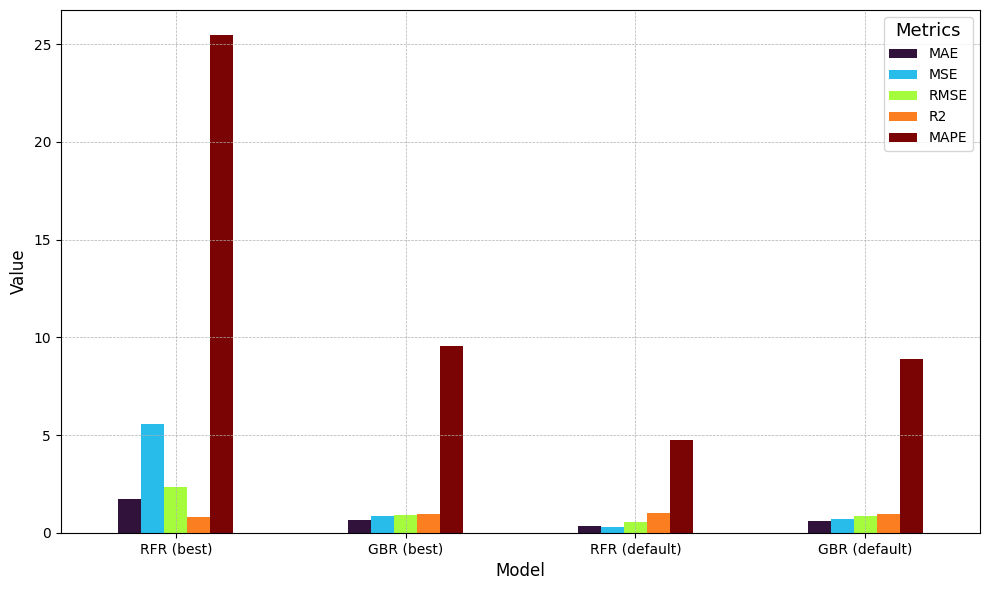

In [25]:
# create a bar plot with the results of the best models
results = pd.DataFrame({
    'Model': ['RFR (best)', 'GBR (best)', 'RFR (default)', 'GBR (default)'],
    'MAE': [mae_rf_best, mae_gbr_best, mae_rf_default, mae_gbr_default],
    'MSE': [mse_rf_best, mse_gbr_best, mse_rf_default, mse_gbr_default],
    'RMSE': [rmse_rf_best, rmse_gbr_best, rmse_rf_default, rmse_gbr_default],
    'R2': [r2_rf_best, r2_gbr_best, r2_rf_default, r2_gbr_default],
    'MAPE': [mape_rf_best, mape_gbr_best, mape_rf_default, mape_gbr_default]
})

# Plotting
fig, ax = plt.subplots(figsize=(10, 6))
# Color map
num_metrics = len(results.columns) - 1 
colors = plt.cm.turbo(np.linspace(0, 1, num_metrics))
results.set_index('Model').plot(kind='bar', color=colors, ax=ax)

plt.ylabel('Value', fontsize=12)
plt.xlabel('Model', fontsize=12)
plt.xticks(rotation=0)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.legend(title='Metrics', title_fontsize='13', fontsize='10')

plt.tight_layout()
plt.show()

In [26]:
# run cross-validation on all models to compare the performance

## Linear Regression
scores_lr = cross_val_score(model, X, y, cv=5, scoring='neg_mean_squared_error')
mse_lr = np.mean(-scores_lr)

## Random Forest tuned
scores_rf_best = cross_val_score(model_rf_best, X, y, cv=5, scoring='neg_mean_squared_error')
mse_rf_best = np.mean(-scores_rf_best)

## Gradient Boosting tuned
scores_gbr_best = cross_val_score(model_gbr_best, X, y, cv=5, scoring='neg_mean_squared_error')
mse_gbr_best = np.mean(-scores_gbr_best)

## Random Forest (default)
scores_rf_default = cross_val_score(model_rf, X, y, cv=5, scoring='neg_mean_squared_error')
mse_rf_default = np.mean(-scores_rf_default)

## Gradient Boosting (default)
scores_gbr_default = cross_val_score(model_gbr, X, y, cv=5, scoring='neg_mean_squared_error')
mse_gbr_default = np.mean(-scores_gbr_default)

# Create a DataFrame with the results
results = pd.DataFrame({
    'Model': ['Linear Regression', 'Random Forest', 'Random Forest (best)', 'Gradient Boosting', 'Gradient Boosting (best)'],
    'MSE': [mse_lr, mse_rf_default, mse_rf_best, mse_gbr_default, mse_gbr_best]
})

# Print the results
print(results.to_string(index=False))

[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.


building tree 1 of 1800building tree 2 of 1800

building tree 3 of 1800
building tree 4 of 1800
building tree 5 of 1800
building tree 6 of 1800
building tree 7 of 1800
building tree 8 of 1800
building tree 9 of 1800
building tree 10 of 1800
building tree 11 of 1800
building tree 12 of 1800
building tree 13 of 1800
building tree 14 of 1800
building tree 15 of 1800
building tree 16 of 1800
building tree 17 of 1800
building tree 18 of 1800
building tree 19 of 1800
building tree 20 of 1800
building tree 21 of 1800
building tree 22 of 1800
building tree 23 of 1800
building tree 24 of 1800
building tree 25 of 1800
building tree 26 of 1800
building tree 27 of 1800
building tree 28 of 1800
building tree 29 of 1800
building tree 30 of 1800
building tree 31 of 1800
building tree 32 of 1800
building tree 33 of 1800
building tree 34 of 1800
building tree 35 of 1800
building tree 36 of 1800
building tree 37 of 1800
building tree 38 of 1800
building tree 39 of 1800
building tree 40 of 1800


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.3s


building tree 41 of 1800
building tree 42 of 1800
building tree 43 of 1800
building tree 44 of 1800
building tree 45 of 1800
building tree 46 of 1800
building tree 47 of 1800
building tree 48 of 1800
building tree 49 of 1800
building tree 50 of 1800
building tree 51 of 1800
building tree 52 of 1800
building tree 53 of 1800
building tree 54 of 1800
building tree 55 of 1800
building tree 56 of 1800
building tree 57 of 1800
building tree 58 of 1800
building tree 59 of 1800
building tree 60 of 1800
building tree 61 of 1800
building tree 62 of 1800
building tree 63 of 1800
building tree 64 of 1800
building tree 65 of 1800
building tree 66 of 1800
building tree 67 of 1800
building tree 68 of 1800
building tree 69 of 1800
building tree 70 of 1800
building tree 71 of 1800
building tree 72 of 1800
building tree 73 of 1800
building tree 74 of 1800
building tree 75 of 1800
building tree 76 of 1800
building tree 77 of 1800
building tree 78 of 1800
building tree 79 of 1800
building tree 80 of 1800


[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    1.4s


building tree 133 of 1800
building tree 134 of 1800
building tree 135 of 1800
building tree 136 of 1800
building tree 137 of 1800
building tree 138 of 1800
building tree 139 of 1800
building tree 140 of 1800
building tree 141 of 1800
building tree 142 of 1800
building tree 143 of 1800
building tree 144 of 1800
building tree 145 of 1800
building tree 146 of 1800
building tree 147 of 1800
building tree 148 of 1800
building tree 149 of 1800
building tree 150 of 1800
building tree 151 of 1800
building tree 152 of 1800
building tree 153 of 1800
building tree 154 of 1800
building tree 155 of 1800
building tree 156 of 1800
building tree 157 of 1800
building tree 158 of 1800
building tree 159 of 1800
building tree 160 of 1800
building tree 161 of 1800
building tree 162 of 1800
building tree 163 of 1800
building tree 164 of 1800
building tree 165 of 1800
building tree 166 of 1800
building tree 167 of 1800
building tree 168 of 1800
building tree 169 of 1800
building tree 170 of 1800
building tre

[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    3.2s


building tree 295 of 1800
building tree 296 of 1800
building tree 297 of 1800
building tree 298 of 1800
building tree 299 of 1800
building tree 300 of 1800
building tree 301 of 1800
building tree 302 of 1800
building tree 303 of 1800
building tree 304 of 1800
building tree 305 of 1800
building tree 306 of 1800
building tree 307 of 1800
building tree 308 of 1800
building tree 309 of 1800
building tree 310 of 1800
building tree 311 of 1800
building tree 312 of 1800
building tree 313 of 1800
building tree 314 of 1800
building tree 315 of 1800
building tree 316 of 1800
building tree 317 of 1800
building tree 318 of 1800
building tree 319 of 1800
building tree 320 of 1800
building tree 321 of 1800
building tree 322 of 1800
building tree 323 of 1800
building tree 324 of 1800
building tree 325 of 1800
building tree 326 of 1800
building tree 327 of 1800
building tree 328 of 1800
building tree 329 of 1800
building tree 330 of 1800
building tree 331 of 1800
building tree 332 of 1800
building tre

[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    5.8s


building tree 513 of 1800
building tree 514 of 1800
building tree 515 of 1800
building tree 516 of 1800
building tree 517 of 1800
building tree 518 of 1800
building tree 519 of 1800
building tree 520 of 1800
building tree 521 of 1800
building tree 522 of 1800
building tree 523 of 1800
building tree 524 of 1800
building tree 525 of 1800
building tree 526 of 1800
building tree 527 of 1800
building tree 528 of 1800
building tree 529 of 1800
building tree 530 of 1800
building tree 531 of 1800
building tree 532 of 1800
building tree 533 of 1800
building tree 534 of 1800
building tree 535 of 1800
building tree 536 of 1800
building tree 537 of 1800
building tree 538 of 1800
building tree 539 of 1800
building tree 540 of 1800
building tree 541 of 1800
building tree 542 of 1800
building tree 543 of 1800
building tree 544 of 1800
building tree 545 of 1800
building tree 546 of 1800
building tree 547 of 1800
building tree 548 of 1800
building tree 549 of 1800
building tree 550 of 1800
building tre

[Parallel(n_jobs=4)]: Done 792 tasks      | elapsed:    9.1s


building tree 804 of 1800
building tree 805 of 1800
building tree 806 of 1800
building tree 807 of 1800
building tree 808 of 1800
building tree 809 of 1800
building tree 810 of 1800
building tree 811 of 1800
building tree 812 of 1800
building tree 813 of 1800
building tree 814 of 1800
building tree 815 of 1800
building tree 816 of 1800
building tree 817 of 1800
building tree 818 of 1800
building tree 819 of 1800
building tree 820 of 1800
building tree 821 of 1800
building tree 822 of 1800
building tree 823 of 1800
building tree 824 of 1800
building tree 825 of 1800
building tree 826 of 1800
building tree 827 of 1800
building tree 828 of 1800
building tree 829 of 1800
building tree 830 of 1800
building tree 831 of 1800
building tree 832 of 1800
building tree 833 of 1800
building tree 834 of 1800
building tree 835 of 1800
building tree 836 of 1800
building tree 837 of 1800
building tree 838 of 1800
building tree 839 of 1800
building tree 840 of 1800
building tree 841 of 1800
building tre

[Parallel(n_jobs=4)]: Done 1144 tasks      | elapsed:   13.5s


building tree 1156 of 1800
building tree 1157 of 1800
building tree 1158 of 1800
building tree 1159 of 1800
building tree 1160 of 1800
building tree 1161 of 1800
building tree 1162 of 1800
building tree 1163 of 1800
building tree 1164 of 1800
building tree 1165 of 1800
building tree 1166 of 1800
building tree 1167 of 1800
building tree 1168 of 1800
building tree 1169 of 1800
building tree 1170 of 1800
building tree 1171 of 1800
building tree 1172 of 1800
building tree 1173 of 1800
building tree 1174 of 1800
building tree 1175 of 1800
building tree 1176 of 1800
building tree 1177 of 1800
building tree 1178 of 1800
building tree 1179 of 1800
building tree 1180 of 1800
building tree 1181 of 1800
building tree 1182 of 1800
building tree 1183 of 1800
building tree 1184 of 1800
building tree 1185 of 1800
building tree 1186 of 1800
building tree 1187 of 1800
building tree 1188 of 1800
building tree 1189 of 1800
building tree 1190 of 1800
building tree 1191 of 1800
building tree 1192 of 1800
b

[Parallel(n_jobs=4)]: Done 1560 tasks      | elapsed:   18.3s


building tree 1578 of 1800
building tree 1579 of 1800
building tree 1580 of 1800
building tree 1581 of 1800
building tree 1582 of 1800
building tree 1583 of 1800
building tree 1584 of 1800
building tree 1585 of 1800
building tree 1586 of 1800
building tree 1587 of 1800
building tree 1588 of 1800
building tree 1589 of 1800
building tree 1590 of 1800
building tree 1591 of 1800
building tree 1592 of 1800
building tree 1593 of 1800
building tree 1594 of 1800
building tree 1595 of 1800
building tree 1596 of 1800
building tree 1597 of 1800
building tree 1598 of 1800
building tree 1599 of 1800
building tree 1600 of 1800
building tree 1601 of 1800
building tree 1602 of 1800
building tree 1603 of 1800
building tree 1604 of 1800
building tree 1605 of 1800
building tree 1606 of 1800
building tree 1607 of 1800
building tree 1608 of 1800
building tree 1609 of 1800
building tree 1610 of 1800
building tree 1611 of 1800
building tree 1612 of 1800
building tree 1613 of 1800
building tree 1614 of 1800
b

[Parallel(n_jobs=4)]: Done 1800 out of 1800 | elapsed:   21.0s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 792 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 1144 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 1560 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 1800 out of 1800 | elapsed:    0.1s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.


building tree 1 of 1800building tree 2 of 1800

building tree 3 of 1800
building tree 4 of 1800
building tree 5 of 1800
building tree 6 of 1800
building tree 7 of 1800
building tree 8 of 1800
building tree 9 of 1800
building tree 10 of 1800
building tree 11 of 1800
building tree 12 of 1800
building tree 13 of 1800
building tree 14 of 1800
building tree 15 of 1800
building tree 16 of 1800
building tree 17 of 1800
building tree 18 of 1800
building tree 19 of 1800
building tree 20 of 1800
building tree 21 of 1800
building tree 22 of 1800
building tree 23 of 1800
building tree 24 of 1800
building tree 25 of 1800
building tree 26 of 1800
building tree 27 of 1800
building tree 28 of 1800
building tree 29 of 1800
building tree 30 of 1800
building tree 31 of 1800
building tree 32 of 1800
building tree 33 of 1800
building tree 34 of 1800
building tree 35 of 1800
building tree 36 of 1800


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.3s


building tree 37 of 1800
building tree 38 of 1800
building tree 39 of 1800
building tree 40 of 1800
building tree 41 of 1800
building tree 42 of 1800
building tree 43 of 1800
building tree 44 of 1800
building tree 45 of 1800
building tree 46 of 1800
building tree 47 of 1800
building tree 48 of 1800
building tree 49 of 1800
building tree 50 of 1800
building tree 51 of 1800
building tree 52 of 1800
building tree 53 of 1800
building tree 54 of 1800
building tree 55 of 1800
building tree 56 of 1800
building tree 57 of 1800
building tree 58 of 1800
building tree 59 of 1800
building tree 60 of 1800
building tree 61 of 1800
building tree 62 of 1800
building tree 63 of 1800
building tree 64 of 1800
building tree 65 of 1800
building tree 66 of 1800
building tree 67 of 1800
building tree 68 of 1800
building tree 69 of 1800
building tree 70 of 1800
building tree 71 of 1800
building tree 72 of 1800
building tree 73 of 1800
building tree 74 of 1800
building tree 75 of 1800
building tree 76 of 1800


[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    1.4s


building tree 127 of 1800
building tree 128 of 1800
building tree 129 of 1800
building tree 130 of 1800
building tree 131 of 1800
building tree 132 of 1800
building tree 133 of 1800
building tree 134 of 1800
building tree 135 of 1800
building tree 136 of 1800
building tree 137 of 1800
building tree 138 of 1800
building tree 139 of 1800
building tree 140 of 1800
building tree 141 of 1800
building tree 142 of 1800
building tree 143 of 1800
building tree 144 of 1800
building tree 145 of 1800
building tree 146 of 1800
building tree 147 of 1800
building tree 148 of 1800
building tree 149 of 1800
building tree 150 of 1800
building tree 151 of 1800
building tree 152 of 1800
building tree 153 of 1800
building tree 154 of 1800
building tree 155 of 1800
building tree 156 of 1800
building tree 157 of 1800
building tree 158 of 1800
building tree 159 of 1800
building tree 160 of 1800
building tree 161 of 1800
building tree 162 of 1800
building tree 163 of 1800
building tree 164 of 1800
building tre

[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    3.2s


building tree 294 of 1800
building tree 295 of 1800
building tree 296 of 1800
building tree 297 of 1800
building tree 298 of 1800
building tree 299 of 1800
building tree 300 of 1800
building tree 301 of 1800
building tree 302 of 1800
building tree 303 of 1800
building tree 304 of 1800
building tree 305 of 1800
building tree 306 of 1800
building tree 307 of 1800
building tree 308 of 1800
building tree 309 of 1800
building tree 310 of 1800
building tree 311 of 1800
building tree 312 of 1800
building tree 313 of 1800
building tree 314 of 1800
building tree 315 of 1800
building tree 316 of 1800
building tree 317 of 1800
building tree 318 of 1800
building tree 319 of 1800
building tree 320 of 1800
building tree 321 of 1800
building tree 322 of 1800
building tree 323 of 1800
building tree 324 of 1800
building tree 325 of 1800
building tree 326 of 1800
building tree 327 of 1800
building tree 328 of 1800
building tree 329 of 1800
building tree 330 of 1800
building tree 331 of 1800
building tre

[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    5.7s


building tree 517 of 1800
building tree 518 of 1800
building tree 519 of 1800
building tree 520 of 1800
building tree 521 of 1800
building tree 522 of 1800
building tree 523 of 1800
building tree 524 of 1800
building tree 525 of 1800
building tree 526 of 1800
building tree 527 of 1800
building tree 528 of 1800
building tree 529 of 1800
building tree 530 of 1800
building tree 531 of 1800
building tree 532 of 1800
building tree 533 of 1800
building tree 534 of 1800
building tree 535 of 1800
building tree 536 of 1800
building tree 537 of 1800
building tree 538 of 1800
building tree 539 of 1800
building tree 540 of 1800
building tree 541 of 1800
building tree 542 of 1800
building tree 543 of 1800
building tree 544 of 1800
building tree 545 of 1800
building tree 546 of 1800
building tree 547 of 1800
building tree 548 of 1800
building tree 549 of 1800
building tree 550 of 1800
building tree 551 of 1800
building tree 552 of 1800
building tree 553 of 1800
building tree 554 of 1800
building tre

[Parallel(n_jobs=4)]: Done 792 tasks      | elapsed:    9.1s


building tree 809 of 1800
building tree 810 of 1800
building tree 811 of 1800
building tree 812 of 1800
building tree 813 of 1800
building tree 814 of 1800
building tree 815 of 1800
building tree 816 of 1800
building tree 817 of 1800
building tree 818 of 1800
building tree 819 of 1800
building tree 820 of 1800
building tree 821 of 1800
building tree 822 of 1800
building tree 823 of 1800
building tree 824 of 1800
building tree 825 of 1800
building tree 826 of 1800
building tree 827 of 1800
building tree 828 of 1800
building tree 829 of 1800
building tree 830 of 1800
building tree 831 of 1800
building tree 832 of 1800
building tree 833 of 1800
building tree 834 of 1800
building tree 835 of 1800
building tree 836 of 1800
building tree 837 of 1800
building tree 838 of 1800
building tree 839 of 1800
building tree 840 of 1800
building tree 841 of 1800
building tree 842 of 1800
building tree 843 of 1800
building tree 844 of 1800
building tree 845 of 1800
building tree 846 of 1800
building tre

[Parallel(n_jobs=4)]: Done 1144 tasks      | elapsed:   13.0s


building tree 1165 of 1800
building tree 1166 of 1800
building tree 1167 of 1800
building tree 1168 of 1800
building tree 1169 of 1800
building tree 1170 of 1800
building tree 1171 of 1800
building tree 1172 of 1800
building tree 1173 of 1800
building tree 1174 of 1800
building tree 1175 of 1800
building tree 1176 of 1800
building tree 1177 of 1800
building tree 1178 of 1800
building tree 1179 of 1800
building tree 1180 of 1800
building tree 1181 of 1800
building tree 1182 of 1800
building tree 1183 of 1800
building tree 1184 of 1800
building tree 1185 of 1800
building tree 1186 of 1800
building tree 1187 of 1800
building tree 1188 of 1800
building tree 1189 of 1800
building tree 1190 of 1800
building tree 1191 of 1800
building tree 1192 of 1800
building tree 1193 of 1800
building tree 1194 of 1800
building tree 1195 of 1800
building tree 1196 of 1800
building tree 1197 of 1800
building tree 1198 of 1800
building tree 1199 of 1800
building tree 1200 of 1800
building tree 1201 of 1800
b

[Parallel(n_jobs=4)]: Done 1560 tasks      | elapsed:   17.9s


building tree 1565 of 1800
building tree 1566 of 1800
building tree 1567 of 1800
building tree 1568 of 1800
building tree 1569 of 1800
building tree 1570 of 1800
building tree 1571 of 1800
building tree 1572 of 1800
building tree 1573 of 1800
building tree 1574 of 1800
building tree 1575 of 1800
building tree 1576 of 1800
building tree 1577 of 1800
building tree 1578 of 1800
building tree 1579 of 1800
building tree 1580 of 1800
building tree 1581 of 1800
building tree 1582 of 1800
building tree 1583 of 1800
building tree 1584 of 1800
building tree 1585 of 1800
building tree 1586 of 1800
building tree 1587 of 1800
building tree 1588 of 1800
building tree 1589 of 1800
building tree 1590 of 1800
building tree 1591 of 1800
building tree 1592 of 1800
building tree 1593 of 1800
building tree 1594 of 1800
building tree 1595 of 1800
building tree 1596 of 1800
building tree 1597 of 1800
building tree 1598 of 1800
building tree 1599 of 1800
building tree 1600 of 1800
building tree 1601 of 1800
b

[Parallel(n_jobs=4)]: Done 1800 out of 1800 | elapsed:   20.7s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 792 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 1144 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 1560 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 1800 out of 1800 | elapsed:    0.1s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.


building tree 1 of 1800building tree 2 of 1800

building tree 3 of 1800
building tree 4 of 1800
building tree 5 of 1800
building tree 6 of 1800
building tree 7 of 1800
building tree 8 of 1800
building tree 9 of 1800
building tree 10 of 1800
building tree 11 of 1800
building tree 12 of 1800
building tree 13 of 1800
building tree 14 of 1800
building tree 15 of 1800
building tree 16 of 1800
building tree 17 of 1800
building tree 18 of 1800
building tree 19 of 1800
building tree 20 of 1800
building tree 21 of 1800
building tree 22 of 1800
building tree 23 of 1800
building tree 24 of 1800
building tree 25 of 1800
building tree 26 of 1800
building tree 27 of 1800
building tree 28 of 1800
building tree 29 of 1800
building tree 30 of 1800
building tree 31 of 1800
building tree 32 of 1800
building tree 33 of 1800
building tree 34 of 1800
building tree 35 of 1800
building tree 36 of 1800
building tree 37 of 1800
building tree 38 of 1800
building tree 39 of 1800
building tree 40 of 1800


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.3s


building tree 41 of 1800
building tree 42 of 1800
building tree 43 of 1800
building tree 44 of 1800
building tree 45 of 1800
building tree 46 of 1800
building tree 47 of 1800
building tree 48 of 1800
building tree 49 of 1800
building tree 50 of 1800
building tree 51 of 1800
building tree 52 of 1800
building tree 53 of 1800
building tree 54 of 1800
building tree 55 of 1800
building tree 56 of 1800
building tree 57 of 1800
building tree 58 of 1800
building tree 59 of 1800
building tree 60 of 1800
building tree 61 of 1800
building tree 62 of 1800
building tree 63 of 1800
building tree 64 of 1800
building tree 65 of 1800
building tree 66 of 1800
building tree 67 of 1800
building tree 68 of 1800
building tree 69 of 1800
building tree 70 of 1800
building tree 71 of 1800
building tree 72 of 1800
building tree 73 of 1800
building tree 74 of 1800
building tree 75 of 1800
building tree 76 of 1800
building tree 77 of 1800
building tree 78 of 1800
building tree 79 of 1800
building tree 80 of 1800


[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    1.4s


building tree 137 of 1800
building tree 138 of 1800
building tree 139 of 1800
building tree 140 of 1800
building tree 141 of 1800
building tree 142 of 1800
building tree 143 of 1800
building tree 144 of 1800
building tree 145 of 1800
building tree 146 of 1800
building tree 147 of 1800
building tree 148 of 1800
building tree 149 of 1800
building tree 150 of 1800
building tree 151 of 1800
building tree 152 of 1800
building tree 153 of 1800
building tree 154 of 1800
building tree 155 of 1800
building tree 156 of 1800
building tree 157 of 1800
building tree 158 of 1800
building tree 159 of 1800
building tree 160 of 1800
building tree 161 of 1800
building tree 162 of 1800
building tree 163 of 1800
building tree 164 of 1800
building tree 165 of 1800
building tree 166 of 1800
building tree 167 of 1800
building tree 168 of 1800
building tree 169 of 1800
building tree 170 of 1800
building tree 171 of 1800
building tree 172 of 1800
building tree 173 of 1800
building tree 174 of 1800
building tre

[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    3.2s


building tree 289 of 1800
building tree 290 of 1800
building tree 291 of 1800
building tree 292 of 1800
building tree 293 of 1800
building tree 294 of 1800
building tree 295 of 1800
building tree 296 of 1800
building tree 297 of 1800
building tree 298 of 1800
building tree 299 of 1800
building tree 300 of 1800
building tree 301 of 1800
building tree 302 of 1800
building tree 303 of 1800
building tree 304 of 1800
building tree 305 of 1800
building tree 306 of 1800
building tree 307 of 1800
building tree 308 of 1800
building tree 309 of 1800
building tree 310 of 1800
building tree 311 of 1800
building tree 312 of 1800
building tree 313 of 1800
building tree 314 of 1800
building tree 315 of 1800
building tree 316 of 1800
building tree 317 of 1800
building tree 318 of 1800
building tree 319 of 1800
building tree 320 of 1800
building tree 321 of 1800
building tree 322 of 1800
building tree 323 of 1800
building tree 324 of 1800
building tree 325 of 1800
building tree 326 of 1800
building tre

[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    5.8s


building tree 524 of 1800
building tree 525 of 1800
building tree 526 of 1800
building tree 527 of 1800
building tree 528 of 1800
building tree 529 of 1800
building tree 530 of 1800
building tree 531 of 1800
building tree 532 of 1800
building tree 533 of 1800
building tree 534 of 1800
building tree 535 of 1800
building tree 536 of 1800
building tree 537 of 1800
building tree 538 of 1800
building tree 539 of 1800
building tree 540 of 1800
building tree 541 of 1800
building tree 542 of 1800
building tree 543 of 1800
building tree 544 of 1800
building tree 545 of 1800
building tree 546 of 1800
building tree 547 of 1800
building tree 548 of 1800
building tree 549 of 1800
building tree 550 of 1800
building tree 551 of 1800
building tree 552 of 1800
building tree 553 of 1800
building tree 554 of 1800
building tree 555 of 1800
building tree 556 of 1800
building tree 557 of 1800
building tree 558 of 1800
building tree 559 of 1800
building tree 560 of 1800
building tree 561 of 1800
building tre

[Parallel(n_jobs=4)]: Done 792 tasks      | elapsed:    9.1s


building tree 801 of 1800
building tree 802 of 1800
building tree 803 of 1800
building tree 804 of 1800
building tree 805 of 1800
building tree 806 of 1800
building tree 807 of 1800
building tree 808 of 1800
building tree 809 of 1800
building tree 810 of 1800
building tree 811 of 1800
building tree 812 of 1800
building tree 813 of 1800
building tree 814 of 1800
building tree 815 of 1800
building tree 816 of 1800
building tree 817 of 1800
building tree 818 of 1800
building tree 819 of 1800
building tree 820 of 1800
building tree 821 of 1800
building tree 822 of 1800
building tree 823 of 1800
building tree 824 of 1800
building tree 825 of 1800
building tree 826 of 1800
building tree 827 of 1800
building tree 828 of 1800
building tree 829 of 1800
building tree 830 of 1800
building tree 831 of 1800
building tree 832 of 1800
building tree 833 of 1800
building tree 834 of 1800
building tree 835 of 1800
building tree 836 of 1800
building tree 837 of 1800
building tree 838 of 1800
building tre

[Parallel(n_jobs=4)]: Done 1144 tasks      | elapsed:   13.1s


building tree 1155 of 1800
building tree 1156 of 1800
building tree 1157 of 1800
building tree 1158 of 1800
building tree 1159 of 1800
building tree 1160 of 1800
building tree 1161 of 1800
building tree 1162 of 1800
building tree 1163 of 1800
building tree 1164 of 1800
building tree 1165 of 1800
building tree 1166 of 1800
building tree 1167 of 1800
building tree 1168 of 1800
building tree 1169 of 1800
building tree 1170 of 1800
building tree 1171 of 1800
building tree 1172 of 1800
building tree 1173 of 1800
building tree 1174 of 1800
building tree 1175 of 1800
building tree 1176 of 1800
building tree 1177 of 1800
building tree 1178 of 1800
building tree 1179 of 1800
building tree 1180 of 1800
building tree 1181 of 1800
building tree 1182 of 1800
building tree 1183 of 1800
building tree 1184 of 1800
building tree 1185 of 1800
building tree 1186 of 1800
building tree 1187 of 1800
building tree 1188 of 1800
building tree 1189 of 1800
building tree 1190 of 1800
building tree 1191 of 1800
b

[Parallel(n_jobs=4)]: Done 1560 tasks      | elapsed:   17.8s


building tree 1572 of 1800
building tree 1573 of 1800
building tree 1574 of 1800
building tree 1575 of 1800
building tree 1576 of 1800
building tree 1577 of 1800
building tree 1578 of 1800
building tree 1579 of 1800
building tree 1580 of 1800
building tree 1581 of 1800
building tree 1582 of 1800
building tree 1583 of 1800
building tree 1584 of 1800
building tree 1585 of 1800
building tree 1586 of 1800
building tree 1587 of 1800
building tree 1588 of 1800
building tree 1589 of 1800
building tree 1590 of 1800
building tree 1591 of 1800
building tree 1592 of 1800
building tree 1593 of 1800
building tree 1594 of 1800
building tree 1595 of 1800
building tree 1596 of 1800
building tree 1597 of 1800
building tree 1598 of 1800
building tree 1599 of 1800
building tree 1600 of 1800
building tree 1601 of 1800
building tree 1602 of 1800
building tree 1603 of 1800
building tree 1604 of 1800
building tree 1605 of 1800
building tree 1606 of 1800
building tree 1607 of 1800
building tree 1608 of 1800
b

[Parallel(n_jobs=4)]: Done 1800 out of 1800 | elapsed:   20.5s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 792 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 1144 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 1560 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 1800 out of 1800 | elapsed:    0.1s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.


building tree 1 of 1800building tree 2 of 1800

building tree 3 of 1800
building tree 4 of 1800
building tree 5 of 1800
building tree 6 of 1800
building tree 7 of 1800
building tree 8 of 1800
building tree 9 of 1800
building tree 10 of 1800
building tree 11 of 1800
building tree 12 of 1800
building tree 13 of 1800
building tree 14 of 1800
building tree 15 of 1800
building tree 16 of 1800
building tree 17 of 1800
building tree 18 of 1800
building tree 19 of 1800
building tree 20 of 1800
building tree 21 of 1800
building tree 22 of 1800
building tree 23 of 1800
building tree 24 of 1800
building tree 25 of 1800
building tree 26 of 1800
building tree 27 of 1800
building tree 28 of 1800
building tree 29 of 1800
building tree 30 of 1800
building tree 31 of 1800
building tree 32 of 1800
building tree 33 of 1800
building tree 34 of 1800
building tree 35 of 1800
building tree 36 of 1800
building tree 37 of 1800
building tree 38 of 1800
building tree 39 of 1800
building tree 40 of 1800


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.3s


building tree 41 of 1800
building tree 42 of 1800
building tree 43 of 1800
building tree 44 of 1800
building tree 45 of 1800
building tree 46 of 1800
building tree 47 of 1800
building tree 48 of 1800
building tree 49 of 1800
building tree 50 of 1800
building tree 51 of 1800
building tree 52 of 1800
building tree 53 of 1800
building tree 54 of 1800
building tree 55 of 1800
building tree 56 of 1800
building tree 57 of 1800
building tree 58 of 1800
building tree 59 of 1800
building tree 60 of 1800
building tree 61 of 1800
building tree 62 of 1800
building tree 63 of 1800
building tree 64 of 1800
building tree 65 of 1800
building tree 66 of 1800
building tree 67 of 1800
building tree 68 of 1800
building tree 69 of 1800
building tree 70 of 1800
building tree 71 of 1800
building tree 72 of 1800
building tree 73 of 1800
building tree 74 of 1800
building tree 75 of 1800
building tree 76 of 1800
building tree 77 of 1800
building tree 78 of 1800
building tree 79 of 1800
building tree 80 of 1800


[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    1.4s


building tree 133 of 1800
building tree 134 of 1800
building tree 135 of 1800
building tree 136 of 1800
building tree 137 of 1800
building tree 138 of 1800
building tree 139 of 1800
building tree 140 of 1800
building tree 141 of 1800
building tree 142 of 1800
building tree 143 of 1800
building tree 144 of 1800
building tree 145 of 1800
building tree 146 of 1800
building tree 147 of 1800
building tree 148 of 1800
building tree 149 of 1800
building tree 150 of 1800
building tree 151 of 1800
building tree 152 of 1800
building tree 153 of 1800
building tree 154 of 1800
building tree 155 of 1800
building tree 156 of 1800
building tree 157 of 1800
building tree 158 of 1800
building tree 159 of 1800
building tree 160 of 1800
building tree 161 of 1800
building tree 162 of 1800
building tree 163 of 1800
building tree 164 of 1800
building tree 165 of 1800
building tree 166 of 1800
building tree 167 of 1800
building tree 168 of 1800
building tree 169 of 1800
building tree 170 of 1800
building tre

[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    3.2s


building tree 298 of 1800
building tree 299 of 1800
building tree 300 of 1800
building tree 301 of 1800
building tree 302 of 1800
building tree 303 of 1800
building tree 304 of 1800
building tree 305 of 1800
building tree 306 of 1800
building tree 307 of 1800
building tree 308 of 1800
building tree 309 of 1800
building tree 310 of 1800
building tree 311 of 1800
building tree 312 of 1800
building tree 313 of 1800
building tree 314 of 1800
building tree 315 of 1800
building tree 316 of 1800
building tree 317 of 1800
building tree 318 of 1800
building tree 319 of 1800
building tree 320 of 1800
building tree 321 of 1800
building tree 322 of 1800
building tree 323 of 1800
building tree 324 of 1800
building tree 325 of 1800
building tree 326 of 1800
building tree 327 of 1800
building tree 328 of 1800
building tree 329 of 1800
building tree 330 of 1800
building tree 331 of 1800
building tree 332 of 1800
building tree 333 of 1800
building tree 334 of 1800
building tree 335 of 1800
building tre

[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    5.8s


building tree 516 of 1800
building tree 517 of 1800
building tree 518 of 1800
building tree 519 of 1800
building tree 520 of 1800
building tree 521 of 1800
building tree 522 of 1800
building tree 523 of 1800
building tree 524 of 1800
building tree 525 of 1800
building tree 526 of 1800
building tree 527 of 1800
building tree 528 of 1800
building tree 529 of 1800
building tree 530 of 1800
building tree 531 of 1800
building tree 532 of 1800
building tree 533 of 1800
building tree 534 of 1800
building tree 535 of 1800
building tree 536 of 1800
building tree 537 of 1800
building tree 538 of 1800
building tree 539 of 1800
building tree 540 of 1800
building tree 541 of 1800
building tree 542 of 1800
building tree 543 of 1800
building tree 544 of 1800
building tree 545 of 1800
building tree 546 of 1800
building tree 547 of 1800
building tree 548 of 1800
building tree 549 of 1800
building tree 550 of 1800
building tree 551 of 1800
building tree 552 of 1800
building tree 553 of 1800
building tre

[Parallel(n_jobs=4)]: Done 792 tasks      | elapsed:    9.1s


building tree 806 of 1800
building tree 807 of 1800
building tree 808 of 1800
building tree 809 of 1800
building tree 810 of 1800
building tree 811 of 1800
building tree 812 of 1800
building tree 813 of 1800
building tree 814 of 1800
building tree 815 of 1800
building tree 816 of 1800
building tree 817 of 1800
building tree 818 of 1800
building tree 819 of 1800
building tree 820 of 1800
building tree 821 of 1800
building tree 822 of 1800
building tree 823 of 1800
building tree 824 of 1800
building tree 825 of 1800
building tree 826 of 1800
building tree 827 of 1800
building tree 828 of 1800
building tree 829 of 1800
building tree 830 of 1800
building tree 831 of 1800
building tree 832 of 1800
building tree 833 of 1800
building tree 834 of 1800
building tree 835 of 1800
building tree 836 of 1800
building tree 837 of 1800
building tree 838 of 1800
building tree 839 of 1800
building tree 840 of 1800
building tree 841 of 1800
building tree 842 of 1800
building tree 843 of 1800
building tre

[Parallel(n_jobs=4)]: Done 1144 tasks      | elapsed:   13.1s


building tree 1165 of 1800
building tree 1166 of 1800
building tree 1167 of 1800
building tree 1168 of 1800
building tree 1169 of 1800
building tree 1170 of 1800
building tree 1171 of 1800
building tree 1172 of 1800
building tree 1173 of 1800
building tree 1174 of 1800
building tree 1175 of 1800
building tree 1176 of 1800
building tree 1177 of 1800
building tree 1178 of 1800
building tree 1179 of 1800
building tree 1180 of 1800
building tree 1181 of 1800
building tree 1182 of 1800
building tree 1183 of 1800
building tree 1184 of 1800
building tree 1185 of 1800
building tree 1186 of 1800
building tree 1187 of 1800
building tree 1188 of 1800
building tree 1189 of 1800
building tree 1190 of 1800
building tree 1191 of 1800
building tree 1192 of 1800
building tree 1193 of 1800
building tree 1194 of 1800
building tree 1195 of 1800
building tree 1196 of 1800
building tree 1197 of 1800
building tree 1198 of 1800
building tree 1199 of 1800
building tree 1200 of 1800
building tree 1201 of 1800
b

[Parallel(n_jobs=4)]: Done 1560 tasks      | elapsed:   17.9s


building tree 1569 of 1800
building tree 1570 of 1800
building tree 1571 of 1800
building tree 1572 of 1800
building tree 1573 of 1800
building tree 1574 of 1800
building tree 1575 of 1800
building tree 1576 of 1800
building tree 1577 of 1800
building tree 1578 of 1800
building tree 1579 of 1800
building tree 1580 of 1800
building tree 1581 of 1800
building tree 1582 of 1800
building tree 1583 of 1800
building tree 1584 of 1800
building tree 1585 of 1800
building tree 1586 of 1800
building tree 1587 of 1800
building tree 1588 of 1800
building tree 1589 of 1800
building tree 1590 of 1800
building tree 1591 of 1800
building tree 1592 of 1800
building tree 1593 of 1800
building tree 1594 of 1800
building tree 1595 of 1800
building tree 1596 of 1800
building tree 1597 of 1800
building tree 1598 of 1800
building tree 1599 of 1800
building tree 1600 of 1800
building tree 1601 of 1800
building tree 1602 of 1800
building tree 1603 of 1800
building tree 1604 of 1800
building tree 1605 of 1800
b

[Parallel(n_jobs=4)]: Done 1800 out of 1800 | elapsed:   20.6s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 792 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 1144 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done 1560 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Done 1800 out of 1800 | elapsed:    0.2s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.


building tree 1 of 1800building tree 2 of 1800

building tree 3 of 1800
building tree 4 of 1800
building tree 5 of 1800
building tree 6 of 1800
building tree 7 of 1800
building tree 8 of 1800
building tree 9 of 1800
building tree 10 of 1800
building tree 11 of 1800
building tree 12 of 1800
building tree 13 of 1800
building tree 14 of 1800
building tree 15 of 1800
building tree 16 of 1800
building tree 17 of 1800
building tree 18 of 1800
building tree 19 of 1800
building tree 20 of 1800
building tree 21 of 1800
building tree 22 of 1800
building tree 23 of 1800
building tree 24 of 1800
building tree 25 of 1800
building tree 26 of 1800
building tree 27 of 1800
building tree 28 of 1800
building tree 29 of 1800
building tree 30 of 1800
building tree 31 of 1800
building tree 32 of 1800
building tree 33 of 1800
building tree 34 of 1800
building tree 35 of 1800
building tree 36 of 1800
building tree 37 of 1800
building tree 38 of 1800
building tree 39 of 1800
building tree 40 of 1800


[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.3s


building tree 41 of 1800
building tree 42 of 1800
building tree 43 of 1800
building tree 44 of 1800
building tree 45 of 1800
building tree 46 of 1800
building tree 47 of 1800
building tree 48 of 1800
building tree 49 of 1800
building tree 50 of 1800
building tree 51 of 1800
building tree 52 of 1800
building tree 53 of 1800
building tree 54 of 1800
building tree 55 of 1800
building tree 56 of 1800
building tree 57 of 1800
building tree 58 of 1800
building tree 59 of 1800
building tree 60 of 1800
building tree 61 of 1800
building tree 62 of 1800
building tree 63 of 1800
building tree 64 of 1800
building tree 65 of 1800
building tree 66 of 1800
building tree 67 of 1800
building tree 68 of 1800
building tree 69 of 1800
building tree 70 of 1800
building tree 71 of 1800
building tree 72 of 1800
building tree 73 of 1800
building tree 74 of 1800
building tree 75 of 1800
building tree 76 of 1800
building tree 77 of 1800
building tree 78 of 1800
building tree 79 of 1800
building tree 80 of 1800


[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    1.4s


building tree 128 of 1800
building tree 129 of 1800
building tree 130 of 1800
building tree 131 of 1800
building tree 132 of 1800
building tree 133 of 1800
building tree 134 of 1800
building tree 135 of 1800
building tree 136 of 1800
building tree 137 of 1800
building tree 138 of 1800
building tree 139 of 1800
building tree 140 of 1800
building tree 141 of 1800
building tree 142 of 1800
building tree 143 of 1800
building tree 144 of 1800
building tree 145 of 1800
building tree 146 of 1800
building tree 147 of 1800
building tree 148 of 1800
building tree 149 of 1800
building tree 150 of 1800
building tree 151 of 1800
building tree 152 of 1800
building tree 153 of 1800
building tree 154 of 1800
building tree 155 of 1800
building tree 156 of 1800
building tree 157 of 1800
building tree 158 of 1800
building tree 159 of 1800
building tree 160 of 1800
building tree 161 of 1800
building tree 162 of 1800
building tree 163 of 1800
building tree 164 of 1800
building tree 165 of 1800
building tre

[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    3.3s


building tree 287 of 1800
building tree 288 of 1800
building tree 289 of 1800
building tree 290 of 1800
building tree 291 of 1800
building tree 292 of 1800
building tree 293 of 1800
building tree 294 of 1800
building tree 295 of 1800
building tree 296 of 1800
building tree 297 of 1800
building tree 298 of 1800
building tree 299 of 1800
building tree 300 of 1800
building tree 301 of 1800
building tree 302 of 1800
building tree 303 of 1800
building tree 304 of 1800
building tree 305 of 1800
building tree 306 of 1800
building tree 307 of 1800
building tree 308 of 1800
building tree 309 of 1800
building tree 310 of 1800
building tree 311 of 1800
building tree 312 of 1800
building tree 313 of 1800
building tree 314 of 1800
building tree 315 of 1800
building tree 316 of 1800
building tree 317 of 1800
building tree 318 of 1800
building tree 319 of 1800building tree 320 of 1800

building tree 321 of 1800
building tree 322 of 1800
building tree 323 of 1800
building tree 324 of 1800
building tre

[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    6.0s


building tree 525 of 1800
building tree 526 of 1800
building tree 527 of 1800
building tree 528 of 1800
building tree 529 of 1800
building tree 530 of 1800
building tree 531 of 1800
building tree 532 of 1800
building tree 533 of 1800
building tree 534 of 1800
building tree 535 of 1800
building tree 536 of 1800
building tree 537 of 1800
building tree 538 of 1800
building tree 539 of 1800
building tree 540 of 1800
building tree 541 of 1800
building tree 542 of 1800
building tree 543 of 1800
building tree 544 of 1800
building tree 545 of 1800
building tree 546 of 1800
building tree 547 of 1800
building tree 548 of 1800
building tree 549 of 1800
building tree 550 of 1800
building tree 551 of 1800
building tree 552 of 1800
building tree 553 of 1800
building tree 554 of 1800
building tree 555 of 1800
building tree 556 of 1800
building tree 557 of 1800
building tree 558 of 1800
building tree 559 of 1800
building tree 560 of 1800
building tree 561 of 1800
building tree 562 of 1800
building tre

[Parallel(n_jobs=4)]: Done 792 tasks      | elapsed:    9.3s


building tree 799 of 1800
building tree 800 of 1800
building tree 801 of 1800
building tree 802 of 1800
building tree 803 of 1800
building tree 804 of 1800
building tree 805 of 1800
building tree 806 of 1800
building tree 807 of 1800
building tree 808 of 1800
building tree 809 of 1800
building tree 810 of 1800
building tree 811 of 1800
building tree 812 of 1800
building tree 813 of 1800
building tree 814 of 1800
building tree 815 of 1800
building tree 816 of 1800
building tree 817 of 1800
building tree 818 of 1800
building tree 819 of 1800
building tree 820 of 1800
building tree 821 of 1800
building tree 822 of 1800
building tree 823 of 1800
building tree 824 of 1800
building tree 825 of 1800
building tree 826 of 1800
building tree 827 of 1800
building tree 828 of 1800
building tree 829 of 1800
building tree 830 of 1800
building tree 831 of 1800
building tree 832 of 1800
building tree 833 of 1800
building tree 834 of 1800
building tree 835 of 1800
building tree 836 of 1800
building tre

[Parallel(n_jobs=4)]: Done 1144 tasks      | elapsed:   13.3s


building tree 1161 of 1800
building tree 1162 of 1800
building tree 1163 of 1800
building tree 1164 of 1800
building tree 1165 of 1800
building tree 1166 of 1800
building tree 1167 of 1800
building tree 1168 of 1800
building tree 1169 of 1800
building tree 1170 of 1800
building tree 1171 of 1800
building tree 1172 of 1800
building tree 1173 of 1800
building tree 1174 of 1800
building tree 1175 of 1800
building tree 1176 of 1800
building tree 1177 of 1800
building tree 1178 of 1800
building tree 1179 of 1800
building tree 1180 of 1800
building tree 1181 of 1800
building tree 1182 of 1800
building tree 1183 of 1800
building tree 1184 of 1800
building tree 1185 of 1800
building tree 1186 of 1800
building tree 1187 of 1800
building tree 1188 of 1800
building tree 1189 of 1800
building tree 1190 of 1800
building tree 1191 of 1800
building tree 1192 of 1800
building tree 1193 of 1800
building tree 1194 of 1800
building tree 1195 of 1800
building tree 1196 of 1800
building tree 1197 of 1800
b

[Parallel(n_jobs=4)]: Done 1560 tasks      | elapsed:   18.0s


building tree 1566 of 1800
building tree 1567 of 1800
building tree 1568 of 1800
building tree 1569 of 1800
building tree 1570 of 1800
building tree 1571 of 1800
building tree 1572 of 1800
building tree 1573 of 1800
building tree 1574 of 1800
building tree 1575 of 1800
building tree 1576 of 1800
building tree 1577 of 1800
building tree 1578 of 1800
building tree 1579 of 1800
building tree 1580 of 1800
building tree 1581 of 1800
building tree 1582 of 1800
building tree 1583 of 1800
building tree 1584 of 1800
building tree 1585 of 1800
building tree 1586 of 1800
building tree 1587 of 1800
building tree 1588 of 1800
building tree 1589 of 1800
building tree 1590 of 1800
building tree 1591 of 1800
building tree 1592 of 1800
building tree 1593 of 1800
building tree 1594 of 1800
building tree 1595 of 1800
building tree 1596 of 1800
building tree 1597 of 1800
building tree 1598 of 1800
building tree 1599 of 1800
building tree 1600 of 1800
building tree 1601 of 1800
building tree 1602 of 1800
b

[Parallel(n_jobs=4)]: Done 1800 out of 1800 | elapsed:   20.7s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 120 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 280 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 504 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 792 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 1144 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 1560 tasks      | elapsed:    0.1s
[Parallel(n_jobs=4)]: Done 1800 out of 1800 | elapsed:    0.1s finished


      Iter       Train Loss      OOB Improve   Remaining Time 
         1           4.1869           0.2491            1.60s
         2           4.0663           0.2718            1.51s
         3           3.7800           0.2473            1.49s
         4           3.6123           0.2379            1.47s
         5           3.4013           0.1748            1.46s
         6           3.1953           0.1669            1.43s
         7           3.0744           0.1316            1.45s
         8           2.9195           0.1274            1.45s
         9           2.7787           0.1791            1.43s
        10           2.5659           0.1034            1.42s
        11           2.5085           0.1342            1.44s
        12           2.3784           0.0965            1.43s
        13           2.3150           0.0900            1.43s
        14           2.2147           0.0807            1.43s
        15           2.2504           0.1202            1.42s
       

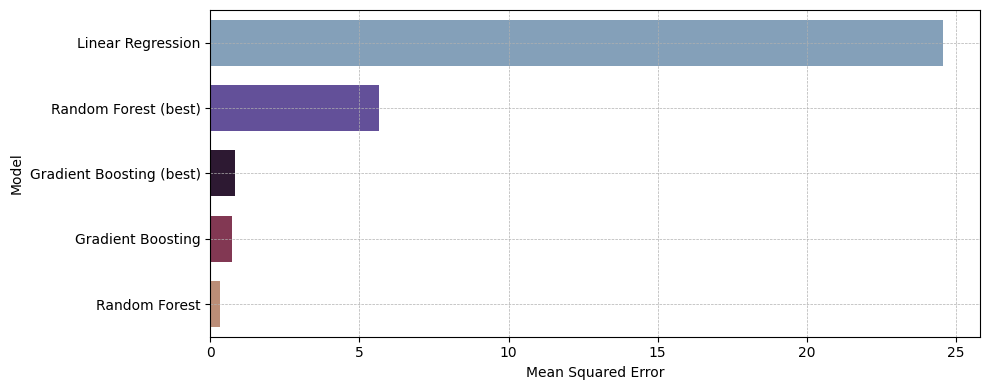

In [27]:
# Plot the results
sorted_results = results.sort_values('MSE', ascending=False)

plt.figure(figsize=(10, 4)) 
sns.barplot(y='Model', x='MSE', data=sorted_results, palette='twilight', hue='Model', dodge=False, width=0.7)
plt.xlabel('Mean Squared Error')  
plt.ylabel('Model')  
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()

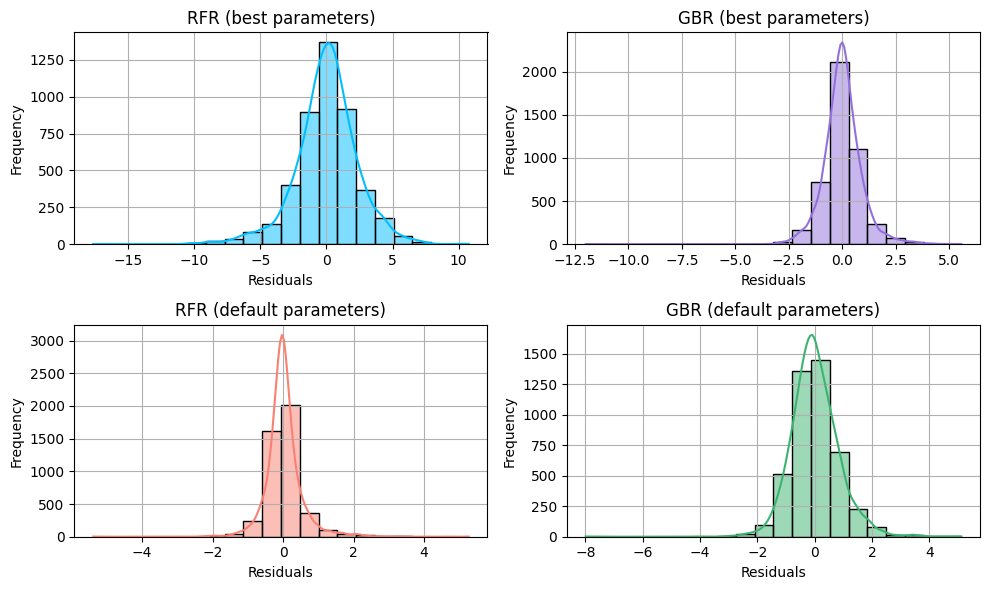

In [28]:
# exploring the residuals of the models
residuals_rf_best = y_test - y_pred_rf_best
residuals_gbr_best = y_test - y_pred_gb_best
residuals_rf_default = y_test - y_pred_rf
residuals_gbr_default = y_test - y_pred_gb

colors = ['deepskyblue', 'mediumpurple', 'salmon', 'mediumseagreen']

# Plotting
plt.figure(figsize=(10, 6))

## Plot for Random Forest tuned
plt.subplot(2, 2, 1) 
sns.histplot(residuals_rf_best, kde=True, color=colors[0], bins=20)
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.title('RFR (best parameters)')
plt.grid(True)

## Plot for Gradient Boosting tuned
plt.subplot(2, 2, 2) 
sns.histplot(residuals_gbr_best, kde=True, color=colors[1], bins=20)
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.title('GBR (best parameters)')
plt.grid(True)

## Plot for Random Forest (default)
plt.subplot(2, 2, 3) 
sns.histplot(residuals_rf_default, kde=True, color=colors[2], bins=20)
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.title('RFR (default parameters)')
plt.grid(True)

## Plot for Gradient Boosting (default)
plt.subplot(2, 2, 4)
sns.histplot(residuals_gbr_default, kde=True, color=colors[3], bins=20)
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.title('GBR (default parameters)')
plt.grid(True)

plt.tight_layout()
plt.show()

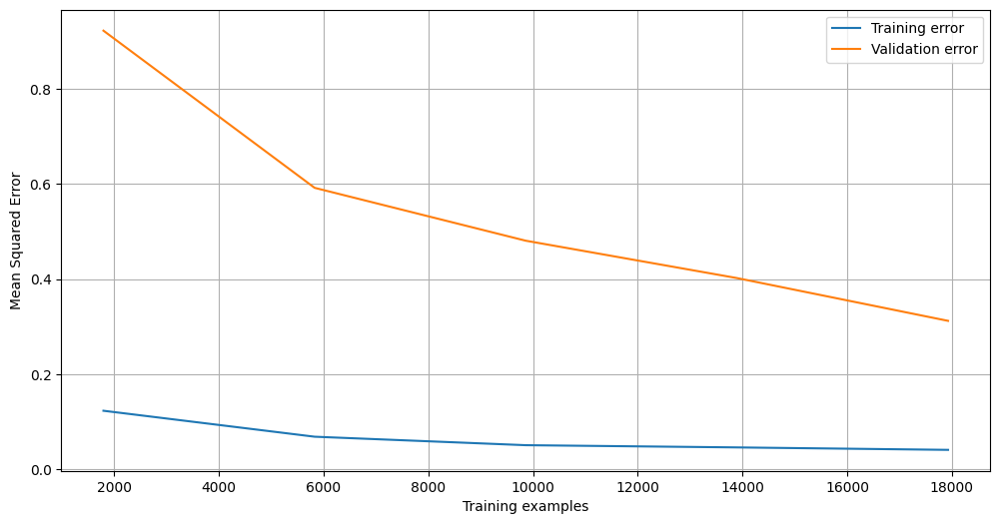

In [30]:
# plot the learning curve of the default random forest model as the best performing model
from sklearn.model_selection import learning_curve

train_sizes_rf_default, train_scores_rf_default, test_scores_rf_default = learning_curve(model_rf, X, y, cv=5, scoring='neg_mean_squared_error')

train_scores_mean_rf_default = -np.mean(train_scores_rf_default, axis=1)
test_scores_mean_rf_default = -np.mean(test_scores_rf_default, axis=1)

plt.figure(figsize=(12, 6))
plt.plot(train_sizes_rf_default, train_scores_mean_rf_default, label='Training error')
plt.plot(train_sizes_rf_default, test_scores_mean_rf_default, label='Validation error')

plt.xlabel('Training examples')
plt.ylabel('Mean Squared Error')

# plt.title('Learning curve for Random Forest (default)')
plt.legend()
plt.grid(True)
plt.show()

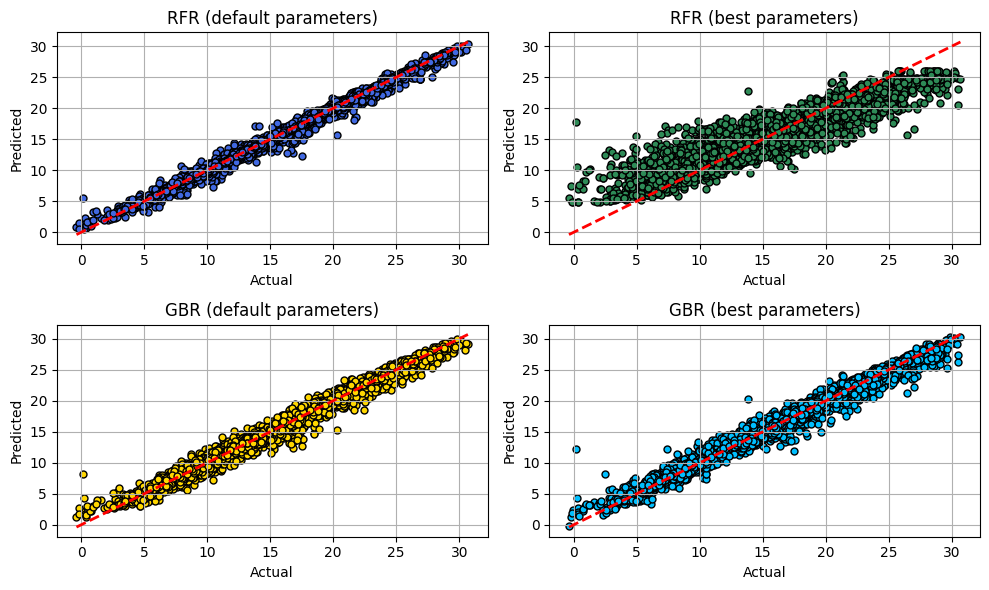

In [31]:
# plotting the actual vs predicted values for the best models
fig, axs = plt.subplots(2, 2, figsize=(10, 6))

## Random Forest (default)
axs[0, 0].scatter(y_test, y_pred_rf, color='royalblue', marker='o', s=25, edgecolors='black')
axs[0, 0].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)  # Add identity line
axs[0, 0].set_title('RFR (default parameters)')
axs[0, 0].set_xlabel('Actual')
axs[0, 0].set_ylabel('Predicted')
axs[0, 0].grid(True)

## Random Forest tuned
axs[0, 1].scatter(y_test, y_pred_rf_best, color='seagreen', marker='o', s=25, edgecolors='black')
axs[0, 1].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
axs[0, 1].set_title('RFR (best parameters)')
axs[0, 1].set_xlabel('Actual')
axs[0, 1].set_ylabel('Predicted')
axs[0, 1].grid(True)

## Gradient Boosting (default)
axs[1, 0].scatter(y_test, y_pred_gb, color='gold', marker='o', s=25, edgecolors='black')
axs[1, 0].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
axs[1, 0].set_title('GBR (default parameters)')
axs[1, 0].set_xlabel('Actual')
axs[1, 0].set_ylabel('Predicted')
axs[1, 0].grid(True)

## Gradient Boosting tuned
axs[1, 1].scatter(y_test, y_pred_gb_best, color='deepskyblue', marker='o', s=25, edgecolors='black')
axs[1, 1].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
axs[1, 1].set_title('GBR (best parameters)')
axs[1, 1].set_xlabel('Actual')
axs[1, 1].set_ylabel('Predicted')
axs[1, 1].grid(True)

plt.tight_layout()
plt.show()

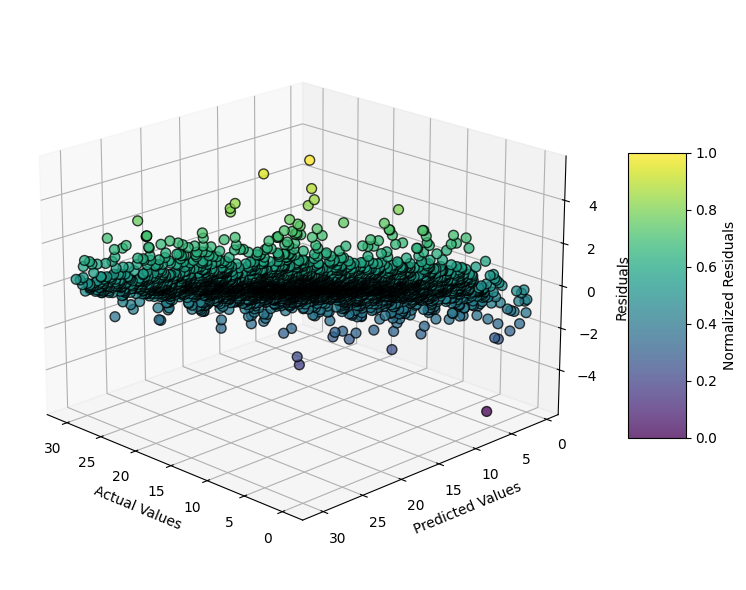

In [32]:
# 3d scatter plot with the actual vs predicted values for Random Forest default model
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(10, 6))
ax = fig.add_subplot(111, projection='3d')

# Data for three-dimensional scattered points: actual, predicted, and residuals
x = y_test
y = y_pred_rf
z = residuals_rf_default

# Normalize residuals for color mapping
residuals = z - z.min()
residuals = residuals / residuals.max()

# Scatter plot with color gradient
scatter = ax.scatter(x, y, z, c=residuals, cmap='viridis', marker='o', s=50, edgecolor='k', alpha=0.75)

# Color bar which maps values to colors.
cbar = fig.colorbar(scatter, ax=ax, shrink=0.5, aspect=5)
cbar.set_label('Normalized Residuals')

# Labels
ax.set_xlabel('Actual Values')
ax.set_ylabel('Predicted Values')
ax.set_zlabel('Residuals')

# Title and enhanced view angle
ax.view_init(elev=20, azim=135)  # Adjust viewing angle for better visualization

plt.tight_layout()
plt.show()



/var/folders/38/sb94bl795bv7klhlb8l7pj_00000gn/T/ipykernel_5517/1147714168.py:21: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_rf.set_yticklabels(formatted_feature_names_rf, fontsize=9)


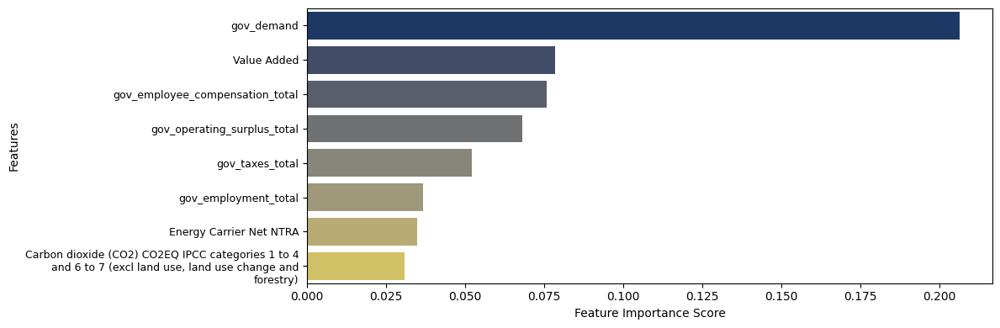

/var/folders/38/sb94bl795bv7klhlb8l7pj_00000gn/T/ipykernel_5517/1147714168.py:31: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_gbr.set_yticklabels(formatted_feature_names_gbr, fontsize=9)


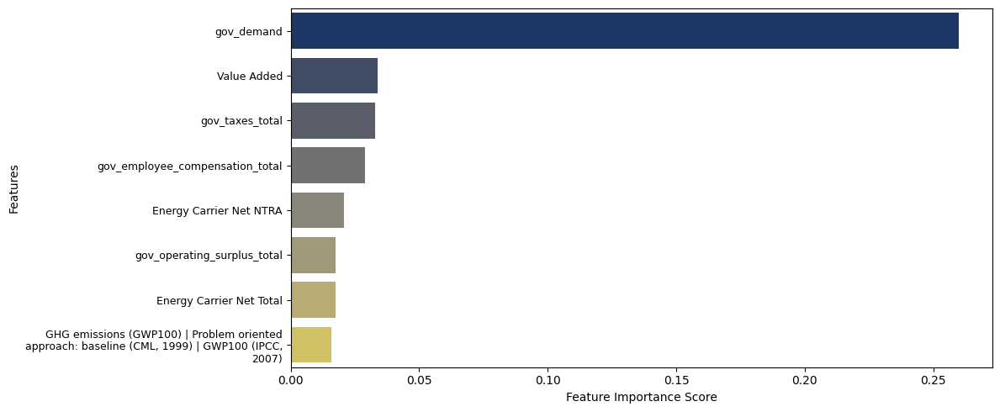

In [34]:
# feature importances for RF and GBR
# sort the feature importances for the models
features_rf_best = model_rf_best.feature_importances_
features_rf_best = pd.Series(features_rf_best, index=X.columns).nlargest(8)

features_gbr_best = model_gbr_best.feature_importances_
features_gbr_best = pd.Series(features_gbr_best, index=X.columns).nlargest(8)

# Random Forest (best)
# place the plots vertically

# Random Forest Feature Importance
fig_rf, ax_rf = plt.subplots(figsize=(12, 4))
sns.barplot(x=features_rf_best.values, y=features_rf_best.index, ax=ax_rf, palette='cividis', hue=features_rf_best.index)
ax_rf.set_xlabel('Feature Importance Score')
ax_rf.set_ylabel('Features')
formatted_feature_names_rf = ['\n'.join(textwrap.wrap(label, 50)) for label in features_rf_best.index]
ax_rf.set_yticklabels(formatted_feature_names_rf, fontsize=9)
plt.tight_layout()
plt.show()

# Gradient Boosting Feature Importance
fig_gbr, ax_gbr = plt.subplots(figsize=(12, 5))
sns.barplot(x=features_gbr_best.values, y=features_gbr_best.index, ax=ax_gbr, palette='cividis', hue=features_gbr_best.index)
ax_gbr.set_xlabel('Feature Importance Score')
ax_gbr.set_ylabel('Features')
formatted_feature_names_gbr = ['\n'.join(textwrap.wrap(label, 50)) for label in features_gbr_best.index]
ax_gbr.set_yticklabels(formatted_feature_names_gbr, fontsize=9)
plt.tight_layout()
plt.show()
